In [223]:
import numpy as np
import pandas as pd                                             #load the libraries
import os 
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
%matplotlib inline

In [224]:
dir_list=sorted(os.listdir("/home/ritam/ontology_hardness/dataset"))
                            # give the path of the directory where all files with computed, reasoning tasks time
                            # and memory consumption
                            # this 'dir_list' contains file names in this directory but some files are in the 
                            # format like '.~lock.file_58.csv#' which needs to be get rid off

print(dir_list)

['file_1.csv', 'file_10.csv', 'file_11.csv', 'file_12.csv', 'file_13.csv', 'file_14.csv', 'file_15.csv', 'file_16.csv', 'file_17.csv', 'file_18.csv', 'file_19.csv', 'file_2.csv', 'file_20.csv', 'file_21.csv', 'file_22.csv', 'file_23.csv', 'file_24.csv', 'file_25.csv', 'file_26.csv', 'file_27.csv', 'file_28.csv', 'file_29.csv', 'file_3.csv', 'file_30.csv', 'file_31.csv', 'file_32.csv', 'file_33.csv', 'file_34.csv', 'file_35.csv', 'file_36.csv', 'file_37.csv', 'file_38.csv', 'file_39.csv', 'file_4.csv', 'file_40.csv', 'file_41.csv', 'file_42.csv', 'file_43.csv', 'file_44.csv', 'file_45.csv', 'file_46.csv', 'file_47.csv', 'file_48.csv', 'file_49.csv', 'file_5.csv', 'file_50.csv', 'file_51.csv', 'file_52.csv', 'file_53.csv', 'file_54.csv', 'file_55.csv', 'file_56.csv', 'file_57.csv', 'file_58.csv', 'file_59.csv', 'file_6.csv', 'file_7.csv', 'file_8.csv', 'file_9.csv']


In [225]:
l=0
final_df=pd.DataFrame(columns=['size_kb', 'consistency_time_milsecs', 'consistency_size_kb',
       'realisation_time_milsecs', 'realisation_size_kb',
       'classification_time_milsecs', 'classification_size_kb'])

full_dataframe = pd.DataFrame(columns=['file','size_kb', 'consistency_time_milsecs', 'consistency_size_kb',
       'realisation_time_milsecs', 'realisation_size_kb',
       'classification_time_milsecs', 'classification_size_kb'])


for i in range(len(dir_list)):
    if dir_list[i][0]=='f':  # considering files int the correct format
        x=dir_list[i]
        path="/home/ritam/ontology_hardness/dataset/"+x
        z=pd.read_csv(path)
        z_drop=z.drop(['file'],axis=1)
        final_df=pd.concat([final_df,z_drop])
        
        full_dataframe=pd.concat([full_dataframe,z])
        
print("total consistent ontologies with reasoning tasks , time and memory consumption")
print(full_dataframe.shape) # contains all the ontologies (only consistent) with file name, size and 6 
                            # feature values
print(final_df.shape) # same as full_dataframe but donot contains the file name , rest are same
full_dataframe
#final_df
# total consistent + inconsistent  ontologies = 16637
# total consistent ontologies = 16434

total consistent ontologies with reasoning tasks , time and memory consumption
(16434, 8)
(16434, 7)


,file,size_kb,consistency_time_milsecs,consistency_size_kb,realisation_time_milsecs,realisation_size_kb,classification_time_milsecs,classification_size_kb
0,0000212a-38bc-4129-898f-70d1e9114863_Lion_Bar....,95,27,16240,28,17252,27,16976
1,00006.owl_functional.owl,425,51,17836,75,22824,61,22320
2,00008.owl_functional.owl,130,43,19856,43,21168,45,20884
3,00011.owl_functional.owl,77,26,15720,33,17916,33,17992
4,00012.owl_functional.owl,99,30,16024,34,17688,32,17696
...,...,...,...,...,...,...,...,...
290,444a3020-7ef8-4893-aa7f-d555311a37bb_ysfunctio...,151,24,15596,30,17100,31,16732
291,444cb459-2fa5-4e39-88a4-3f48286bf7ff_sioc.rdf_...,31,23,15288,25,15628,21,15376
292,44554ad1-5e09-4f62-b55e-1a566d4310a3_Sardine.r...,95,30,16148,31,17088,29,16888
293,445e2e48-85ed-44f6-a0b9-8b43b9d81c3e_Khoa.rdf_...,95,30,16236,31,17296,28,16952


In [226]:
#use of minmax scalar to scale the dataframe 'final_df' , so that every feature values comes in 0 to 1
#this makes every feature to be in same scale
final_np=np.array(final_df)
scaler = MinMaxScaler()
scaler.fit(final_df)
final_df_scaled=scaler.transform(final_df)
#print(final_df_scaled)
df_MinMax = pd.DataFrame(data=final_df_scaled, columns=['size_kb', 'consistency_time_milsecs', 'consistency_size_kb',
       'realisation_time_milsecs', 'realisation_size_kb',
       'classification_time_milsecs', 'classification_size_kb'])
df_MinMax  # this dataframe contains the scaled version of 'final_df'

,size_kb,consistency_time_milsecs,consistency_size_kb,realisation_time_milsecs,realisation_size_kb,classification_time_milsecs,classification_size_kb
0,0.000049,6.481351e-07,0.000013,5.092071e-07,0.000017,5.091955e-07,0.000015
1,0.000248,1.759224e-06,0.000026,2.684910e-06,0.000060,2.083073e-06,0.000057
2,0.000070,1.388861e-06,0.000041,1.203580e-06,0.000047,1.342425e-06,0.000046
3,0.000038,6.018397e-07,0.000009,7.406649e-07,0.000022,7.869386e-07,0.000023
4,0.000051,7.870212e-07,0.000012,7.869564e-07,0.000020,7.406481e-07,0.000021
...,...,...,...,...,...,...,...
16429,0.000083,5.092490e-07,0.000008,6.017902e-07,0.000016,6.943576e-07,0.000013
16430,0.000010,4.629536e-07,0.000006,3.703324e-07,0.000004,2.314525e-07,0.000003
16431,0.000049,7.870212e-07,0.000013,6.480818e-07,0.000016,6.017765e-07,0.000015
16432,0.000049,7.870212e-07,0.000013,6.480818e-07,0.000017,5.554860e-07,0.000015


In [227]:
# We have taken a subset of 16433 ontologies to work with. This is an option provided to take any subset 
# to work with, further downwards

#'partial_dataframe' contains the subset of 'full_dataframe'. This 'partial_dataframe' is used in further 
# processing 

partial_dataframe=full_dataframe.iloc[0:16433,:]  # 'partial_dataframe' contains non scaled values
print(partial_dataframe.shape)

t=df_MinMax.head(16433)  # dataframe 't' contains scaled values and a subset of 'df_MinMax'
print(t.shape)

# this subset value should be same for both cases

(16433, 8)
(16433, 7)


KMeans(n_clusters=3, random_state=0)
[0 0 0 ... 0 0 0]
<class 'pandas.core.frame.DataFrame'>


<ipython-input-228-331f3501af5d>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  t['cluster']=y_predicted


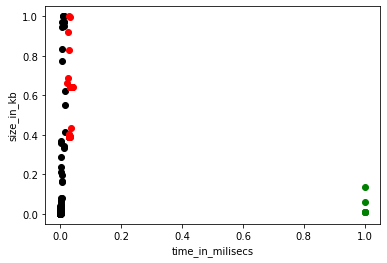

In [228]:
# K-means clustering based on time into easy, medium and hard category , we get 3 categories
# this is the first clustering.
            
    
km = KMeans(n_clusters=3,random_state=0)
print(km)

y_predicted=km.fit_predict(t[["consistency_time_milsecs"]]) # first clustered on 'consistency_time_milsecs'
print(y_predicted) # contains the predicted classes
print(type(t))
t['cluster']=y_predicted

t1=t[t['cluster']==0] # contains the class 0
t2=t[t['cluster']==1] # contains the class 1
t3=t[t['cluster']==2] # contains the class 2 

plt.scatter(t1["consistency_time_milsecs"],t1["consistency_size_kb"],c='black') # class 0 is labelled as black
plt.scatter(t2["consistency_time_milsecs"],t2["consistency_size_kb"],c='green') # class 1 is labelled as green
plt.scatter(t3["consistency_time_milsecs"],t3["consistency_size_kb"],c='red')   # class 2 is labelled as red
plt.xlabel('time_in_milisecs')
plt.ylabel('size_in_kb')
plt.show()


In [229]:
label_col=[]
for i in range((y_predicted.shape[0])):
    if y_predicted[i]==0:
        label_col.append('easy') # black label
    elif y_predicted[i]==1:
        label_col.append('hard') # green label
    else:
        label_col.append('medium') # red label
        
partial_dataframe['label_time']=label_col #partial dataframe has label for each of the ontology


<ipython-input-229-bd33910caf59>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  partial_dataframe['label_time']=label_col #partial dataframe has label for each of the ontology


In [230]:
partial_dataframe # contains only time and memeory

,file,size_kb,consistency_time_milsecs,consistency_size_kb,realisation_time_milsecs,realisation_size_kb,classification_time_milsecs,classification_size_kb,label_time
0,0000212a-38bc-4129-898f-70d1e9114863_Lion_Bar....,95,27,16240,28,17252,27,16976,easy
1,00006.owl_functional.owl,425,51,17836,75,22824,61,22320,easy
2,00008.owl_functional.owl,130,43,19856,43,21168,45,20884,easy
3,00011.owl_functional.owl,77,26,15720,33,17916,33,17992,easy
4,00012.owl_functional.owl,99,30,16024,34,17688,32,17696,easy
...,...,...,...,...,...,...,...,...,...
289,44487e0b-5833-4d9c-8488-d3f9694b0167_ppi_chees...,95,29,16276,30,17152,30,16936,easy
290,444a3020-7ef8-4893-aa7f-d555311a37bb_ysfunctio...,151,24,15596,30,17100,31,16732,easy
291,444cb459-2fa5-4e39-88a4-3f48286bf7ff_sioc.rdf_...,31,23,15288,25,15628,21,15376,easy
292,44554ad1-5e09-4f62-b55e-1a566d4310a3_Sardine.r...,95,30,16148,31,17088,29,16888,easy


In [231]:
# collect the easy ones based on time from partial dataframe 

df_easy=partial_dataframe[partial_dataframe['label_time']=='easy']
df_easy_drop=df_easy # contains based on time and also non scaled values
df_easy_drop

,file,size_kb,consistency_time_milsecs,consistency_size_kb,realisation_time_milsecs,realisation_size_kb,classification_time_milsecs,classification_size_kb,label_time
0,0000212a-38bc-4129-898f-70d1e9114863_Lion_Bar....,95,27,16240,28,17252,27,16976,easy
1,00006.owl_functional.owl,425,51,17836,75,22824,61,22320,easy
2,00008.owl_functional.owl,130,43,19856,43,21168,45,20884,easy
3,00011.owl_functional.owl,77,26,15720,33,17916,33,17992,easy
4,00012.owl_functional.owl,99,30,16024,34,17688,32,17696,easy
...,...,...,...,...,...,...,...,...,...
289,44487e0b-5833-4d9c-8488-d3f9694b0167_ppi_chees...,95,29,16276,30,17152,30,16936,easy
290,444a3020-7ef8-4893-aa7f-d555311a37bb_ysfunctio...,151,24,15596,30,17100,31,16732,easy
291,444cb459-2fa5-4e39-88a4-3f48286bf7ff_sioc.rdf_...,31,23,15288,25,15628,21,15376,easy
292,44554ad1-5e09-4f62-b55e-1a566d4310a3_Sardine.r...,95,30,16148,31,17088,29,16888,easy


In [232]:
print(df_easy['consistency_time_milsecs'].max(),df_easy['consistency_time_milsecs'].min())
print(df_easy.shape) # shape of the easy time category dataframe, no of easy time ontologies = 16371

308466 13
(16371, 9)


(16371, 7)


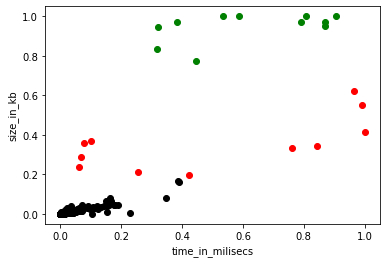

In [233]:
# now each of the 3 category will be clustered on memory
# hence , now easy time ontologies are clustered on memory - 'consistency_size_kb'

t=df_easy_drop.drop(['file','label_time'],axis=1) # contains non scaled values

#again MinMax scalar is used for scaling , since dataframe 't' contains non scaled values 
scaler = MinMaxScaler()
scaler.fit(t)
t_df_scaled=scaler.transform(t)

t_MinMax = pd.DataFrame(data=t_df_scaled, columns=['size_kb', 'consistency_time_milsecs', 'consistency_size_kb',
       'realisation_time_milsecs', 'realisation_size_kb',
       'classification_time_milsecs', 'classification_size_kb'])
t=t_MinMax

print(t.shape)  

km_1 = KMeans(n_clusters=3,random_state=0)
y_predicted_1=km_1.fit_predict(t[["consistency_size_kb"]]) # now clustered on 'consistency_size_kb' to get 3 more
                                # categories under easy time ontology, they are easy time easy memory, easy time 
                                # medium memory and easy time hard memory

t['cluster']=y_predicted_1 # contians the predicted class
t1=t[t['cluster']==0] # contains class 0
t2=t[t['cluster']==1] # contains class 1
t3=t[t['cluster']==2] # contains class 2

plt.scatter(t1["consistency_time_milsecs"],t1["consistency_size_kb"],c='black') #class 0 is labelled as black
plt.scatter(t2["consistency_time_milsecs"],t2["consistency_size_kb"],c='green') # class 1 is labelled as green
plt.scatter(t3["consistency_time_milsecs"],t3["consistency_size_kb"],c='red') # class 2 is labelled as red
plt.xlabel('time_in_milisecs')
plt.ylabel('size_in_kb')
plt.show()


In [234]:
label_col=[]
for i in range((y_predicted_1.shape[0])):
    if y_predicted_1[i]==0:
        label_col.append('easy') #black label
    elif y_predicted_1[i]==1:
        label_col.append('hard') #green label
    else:
        label_col.append('medium') # red label
        
df_easy_drop['label_mem']=label_col
df_easy_time_mem=df_easy_drop # contains easy time ontologies clustered on memory and labelled too, also 
                                # contians only 6 reasoning feature values
df_easy_time_mem

<ipython-input-234-1212524bd696>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_easy_drop['label_mem']=label_col


,file,size_kb,consistency_time_milsecs,consistency_size_kb,realisation_time_milsecs,realisation_size_kb,classification_time_milsecs,classification_size_kb,label_time,label_mem
0,0000212a-38bc-4129-898f-70d1e9114863_Lion_Bar....,95,27,16240,28,17252,27,16976,easy,easy
1,00006.owl_functional.owl,425,51,17836,75,22824,61,22320,easy,easy
2,00008.owl_functional.owl,130,43,19856,43,21168,45,20884,easy,easy
3,00011.owl_functional.owl,77,26,15720,33,17916,33,17992,easy,easy
4,00012.owl_functional.owl,99,30,16024,34,17688,32,17696,easy,easy
...,...,...,...,...,...,...,...,...,...,...
289,44487e0b-5833-4d9c-8488-d3f9694b0167_ppi_chees...,95,29,16276,30,17152,30,16936,easy,easy
290,444a3020-7ef8-4893-aa7f-d555311a37bb_ysfunctio...,151,24,15596,30,17100,31,16732,easy,easy
291,444cb459-2fa5-4e39-88a4-3f48286bf7ff_sioc.rdf_...,31,23,15288,25,15628,21,15376,easy,easy
292,44554ad1-5e09-4f62-b55e-1a566d4310a3_Sardine.r...,95,30,16148,31,17088,29,16888,easy,easy


In [235]:
# this section is for combining 91 feature with 6 reasoning features
# 'final_new_more.csv' this inlcudes all ontologies(consistent and inconsitent) with 91 metric values 
# and 6 reasoning feature values. But we are interested for consistent ontologies. Hence we extract all the 91 
# values corresponding to each of the ontology which are in easy time category and then clustered on memory

total_df= pd.read_csv('final_new_more.csv') # for features collection 
print("size of final_new_more= ",total_df.shape)


df_easy_time_mem_feature=[]
for i in range(df_easy_time_mem.shape[0]):
    ont=df_easy_time_mem.iloc[i,:]['file']
    lab=df_easy_time_mem.iloc[i,:]['label_mem']
    o=(np.array(total_df[total_df['file']==ont]))
    if o.shape[0]!=0:
    
        u=list(np.array(total_df[total_df['file']==ont])[0])
        u.append(str(lab))
        df_easy_time_mem_feature.append(u)

    
total_df_cols=list(total_df.columns)
total_df_cols.append('label_mem')
df_easy_time_mem_feature_df=pd.DataFrame(data=df_easy_time_mem_feature,columns=total_df_cols)
df_easy_time_mem_feature_df  # total easy time consistent ontologies clustered on memory and labelled with easy,
                             # medium , hard memory . Also contains 91 features + 6 resoning task values

#total easy_time consistent ontologies clustered on memory with all features = 16370

size of final_new_more=  (16433, 100)


,file,size_kb,consistency_time_milsecs,consistency_size_kb,realisation_time_milsecs,realisation_size_kb,classification_time_milsecs,classification_size_kb,SOV,ENR,...,EQVP,DISP,INV,DOMN,RANG,CHN,CHNP,ELPROP,CAL_TIME,label_mem
0,0000212a-38bc-4129-898f-70d1e9114863_Lion_Bar....,95,27,16240,28,17252,27,16976,200,2.625000,...,4,0,6,96,94,0,0.0,0.931624,280,easy
1,00006.owl_functional.owl,425,51,17836,75,22824,61,22320,1148,1.261695,...,0,0,10,0,0,0,0.0,0.729730,110,easy
2,00008.owl_functional.owl,130,43,19856,43,21168,45,20884,238,2.144695,...,0,0,0,70,70,0,0.0,1.000000,40,easy
3,00011.owl_functional.owl,77,26,15720,33,17916,33,17992,118,2.366492,...,0,0,0,70,70,0,0.0,1.000000,150,easy
4,00012.owl_functional.owl,99,30,16024,34,17688,32,17696,173,2.015936,...,0,0,1,96,98,0,0.0,0.988506,60,easy
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16365,44487e0b-5833-4d9c-8488-d3f9694b0167_ppi_chees...,95,29,16276,30,17152,30,16936,201,2.613333,...,4,0,6,96,94,0,0.0,0.931624,30,easy
16366,444a3020-7ef8-4893-aa7f-d555311a37bb_ysfunctio...,151,24,15596,30,17100,31,16732,343,0.997085,...,0,0,0,0,0,0,0.0,0.000000,40,easy
16367,444cb459-2fa5-4e39-88a4-3f48286bf7ff_sioc.rdf_...,31,23,15288,25,15628,21,15376,108,1.759259,...,0,0,21,57,58,0,0.0,0.852349,70,easy
16368,44554ad1-5e09-4f62-b55e-1a566d4310a3_Sardine.r...,95,30,16148,31,17088,29,16888,201,2.613333,...,4,0,6,96,94,0,0.0,0.931624,40,easy


In [236]:
# easy time with easy mem, medium mem and hard mem
# this section shows the mean , min ,max of each of the feature category wise for easy time ontologies category

l=df_easy_time_mem_feature_df.drop('file',axis=1)
x=l.groupby(l['label_mem']).agg(['min', 'max','mean'])
#x.to_csv('easy_time_feature_details.csv',index_label=True)
x_easy=x
x_easy

size_kb                        consistency_time_milsecs          \
              min     max           mean                      min     max   
label_mem                                                                   
easy           14  640425    2903.799425                       13  120335   
hard        11829  260201   66778.818182                    97796  279132   
medium        162  543808  174624.181818                    18699  308466   

                         consistency_size_kb                           \
                    mean                 min        max          mean   
label_mem                                                               
easy          377.048202               14532   21437240  5.808478e+04   
hard       191529.545455            99630024  128838488  1.220439e+08   
medium     155552.272727            25593828   80439780  4.601777e+07   

          realisation_time_milsecs  ...        CHN CHNP                      \
                               min  ...       mean  min       max      mean   
label_mem                           ...                                       
easy                            17  ...   3.610717  0.0  1.732673  0.044894   
hard                        112002  ...  10.181818  0.0  0.229885  0.070041   
medium                        7085  ...   3.636364  0.0  0.081633  0.036165   

             ELPROP                     CAL_TIME                          
                min       max      mean      min      max           mean  
label_mem                                                                 
easy       0.000000  1.000000  0.823469        0  7193760    3414.851358  
hard       0.838828  0.948187  0.864427     1520  5520890  552780.909091  
medium     0.000000  0.992188  0.569143      450   929310  253535.454545  

[3 rows x 297 columns]

99
consistency_size_kb 0.21672
consistency_time_milsecs 0.11713
classification_size_kb 0.06703
realisation_size_kb 0.05559
classification_time_milsecs 0.0295
CAR 0.02706
realisation_time_milsecs 0.02687
CYC 0.02612
aCOD 0.02539
SOV 0.02165
CARP 0.01613
aCID 0.01503
CAL_TIME 0.01369
IND 0.01275
size_kb 0.01234
EF 0.01228
ELCLSPRT 0.01165
IHR 0.0113
mNOP 0.01128
tNOC 0.00986
aNOC 0.00947
CONJP 0.00897
IIR 0.00793
EOG 0.00767
ENR 0.0076
mCID 0.00754
RANG 0.00683
MNCARP 0.00678
tNOP 0.00674
ELAXPRT 0.0067
REFLE 0.0064
HGCI 0.00635
DISJ 0.00633
mNOC 0.00626
SELFP 0.00621
ITR 0.00605
MXCARP 0.00583
DTPP 0.00577
ESUB 0.00555
EFP 0.00548
SYMP 0.00536
SYM 0.00524
DISJP 0.00495
aNOP 0.00486
SELF 0.00474
tCID 0.00471
OBPP 0.00469
MXCAR 0.00462
tCOD 0.00443
MNCAR 0.00432
RCH 0.00418
ENUM 0.00416
DTP 0.00384
mCOD 0.00382
DOMN 0.0036
SUBECHN 0.00351
TIP 0.00325
SUBP 0.00312
DSUB 0.0031
IFUNP 0.00258
CHN 0.00257
UF 0.00238
RHLC 0.00232
DSUPECHN 0.00228
DSUBCCHN 0.00226
CONJ 0.00222
EQVP 0.002
SUPECHN

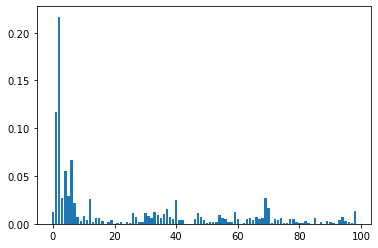

In [237]:
# this section is for finding feature importance of each feature in easy time category 
#this is done using feature importance metric of RandomForest Classifier

from sklearn import preprocessing
from sklearn.ensemble import RandomForestClassifier
import operator

le = preprocessing.LabelEncoder()
p=df_easy_time_mem_feature_df
le.fit(p['label_mem'])
g=le.transform(p['label_mem']) 
x_train_np=p.drop(['file','label_mem'],axis=1)
y_train_np=np.array(g)


model = RandomForestClassifier(n_estimators = 100, random_state = 2)
model.feature_names = list(x_train_np.columns.values)
model.fit(x_train_np, y_train_np)
ft=list(model.feature_names)
importance = model.feature_importances_
print(model.n_features_)

dict1_imp={} #contains each feature with its importance value
c=0
for i,v in enumerate(importance):
    #print('Feature: %0d, Score: %.5f' % (i,v))
    val= round(v,5)
    dict1_imp[ft[c]]=val
    c+=1
dict1_imp_sort=dict(sorted(dict1_imp.items(), key=operator.itemgetter(1),reverse=True)) 
                #maintains the sorted  version of the 'dict1_imp'
    
for key,val in dict1_imp_sort.items():
    print(key,val)
plt.bar([x for x in range(len(importance))], importance)
plt.show()

easy_feature_sort_dic=dict1_imp_sort # this contains the sorted importance of features for easy time category


top_n_1=(list(easy_feature_sort_dic.keys())[:50]) # I have used top 50 features in this category, and hence 
                                                # ranges are calculated for top 50 features for this category

In [238]:
# this section is for finding the features with zero importance and then exluding them for this category
d= dict(x_easy)
easy_zero_features =[]
for key, value in dict1_imp_sort.items():
    if value == 0.0:
        if ( sum(list(d[(key, 'mean')]))/3 )== 0.0 :
            #print(key,list(d[(key, 'mean')])) # these zero importance feature also has their mean values for easy,
                                              # medium , hard category as zero after final clustering on memory. 
                                              # This condition is also considered here for claiming them as useless
                                              # feature
            easy_zero_features.append(key)
print(easy_zero_features) # contains the feature with zero importance

print(top_n_1) # top n features 

['aDIT', 'mDIT', 'tDIT', 'ASYMP', 'REFLEP', 'IRREFP']
['consistency_size_kb', 'consistency_time_milsecs', 'classification_size_kb', 'realisation_size_kb', 'classification_time_milsecs', 'CAR', 'realisation_time_milsecs', 'CYC', 'aCOD', 'SOV', 'CARP', 'aCID', 'CAL_TIME', 'IND', 'size_kb', 'EF', 'ELCLSPRT', 'IHR', 'mNOP', 'tNOC', 'aNOC', 'CONJP', 'IIR', 'EOG', 'ENR', 'mCID', 'RANG', 'MNCARP', 'tNOP', 'ELAXPRT', 'REFLE', 'HGCI', 'DISJ', 'mNOC', 'SELFP', 'ITR', 'MXCARP', 'DTPP', 'ESUB', 'EFP', 'SYMP', 'SYM', 'DISJP', 'aNOP', 'SELF', 'tCID', 'OBPP', 'MXCAR', 'tCOD', 'MNCAR']


In [239]:
#proccessing easy time with easy memory with 108 features

cols_list=list(df_easy_time_mem_feature_df.columns)
print(cols_list,len(cols_list))

['file', 'size_kb', 'consistency_time_milsecs', 'consistency_size_kb', 'realisation_time_milsecs', 'realisation_size_kb', 'classification_time_milsecs', 'classification_size_kb', 'SOV', 'ENR', 'TIP', 'EOG', 'RCH', 'CYC', 'GCI', 'HGCI', 'ESUB', 'DSUB', 'CSUB', 'SUPECHN', 'SUBECHN', 'SUBCCHN', 'SUPDCHN', 'DSUPECHN', 'DSUBECHN', 'DSUBCCHN', 'DSUPDCHN', 'ELCLSPRT', 'ELAXPRT', 'HLC', 'RHLC', 'IHR', 'IIR', 'ITR', 'IND', 'aNOC', 'mNOC', 'tNOC', 'aCID', 'mCID', 'tCID', 'aCOD', 'mCOD', 'tCOD', 'aDIT', 'mDIT', 'tDIT', 'aNOP', 'mNOP', 'tNOP', 'ENUM', 'ENUMP', 'NEG', 'NEGP', 'CONJ', 'CONJP', 'DISJ', 'DISJP', 'UF', 'UFP', 'EF', 'EFP', 'VALUE', 'VALUEP', 'SELF', 'SELFP', 'MNCAR', 'MNCARP', 'MXCAR', 'MXCARP', 'CAR', 'CARP', 'OBP', 'OBPP', 'DTP', 'DTPP', 'FUN', 'FUNP', 'SYM', 'SYMP', 'TRN', 'TRNP', 'IFUN', 'IFUNP', 'ASYM', 'ASYMP', 'REFLE', 'REFLEP', 'IRREF', 'IRREFP', 'SUBP', 'EQVP', 'DISP', 'INV', 'DOMN', 'RANG', 'CHN', 'CHNP', 'ELPROP', 'CAL_TIME', 'label_mem'] 101


(16370, 101)
(16348, 101)
feature name=  size_kb
hii
max value =  640425 min value =  14
mean=  2903.799425006117 standard deviation=  20311.60204716735
left range=  32 right range=  17670
data covered within this range=  93.93 %
percent left and right=  87.67 12.33
data covered within 1 standard deviation=  97.47 %
data covered within 2 standard deviation=  98.95 %
data covered within 3 standard deviation=  99.49 %



normality test :----

kurtosis value=  517.0468810064468
skewness value=  20.643184809340422


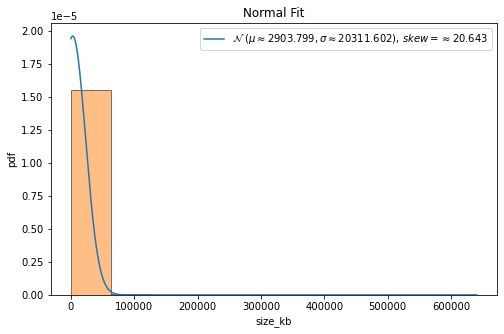


QQ plot 



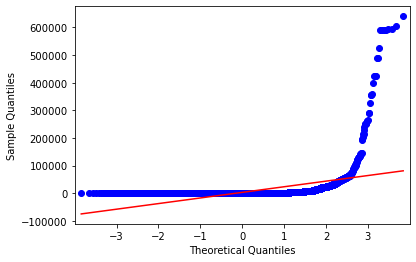


 Shapiro-Wilk Test 
 
Statistics=36174.502, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  consistency_time_milsecs
hii
max value =  120335 min value =  13
mean=  377.04820161487646 standard deviation=  2610.2979712157344
left range=  17 right range=  1874
data covered within this range=  95.62 %
percent left and right=  90.14 9.86
data covered within 1 standard deviation=  97.61 %
data covered within 2 standard deviation=  98.49 %
data covered within 3 standard deviation=  99.14 %



normality test :----

kurtosis value=  849.8711713354016
skewness value=  24.238961725422964


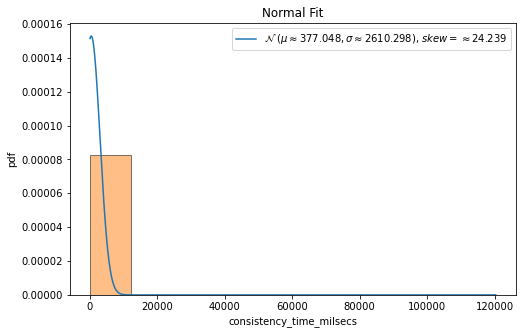


QQ plot 



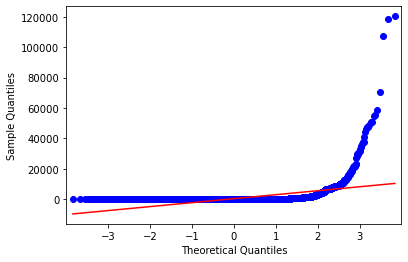


 Shapiro-Wilk Test 
 
Statistics=38913.073, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  consistency_size_kb
hii
max value =  21437240 min value =  14532
mean=  58084.780278933205 standard deviation=  360850.72799031006
left range=  14772 right range=  260084
data covered within this range=  93.85 %
percent left and right=  89.52 10.48
data covered within 1 standard deviation=  98.13 %
data covered within 2 standard deviation=  99.22 %
data covered within 3 standard deviation=  99.44 %



normality test :----

kurtosis value=  1577.002604150781
skewness value=  32.76554924935056


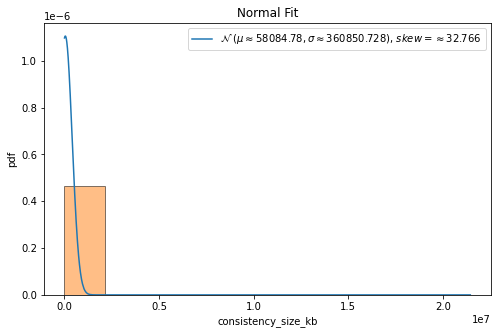


QQ plot 



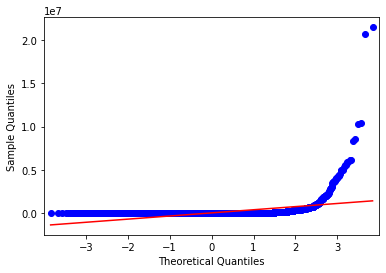


 Shapiro-Wilk Test 
 
Statistics=43981.558, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  realisation_time_milsecs
hii
max value =  21602229 min value =  17
mean=  22472.082089552237 standard deviation=  634522.4821788783
left range=  21 right range=  4571
data covered within this range=  95.1 %
percent left and right=  99.0 1.0
data covered within 1 standard deviation=  99.82 %
data covered within 2 standard deviation=  99.83 %
data covered within 3 standard deviation=  99.86 %



normality test :----

kurtosis value=  1081.1646788255186
skewness value=  32.48715555772344


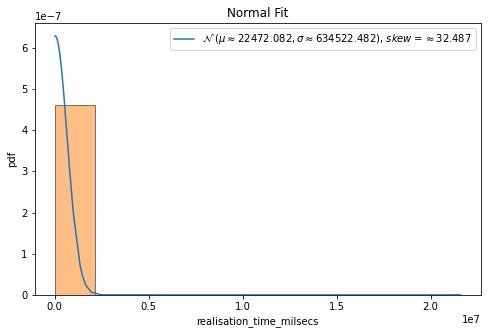


QQ plot 



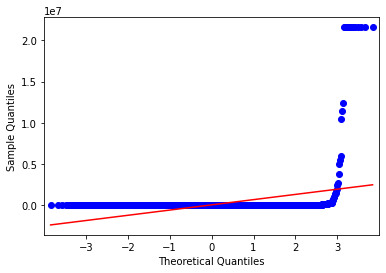


 Shapiro-Wilk Test 
 
Statistics=43596.077, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  realisation_size_kb
hii
max value =  128349296 min value =  15064
mean=  310586.37582578906 standard deviation=  4099262.9099371172
left range=  15536 right range=  585300
data covered within this range=  93.82 %
percent left and right=  94.98 5.02
data covered within 1 standard deviation=  99.31 %
data covered within 2 standard deviation=  99.55 %
data covered within 3 standard deviation=  99.63 %



normality test :----

kurtosis value=  541.2929375329338
skewness value=  21.970528218905095


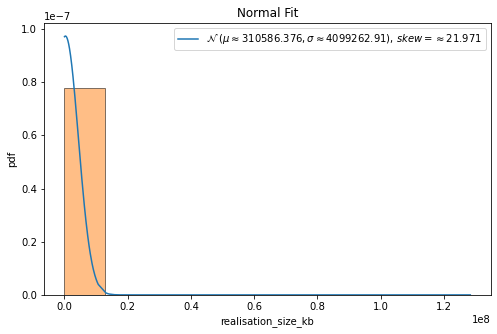


QQ plot 



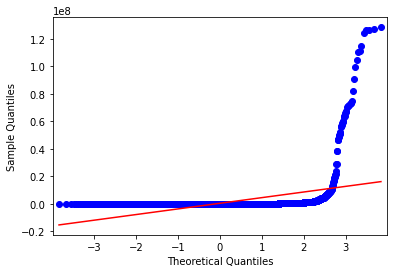


 Shapiro-Wilk Test 
 
Statistics=37110.283, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  classification_time_milsecs
hii
max value =  21602719 min value =  16
mean=  18645.520736481525 standard deviation=  566091.4405767698
left range=  21 right range=  4328
data covered within this range=  94.24 %
percent left and right=  98.97 1.03
data covered within 1 standard deviation=  99.83 %
data covered within 2 standard deviation=  99.85 %
data covered within 3 standard deviation=  99.87 %



normality test :----

kurtosis value=  1322.4974331248975
skewness value=  35.80961586607927


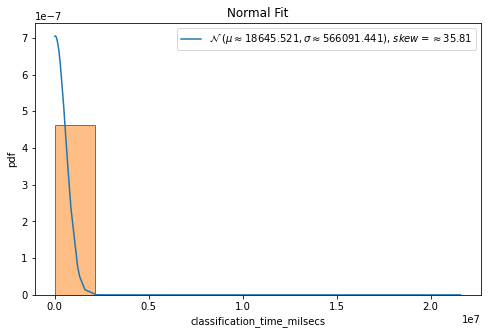


QQ plot 



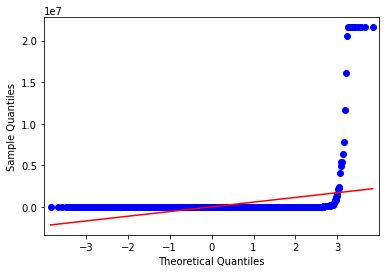


 Shapiro-Wilk Test 
 
Statistics=45301.049, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  classification_size_kb
hii
max value =  126538960 min value =  15000
mean=  281251.769268412 standard deviation=  3700283.5664338535
left range=  15440 right range=  556992
data covered within this range=  93.77 %
percent left and right=  94.79 5.21
data covered within 1 standard deviation=  99.3 %
data covered within 2 standard deviation=  99.53 %
data covered within 3 standard deviation=  99.65 %



normality test :----

kurtosis value=  585.4783307767219
skewness value=  22.750910112521307


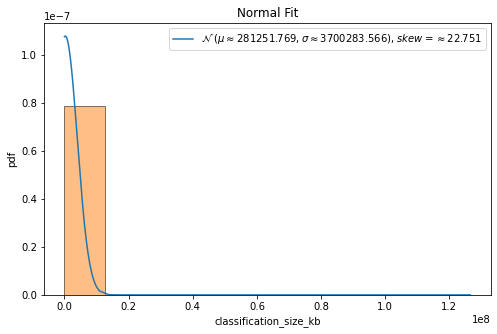


QQ plot 



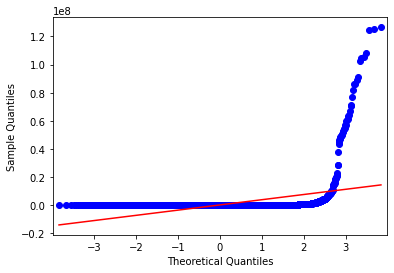


 Shapiro-Wilk Test 
 
Statistics=37684.649, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  SOV
hii
max value =  981149 min value =  20
mean=  4777.672069977979 standard deviation=  26860.545988865826
left range=  82 right range=  31438
data covered within this range=  93.85 %
percent left and right=  81.91 18.09
data covered within 1 standard deviation=  96.92 %
data covered within 2 standard deviation=  98.45 %
data covered within 3 standard deviation=  99.11 %



normality test :----

kurtosis value=  627.0879174381487
skewness value=  21.57006534891344


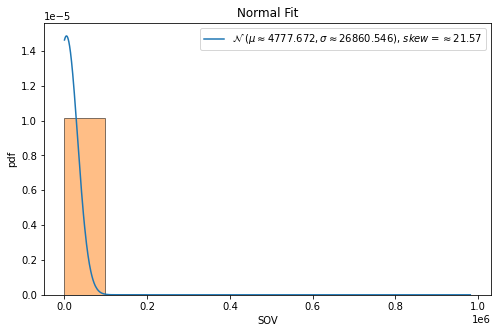


QQ plot 



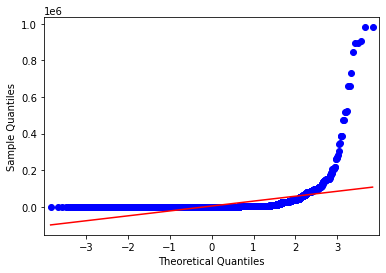


 Shapiro-Wilk Test 
 
Statistics=36966.724, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  ENR
hii
max value =  2977.4855204368687 min value =  0.7920168067226891
mean=  2.5997511301585012 standard deviation=  40.491895550952954
left range=  1.011142061281337 right range=  3.2037414783402216
data covered within this range=  93.77 %
percent left and right=  77.7 22.3
data covered within 1 standard deviation=  99.82 %
data covered within 2 standard deviation=  99.91 %
data covered within 3 standard deviation=  99.94 %



normality test :----

kurtosis value=  5326.992713138606
skewness value=  72.6356856680069


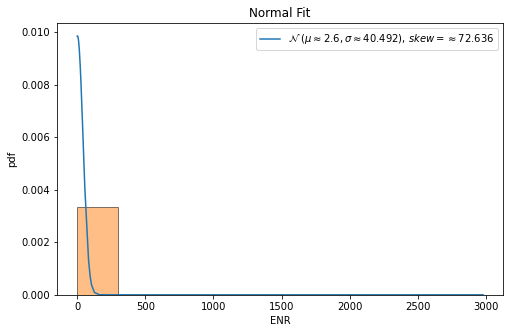


QQ plot 



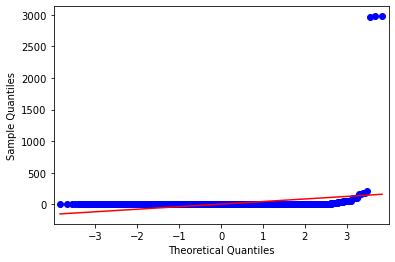


 Shapiro-Wilk Test 
 
Statistics=58479.120, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  EOG
hii
max value =  6.325904680417199 min value =  0.0
mean=  2.461697144907028 standard deviation=  0.6436451025802387
left range=  2.139874593616909 right range=  2.7835196961971476
3.824618777 6.003630759
data covered within this range=  50.52 %
percent left and right=  54.67 45.33



normality test :----

kurtosis value=  1.9749447573670356
skewness value=  -0.7866671374697489


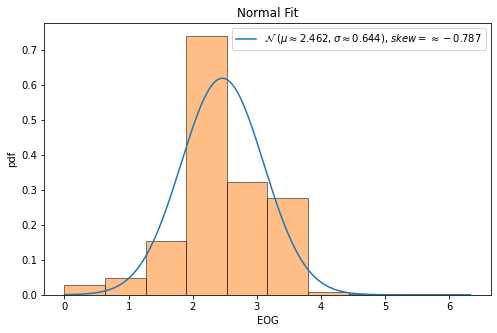


QQ plot 



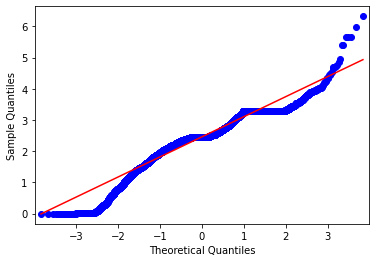


 Shapiro-Wilk Test 
 
Statistics=2078.245, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  CYC
hii
max value =  17995449 min value =  0
mean=  14950.59695375581 standard deviation=  262443.7916562906
left range=  7 right range=  65334
data covered within this range=  93.83 %
percent left and right=  90.8 9.2
data covered within 1 standard deviation=  99.56 %
data covered within 2 standard deviation=  99.72 %
data covered within 3 standard deviation=  99.8 %



normality test :----

kurtosis value=  4047.2428845821273
skewness value=  60.15081673572448


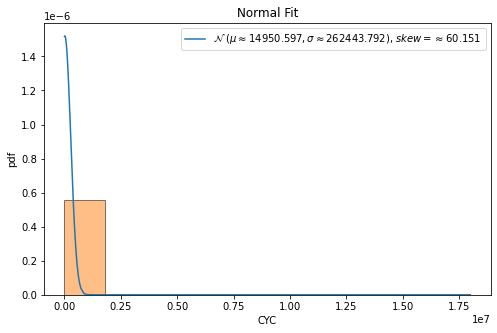


QQ plot 



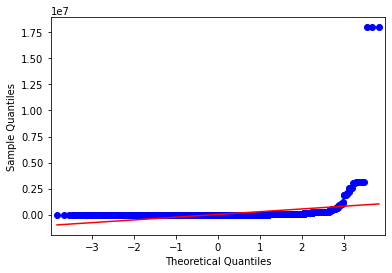


 Shapiro-Wilk Test 
 
Statistics=54862.735, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  HGCI
hii
max value =  61244 min value =  0
mean=  115.0653290922437 standard deviation=  1504.2688429633301
left range=  0 right range=  269
data covered within this range=  96.9 %
percent left and right=  93.43 6.57
data covered within 1 standard deviation=  99.08 %
data covered within 2 standard deviation=  99.41 %
data covered within 3 standard deviation=  99.57 %



normality test :----

kurtosis value=  685.4182313205187
skewness value=  23.65968220198859


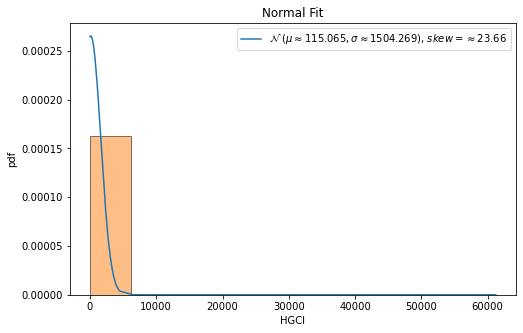


QQ plot 



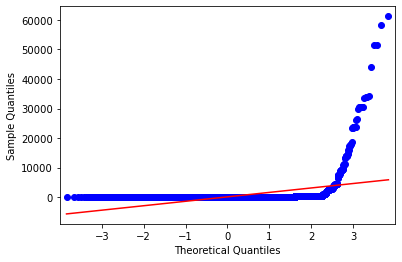


 Shapiro-Wilk Test 
 
Statistics=38388.674, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  ESUB
hii
max value =  1.0 min value =  0.0
mean=  0.24239900939091313 standard deviation=  0.2736067399098616
left range=  0.10559563943598232 right range=  0.37920237934584394
0.885939467 2.768941258
data covered within this range=  13.7 %
percent left and right=  59.77 40.23



normality test :----

kurtosis value=  -0.6281310824568527
skewness value=  0.7697434964927456


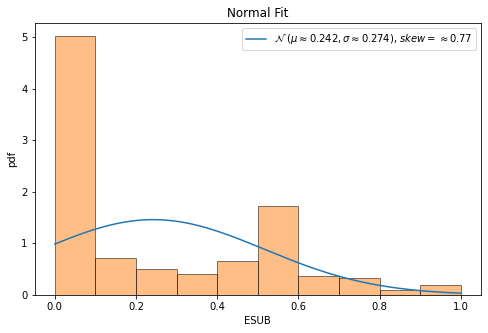


QQ plot 



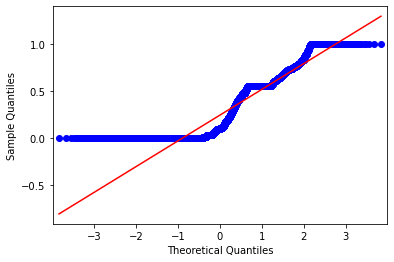


 Shapiro-Wilk Test 
 
Statistics=1892.231, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  ELCLSPRT
hii
max value =  1.0 min value =  0.034066325273161
mean=  0.8945530092262775 standard deviation=  0.1667792353186111
left range=  0.8111633915669719 right range=  0.977942626885583
5.15943536 0.632254912
data covered within this range=  17.15 %
percent left and right=  30.71 69.29



normality test :----

kurtosis value=  1.1840705561266738
skewness value=  -1.4843220013763982


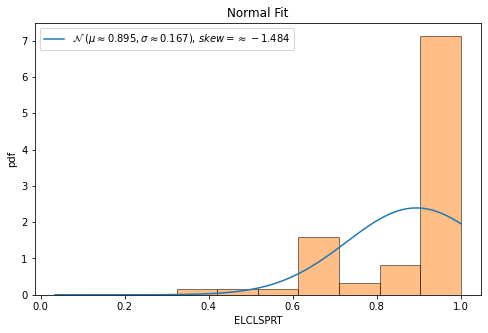


QQ plot 



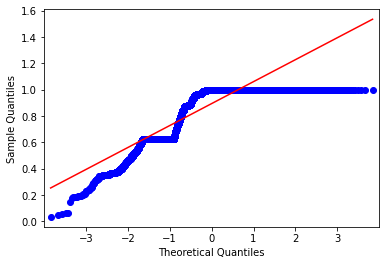


 Shapiro-Wilk Test 
 
Statistics=3759.304, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  ELAXPRT
hii
max value =  1.0 min value =  0.0
mean=  0.7789524856052381 standard deviation=  0.3304350618179904
left range=  0.613734954696243 right range=  0.9441700165142333
2.357354215 0.668959018
data covered within this range=  13.68 %
percent left and right=  29.48 70.52



normality test :----

kurtosis value=  -0.33697637690927396
skewness value=  -1.1692004906816773


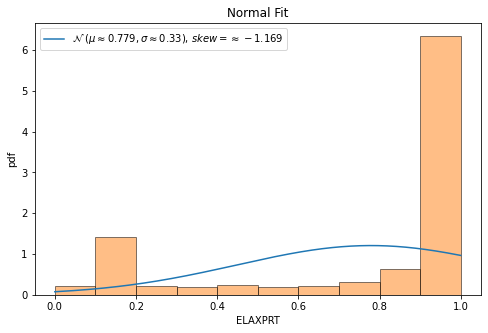


QQ plot 



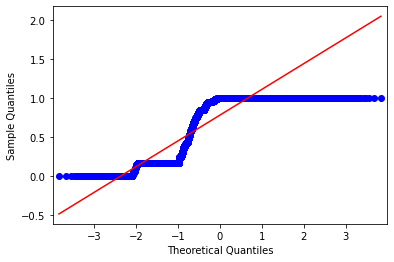


 Shapiro-Wilk Test 
 
Statistics=2545.180, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  IHR
hii
max value =  2967370 min value =  0
mean=  1724.4538781502324 standard deviation=  43840.9997054679
left range=  0 right range=  1995
data covered within this range=  96.89 %
percent left and right=  96.73 3.27
data covered within 1 standard deviation=  99.58 %
data covered within 2 standard deviation=  99.75 %
data covered within 3 standard deviation=  99.83 %



normality test :----

kurtosis value=  3122.373665295559
skewness value=  52.57419421194088


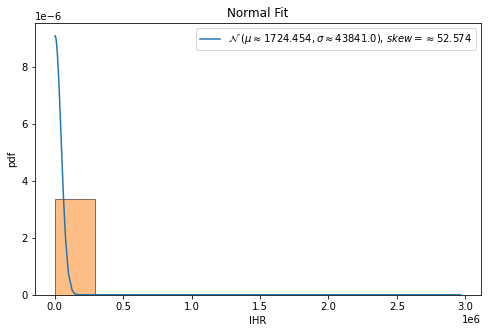


QQ plot 



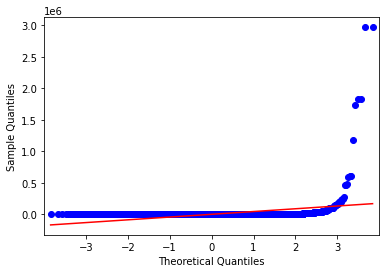


 Shapiro-Wilk Test 
 
Statistics=52322.025, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  IIR
hii
max value =  2967285 min value =  0
mean=  598.2841326156105 standard deviation=  25948.63614563908
left range=  0 right range=  170
data covered within this range=  96.9 %
percent left and right=  98.28 1.72
data covered within 1 standard deviation=  99.71 %
data covered within 2 standard deviation=  99.84 %
data covered within 3 standard deviation=  99.9 %



normality test :----

kurtosis value=  10715.334091844183
skewness value=  97.97439232977084


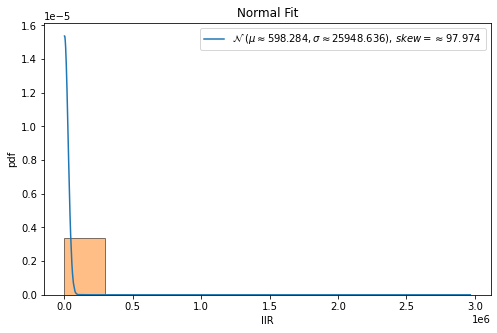


QQ plot 



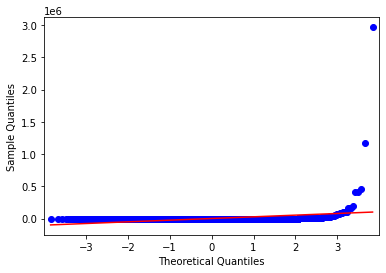


 Shapiro-Wilk Test 
 
Statistics=64557.595, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  ITR
hii
max value =  3137899 min value =  0
mean=  757.0866160998287 standard deviation=  32332.146909593594
left range=  0 right range=  279
data covered within this range=  96.89 %
percent left and right=  97.38 2.62
data covered within 1 standard deviation=  99.65 %
data covered within 2 standard deviation=  99.87 %
data covered within 3 standard deviation=  99.94 %



normality test :----

kurtosis value=  7769.319723396537
skewness value=  86.12763679830059


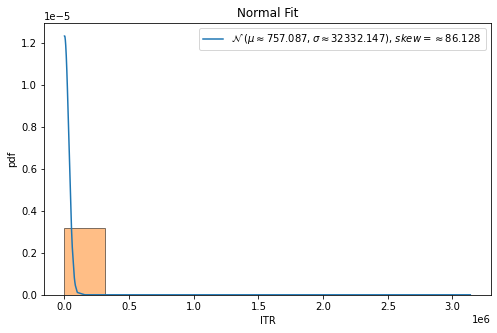


QQ plot 



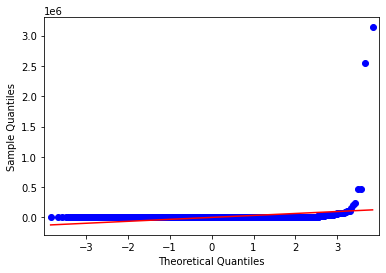


 Shapiro-Wilk Test 
 
Statistics=61899.219, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  IND
hii
max value =  747998 min value =  0
mean=  1791.521348177147 standard deviation=  20946.18520787871
left range=  0 right range=  1643
data covered within this range=  96.89 %
percent left and right=  96.91 3.09
data covered within 1 standard deviation=  99.0 %
data covered within 2 standard deviation=  99.2 %
data covered within 3 standard deviation=  99.32 %



normality test :----

kurtosis value=  508.1916247088881
skewness value=  20.452453914136484


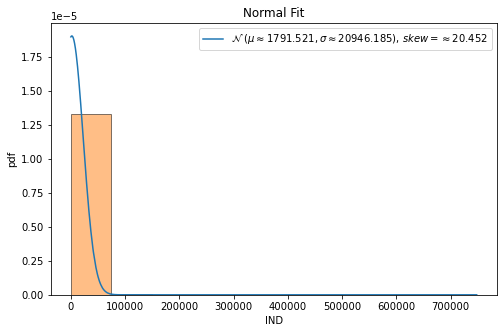


QQ plot 



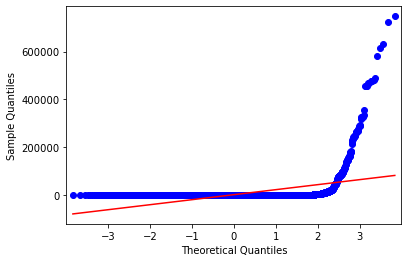


 Shapiro-Wilk Test 
 
Statistics=36027.256, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  aNOC
hii
max value =  35.977546777546785 min value =  0.0
mean=  0.8907590710093686 standard deviation=  0.6982738298639313
left range=  0.14285714285714285 right range=  1.705128205128205
data covered within this range=  93.77 %
percent left and right=  36.42 63.58
data covered within 1 standard deviation=  92.07 %
data covered within 2 standard deviation=  99.08 %
data covered within 3 standard deviation=  99.67 %



normality test :----

kurtosis value=  672.2906814498239
skewness value=  18.82393764305563


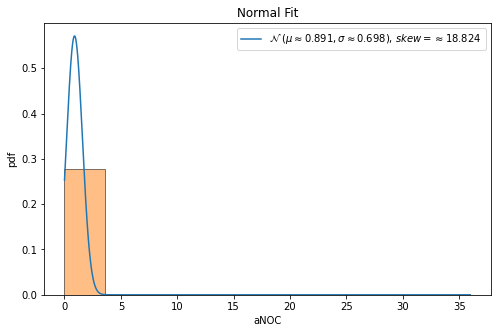


QQ plot 



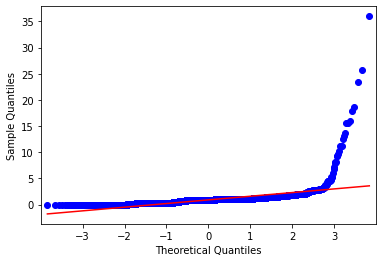


 Shapiro-Wilk Test 
 
Statistics=35091.326, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  mNOC
hii
max value =  123290 min value =  0
mean=  922.1677881086372 standard deviation=  5065.429612525892
left range=  2 right range=  9289
data covered within this range=  94.22 %
percent left and right=  93.19 6.81
data covered within 1 standard deviation=  95.92 %
data covered within 2 standard deviation=  97.49 %
data covered within 3 standard deviation=  97.8 %



normality test :----

kurtosis value=  121.64340103481874
skewness value=  9.420122344353441


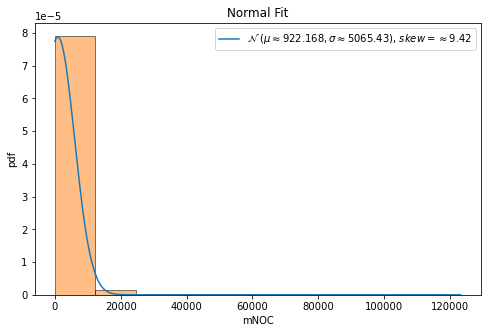


QQ plot 



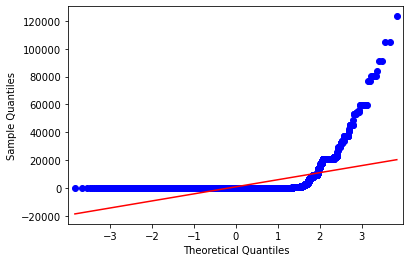


 Shapiro-Wilk Test 
 
Statistics=24589.191, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  tNOC
hii
max value =  3181083 min value =  0
mean=  9018.822363591877 standard deviation=  89203.6934703945
left range=  4 right range=  40759
data covered within this range=  93.8 %
percent left and right=  90.06 9.94
data covered within 1 standard deviation=  98.48 %
data covered within 2 standard deviation=  99.32 %
data covered within 3 standard deviation=  99.69 %



normality test :----

kurtosis value=  829.1126630498651
skewness value=  26.880941179994892


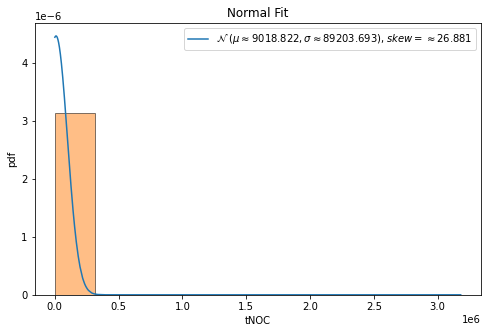


QQ plot 



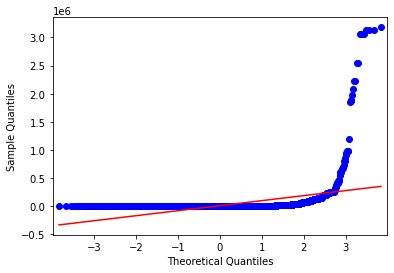


 Shapiro-Wilk Test 
 
Statistics=40451.437, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  aCID
hii
max value =  86574.72727272728 min value =  0.4998981462619678
mean=  11.373541562377877 standard deviation=  684.6070070995789
left range=  1.0070921985815602 right range=  8.538461538461537
data covered within this range=  93.77 %
percent left and right=  97.87 2.13
data covered within 1 standard deviation=  99.91 %
data covered within 2 standard deviation=  99.96 %
data covered within 3 standard deviation=  99.97 %



normality test :----

kurtosis value=  15636.949430146564
skewness value=  123.94841517505768


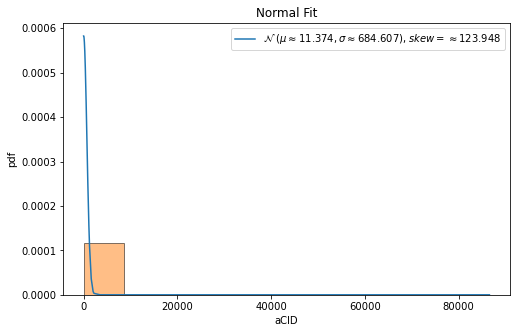


QQ plot 



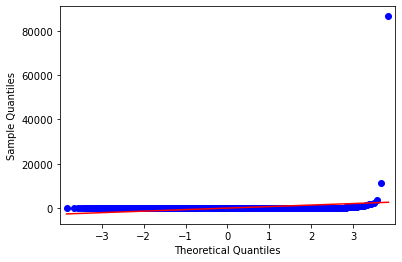


 Shapiro-Wilk Test 
 
Statistics=69473.792, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  mCID
hii
max value =  476124 min value =  1
mean=  1800.5197577685344 standard deviation=  13153.504702853343
left range=  13 right range=  14547
data covered within this range=  93.86 %
percent left and right=  92.42 7.58
data covered within 1 standard deviation=  97.02 %
data covered within 2 standard deviation=  98.57 %
data covered within 3 standard deviation=  99.14 %



normality test :----

kurtosis value=  541.4661025119261
skewness value=  20.10144414694574


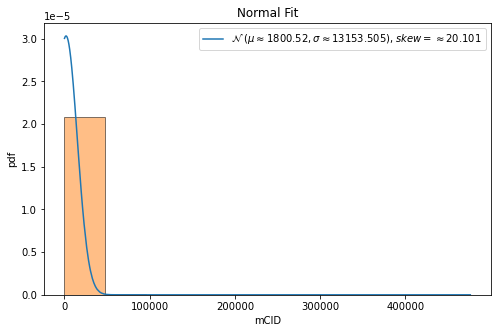


QQ plot 



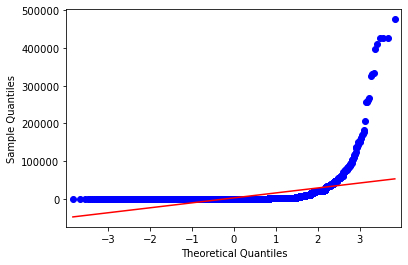


 Shapiro-Wilk Test 
 
Statistics=35835.710, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  tCID
hii
max value =  3272755 min value =  6
mean=  15496.49853193051 standard deviation=  104364.59078784678
left range=  95 right range=  90741
data covered within this range=  93.85 %
percent left and right=  88.38 11.62
data covered within 1 standard deviation=  97.39 %
data covered within 2 standard deviation=  98.5 %
data covered within 3 standard deviation=  99.41 %



normality test :----

kurtosis value=  535.653889393261
skewness value=  20.559647498343285


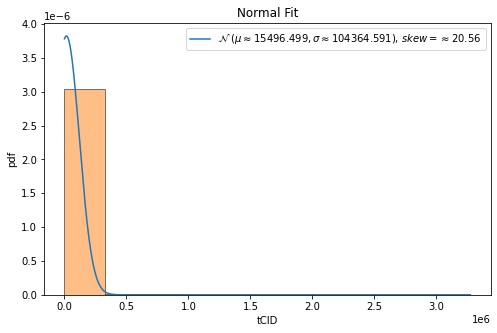


QQ plot 



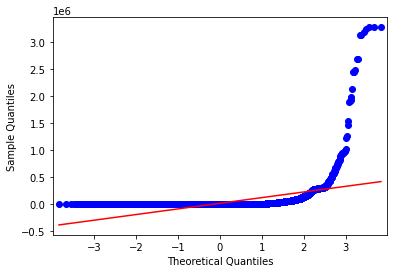


 Shapiro-Wilk Test 
 
Statistics=36146.956, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  aCOD
hii
max value =  333.8125 min value =  0.8333333333333334
mean=  2.355255748931542 standard deviation=  3.0305862165329773
left range=  0.9985734664764622 right range=  4.746031746031746
data covered within this range=  95.99 %
percent left and right=  70.9 29.1
data covered within 1 standard deviation=  99.28 %
data covered within 2 standard deviation=  99.61 %
data covered within 3 standard deviation=  99.72 %



normality test :----

kurtosis value=  8768.357862660707
skewness value=  81.428143603617


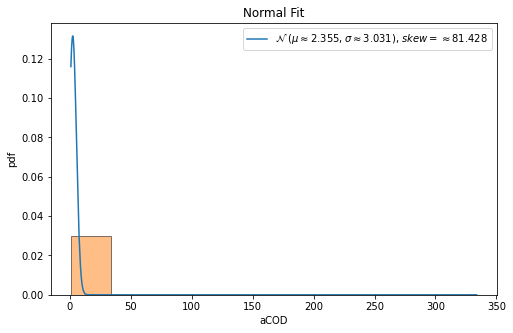


QQ plot 



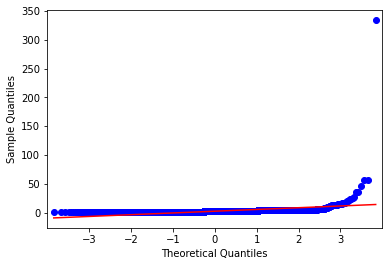


 Shapiro-Wilk Test 
 
Statistics=60857.233, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  tCOD
hii
max value =  3415786 min value =  5
mean=  16396.357230242233 standard deviation=  110751.89925137126
left range=  34 right range=  103265
data covered within this range=  93.81 %
percent left and right=  88.68 11.32
data covered within 1 standard deviation=  97.7 %
data covered within 2 standard deviation=  98.59 %
data covered within 3 standard deviation=  99.02 %



normality test :----

kurtosis value=  517.5468512976273
skewness value=  20.23721306720771


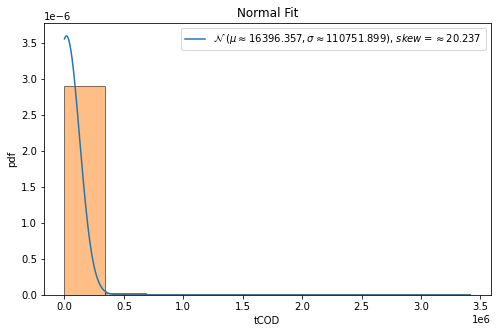


QQ plot 



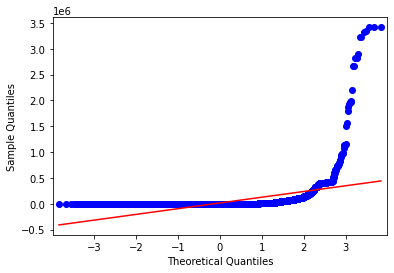


 Shapiro-Wilk Test 
 
Statistics=35892.559, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  aNOP
hii
max value =  35.977811377811385 min value =  0.8333333333333334
mean=  1.3709795657750332 standard deviation=  0.6572286818217415
left range=  0.9770017035775128 right range=  2.0894406406802286
data covered within this range=  93.77 %
percent left and right=  58.49 41.51
data covered within 1 standard deviation=  96.1 %
data covered within 2 standard deviation=  99.14 %
data covered within 3 standard deviation=  99.66 %



normality test :----

kurtosis value=  822.7079062234329
skewness value=  22.123610842086205


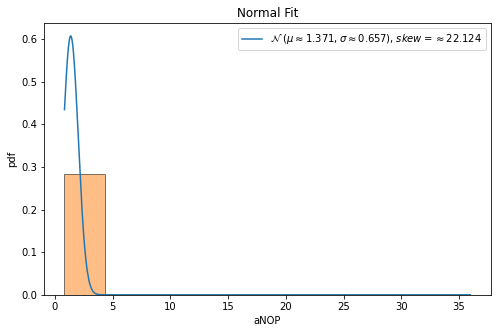


QQ plot 



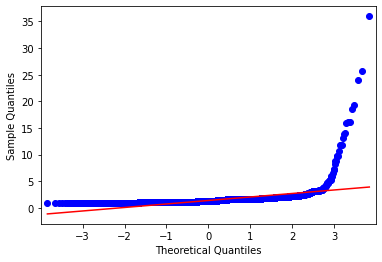


 Shapiro-Wilk Test 
 
Statistics=37546.904, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  mNOP
hii
max value =  123287 min value =  1
mean=  21.62729385857597 standard deviation=  995.306154512281
left range=  1 right range=  36
data covered within this range=  97.51 %
percent left and right=  94.54 5.46
data covered within 1 standard deviation=  99.93 %
data covered within 2 standard deviation=  99.94 %
data covered within 3 standard deviation=  99.94 %



normality test :----

kurtosis value=  14396.371215441452
skewness value=  116.92239221512551


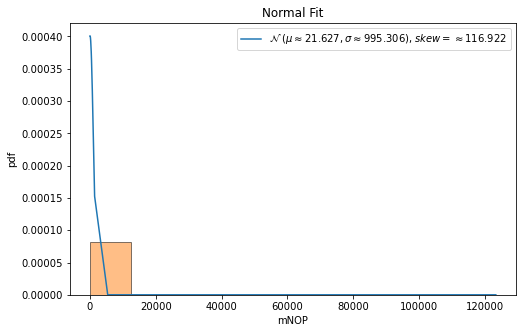


QQ plot 



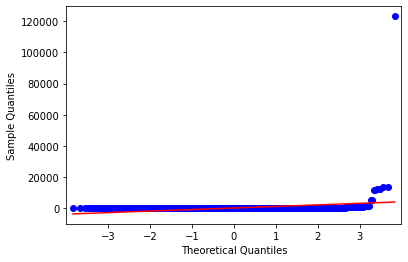


 Shapiro-Wilk Test 
 
Statistics=68239.925, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  tNOP
hii
max value =  3285650 min value =  5
mean=  11829.631514558356 standard deviation=  96944.28621365815
left range=  26 right range=  68922
data covered within this range=  93.77 %
percent left and right=  88.29 11.71
data covered within 1 standard deviation=  97.8 %
data covered within 2 standard deviation=  99.2 %
data covered within 3 standard deviation=  99.63 %



normality test :----

kurtosis value=  713.8218784196971
skewness value=  24.48814209787543


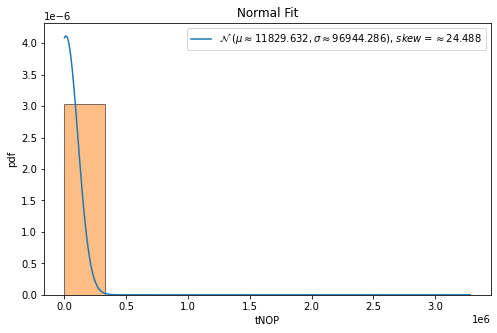


QQ plot 



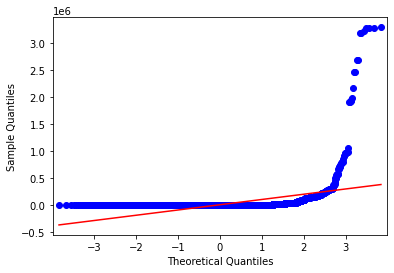


 Shapiro-Wilk Test 
 
Statistics=38931.365, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  CONJP
hii
max value =  1.0 min value =  0.0
mean=  0.06629013946660142 standard deviation=  0.16709797229001735
left range=  0.0 right range=  0.5331
data covered within this range=  96.89 %
percent left and right=  81.04 18.96
data covered within 1 standard deviation=  89.01 %
data covered within 2 standard deviation=  92.25 %
data covered within 3 standard deviation=  97.26 %



normality test :----

kurtosis value=  9.095239692242673
skewness value=  3.00278276001578


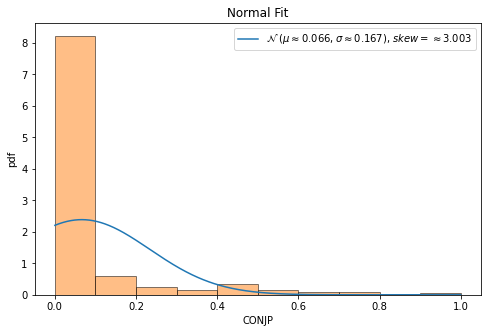


QQ plot 



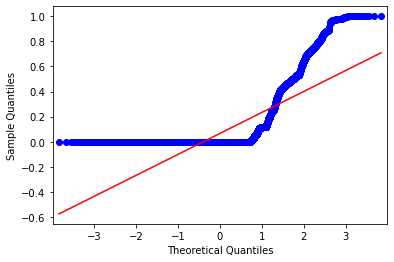


 Shapiro-Wilk Test 
 
Statistics=10071.447, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  DISJ
hii
max value =  18323 min value =  0
mean=  6.851174455590898 standard deviation=  144.2319942798151
left range=  0 right range=  23
data covered within this range=  97.85 %
percent left and right=  77.54 22.46
data covered within 1 standard deviation=  99.77 %
data covered within 2 standard deviation=  99.92 %
data covered within 3 standard deviation=  99.99 %



normality test :----

kurtosis value=  15905.402739534034
skewness value=  125.289139945069


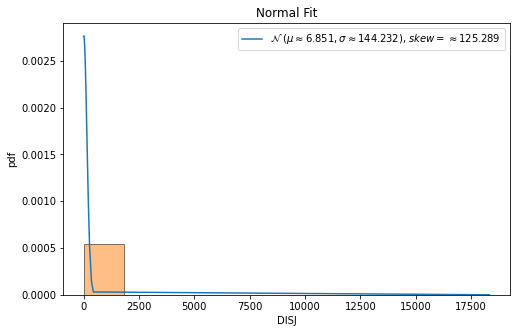


QQ plot 



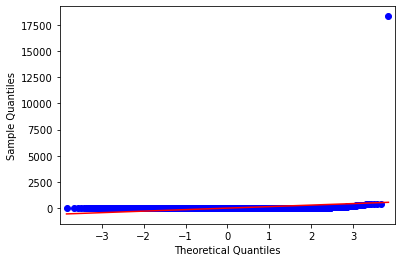


 Shapiro-Wilk Test 
 
Statistics=69703.101, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  DISJP
hii
max value =  1.0 min value =  0.0
mean=  0.1676782725715684 standard deviation=  0.35610621225699857
left range=  -0.01037483355693089 right range=  0.34573137870006765
0.470865901 2.337285054
data covered within this range=  83.94 %
percent left and right=  81.99 18.01



normality test :----

kurtosis value=  1.5211046807133357
skewness value=  1.850506796989204


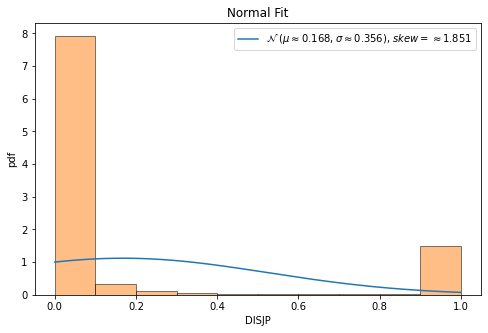


QQ plot 



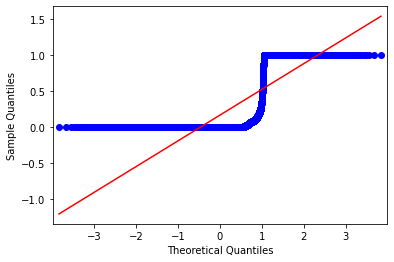


 Shapiro-Wilk Test 
 
Statistics=4958.935, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  EF
hii
max value =  350019 min value =  0
mean=  1480.6498042574015 standard deviation=  9741.196035754834
left range=  0 right range=  11687
data covered within this range=  96.89 %
percent left and right=  90.13 9.87
data covered within 1 standard deviation=  96.86 %
data covered within 2 standard deviation=  98.72 %
data covered within 3 standard deviation=  99.05 %



normality test :----

kurtosis value=  420.8558727351291
skewness value=  17.15975325407678


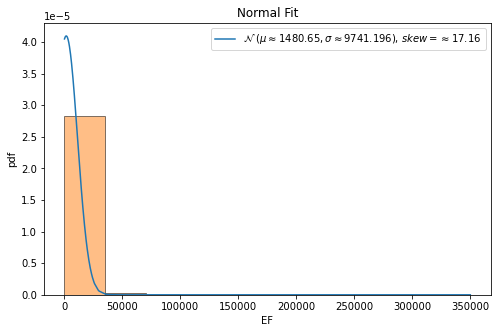


QQ plot 



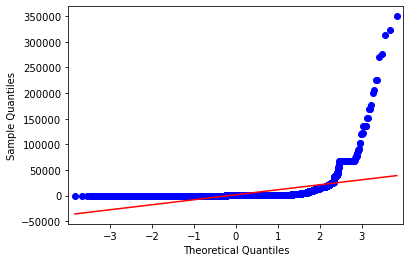


 Shapiro-Wilk Test 
 
Statistics=33416.641, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  EFP
hii
max value =  1.0 min value =  0.0
mean=  0.5173981954979202 standard deviation=  0.4413339307349452
left range=  0.2967312301304476 right range=  0.7380651608653928
1.17235082 1.09350714
data covered within this range=  15.92 %
percent left and right=  48.53 51.47



normality test :----

kurtosis value=  -1.7774178016407882
skewness value=  -0.05592613059552444


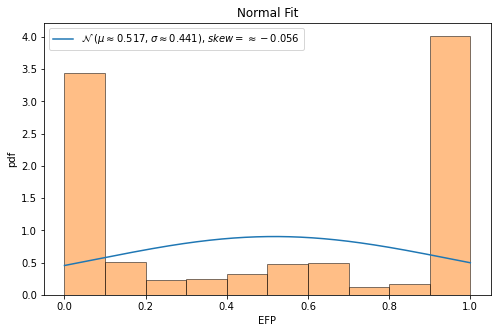


QQ plot 



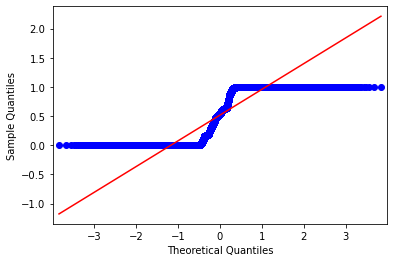


 Shapiro-Wilk Test 
 
Statistics=65490.051, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  SELF
hii
max value =  29 min value =  0
mean=  0.057010031808172254 standard deviation=  1.1659172440456393
left range=  0 right range=  0
data covered within this range=  99.51 %
percent left and right=  99.51 0.49
data covered within 1 standard deviation=  99.68 %
data covered within 2 standard deviation=  99.68 %
data covered within 3 standard deviation=  99.68 %



normality test :----

kurtosis value=  580.1563556613575
skewness value=  23.736767096786586


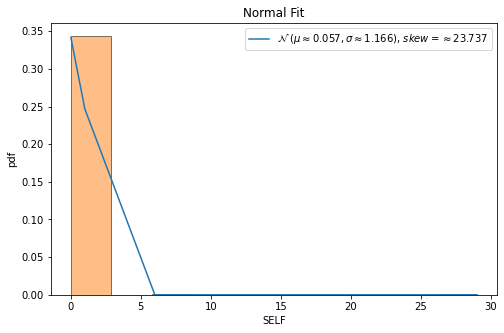


QQ plot 



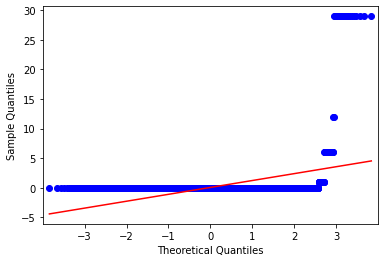


 Shapiro-Wilk Test 
 
Statistics=38300.882, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  SELFP
hii
max value =  0.3529 min value =  0.0
mean=  0.00046935404942500614 standard deviation=  0.010267133496791224
left range=  0.0 right range=  0.0
data covered within this range=  99.51 %
percent left and right=  99.52 0.48
data covered within 1 standard deviation=  99.68 %
data covered within 2 standard deviation=  99.69 %
data covered within 3 standard deviation=  99.72 %



normality test :----

kurtosis value=  643.6683890142928
skewness value=  24.84869811611116


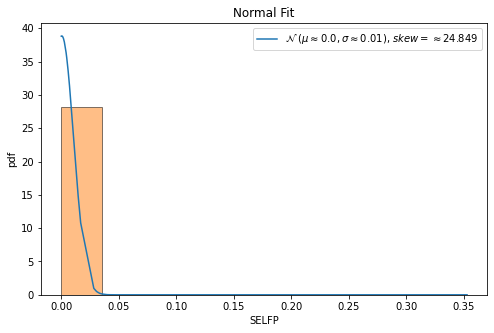


QQ plot 



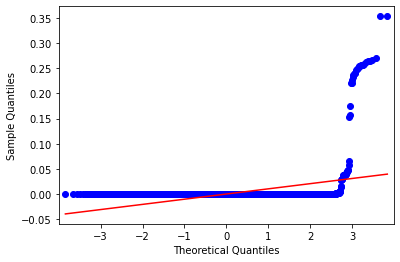


 Shapiro-Wilk Test 
 
Statistics=39066.914, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  MNCAR
hii
max value =  1305 min value =  0
mean=  2.0644115488133106 standard deviation=  16.813051090544956
left range=  0 right range=  9
data covered within this range=  96.92 %
percent left and right=  91.26 8.74
data covered within 1 standard deviation=  98.16 %
data covered within 2 standard deviation=  98.84 %
data covered within 3 standard deviation=  99.09 %



normality test :----

kurtosis value=  2253.435818483105
skewness value=  33.760887590125954


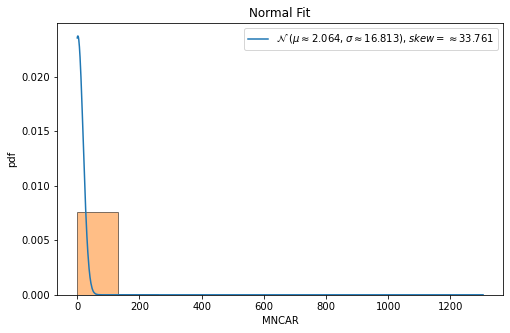


QQ plot 



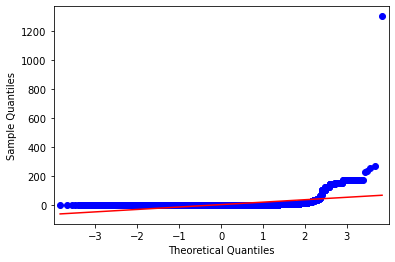


 Shapiro-Wilk Test 
 
Statistics=44672.267, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  MNCARP
hii
max value =  1.0 min value =  0.0
mean=  0.011725807438218742 standard deviation=  0.06619768387928139
left range=  0.0 right range=  0.0943
data covered within this range=  96.89 %
percent left and right=  91.17 8.83
data covered within 1 standard deviation=  96.32 %
data covered within 2 standard deviation=  97.94 %
data covered within 3 standard deviation=  98.51 %



normality test :----

kurtosis value=  105.3056129071791
skewness value=  9.410736710137735


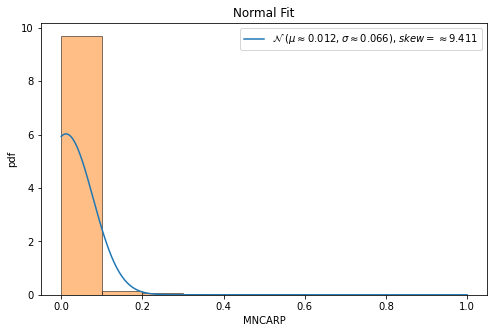


QQ plot 



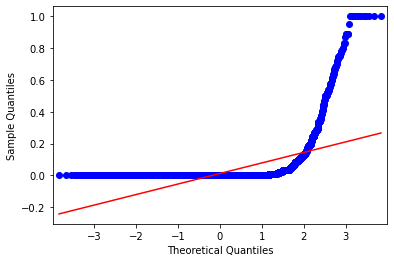


 Shapiro-Wilk Test 
 
Statistics=24395.382, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  MXCAR
hii
max value =  967 min value =  0
mean=  1.6180572547100562 standard deviation=  10.636534526903574
left range=  0 right range=  20
data covered within this range=  97.11 %
percent left and right=  92.86 7.14
data covered within 1 standard deviation=  94.98 %
data covered within 2 standard deviation=  97.28 %
data covered within 3 standard deviation=  98.9 %



normality test :----

kurtosis value=  4165.600121172129
skewness value=  48.22829158801259


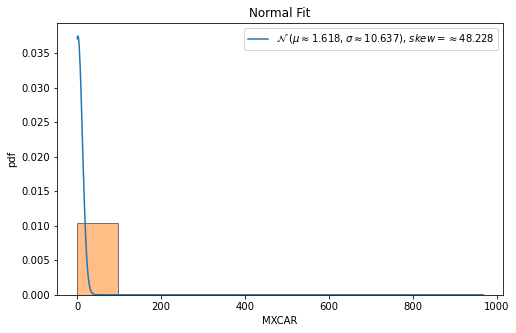


QQ plot 



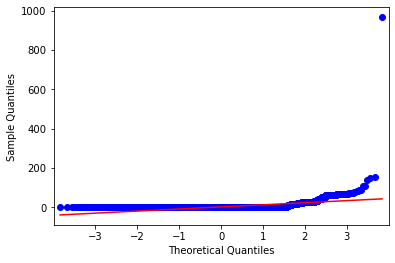


 Shapiro-Wilk Test 
 
Statistics=50949.955, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  MXCARP
hii
max value =  1.0 min value =  0.0
mean=  0.017473244433569856 standard deviation=  0.0840923651382709
left range=  0.0 right range=  0.2692
data covered within this range=  96.89 %
percent left and right=  94.04 5.96
data covered within 1 standard deviation=  95.48 %
data covered within 2 standard deviation=  96.2 %
data covered within 3 standard deviation=  96.89 %



normality test :----

kurtosis value=  34.447458579608345
skewness value=  5.617084241649405


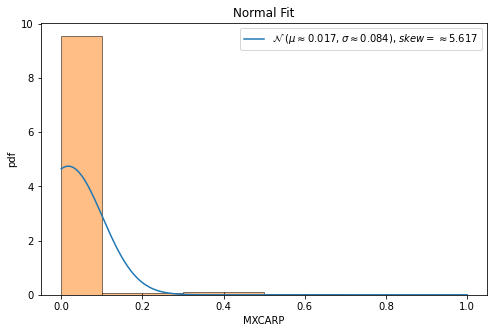


QQ plot 



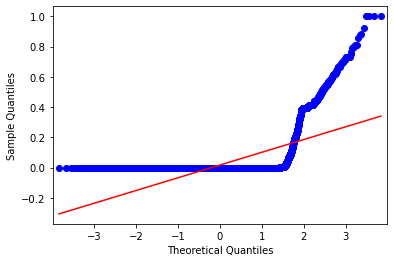


 Shapiro-Wilk Test 
 
Statistics=17413.728, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  CAR
hii
max value =  1843 min value =  0
mean=  5.749938830437974 standard deviation=  50.40889797184298
left range=  0 right range=  15
data covered within this range=  97.2 %
percent left and right=  91.09 8.91
data covered within 1 standard deviation=  99.03 %
data covered within 2 standard deviation=  99.09 %
data covered within 3 standard deviation=  99.16 %



normality test :----

kurtosis value=  319.4472975840131
skewness value=  14.811983844689905


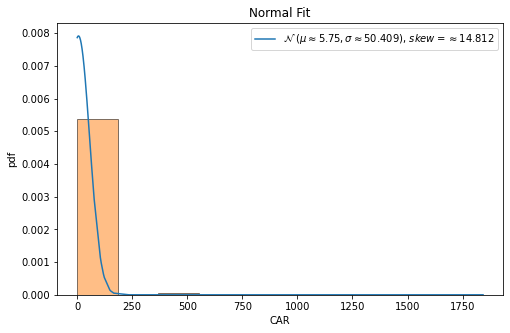


QQ plot 



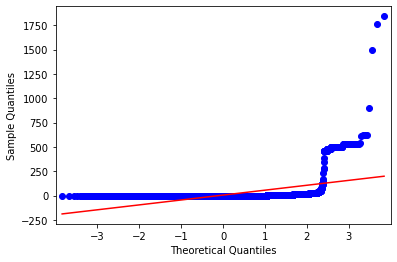


 Shapiro-Wilk Test 
 
Statistics=31195.012, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  CARP
hii
max value =  1.0 min value =  0.0
mean=  0.01942945314411549 standard deviation=  0.07592917587126698
left range=  0.0 right range=  0.25
data covered within this range=  96.97 %
percent left and right=  89.85 10.15
data covered within 1 standard deviation=  93.97 %
data covered within 2 standard deviation=  95.23 %
data covered within 3 standard deviation=  96.78 %



normality test :----

kurtosis value=  37.04215684378512
skewness value=  5.429688334423208


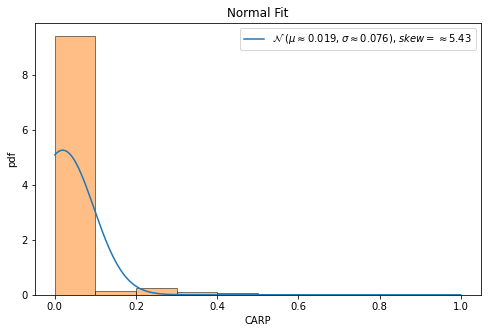


QQ plot 



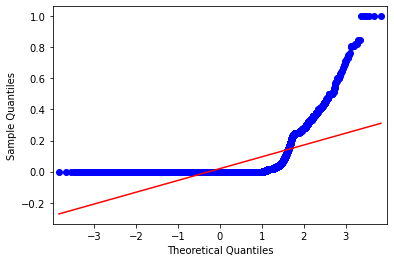


 Shapiro-Wilk Test 
 
Statistics=17207.844, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  OBPP
hii
max value =  1.0 min value =  0.0
mean=  0.8226970638610228 standard deviation=  0.2753475739635027
left range=  0.6850232768792714 right range=  0.9603708508427742
2.987849328 0.643924091
data covered within this range=  11.46 %
percent left and right=  31.3 68.7



normality test :----

kurtosis value=  1.3433585783673552
skewness value=  -1.4893368422785558


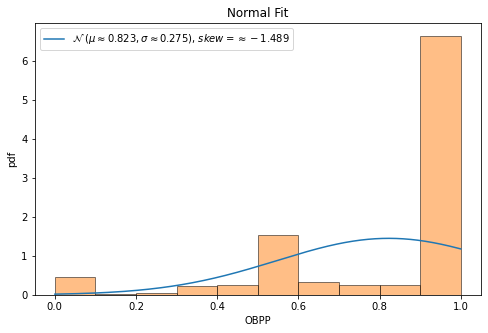


QQ plot 



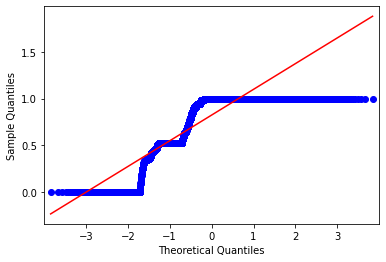


 Shapiro-Wilk Test 
 
Statistics=3845.322, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  DTPP
hii
max value =  1.0 min value =  0.0
mean=  0.13992834597504283 standard deviation=  0.22427233098477278
left range=  0.027792180482656442 right range=  0.25206451146742925
0.623921575 3.834943215
data covered within this range=  10.37 %
percent left and right=  71.21 28.79



normality test :----

kurtosis value=  0.879548182379505
skewness value=  1.3974135462426323


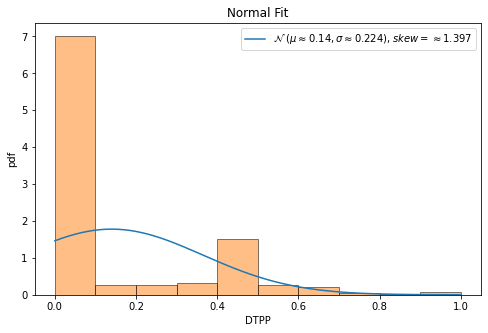


QQ plot 



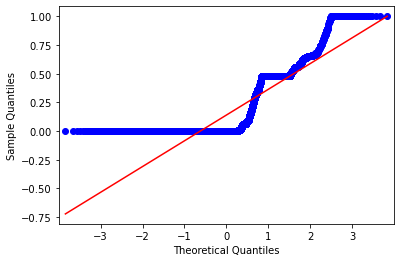


 Shapiro-Wilk Test 
 
Statistics=3370.074, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  SYM
hii
max value =  78 min value =  0
mean=  0.7892708588206508 standard deviation=  2.804351870232611
left range=  0 right range=  4
data covered within this range=  97.42 %
percent left and right=  74.44 25.56
data covered within 1 standard deviation=  96.52 %
data covered within 2 standard deviation=  98.45 %
data covered within 3 standard deviation=  99.17 %



normality test :----

kurtosis value=  324.35132202432766
skewness value=  14.841935373573662


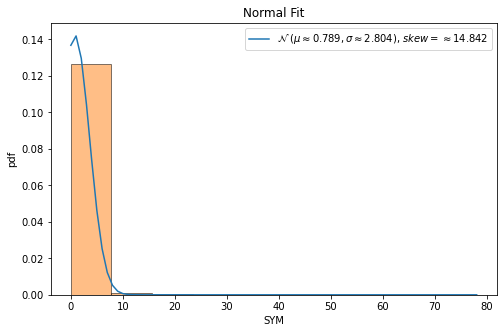


QQ plot 



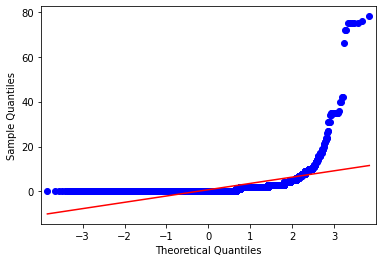


 Shapiro-Wilk Test 
 
Statistics=31236.316, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  SYMP
hii
max value =  1.0 min value =  0.0
mean=  0.00872000244678248 standard deviation=  0.035497980829414716
left range=  0.0 right range=  0.0588
data covered within this range=  96.9 %
percent left and right=  77.31 22.69
data covered within 1 standard deviation=  96.1 %
data covered within 2 standard deviation=  98.02 %
data covered within 3 standard deviation=  98.87 %



normality test :----

kurtosis value=  249.70727644431847
skewness value=  12.991210920490614


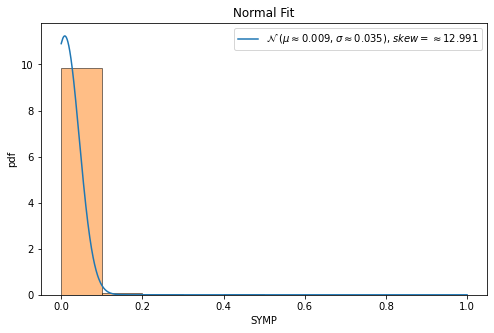


QQ plot 



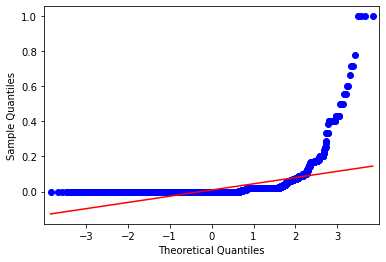


 Shapiro-Wilk Test 
 
Statistics=29264.323, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  REFLE
hii
max value =  2 min value =  0
mean=  0.0012845608025446537 standard deviation=  0.03748666202986192
left range=  0 right range=  0
data covered within this range=  99.88 %
percent left and right=  99.88 0.12
data covered within 1 standard deviation=  99.88 %
data covered within 2 standard deviation=  99.88 %
data covered within 3 standard deviation=  99.88 %



normality test :----

kurtosis value=  1076.877010650351
skewness value=  31.249416231869215


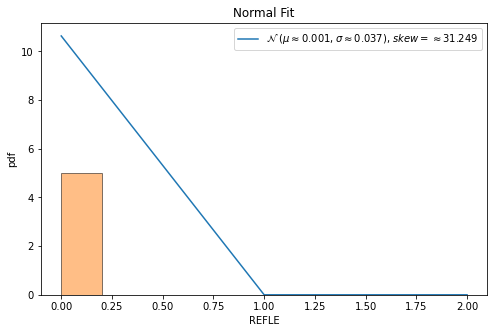


QQ plot 



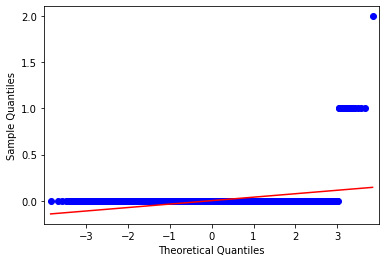


 Shapiro-Wilk Test 
 
Statistics=42977.281, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  RANG
hii
max value =  10424 min value =  0
mean=  40.1375091754343 standard deviation=  138.1708257140537
left range=  0 right range=  183
data covered within this range=  96.95 %
percent left and right=  69.34 30.66
data covered within 1 standard deviation=  95.05 %
data covered within 2 standard deviation=  99.41 %
data covered within 3 standard deviation=  99.66 %



normality test :----

kurtosis value=  2707.679576472493
skewness value=  43.02442476850591


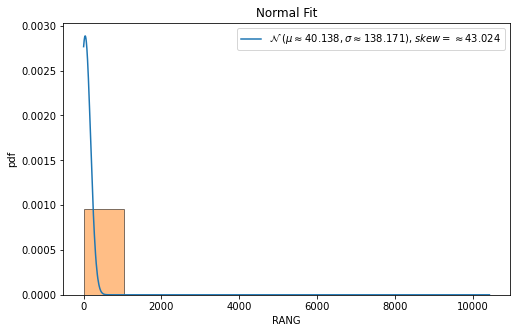


QQ plot 



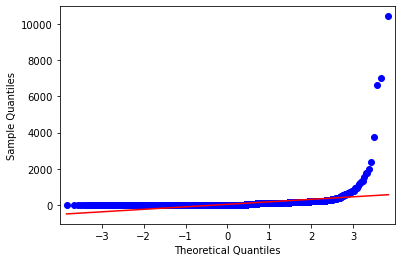


 Shapiro-Wilk Test 
 
Statistics=48776.141, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  CAL_TIME
hii
max value =  7193760 min value =  0
mean=  3414.8513579642768 standard deviation=  96675.57500781384
left range=  10 right range=  6430
data covered within this range=  96.24 %
percent left and right=  95.58 4.42
data covered within 1 standard deviation=  99.7 %
data covered within 2 standard deviation=  99.79 %
data covered within 3 standard deviation=  99.83 %



normality test :----

kurtosis value=  3778.2615281967
skewness value=  58.325445660046924


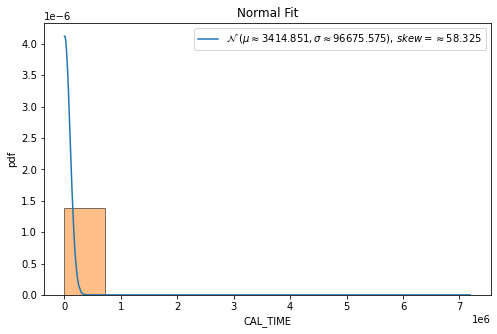


QQ plot 



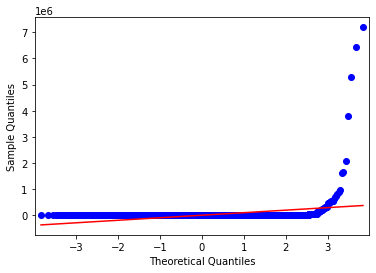


 Shapiro-Wilk Test 
 
Statistics=54271.732, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------



In [240]:
# now the range calculation begins for easy time ontology category clustered on memory

#after easy time and memory clusering ,
#collect the easy ones

from matplotlib import pyplot as plt
%matplotlib inline
#%matplotlib qt 
import scipy
from scipy.stats import norm
from statsmodels.graphics.gofplots import qqplot
import statistics
from scipy.stats import shapiro
from scipy.stats import normaltest
import math


#   this below function calculates the interquratile range for features whose skewness value is not in (-2,2) 
#                      ****     full - algorithm is explianed in the report *****
def cal(sov_sort):
    
    p=0
    l=len(sov_sort)
    left=0
    right=0
    while  p < 90 :
        if p==0:
            if l % 2 ==0:
                left=( l /2)                                     #left and right variable is incrementally shifted  
                right=( l / 2) + 1                               # each time by 50 % of the remaining length on either
                p= round((((right -left +1) / l) * 100),2)       # side
                
            else:
                left=math.floor( l /2)
                right=math.ceil(l/2) + 1
                p= round((((right -left +1) / l) * 100),2)
                
        else:
            if left % 2 !=0:
                left = math.ceil(left/2)
            else:
                left = left /2
            
            dist = l - right +1
            if dist % 2 !=0:
                right = right + math.ceil(dist/2)
            else:
                right = right + (dist /2)
                
            p= round((((right -left +1) / l) * 100),2)
             
            
        
    return left-1,right-1 #return the index of array within which more than 90% of the values are present for
                            # that particular feature



print(df_easy_time_mem_feature_df.shape) 
easy_time_mem_easy = df_easy_time_mem_feature_df[df_easy_time_mem_feature_df['label_mem']== 'easy']
print(easy_time_mem_easy.shape) # contains the easy time easy memory ontology

prior_easy= round(easy_time_mem_easy.shape[0] / df_easy_time_mem_feature_df.shape[0] ,5)
                            #fraction of easy time easy memory ontology in easy time catgeory
    
main_dict_etme={}           # this contains the features whose skewness value is in (-2,2) and in this section
                            # only initialization is done, like  min ,max, lw_i, rw_i, min_val_w, etc
                            # the calculation for the ranges of features in this category is shown in next section
                            # this is done using effective range

main_dict_etme_iqr={}       # this contains the range values and all other parameters of those features whose
                            # skewness value not in (-2,2)

for i in range(len(cols_list)):
    if cols_list[i] in top_n_1:
        tmp_dict={}
        tmp_dict_iqr={}
        
        feature = cols_list[i]
        print("feature name= ",feature)
        
        sov=np.array(easy_time_mem_easy[feature])
        sov_1=(np.sort(sov))
        #print("feature values= ",sov)
        print("hii")
        skew=scipy.stats.skew(sov) # calculate the skewness value of a feature
        
        tmp_dict["skew"]=round(skew,4)    
        tmp_dict_iqr["skew"]=round(skew,4)
        
        
        # section for intialization of those feature which are approximately normally distributed and will use 
        # effective range formula
        
        if -2 < skew and skew < 2:
        
            print("max value = ",np.max(sov),"min value = ",np.min(sov))
            tmp_dict["min"]=round(np.min(sov),9) #min value of feature
            tmp_dict["max"]=round(np.max(sov),9) #max value of feature
            min_val=np.min(sov)
            max_val=np.max(sov)

            mean = np.mean(sov) #mean value of feature
            std = np.std(sov)   #standard deviation of feature
            
            print("mean= ",mean,"standard deviation= ",std)
            tmp_dict["mean"]=round(mean,9)
            tmp_dict["std"]=round(std,9)
            
            # ---  effective range formula originally ---
            
            #gamma=2
            #rx= mean - ((1- prior_easy) *gamma * std)    #explianed in the report 
            #ry= mean + ((1- prior_easy) *gamma * std)
            
            # ----------------------------------------------
            l_weight=0.5  #initial left weight
            r_weight=0.5  #initial right weight
            rx= mean - (l_weight* std)   #intial left range 
            ry= mean + (r_weight* std)   #initial right range 
            
            print("left range= ",rx,"right range= ", ry)
            tmp_dict["lw_i"]=round(l_weight,9)
            tmp_dict["rw_i"]=round(r_weight,9)
            tmp_dict["lr"]=round(rx,9)
            tmp_dict["rr"]=round(ry,9)

            min_val_w= round(((mean - min_val) /std ),9)  # fraction of std by which minimum value of the feature
                                                          # away from mean 
            max_val_w= round(((max_val - mean) /std ),9)  # similaly maximum value of feature away from mean
            print(min_val_w,max_val_w)
            
            tmp_dict["min_val_w"]=round(min_val_w,9)
            tmp_dict["max_val_w"]=round(max_val_w,9)


            val=(((rx <= sov) & (sov <= ry)).sum()) / easy_time_mem_easy.shape[0] 
            v =  round((val * 100 ),2) #percentage of data is covered within initial range
            print("data covered within this range= ",v,"%")

            tmp_dict["percent_i"]=round(v,9)  #storing the initial percentage of data covered within that range 
            tmp_dict["percent_change"]=round(v,9) # this will contain the final percentage of data covered 
                                                    # after the final range caluclation

            val=(((min_val <= sov) & (sov <= mean)).sum()) / easy_time_mem_easy.shape[0]
            percent_l =  round((val * 100 ),2) # contain the percentage of data covered on the left side the mean

            val=(((mean <= sov) & (sov <= max_val)).sum()) / easy_time_mem_easy.shape[0]
            percent_r =  round((val * 100 ),2) # contain the percentage of data covered on the right side the mean

            print("percent left and right= ",percent_l,percent_r)
            tmp_dict["percent_l"]=percent_l
            tmp_dict["percent_r"]=percent_r
            
            main_dict_etme[feature]=tmp_dict
            
        else:
            # section for calculating the range of features whose skewness value is not in (-2,2)
            
            left_index,right_index = cal(sov_1) #to find interquartile range by using the above function
            #print(left_index,right_index)
            rx=sov_1[int(left_index)] # we get left range 
            ry=sov_1[int(right_index)] # we get right range 
 
            # rest parameters defination is same as above
    
            print("max value = ",np.max(sov),"min value = ",np.min(sov))
            
            tmp_dict_iqr["min"]=round(np.min(sov),9)
            tmp_dict_iqr["max"]=round(np.max(sov),9)
            min_val=np.min(sov)
            max_val=np.max(sov)
            
            
            mean = np.mean(sov)
            std = np.std(sov)
            print("mean= ",mean,"standard deviation= ",std)
            tmp_dict_iqr["mean"]=round(mean,9)
            tmp_dict_iqr["std"]=round(std,9)
            
            print("left range= ",rx,"right range= ", ry)
            tmp_dict_iqr["lw_i"]="null"  # no need in this case, hence null value is placed
            tmp_dict_iqr["rw_i"]="null"  # no need in this case, hence null value is placed
            tmp_dict_iqr["lr"]=round(rx,9)
            tmp_dict_iqr["rr"]=round(ry,9)
            
            
            tmp_dict_iqr["min_val_w"]="null" # no need in this case, hence null value is placed
            tmp_dict_iqr["max_val_w"]="null" # no need in this case, hence null value is placed
            tmp_dict_iqr["percent_i"]="null" # no need in this case, hence null value is placed
            
            val=(((rx <= sov) & (sov <= ry)).sum()) / easy_time_mem_easy.shape[0]
            v =  round((val * 100 ),2)
            
            print("data covered within this range= ",v,"%")
            tmp_dict_iqr["percent_change"]=round(v,9)
            
            val=(((min_val <= sov) & (sov <= mean)).sum()) / easy_time_mem_easy.shape[0]
            percent_l =  round((val * 100 ),2)

            val=(((mean <= sov) & (sov <= max_val)).sum()) / easy_time_mem_easy.shape[0]
            percent_r =  round((val * 100 ),2)

            print("percent left and right= ",percent_l,percent_r)
            
            tmp_dict_iqr["percent_l"]=percent_l
            tmp_dict_iqr["percent_r"]=percent_r
            
            main_dict_etme_iqr[feature]=tmp_dict_iqr

            
            # 68–95–99.7 rule, also known as the empirical rule for normal distribution
            # checking for how much data is covered with (1,2,3) times standard deviation
            
            # for 1*std
            left = mean - std
            right = mean + std
            val=(((left <= sov) & (sov <= right)).sum()) / easy_time_mem_easy.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 1 standard deviation= ",v,"%")
            
            # for 2*std
            left = mean - (2*std)
            right = mean + (2*std)
            val=(((left <= sov) & (sov <= right)).sum()) / easy_time_mem_easy.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 2 standard deviation= ",v,"%")
            


            # for 3*std
            left = mean - (3*std)
            right = mean + (3*std)
            val=(((left <= sov) & (sov <= right)).sum()) / easy_time_mem_easy.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 3 standard deviation= ",v,"%")
            
            
        print("\n\n")
        
        # section for normality tests begin like kurtosis value, skewness value, Quantile Quantile plot, Shapiro
        # wilk test
        
        #normality test
        print("normality test :----\n")
        
        # kurtosis and skew function
        kurt=scipy.stats.kurtosis(sov)
        print("kurtosis value= ",kurt)
        print("skewness value= ",skew)
        
        #plotting graph for to see the skewess
        sov_1=np.sort(sov)
        fig, ax1 = plt.subplots(1, 1, figsize=(8,5))
        ax1.plot(sov_1, norm.pdf(sov_1, mean, std),label='$\mathcal{N}$ '+ f'$( \mu \\approx {round(mean,3)} , \sigma \\approx {round(std,3)})$, $ skew = \\approx {round(skew,3)}$')
        ax1.hist(sov_1,edgecolor='black',alpha=0.5,density= True)
        ax1.set_title("Normal Fit")
        ax1.set_xlabel(feature)
        ax1.set_ylabel("pdf")
        ax1.legend()
        #plt.savefig('/home/ritam/ontology_hardness/normal_curve_&_skewness/easy_time_easy_memory/'+str(feature)+'.jpeg')
        plt.show()
        
        # Quantile-Quantile Plot Nomrality check
        print("\nQQ plot \n")
        qqplot(sov_1, line='s')
        plt.show()
        
        #Statistical Normality Tests
        # Shapiro-Wilk Test
        print("\n Shapiro-Wilk Test \n ")
        #stat, p = shapiro(sov_1[0:4998])
        stat, p = normaltest(sov_1)
        print('Statistics=%.3f, p=%f' % (stat, p))
        
        alpha = 0.05
        if p > alpha:
            print('Sample looks Gaussian (fail to reject H0)')
        else:
            print('Sample does not look Gaussian (reject H0)')
            
        print("ends normality test ------------------------------------------------\n")
        
        

In [241]:
# this section does the calculation of effective range formula for features whose skewness value is in (-2,2)
# the features which will use this formula are considered as approximately normal curve

            # **************   FULL algorithm is explained in the report **********************  #
import copy

main_dict_cal_etme={} # this contains the final calculated range of the approximately normal features 

#incr_rate=[(0.2,0.3),(0.5,0.8),(0.6,0.7),(0.9,0.9)]
incr_rate=[(0.9,0.9)]
for i in range(len(incr_rate)): #for this one incr_rate, observe how many features having more than 90% coverage
 
    main_dict_cal_etme=copy.deepcopy(main_dict_etme)
    lower_r=incr_rate[i][0]  # apply this on the side where data ponits are more dense
    high_r=incr_rate[i][1]   # apply this on the side where data ponits are less dense
                             # here we kept the threhsold as 50% (it is changeable), if left part of the mean 
                             # has more than 50% data, then increment the fraction at slow rate and vice versa.
                             # Similarly for the right part
                
    for j in range (100): # iterated 100 times and slowly incrementing the right and left weightage 
        c=0                                  # to increase the range till it crosses 90 % coverage 
        for key,value in main_dict_cal_etme.items():
            
            if value["percent_change"] < 90:
                
                lw_i_temp=value["lw_i"]
                rw_i_temp=value["rw_i"]
                if value["percent_l"] >= 50:                         
                    diff=value["min_val_w"] - lw_i_temp # it is the difference between the current left weightage
                                                        # and weightage of the minimum value of that frature
                    frac = round(lower_r * diff, 9)     # take fraction of the difference
                    
                    lw_i_temp= round(lw_i_temp + frac , 9) # increment the left weightage by the fraction
                    main_dict_cal_etme[key]["lw_i"]=lw_i_temp
                else:
                    diff=value["min_val_w"] - lw_i_temp
                    frac = round(high_r * diff, 9)  
                    
                    lw_i_temp= round(lw_i_temp + frac ,9 )
                    main_dict_cal_etme[key]["lw_i"]=lw_i_temp

                if value["percent_r"] >= 50:
                    diff=value["max_val_w"] - rw_i_temp
                    frac = round(lower_r * diff, 9)  
                    
                    rw_i_temp= round(rw_i_temp + frac , 9 )
                    main_dict_cal_etme[key]["rw_i"]=rw_i_temp
                else:
                    diff=value["max_val_w"] - rw_i_temp
                    frac = round(high_r * diff, 9)  
                    
                    rw_i_temp= round(rw_i_temp + frac ,9 )
                    main_dict_cal_etme[key]["rw_i"]=rw_i_temp

                sov=np.array(easy_time_mem_easy[key])
                rx= round(value["mean"] - (lw_i_temp* value["std"]) ,9) #find left range using new left weightage
                ry= round(value["mean"] + (rw_i_temp* value["std"]),9) #find right range using new right weightage
                
                main_dict_cal_etme[key]["lr"]=round(rx,9)
                main_dict_cal_etme[key]["rr"]=round(ry,9)
                
                val=(((rx <= sov) & (sov <= ry)).sum()) / easy_time_mem_easy.shape[0]
                v =  round((val * 100 ),2)
                main_dict_cal_etme[key]["percent_change"]=v # check the percent coverage for this new range, then
                                                             # iterate again
                if v >=85:
                    c=c+1
                
            else:
                c=c+1
        p=round(c / len(list(main_dict_cal_etme.keys())),2)
        print ("percent in loop ",j , "covers ", p , "%" )
        

percent in loop  0 covers  0.25 %
percent in loop  1 covers  0.25 %
percent in loop  2 covers  0.25 %
percent in loop  3 covers  0.25 %
percent in loop  4 covers  0.25 %
percent in loop  5 covers  0.25 %
percent in loop  6 covers  0.25 %
percent in loop  7 covers  0.5 %
percent in loop  8 covers  0.75 %
percent in loop  9 covers  0.88 %
percent in loop  10 covers  0.88 %
percent in loop  11 covers  0.88 %
percent in loop  12 covers  0.88 %
percent in loop  13 covers  0.88 %
percent in loop  14 covers  0.88 %
percent in loop  15 covers  0.88 %
percent in loop  16 covers  0.88 %
percent in loop  17 covers  0.88 %
percent in loop  18 covers  0.88 %
percent in loop  19 covers  0.88 %
percent in loop  20 covers  0.88 %
percent in loop  21 covers  0.88 %
percent in loop  22 covers  0.88 %
percent in loop  23 covers  0.88 %
percent in loop  24 covers  0.88 %
percent in loop  25 covers  0.88 %
percent in loop  26 covers  0.88 %
percent in loop  27 covers  0.88 %
percent in loop  28 covers  0.8

In [242]:
main_dict_cal_etme # contians the final calculated ranges for approximately normal features 
print(len(main_dict_cal_etme),len(main_dict_etme_iqr))
etme_pd=pd.DataFrame(main_dict_cal_etme)
etme_iqr_pd=pd.DataFrame(main_dict_etme_iqr)

frames = [etme_pd,etme_iqr_pd]
result = pd.concat(frames,axis=1)
result  
#result.to_csv("etme_ranges.csv") # csv file for easy time easy memory range calculation for all 50 features 
                                  # (approximately normal and non normal both)

8 42


In [243]:
easy_time_mem_easy # total 16348 ontologies in this category

,file,size_kb,consistency_time_milsecs,consistency_size_kb,realisation_time_milsecs,realisation_size_kb,classification_time_milsecs,classification_size_kb,SOV,ENR,...,EQVP,DISP,INV,DOMN,RANG,CHN,CHNP,ELPROP,CAL_TIME,label_mem
0,0000212a-38bc-4129-898f-70d1e9114863_Lion_Bar....,95,27,16240,28,17252,27,16976,200,2.625000,...,4,0,6,96,94,0,0.0,0.931624,280,easy
1,00006.owl_functional.owl,425,51,17836,75,22824,61,22320,1148,1.261695,...,0,0,10,0,0,0,0.0,0.729730,110,easy
2,00008.owl_functional.owl,130,43,19856,43,21168,45,20884,238,2.144695,...,0,0,0,70,70,0,0.0,1.000000,40,easy
3,00011.owl_functional.owl,77,26,15720,33,17916,33,17992,118,2.366492,...,0,0,0,70,70,0,0.0,1.000000,150,easy
4,00012.owl_functional.owl,99,30,16024,34,17688,32,17696,173,2.015936,...,0,0,1,96,98,0,0.0,0.988506,60,easy
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16365,44487e0b-5833-4d9c-8488-d3f9694b0167_ppi_chees...,95,29,16276,30,17152,30,16936,201,2.613333,...,4,0,6,96,94,0,0.0,0.931624,30,easy
16366,444a3020-7ef8-4893-aa7f-d555311a37bb_ysfunctio...,151,24,15596,30,17100,31,16732,343,0.997085,...,0,0,0,0,0,0,0.0,0.000000,40,easy
16367,444cb459-2fa5-4e39-88a4-3f48286bf7ff_sioc.rdf_...,31,23,15288,25,15628,21,15376,108,1.759259,...,0,0,21,57,58,0,0.0,0.852349,70,easy
16368,44554ad1-5e09-4f62-b55e-1a566d4310a3_Sardine.r...,95,30,16148,31,17088,29,16888,201,2.613333,...,4,0,6,96,94,0,0.0,0.931624,40,easy


(16370, 101)
(11, 101)
feature name=  size_kb
max value =  543808 min value =  162
mean=  174624.18181818182 standard deviation=  237334.29346304614
left range=  55957.035086658754 right range=  293291.32854970486
0.735090489 1.555543503
data covered within this range=  9.09 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -1.2322210694069688
skewness value=  0.7949513890228823


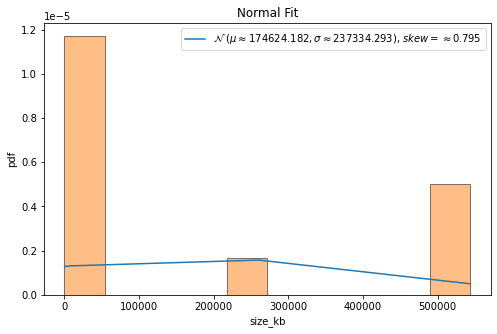


QQ plot 



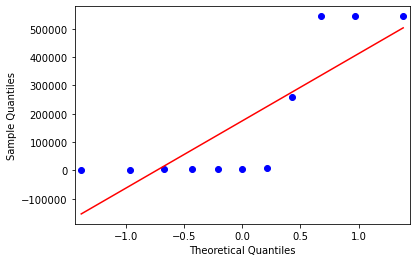


 Shapiro-Wilk Test 
 
Statistics=3.225, p=0.199395
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  consistency_time_milsecs
max value =  308466 min value =  18699
mean=  155552.27272727274 standard deviation=  120416.8367856882
left range=  95343.85433442864 right range=  215760.69112011683
1.136496161 1.26986999
data covered within this range=  9.09 %
percent left and right=  54.55 45.45



normality test :----

kurtosis value=  -1.757405394370742
skewness value=  0.09298933799566318


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


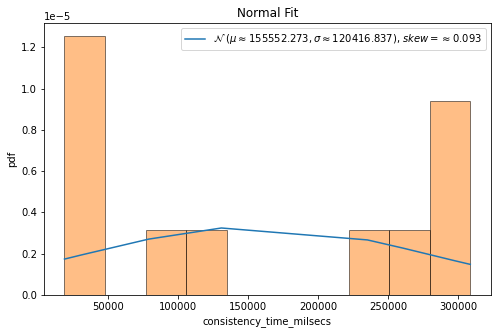


QQ plot 



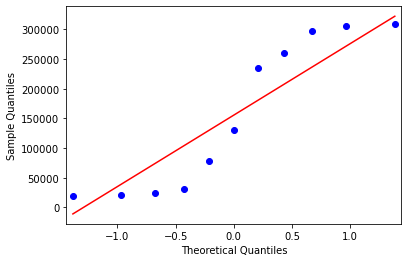


 Shapiro-Wilk Test 
 
Statistics=7.120, p=0.028436
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  consistency_size_kb
max value =  80439780 min value =  25593828
mean=  46017772.36363637 standard deviation=  16355575.005463459
left range=  37839984.860904634 right range=  54195559.8663681
1.248745113 2.104603942
data covered within this range=  45.45 %
percent left and right=  54.55 45.45



normality test :----

kurtosis value=  -0.28388492072638005
skewness value=  0.774847373068386


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


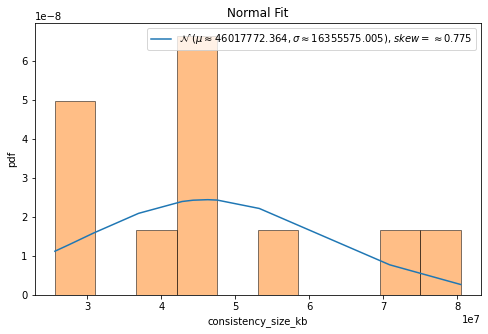


QQ plot 



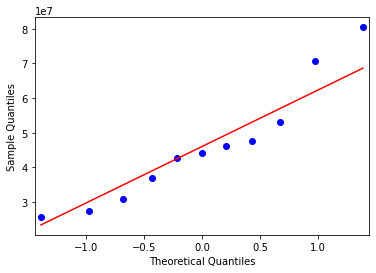


 Shapiro-Wilk Test 
 
Statistics=2.170, p=0.337950
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  realisation_time_milsecs
11
max value =  1475096 min value =  7085
mean=  310620.0909090909 standard deviation=  390213.05059100373
left range=  22947 right range=  1475096
data covered within this range=  90.91 %
percent left and right=  72.73 27.27
data covered within 1 standard deviation=  90.91 %
data covered within 2 standard deviation=  90.91 %
data covered within 3 standard deviation=  100.0 %



normality test :----

kurtosis value=  4.301167100398284
skewness value=  2.292933254529315


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


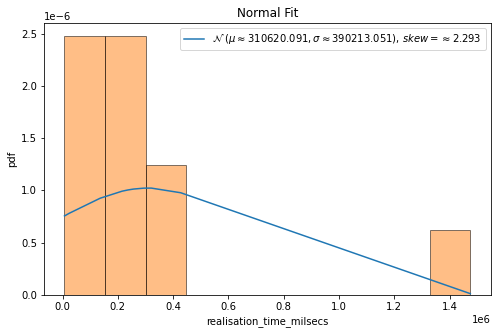


QQ plot 



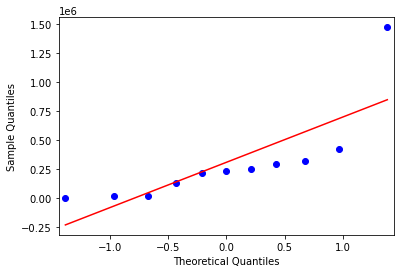


 Shapiro-Wilk Test 
 
Statistics=23.143, p=0.000009
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  realisation_size_kb
max value =  82943248 min value =  12093292
mean=  45130008.0 standard deviation=  19166726.356809538
left range=  35546644.82159523 right range=  54713371.17840477
1.72364938 1.972858552
data covered within this range=  54.55 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -0.4016839159217849
skewness value=  0.28214032897292834


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


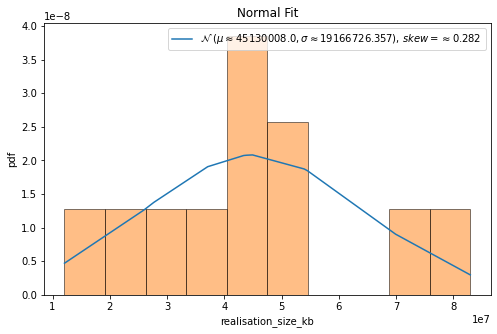


QQ plot 



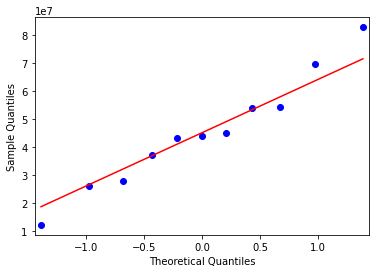


 Shapiro-Wilk Test 
 
Statistics=0.384, p=0.825188
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  classification_time_milsecs
max value =  307412 min value =  22263
mean=  164135.54545454544 standard deviation=  106256.76419226952
left range=  111007.16335841067 right range=  217263.9275506802
1.335186014 1.348398435
data covered within this range=  18.18 %
percent left and right=  45.45 54.55



normality test :----

kurtosis value=  -1.5030580219878564
skewness value=  -0.12947219741675856


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


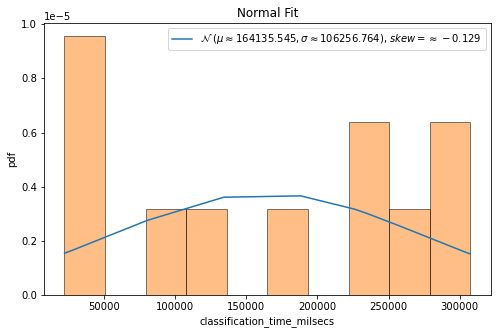


QQ plot 



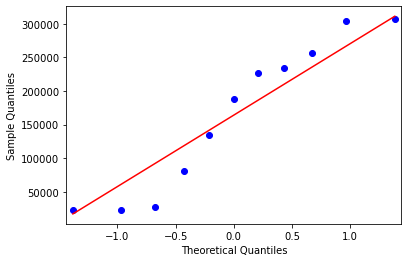


 Shapiro-Wilk Test 
 
Statistics=3.299, p=0.192158
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  classification_size_kb
max value =  82494408 min value =  25710696
mean=  45635102.54545455 standard deviation=  16500772.078988593
left range=  37384716.50596025 right range=  53885488.584948845
1.207483289 2.233792775
data covered within this range=  54.55 %
percent left and right=  72.73 27.27



normality test :----

kurtosis value=  0.06742935509458725
skewness value=  0.9550630061479477


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


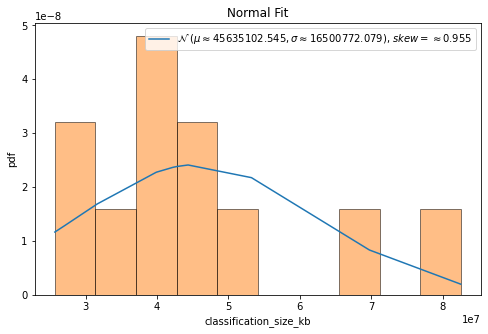


QQ plot 



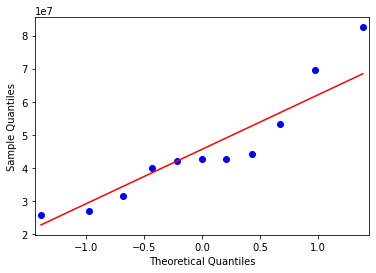


 Shapiro-Wilk Test 
 
Statistics=3.648, p=0.161400
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  SOV
max value =  1757533 min value =  306
mean=  566767.2727272727 standard deviation=  770924.3024016502
left range=  181305.1215264476 right range=  952229.4239280978
0.734781964 1.544594876
data covered within this range=  9.09 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -1.270437842397412
skewness value=  0.7713573004779257


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


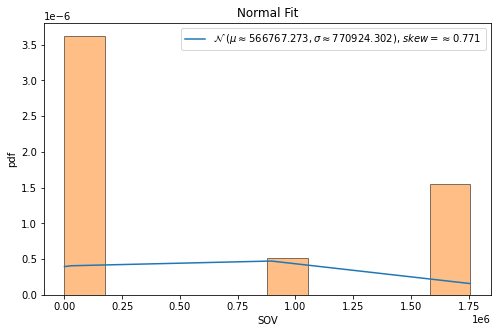


QQ plot 



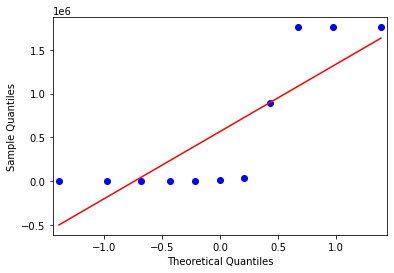


 Shapiro-Wilk Test 
 
Statistics=3.317, p=0.190471
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  ENR
max value =  20.76095060577819 min value =  3.2511910055262656
mean=  7.658575103122786 standard deviation=  5.639060974918708
left range=  4.839044615663432 right range=  10.478105590582139
0.78158121 2.323503073
data covered within this range=  0.0 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -0.02279540000171254
skewness value=  1.1087638224132268


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


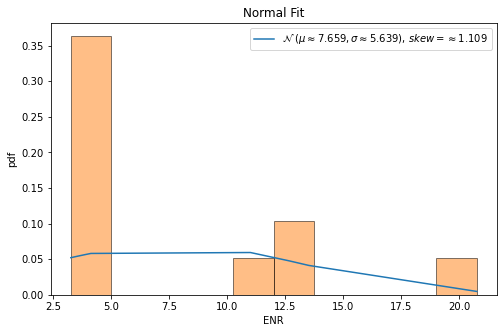


QQ plot 



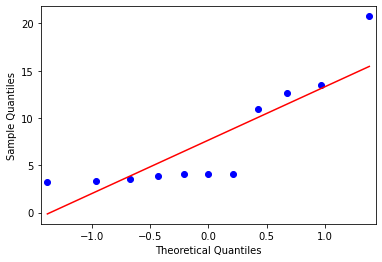


 Shapiro-Wilk Test 
 
Statistics=4.385, p=0.111659
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  EOG
max value =  4.032804196041203 min value =  2.0570272112738808
mean=  3.015162664031669 standard deviation=  0.6786622648746484
left range=  2.6758315315943446 right range=  3.354493796468993
1.411800099 1.499481531
data covered within this range=  54.55 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -1.131053527009224
skewness value=  0.2699674208555712


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


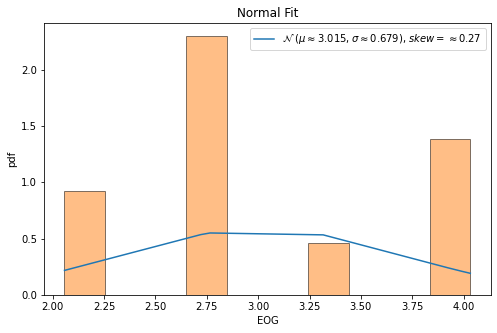


QQ plot 



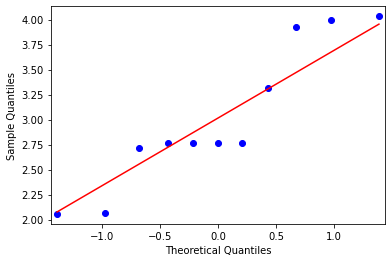


 Shapiro-Wilk Test 
 
Statistics=1.007, p=0.604560
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  CYC
max value =  5474400 min value =  2002
mean=  1773621.8181818181 standard deviation=  2373839.205721238
left range=  586702.215321199 right range=  2960541.421042437
0.74630995 1.558984355
data covered within this range=  9.09 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -1.2198251647120573
skewness value=  0.802460413505814


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


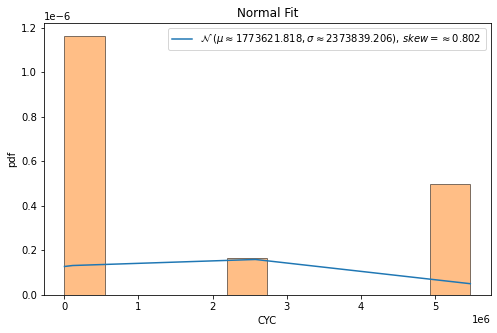


QQ plot 



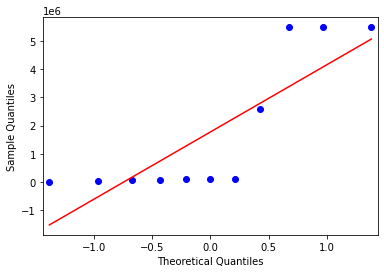


 Shapiro-Wilk Test 
 
Statistics=3.200, p=0.201911
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  HGCI
max value =  930 min value =  3
mean=  304.72727272727275 standard deviation=  404.0648217369204
left range=  102.69486185881254 right range=  506.75968359573295
0.746729872 1.547456481
data covered within this range=  9.09 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -1.2829740455353813
skewness value=  0.763597591315775


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


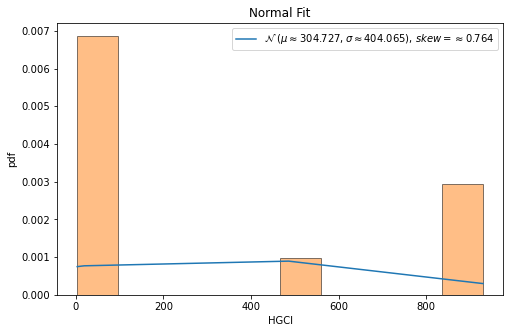


QQ plot 



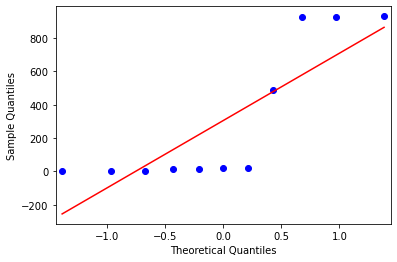


 Shapiro-Wilk Test 
 
Statistics=3.352, p=0.187114
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  ESUB
max value =  0.17496962332928312 min value =  0.0
mean=  0.07688964236013764 standard deviation=  0.06424853346963855
left range=  0.04476537562531836 right range=  0.10901390909495691
1.196753267 1.526571513
data covered within this range=  27.27 %
percent left and right=  45.45 54.55



normality test :----

kurtosis value=  -1.5414212883603309
skewness value=  -0.06735258450849221


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


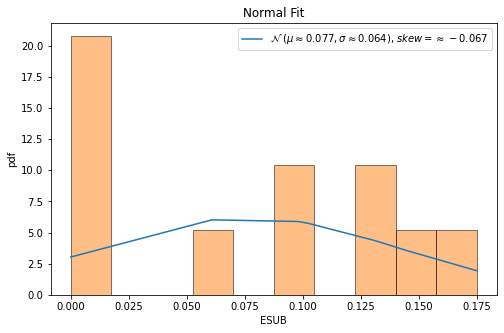


QQ plot 



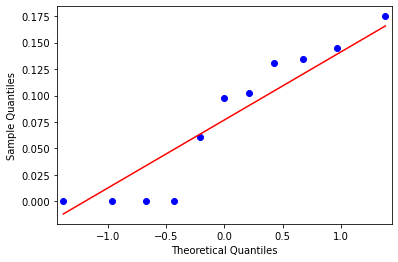


 Shapiro-Wilk Test 
 
Statistics=3.686, p=0.158337
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  ELCLSPRT
max value =  0.9935064935064936 min value =  0.4856361149110807
mean=  0.861647201435487 standard deviation=  0.14440156149345784
left range=  0.7894464206887581 right range=  0.9338479821822159
2.603926735 0.913143118
data covered within this range=  36.36 %
percent left and right=  45.45 54.55



normality test :----

kurtosis value=  1.412471910915353
skewness value=  -1.4102029757201202


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


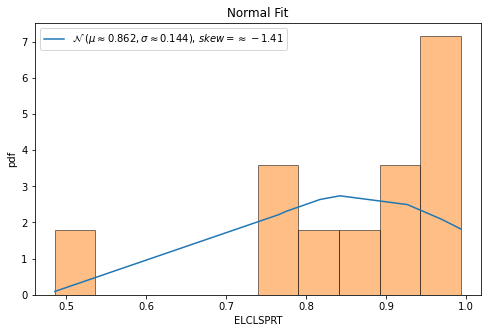


QQ plot 



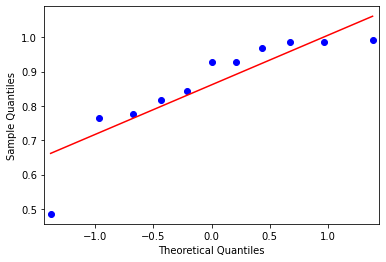


 Shapiro-Wilk Test 
 
Statistics=9.637, p=0.008078
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  ELAXPRT
max value =  0.920863309352518 min value =  0.3875968992248062
mean=  0.7735860719522435 standard deviation=  0.14632680844342524
left range=  0.7004226677305309 right range=  0.8467494761739561
2.637856841 1.006495248
data covered within this range=  45.45 %
percent left and right=  45.45 54.55



normality test :----

kurtosis value=  1.6721391959155598
skewness value=  -1.4153145093875412


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


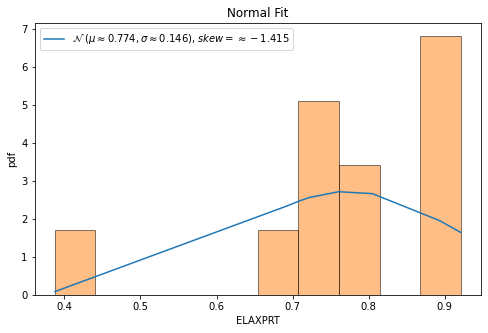


QQ plot 



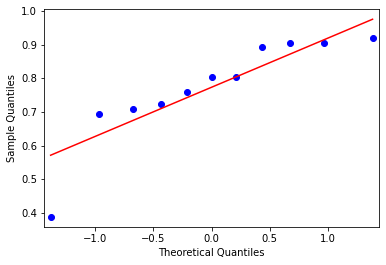


 Shapiro-Wilk Test 
 
Statistics=10.315, p=0.005757
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  IHR
max value =  1430266 min value =  0
mean=  428358.0909090909 standard deviation=  585749.6797763382
left range=  135483.2510209218 right range=  721232.93079726
0.73129889 1.710471117
data covered within this range=  9.09 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -1.234195211817227
skewness value=  0.7800159731779873


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


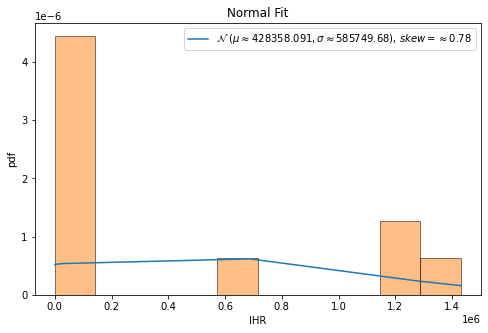


QQ plot 



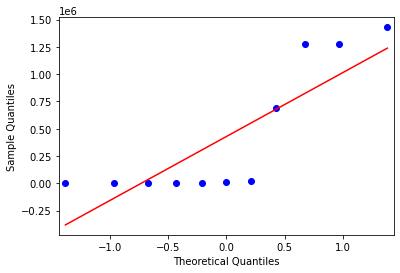


 Shapiro-Wilk Test 
 
Statistics=3.163, p=0.205618
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  IIR
max value =  867968 min value =  0
mean=  159432.36363636365 standard deviation=  334025.64646507794
left range=  -7580.459596175322 right range=  326445.18686890265
0.477305756 2.121201303
data covered within this range=  81.82 %
percent left and right=  81.82 18.18



normality test :----

kurtosis value=  0.7215234744053594
skewness value=  1.6494762008776394


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


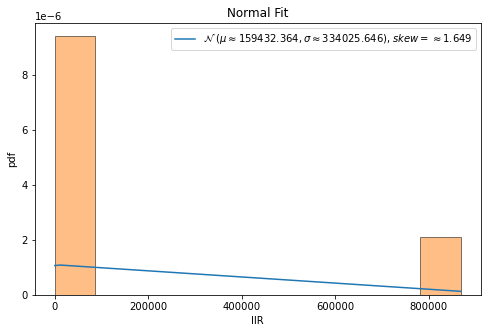


QQ plot 



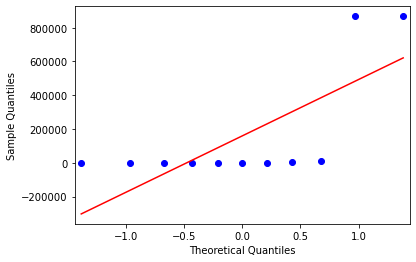


 Shapiro-Wilk Test 
 
Statistics=9.706, p=0.007805
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  ITR
max value =  204650 min value =  0
mean=  46527.90909090909 standard deviation=  79554.64264888465
left range=  6750.587766466764 right range=  86305.23041535141
0.584854731 1.98759099
data covered within this range=  0.0 %
percent left and right=  72.73 27.27



normality test :----

kurtosis value=  -0.06465504846445036
skewness value=  1.3118846026020377


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


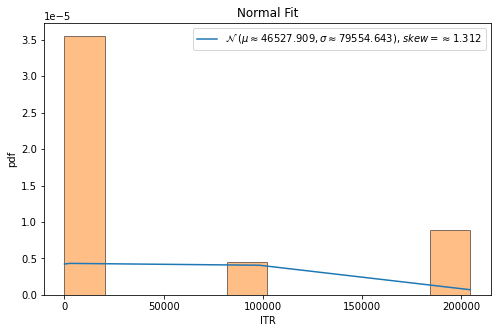


QQ plot 



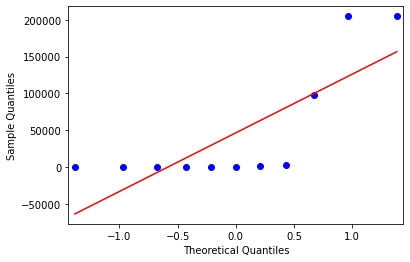


 Shapiro-Wilk Test 
 
Statistics=5.629, p=0.059935
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  IND
max value =  513096 min value =  1
mean=  163301.36363636365 standard deviation=  225059.78667952077
left range=  50771.470296603264 right range=  275831.256976124
0.725586592 1.554229841
data covered within this range=  9.09 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -1.236806865611174
skewness value=  0.7920033535447545


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


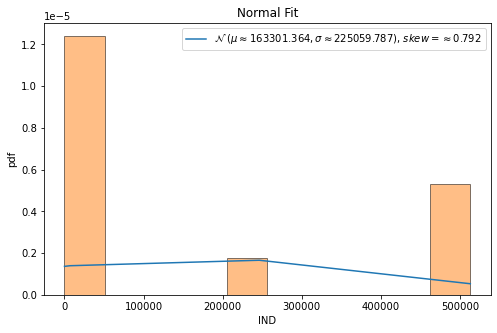


QQ plot 



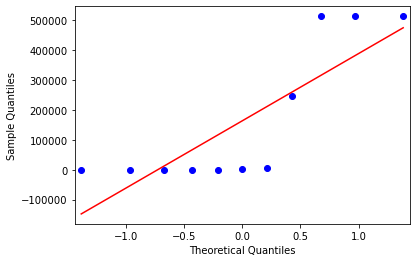


 Shapiro-Wilk Test 
 
Statistics=3.234, p=0.198489
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  aNOC
max value =  0.8620622378304555 min value =  0.7011494252873564
mean=  0.7823146764718673 standard deviation=  0.054529829691513876
left range=  0.7550497616261103 right range=  0.8095795913176242
1.488455982 1.462457554
data covered within this range=  45.45 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -1.1206945883831576
skewness value=  0.09949998197362654


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


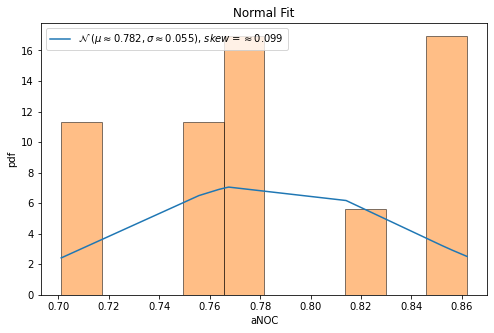


QQ plot 



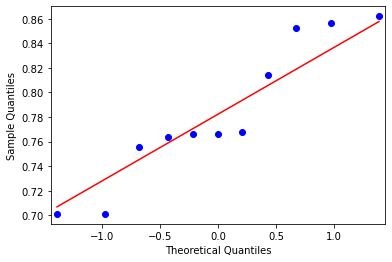


 Shapiro-Wilk Test 
 
Statistics=0.757, p=0.684867
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  mNOC
max value =  1586 min value =  10
mean=  492.0 standard deviation=  688.6207558987352
left range=  147.6896220506324 right range=  836.3103779493676
0.699949858 1.588682872
data covered within this range=  9.09 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -1.1113353532257746
skewness value=  0.8770197888478083


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


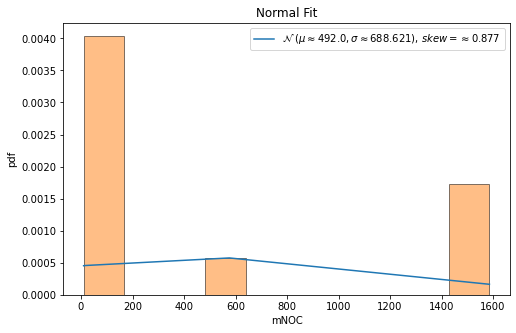


QQ plot 



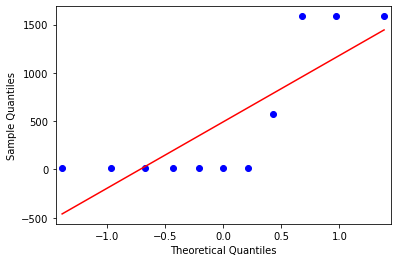


 Shapiro-Wilk Test 
 
Statistics=3.126, p=0.209537
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  tNOC
max value =  8837 min value =  121
mean=  2519.7272727272725 standard deviation=  3352.686659190021
left range=  843.383943132262 right range=  4196.070602322283
0.715464198 1.884241914
data covered within this range=  9.09 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -0.8352980288382001
skewness value=  0.9437530742907441


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


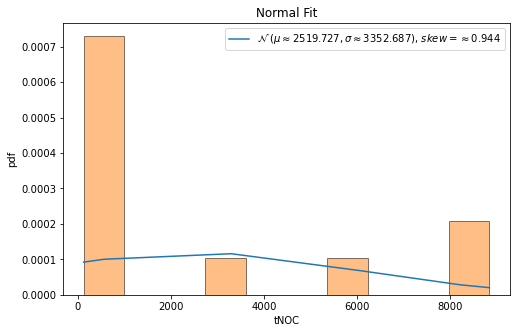


QQ plot 



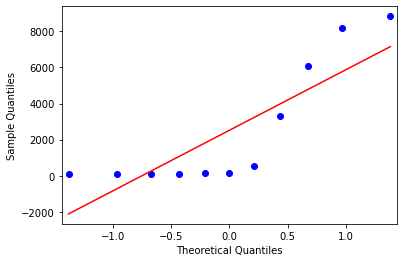


 Shapiro-Wilk Test 
 
Statistics=2.888, p=0.236008
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  aCID
max value =  4605.769230769231 min value =  3.081967213114754
mean=  1437.523254194607 standard deviation=  1964.648391897533
left range=  455.19905824584055 right range=  2419.8474501433734
0.730126211 1.612627476
data covered within this range=  9.09 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -1.231465615938285
skewness value=  0.7914393740942318


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


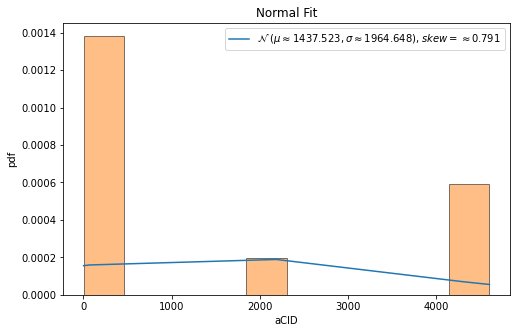


QQ plot 



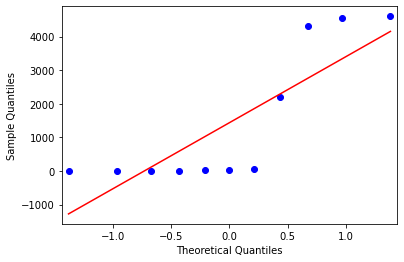


 Shapiro-Wilk Test 
 
Statistics=3.204, p=0.201470
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  mCID
max value =  196042 min value =  35
mean=  62841.72727272727 standard deviation=  85631.49169243214
left range=  20025.9814265112 right range=  105657.47311894334
0.733453617 1.555505692
data covered within this range=  9.09 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -1.2324177521571054
skewness value=  0.7948405485999245


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


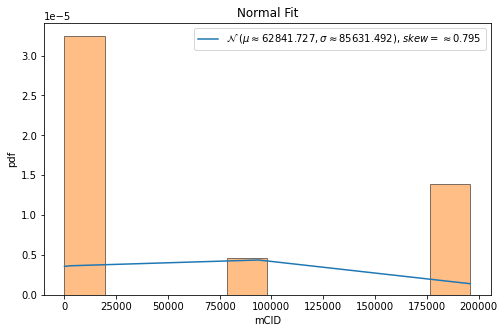


QQ plot 



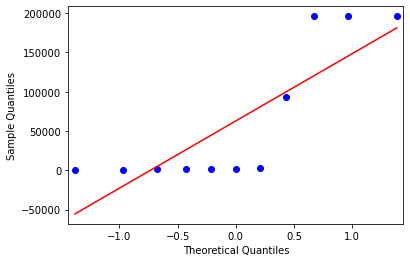


 Shapiro-Wilk Test 
 
Statistics=3.225, p=0.199349
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  tCID
max value =  718500 min value =  2256
mean=  267341.63636363635 standard deviation=  290180.51447904337
left range=  122251.37912411467 right range=  412431.89360315807
0.913519768 1.554750719
data covered within this range=  9.09 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -1.193144516631844
skewness value=  0.7645836474982237


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


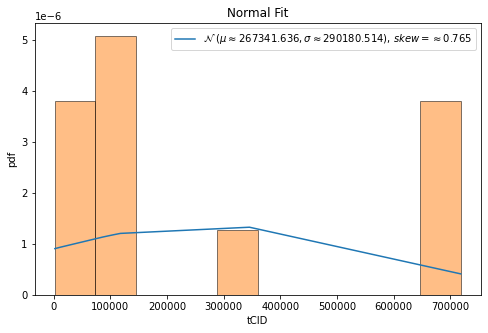


QQ plot 



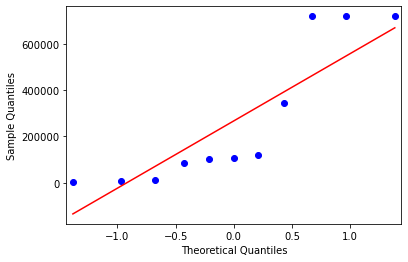


 Shapiro-Wilk Test 
 
Statistics=2.895, p=0.235205
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  aCOD
max value =  20.742830496619266 min value =  3.6557377049180326
mean=  13.084448950463774 standard deviation=  3.7807013803094356
left range=  11.194098260309056 right range=  14.97479964061849
2.493905309 2.025651004
data covered within this range=  63.64 %
percent left and right=  27.27 72.73



normality test :----

kurtosis value=  2.0624744055112316
skewness value=  -0.6571224098189838


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


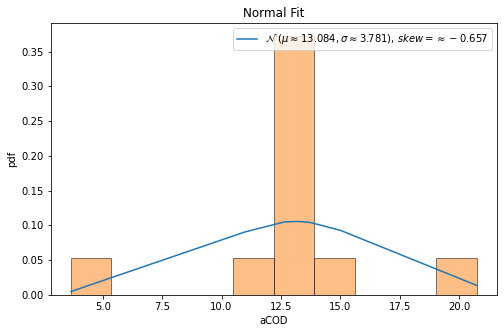


QQ plot 



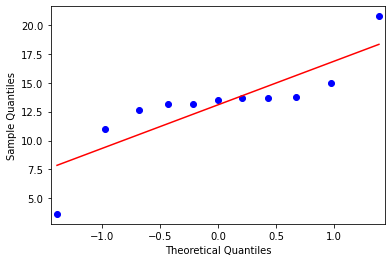


 Shapiro-Wilk Test 
 
Statistics=6.892, p=0.031872
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  tCOD
max value =  121708 min value =  2158
mean=  40697.181818181816 standard deviation=  51281.13490060662
left range=  15056.614367878505 right range=  66337.74926848513
0.751527475 1.579739184
data covered within this range=  0.0 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -1.539184796067103
skewness value=  0.6250147917936354


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


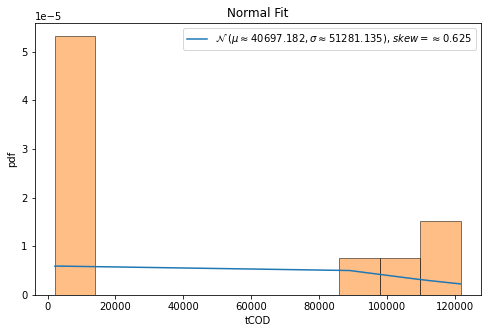


QQ plot 



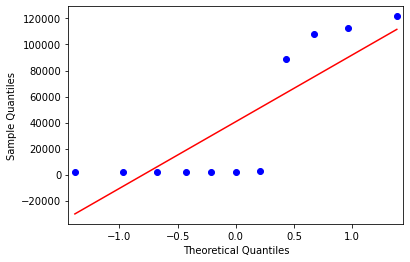


 Shapiro-Wilk Test 
 
Statistics=4.922, p=0.085364
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  aNOP
max value =  1.4439890710382517 min value =  0.9936708860759492
mean=  1.1449277884441629 standard deviation=  0.15174371179834317
left range=  1.0690559325449913 right range=  1.2207996443433344
0.996791897 1.97083147
data covered within this range=  9.09 %
percent left and right=  54.55 45.45



normality test :----

kurtosis value=  -1.0798357799664604
skewness value=  0.4761433024510329


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


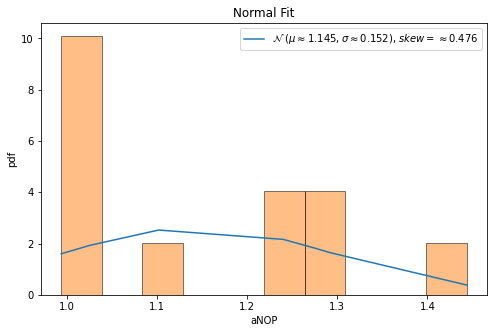


QQ plot 



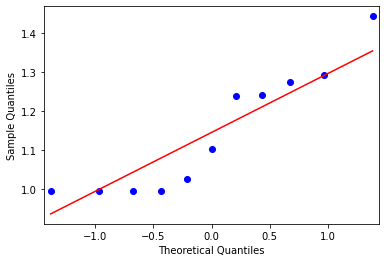


 Shapiro-Wilk Test 
 
Statistics=1.339, p=0.511994
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  mNOP
max value =  454 min value =  1
mean=  108.18181818181819 standard deviation=  173.84361738581353
left range=  21.26000948891142 right range=  195.10362687472497
0.616541578 1.989248654
data covered within this range=  0.0 %
percent left and right=  72.73 27.27



normality test :----

kurtosis value=  -0.7144503999609073
skewness value=  1.085942227199378


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


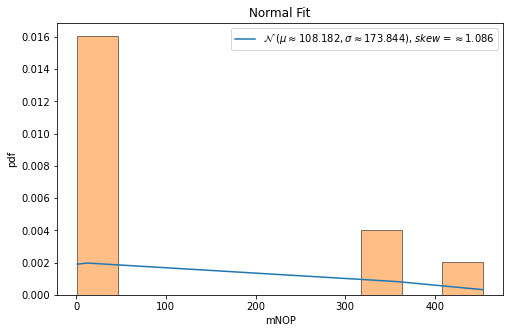


QQ plot 



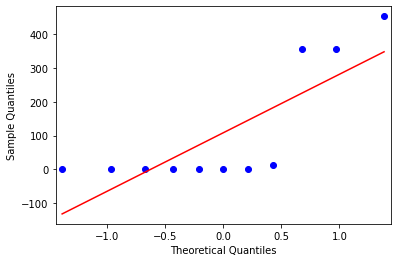


 Shapiro-Wilk Test 
 
Statistics=3.626, p=0.163145
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  tNOP
max value =  13245 min value =  157
mean=  3896.0 standard deviation=  5115.4623713528845
left range=  1338.2688143235578 right range=  6453.731185676443
0.730921221 1.82759628
data covered within this range=  9.09 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -0.9890945553738537
skewness value=  0.880839677469952


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


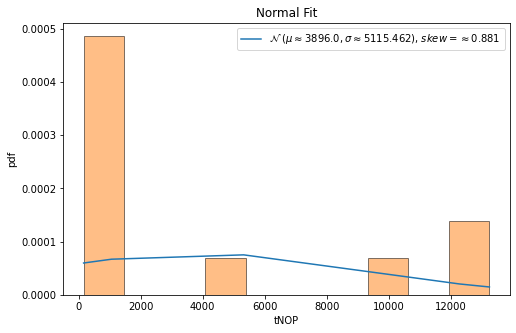


QQ plot 



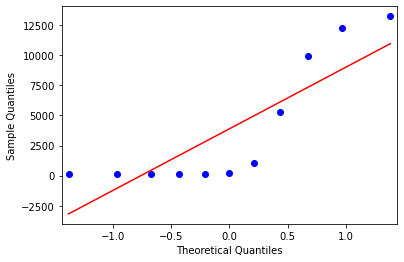


 Shapiro-Wilk Test 
 
Statistics=2.800, p=0.246627
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  CONJP
max value =  0.4231 min value =  0.1542
mean=  0.31277272727272726 standard deviation=  0.11037072315123073
left range=  0.2575873656971119 right range=  0.36795808884834263
1.436728172 0.999606323
data covered within this range=  9.09 %
percent left and right=  45.45 54.55



normality test :----

kurtosis value=  -1.6498510921286411
skewness value=  -0.35820803813624436


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


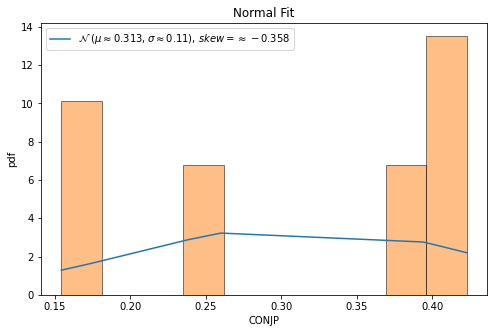


QQ plot 



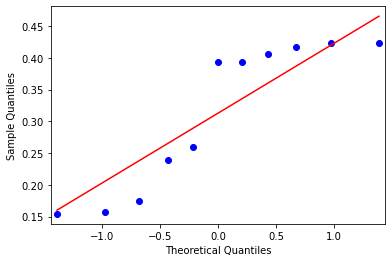


 Shapiro-Wilk Test 
 
Statistics=5.574, p=0.061605
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  DISJ
11
max value =  97 min value =  0
mean=  16.0 standard deviation=  27.392766132021723
left range=  0 right range=  97
data covered within this range=  100.0 %
percent left and right=  63.64 36.36
data covered within 1 standard deviation=  90.91 %
data covered within 2 standard deviation=  90.91 %
data covered within 3 standard deviation=  100.0 %



normality test :----

kurtosis value=  4.007507840035736
skewness value=  2.2547644595107035


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


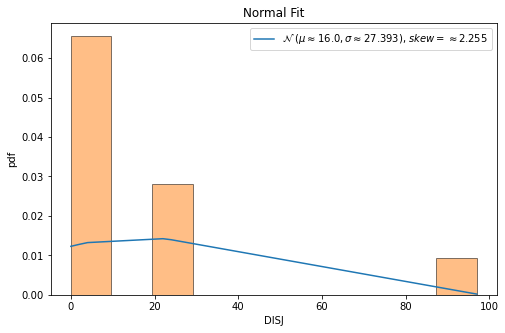


QQ plot 



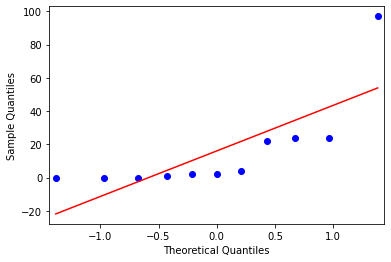


 Shapiro-Wilk Test 
 
Statistics=22.222, p=0.000015
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  DISJP
11
max value =  0.2008 min value =  0.0
mean=  0.03383636363636364 standard deviation=  0.057323377314816855
left range=  0.0 right range=  0.2008
data covered within this range=  100.0 %
percent left and right=  72.73 27.27
data covered within 1 standard deviation=  90.91 %
data covered within 2 standard deviation=  90.91 %
data covered within 3 standard deviation=  100.0 %



normality test :----

kurtosis value=  3.6091820542000983
skewness value=  2.1608011589410565


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


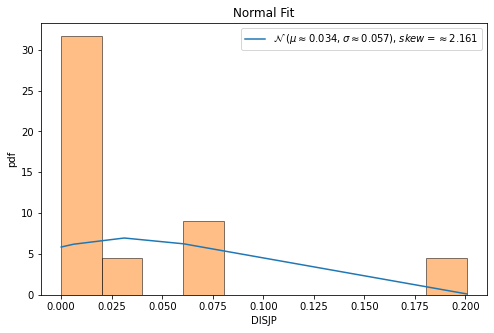


QQ plot 



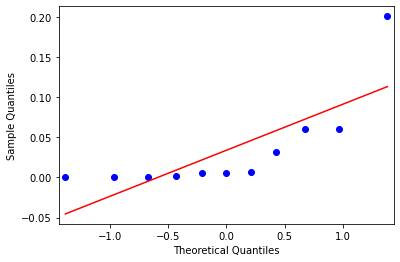


 Shapiro-Wilk Test 
 
Statistics=20.602, p=0.000034
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  EF
max value =  1494 min value =  8
mean=  472.54545454545456 standard deviation=  637.8408698152006
left range=  153.62501963785428 right range=  791.4658894530548
0.728309327 1.601425361
data covered within this range=  9.09 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -1.2265380029384463
skewness value=  0.795193683989101


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


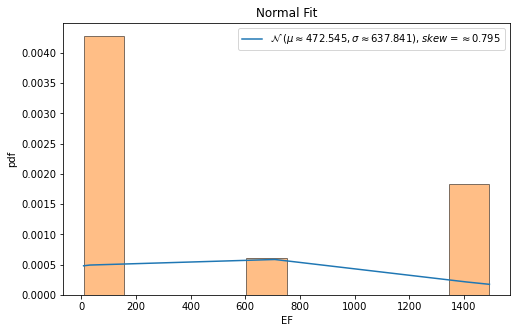


QQ plot 



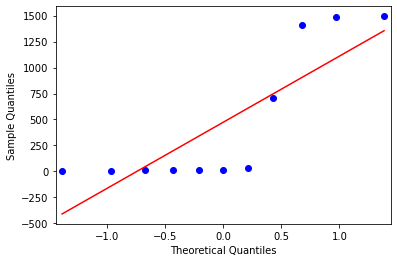


 Shapiro-Wilk Test 
 
Statistics=3.198, p=0.202132
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  EFP
max value =  0.5417 min value =  0.0642
mean=  0.35863636363636364 standard deviation=  0.13281029035108874
left range=  0.2922312184608193 right range=  0.425041508811908
2.216969505 1.37838443
data covered within this range=  36.36 %
percent left and right=  45.45 54.55



normality test :----

kurtosis value=  -0.12434454367062209
skewness value=  -0.6364642544050283


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


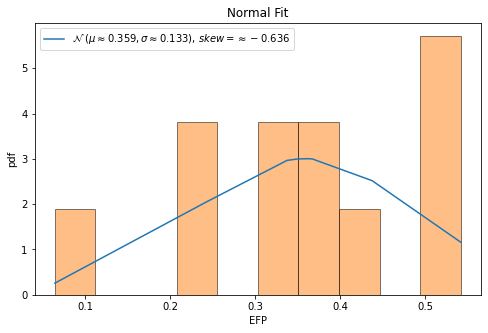


QQ plot 



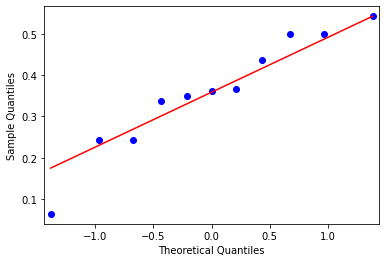


 Shapiro-Wilk Test 
 
Statistics=1.787, p=0.409185
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  SELF
max value =  1 min value =  0
mean=  0.36363636363636365 standard deviation=  0.48104569292083466
left range=  0.12311351717594632 right range=  0.604159210096781
0.755928946 1.322875656
data covered within this range=  0.0 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -1.6785714285714286
skewness value=  0.5669467095138407


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


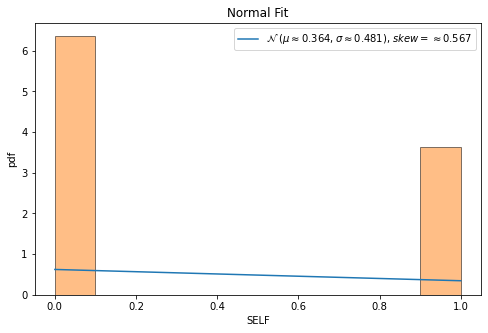


QQ plot 



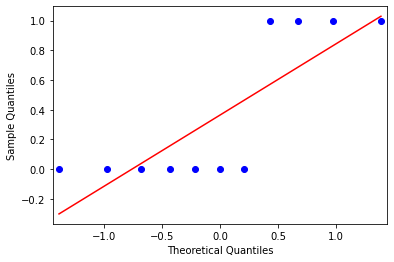


 Shapiro-Wilk Test 
 
Statistics=6.668, p=0.035647
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  SELFP
max value =  0.0385 min value =  0.0
mean=  0.012509090909090909 standard deviation=  0.016731649624993756
left range=  0.004143266096594031 right range=  0.020874915721587787
0.74763046 1.553397882
data covered within this range=  0.0 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -1.510074008360016
skewness value=  0.6341838724953646


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


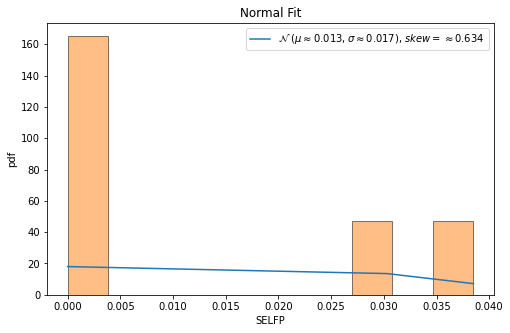


QQ plot 



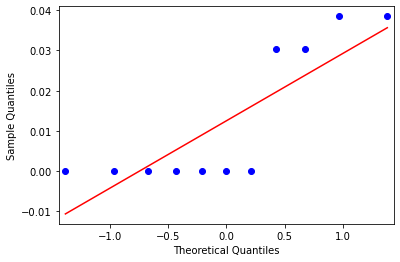


 Shapiro-Wilk Test 
 
Statistics=4.631, p=0.098721
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  MNCAR
11
max value =  39 min value =  0
mean=  4.545454545454546 standard deviation=  10.965761892558925
left range=  0 right range=  39
data covered within this range=  100.0 %
percent left and right=  90.91 9.09
data covered within 1 standard deviation=  90.91 %
data covered within 2 standard deviation=  90.91 %
data covered within 3 standard deviation=  90.91 %



normality test :----

kurtosis value=  5.8756045204945675
skewness value=  2.7805964828598606


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


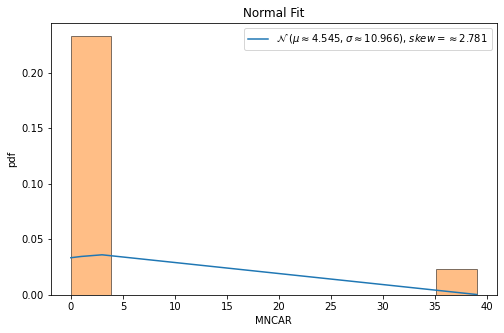


QQ plot 



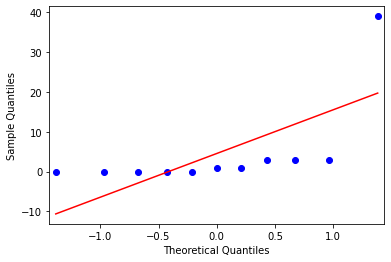


 Shapiro-Wilk Test 
 
Statistics=30.208, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  MNCARP
max value =  0.0807 min value =  0.0
mean=  0.013045454545454544 standard deviation=  0.024267949819252385
left range=  0.0009114796358283515 right range=  0.025179429455080737
0.537558988 2.787814626
data covered within this range=  0.0 %
percent left and right=  72.73 27.27



normality test :----

kurtosis value=  2.5936353522187225
skewness value=  1.9288210501141267


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


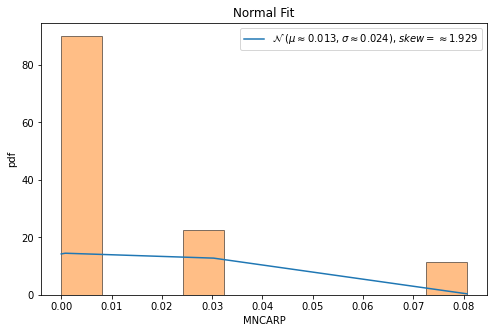


QQ plot 



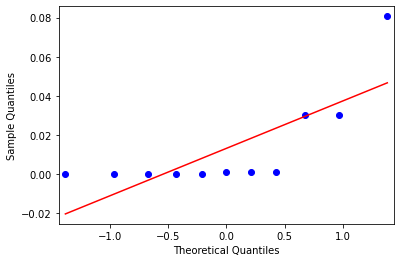


 Shapiro-Wilk Test 
 
Statistics=16.432, p=0.000270
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  MXCAR
11
max value =  54 min value =  0
mean=  5.181818181818182 standard deviation=  15.443846564059578
left range=  0 right range=  54
data covered within this range=  100.0 %
percent left and right=  90.91 9.09
data covered within 1 standard deviation=  90.91 %
data covered within 2 standard deviation=  90.91 %
data covered within 3 standard deviation=  90.91 %



normality test :----

kurtosis value=  6.08589315687029
skewness value=  2.8418952368986177


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


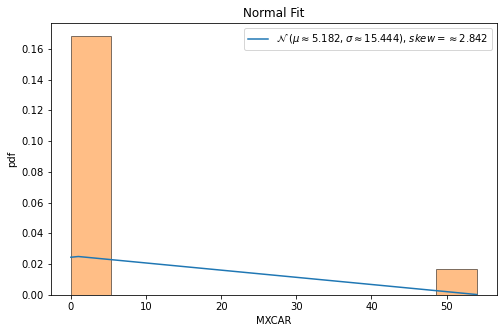


QQ plot 



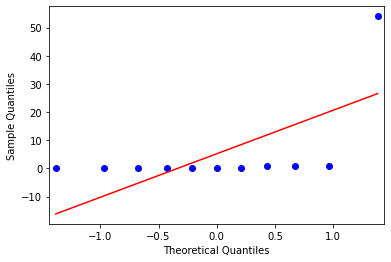


 Shapiro-Wilk Test 
 
Statistics=31.091, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  MXCARP
11
max value =  0.1118 min value =  0.0
mean=  0.01850909090909091 standard deviation=  0.03239024697611233
left range=  0.0 right range=  0.1118
data covered within this range=  100.0 %
percent left and right=  63.64 36.36
data covered within 1 standard deviation=  90.91 %
data covered within 2 standard deviation=  90.91 %
data covered within 3 standard deviation=  100.0 %



normality test :----

kurtosis value=  3.3293474635341003
skewness value=  2.067606720973015


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


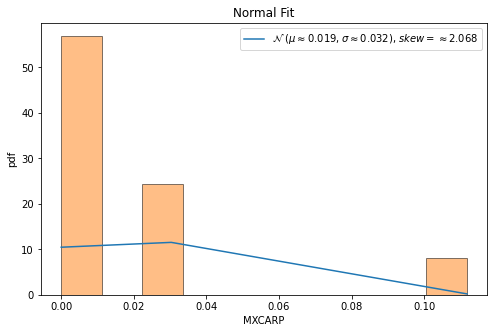


QQ plot 



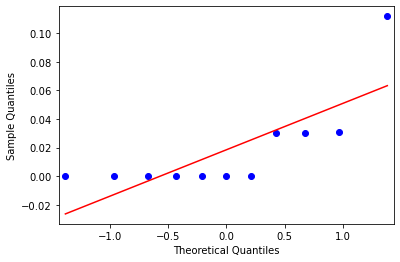


 Shapiro-Wilk Test 
 
Statistics=19.229, p=0.000067
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  CAR
max value =  1843 min value =  0
mean=  557.0909090909091 standard deviation=  760.7243503333405
left range=  176.7287339242389 right range=  937.4530842575793
0.732316389 1.690374563
data covered within this range=  0.0 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -1.258153890582821
skewness value=  0.7542745190603215


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


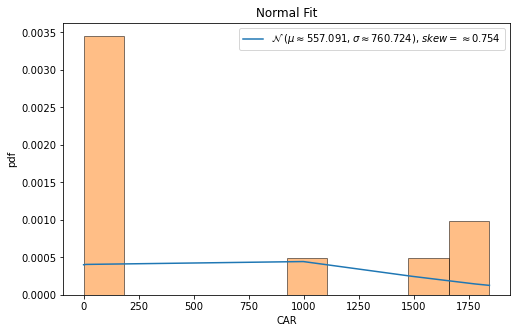


QQ plot 



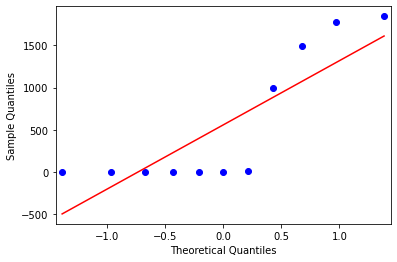


 Shapiro-Wilk Test 
 
Statistics=3.169, p=0.205070
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  CARP
max value =  0.4933 min value =  0.0
mean=  0.17634545454545456 standard deviation=  0.19920444666283918
left range=  0.07674323121403497 right range=  0.27594767787687413
0.885248585 1.591101759
data covered within this range=  18.18 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -1.5246428279484328
skewness value=  0.5540380310000528


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


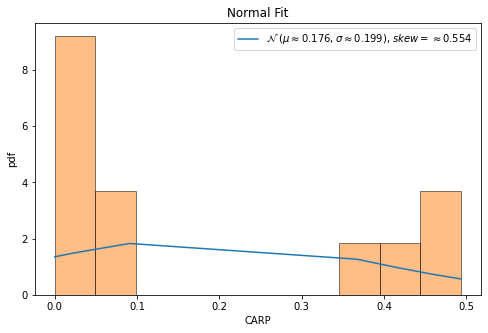


QQ plot 



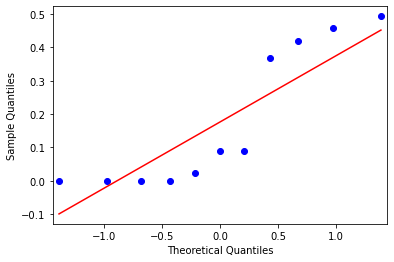


 Shapiro-Wilk Test 
 
Statistics=4.489, p=0.105982
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  OBPP
max value =  1.0 min value =  0.58
mean=  0.8945727272727274 standard deviation=  0.11495751065588689
left range=  0.837093971944784 right range=  0.9520514826006709
2.736426054 0.917097736
data covered within this range=  54.55 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  2.3549130907194353
skewness value=  -1.58444490830116


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


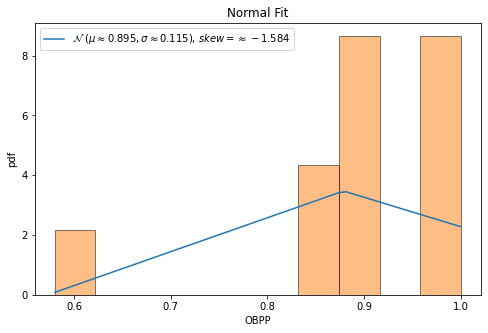


QQ plot 



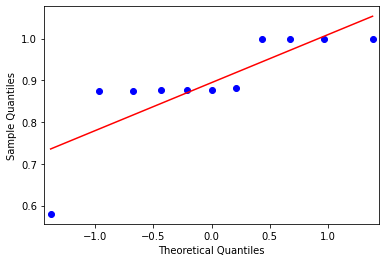


 Shapiro-Wilk Test 
 
Statistics=13.203, p=0.001358
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  DTPP
max value =  0.42 min value =  0.0
mean=  0.10542727272727272 standard deviation=  0.11495751065588687
left range=  0.04794851739932928 right range=  0.16290602805521615
0.917097736 2.736426054
data covered within this range=  54.55 %
percent left and right=  36.36 63.64



normality test :----

kurtosis value=  2.354913090719432
skewness value=  1.584444908301157


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


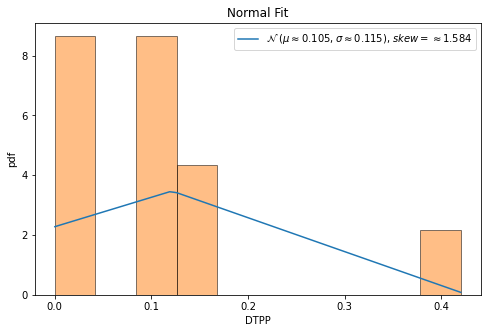


QQ plot 



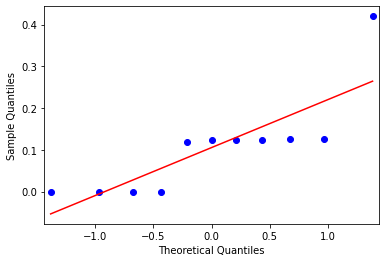


 Shapiro-Wilk Test 
 
Statistics=13.203, p=0.001358
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  SYM
max value =  2 min value =  0
mean=  0.7272727272727273 standard deviation=  0.9620913858416694
left range=  0.24622703435189258 right range=  1.208318420193562
0.755928946 1.322875656
data covered within this range=  0.0 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -1.678571428571429
skewness value=  0.5669467095138405


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


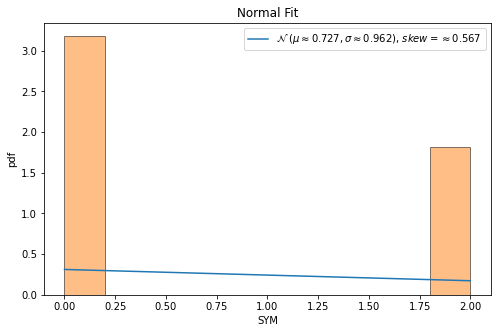


QQ plot 



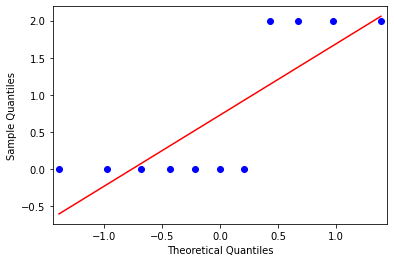


 Shapiro-Wilk Test 
 
Statistics=6.668, p=0.035647
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  SYMP
max value =  0.0206 min value =  0.0
mean=  0.007200000000000001 standard deviation=  0.009529285006089004
left range=  0.0024353574969554984 right range=  0.011964642503044503
0.755565606 1.406191544
data covered within this range=  0.0 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -1.6708101444593437
skewness value=  0.5699822497314551


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


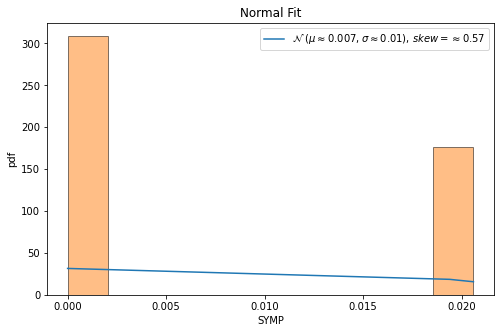


QQ plot 



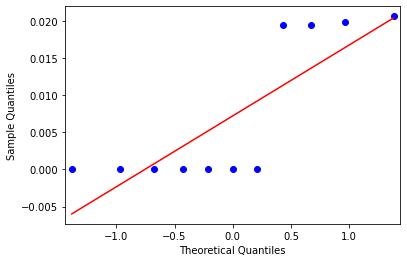


 Shapiro-Wilk Test 
 
Statistics=6.550, p=0.037823
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  REFLE
max value =  1 min value =  0
mean=  0.45454545454545453 standard deviation=  0.49792959773196915
left range=  0.20558065567946995 right range=  0.7035102534114391
0.912870929 1.095445115
data covered within this range=  0.0 %
percent left and right=  54.55 45.45



normality test :----

kurtosis value=  -1.9666666666666666
skewness value=  0.1825741858350553


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


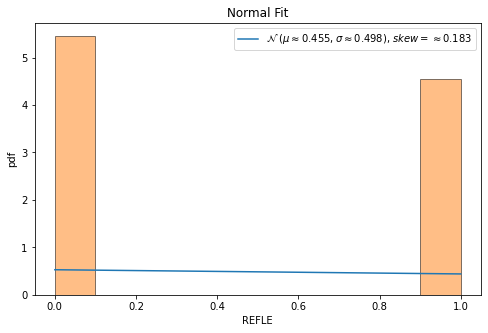


QQ plot 



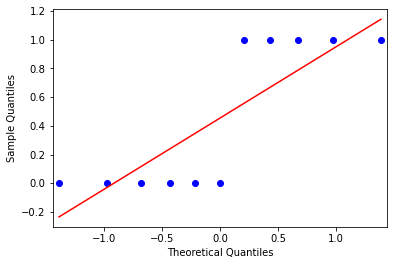


 Shapiro-Wilk Test 
 
Statistics=13.123, p=0.001414
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  RANG
max value =  61 min value =  0
mean=  34.0 standard deviation=  26.142963593566538
left range=  20.928518203216733 right range=  47.07148179678327
1.300541152 1.03278268
data covered within this range=  18.18 %
percent left and right=  36.36 63.64



normality test :----

kurtosis value=  -1.657107379639225
skewness value=  -0.4656390356806208


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


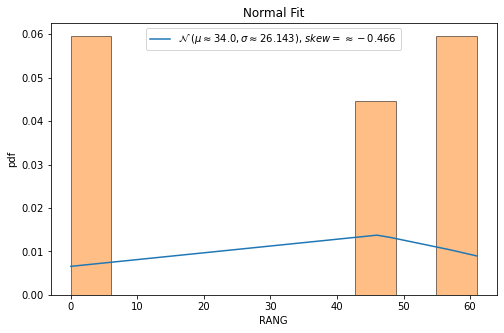


QQ plot 



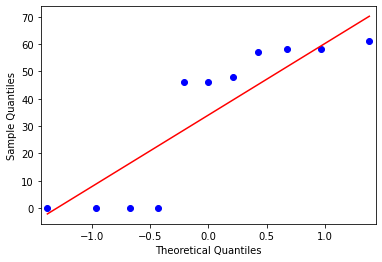


 Shapiro-Wilk Test 
 
Statistics=5.979, p=0.050314
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  CAL_TIME
max value =  929310 min value =  450
mean=  253535.45454545456 standard deviation=  364997.8611983073
left range=  71036.5239463009 right range=  436034.3851446082
0.69338887 1.85144796
data covered within this range=  9.09 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -0.7099136657377643
skewness value=  0.9958434274296601


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


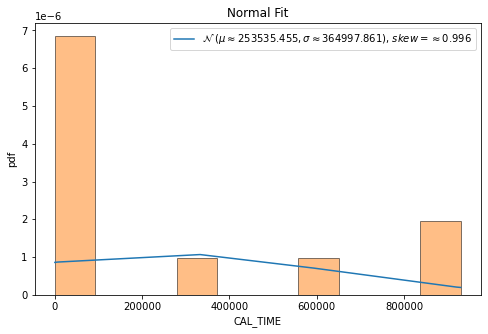


QQ plot 



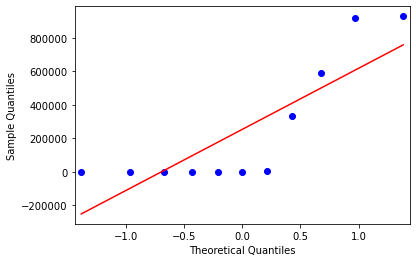


 Shapiro-Wilk Test 
 
Statistics=3.095, p=0.212826
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------



/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


In [244]:
#after easy time and memory clusering ,
#collect the medium ones 

     #**** follow the same notation as explained above in 'easy_tim_easy_memory' category wherever required*******
    
from matplotlib import pyplot as plt
%matplotlib inline
#%matplotlib qt 
import scipy
from scipy.stats import norm
from statsmodels.graphics.gofplots import qqplot
import statistics
from scipy.stats import shapiro
from scipy.stats import normaltest
import math

#interquratile range 
def cal(sov_sort):
    p=0
    l=len(sov_sort)
    print(l)
    left=0
    right=0
    while  p < 90 :
        if p==0:
            if l % 2 ==0:
                left=( l /2)
                right=( l / 2) + 1
                p= round((((right -left +1) / l) * 100),2)
                
            else:
                left=math.floor( l /2)
                right=math.ceil(l/2) + 1
                p= round((((right -left +1) / l) * 100),2)
                
        else:
            if left % 2 !=0:
                left = math.ceil(left/2)
            else:
                left = left /2
            
            dist = l - right +1
            if dist % 2 !=0:
                right = right + math.ceil(dist/2)
            else:
                right = right + (dist /2)
                
            p= round((((right -left +1) / l) * 100),2)
             
        
    return left-1,right-1





print(df_easy_time_mem_feature_df.shape)
easy_time_mem_medium = df_easy_time_mem_feature_df[df_easy_time_mem_feature_df['label_mem']== 'medium']
print(easy_time_mem_medium.shape)  # contains the easy time medium memory ontology
prior_medium= round(easy_time_mem_medium.shape[0] / df_easy_time_mem_feature_df.shape[0] ,5)
                # fraction of easy time medium memory ontologies in easy time category
main_dict_etmm={}
main_dict_etmm_iqr={}

for i in range(len(cols_list)):
    if cols_list[i] in top_n_1:
        tmp_dict={}
        tmp_dict_iqr={}
        
        feature = cols_list[i]
        print("feature name= ",feature)
        
        sov=np.array(easy_time_mem_medium[feature])
        sov_1=(np.sort(sov))
        skew=scipy.stats.skew(sov)
        
        tmp_dict["skew"]=round(skew,4)
        tmp_dict_iqr["skew"]=round(skew,4)
        
        if -2 < skew and skew < 2:
        
            print("max value = ",np.max(sov),"min value = ",np.min(sov))
            tmp_dict["min"]=round(np.min(sov),9)
            tmp_dict["max"]=round(np.max(sov),9)
            min_val=np.min(sov)
            max_val=np.max(sov)

            mean = np.mean(sov)
            std = np.std(sov)
            print("mean= ",mean,"standard deviation= ",std)
            tmp_dict["mean"]=round(mean,9)
            tmp_dict["std"]=round(std,9)
            #gamma=2
            #rx= mean - ((1- prior_medium) *gamma * std) 
            #ry= mean + ((1- prior_medium) *gamma * std)
            l_weight=0.5
            r_weight=0.5
            rx= mean - (l_weight* std) 
            ry= mean + (r_weight* std)
            print("left range= ",rx,"right range= ", ry)
            tmp_dict["lw_i"]=round(l_weight,9)
            tmp_dict["rw_i"]=round(r_weight,9)
            tmp_dict["lr"]=round(rx,9)
            tmp_dict["rr"]=round(ry,9)

            min_val_w= round(((mean - min_val) /std ),9)
            max_val_w= round(((max_val - mean) /std ),9)
            print(min_val_w,max_val_w)
            tmp_dict["min_val_w"]=round(min_val_w,9)
            tmp_dict["max_val_w"]=round(max_val_w,9)


            val=(((rx <= sov) & (sov <= ry)).sum()) / easy_time_mem_medium.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within this range= ",v,"%")

            tmp_dict["percent_i"]=round(v,9)
            tmp_dict["percent_change"]=round(v,9)

            val=(((min_val <= sov) & (sov <= mean)).sum()) / easy_time_mem_medium.shape[0]
            percent_l =  round((val * 100 ),2)

            val=(((mean <= sov) & (sov <= max_val)).sum()) / easy_time_mem_medium.shape[0]
            percent_r =  round((val * 100 ),2)

            print("percent left and right= ",percent_l,percent_r)
            tmp_dict["percent_l"]=percent_l
            tmp_dict["percent_r"]=percent_r
            
            main_dict_etmm[feature]=tmp_dict
            
        else:
            
            left_index,right_index = cal(sov_1)
            #print(left_index,right_index)
            rx=sov_1[int(left_index)]
            ry=sov_1[int(right_index)]

            print("max value = ",np.max(sov),"min value = ",np.min(sov))
            
            tmp_dict_iqr["min"]=round(np.min(sov),9)
            tmp_dict_iqr["max"]=round(np.max(sov),9)
            min_val=np.min(sov)
            max_val=np.max(sov)
            
            
            
            mean = np.mean(sov)
            std = np.std(sov)
            print("mean= ",mean,"standard deviation= ",std)
            tmp_dict_iqr["mean"]=round(mean,9)
            tmp_dict_iqr["std"]=round(std,9)
            
            print("left range= ",rx,"right range= ", ry)
            tmp_dict_iqr["lw_i"]="null"
            tmp_dict_iqr["rw_i"]="null"
            tmp_dict_iqr["lr"]=round(rx,9)
            tmp_dict_iqr["rr"]=round(ry,9)
            
            
            tmp_dict_iqr["min_val_w"]="null"
            tmp_dict_iqr["max_val_w"]="null"
            tmp_dict_iqr["percent_i"]="null"
            val=(((rx <= sov) & (sov <= ry)).sum()) / easy_time_mem_medium.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within this range= ",v,"%")
            tmp_dict_iqr["percent_change"]=round(v,9)
            
            val=(((min_val <= sov) & (sov <= mean)).sum()) / easy_time_mem_medium.shape[0]
            percent_l =  round((val * 100 ),2)

            val=(((mean <= sov) & (sov <= max_val)).sum()) / easy_time_mem_medium.shape[0]
            percent_r =  round((val * 100 ),2)

            print("percent left and right= ",percent_l,percent_r)
            
            tmp_dict_iqr["percent_l"]=percent_l
            tmp_dict_iqr["percent_r"]=percent_r
            
            main_dict_etmm_iqr[feature]=tmp_dict_iqr

            
            # 68–95–99.7 rule, also known as the empirical rule

            # for 1*std
            left = mean - std
            right = mean + std
            val=(((left <= sov) & (sov <= right)).sum()) / easy_time_mem_medium.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 1 standard deviation= ",v,"%")
            
            # for 2*std
            left = mean - (2*std)
            right = mean + (2*std)
            val=(((left <= sov) & (sov <= right)).sum()) / easy_time_mem_medium.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 2 standard deviation= ",v,"%")
            


            # for 3*std
            left = mean - (3*std)
            right = mean + (3*std)
            val=(((left <= sov) & (sov <= right)).sum()) / easy_time_mem_medium.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 3 standard deviation= ",v,"%")
            
            
        print("\n\n")
        
        #normality test
        print("normality test :----\n")
        # kurtosis and skew function
        kurt=scipy.stats.kurtosis(sov)
        print("kurtosis value= ",kurt)
        
        
        print("skewness value= ",skew)
        
        
        
        #plotting graph for to see the skewess
        sov_1=np.sort(sov)
        fig, ax1 = plt.subplots(1, 1, figsize=(8,5))
        ax1.plot(sov_1, norm.pdf(sov_1, mean, std),label='$\mathcal{N}$ '+ f'$( \mu \\approx {round(mean,3)} , \sigma \\approx {round(std,3)})$, $ skew = \\approx {round(skew,3)}$')
        ax1.hist(sov_1,edgecolor='black',alpha=0.5,density= True)
        ax1.set_title("Normal Fit")
        ax1.set_xlabel(feature)
        ax1.set_ylabel("pdf")
        ax1.legend()
        #plt.savefig('/home/ritam/ontology_hardness/normal_curve_&_skewness/easy_time_medium_memory/'+str(feature)+'.jpeg')
        plt.show()
        
        # Quantile-Quantile Plot Nomrality check
        print("\nQQ plot \n")
        qqplot(sov_1, line='s')
        plt.show()
        
        #Statistical Normality Tests
        # Shapiro-Wilk Test
        print("\n Shapiro-Wilk Test \n ")
        #stat, p = shapiro(sov_1[0:4998])
        stat, p = normaltest(sov_1)
        print('Statistics=%.3f, p=%f' % (stat, p))
        
        alpha = 0.05
        if p > alpha:
            print('Sample looks Gaussian (fail to reject H0)')
        else:
            print('Sample does not look Gaussian (reject H0)')
            
        print("ends normality test ------------------------------------------------\n")
        
        

In [245]:
print(len(main_dict_etmm))
print(len(main_dict_etmm_iqr))
main_dict_etmm_iqr

44
6


{'realisation_time_milsecs': {'skew': 2.2929,
  'min': 7085,
  'max': 1475096,
  'mean': 310620.090909091,
  'std': 390213.050591004,
  'lw_i': 'null',
  'rw_i': 'null',
  'lr': 22947,
  'rr': 1475096,
  'min_val_w': 'null',
  'max_val_w': 'null',
  'percent_i': 'null',
  'percent_change': 90.91,
  'percent_l': 72.73,
  'percent_r': 27.27},
 'DISJ': {'skew': 2.2548,
  'min': 0,
  'max': 97,
  'mean': 16.0,
  'std': 27.392766132,
  'lw_i': 'null',
  'rw_i': 'null',
  'lr': 0,
  'rr': 97,
  'min_val_w': 'null',
  'max_val_w': 'null',
  'percent_i': 'null',
  'percent_change': 100.0,
  'percent_l': 63.64,
  'percent_r': 36.36},
 'DISJP': {'skew': 2.1608,
  'min': 0.0,
  'max': 0.2008,
  'mean': 0.033836364,
  'std': 0.057323377,
  'lw_i': 'null',
  'rw_i': 'null',
  'lr': 0.0,
  'rr': 0.2008,
  'min_val_w': 'null',
  'max_val_w': 'null',
  'percent_i': 'null',
  'percent_change': 100.0,
  'percent_l': 72.73,
  'percent_r': 27.27},
 'MNCAR': {'skew': 2.7806,
  'min': 0,
  'max': 39,
  'mea

In [246]:
#**** follow the same notation as explained above in 'easy_tim_easy_memory' category wherever required*******#
import copy

main_dict_cal_etmm={}
dec_rate=[(0.9,0.9)]
for i in range(len(dec_rate)):
 
    main_dict_cal_etmm=copy.deepcopy(main_dict_etmm)
    lower_r=dec_rate[i][0]
    high_r=dec_rate[i][1]
    for j in range (100):
        c=0
        for key,value in main_dict_cal_etmm.items():
            
            if value["percent_change"] < 90:
                
                lw_i_temp=value["lw_i"]
                rw_i_temp=value["rw_i"]
                if value["percent_l"] >= 50:
                    diff=value["min_val_w"] - lw_i_temp
                    frac = round(lower_r * diff, 9)  
                    
                    lw_i_temp= round(lw_i_temp + frac , 9)
                    main_dict_cal_etmm[key]["lw_i"]=lw_i_temp
                else:
                    diff=value["min_val_w"] - lw_i_temp
                    frac = round(high_r * diff, 9)  
                    
                    lw_i_temp= round(lw_i_temp + frac ,9 )
                    main_dict_cal_etmm[key]["lw_i"]=lw_i_temp

                if value["percent_r"] >= 50:
                    diff=value["max_val_w"] - rw_i_temp
                    frac = round(lower_r * diff, 9)  
                    
                    rw_i_temp= round(rw_i_temp + frac , 9 )
                    main_dict_cal_etmm[key]["rw_i"]=rw_i_temp
                else:
                    diff=value["max_val_w"] - rw_i_temp
                    frac = round(high_r * diff, 9)  
                    
                    rw_i_temp= round(rw_i_temp + frac ,9 )
                    main_dict_cal_etmm[key]["rw_i"]=rw_i_temp

                sov=np.array(easy_time_mem_medium[key])
                rx= round(value["mean"] - (lw_i_temp* value["std"]) ,9)
                ry= round(value["mean"] + (rw_i_temp* value["std"]),9)
                main_dict_cal_etmm[key]["lr"]=round(rx,9)
                main_dict_cal_etmm[key]["rr"]=round(ry,9)
                
                val=(((rx <= sov) & (sov <= ry)).sum()) / easy_time_mem_medium.shape[0]
                v =  round((val * 100 ),2)
                main_dict_cal_etmm[key]["percent_change"]=v

                if v >=85:
                    c=c+1
                #break
            else:
                c=c+1
        p=round(c / len(list(main_dict_cal_etmm.keys())),2)
        print ("percent in loop ",j , "covers ", p , "%" )
        

percent in loop  0 covers  0.0 %
percent in loop  1 covers  0.0 %
percent in loop  2 covers  0.0 %
percent in loop  3 covers  0.0 %
percent in loop  4 covers  0.0 %
percent in loop  5 covers  0.02 %
percent in loop  6 covers  0.07 %
percent in loop  7 covers  0.18 %
percent in loop  8 covers  0.52 %
percent in loop  9 covers  0.73 %
percent in loop  10 covers  0.73 %
percent in loop  11 covers  0.73 %
percent in loop  12 covers  0.73 %
percent in loop  13 covers  0.73 %
percent in loop  14 covers  0.73 %
percent in loop  15 covers  0.73 %
percent in loop  16 covers  0.73 %
percent in loop  17 covers  0.73 %
percent in loop  18 covers  0.73 %
percent in loop  19 covers  0.73 %
percent in loop  20 covers  0.73 %
percent in loop  21 covers  0.73 %
percent in loop  22 covers  0.73 %
percent in loop  23 covers  0.73 %
percent in loop  24 covers  0.73 %
percent in loop  25 covers  0.73 %
percent in loop  26 covers  0.73 %
percent in loop  27 covers  0.73 %
percent in loop  28 covers  0.73 %


In [247]:
#**** follow the same notation as explained above in 'easy_tim_easy_memory' category wherever required*******   
main_dict_cal_etmm
#print(len(main_dict_cal_etmm))
etmm_pd=pd.DataFrame(main_dict_cal_etmm)
etmm_iqr_pd=pd.DataFrame(main_dict_etmm_iqr)

frames = [etmm_pd,etmm_iqr_pd]
result = pd.concat(frames,axis=1)
result
#result.to_csv("etmm_ranges.csv")


[ 54.55  63.64  81.82  81.82  81.82  81.82  81.82  81.82  81.82  81.82
  81.82  81.82  90.91  90.91  90.91  90.91  90.91  90.91  90.91  90.91
  90.91  90.91  90.91  90.91  90.91  90.91  90.91  90.91  90.91  90.91
  90.91  90.91  90.91  90.91  90.91 100.   100.   100.   100.   100.
 100.   100.   100.   100.  ]
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44] 44 44


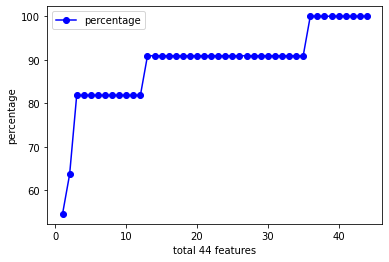

In [248]:
# this section shows a graph among 44 features (approximately normal) how many are above 90% coverage
from matplotlib import pyplot as plt
%matplotlib inline

val_sort=np.sort(list(etmm_pd.loc['percent_change',:]))
print(val_sort)
x_axis=np.arange(1,len(val_sort)+1)
print(x_axis,len(x_axis),len(val_sort))
plt.plot(x_axis,val_sort,label="percentage",marker='o', color='b')
plt.xlabel("total 44 features")
plt.ylabel("percentage")
plt.legend()
plt.show()

In [249]:
easy_time_mem_medium # total 11 onotlogies in this category

,file,size_kb,consistency_time_milsecs,consistency_size_kb,realisation_time_milsecs,realisation_size_kb,classification_time_milsecs,classification_size_kb,SOV,ENR,...,EQVP,DISP,INV,DOMN,RANG,CHN,CHNP,ELPROP,CAL_TIME,label_mem
2146,8ade3ddc-a69a-490a-9a24-659d433ab508_animalsvh...,162,305829,70840424,320934,69896996,226121,69726468,306,3.534854,...,0,0,1,48,48,0,0.000000,0.992188,450,medium
12163,MSC_classes_demo.owl_functional.owl,5371,18699,30801852,215446,54524448,188218,31647844,5562,12.668812,...,0,0,0,0,0,0,0.000000,0.000000,1890,medium
14686,genomic-cds-demo.owl_functional.owl,2138,30984,47532040,24174,37097396,28035,42737412,2269,20.760951,...,0,0,0,0,0,0,0.000000,0.000000,960,medium
14688,genomic-cds_rules_demo.owl_functional.owl,4702,24182,46262556,7085,12093292,22263,39905852,4145,13.520662,...,0,0,0,0,0,0,0.000000,0.000000,1470,medium
14689,genomic-cds_rules_full_demo.owl_functional.owl,5842,20796,36906884,22947,43952352,23701,42252248,5850,10.997855,...,0,0,0,0,0,0,0.000000,0.000000,1840,medium
15153,OWL2DL-1.owl,3722,78794,27519884,427623,27691920,80578,27092660,16187,3.290722,...,5,2,22,69,58,8,0.077670,0.843373,1000,medium
15155,OWL2DL-2.owl,7317,297147,80439780,1475096,82943248,307412,82494408,31441,3.251191,...,5,2,22,69,58,8,0.077670,0.843373,6000,medium
15158,OWL2EL-100.owl,543804,308466,53222836,294142,53949220,303461,53217908,1757525,4.114687,...,4,0,0,56,46,8,0.081633,0.954286,929310,medium
15163,OWL2EL-50.owl,260194,130727,25593828,136054,25967440,134172,25710696,896094,3.875118,...,4,0,0,56,46,8,0.081633,0.954286,332900,medium
15165,OWL2QL-100.owl,543806,234994,42794300,236590,43382488,234492,42846608,1757528,4.114782,...,5,1,22,73,61,0,0.000000,0.834081,919880,medium


(16370, 101)
(11, 101)
feature name=  size_kb
max value =  260201 min value =  11829
mean=  66778.81818181818 standard deviation=  72249.48836159601
left range=  30654.07400102017 right range=  102903.56236261618
0.760556503 2.677142582
data covered within this range=  27.27 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  1.835376112117543
skewness value=  1.6244445445025248


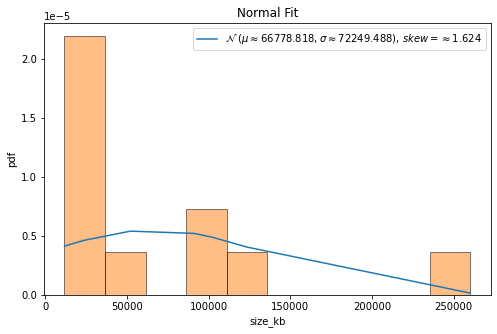


QQ plot 



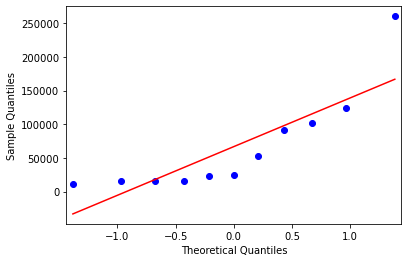


 Shapiro-Wilk Test 
 
Statistics=12.243, p=0.002195
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  consistency_time_milsecs
max value =  279132 min value =  97796
mean=  191529.54545454544 standard deviation=  68696.43026237527
left range=  157181.3303233578 right range=  225877.76058573308
1.364460207 1.27521116
data covered within this range=  18.18 %
percent left and right=  54.55 45.45



normality test :----

kurtosis value=  -1.6338759871768955
skewness value=  -0.07667574750905863


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


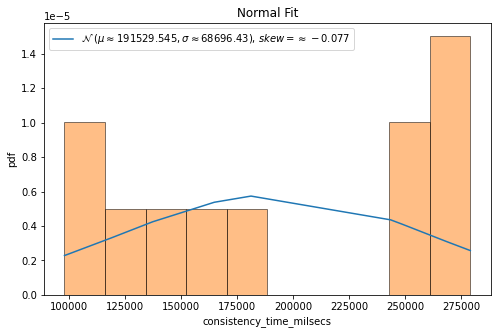


QQ plot 



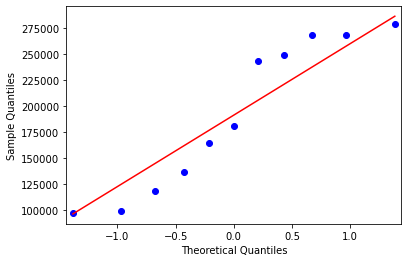


 Shapiro-Wilk Test 
 
Statistics=4.920, p=0.085438
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  consistency_size_kb
max value =  128838488 min value =  99630024
mean=  122043864.0 standard deviation=  9154176.398641065
left range=  117466775.80067948 right range=  126620952.19932052
2.448482422 0.742243071
data covered within this range=  45.45 %
percent left and right=  27.27 72.73



normality test :----

kurtosis value=  0.9265429456583831
skewness value=  -1.5236469793025635


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


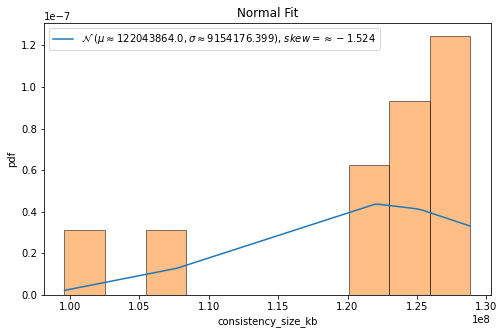


QQ plot 



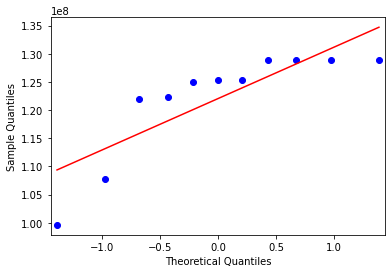


 Shapiro-Wilk Test 
 
Statistics=9.260, p=0.009757
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  realisation_time_milsecs
max value =  21600141 min value =  112002
mean=  4099901.6363636362 standard deviation=  8249942.203004326
left range=  -25069.465138526633 right range=  8224872.737865799
0.483385161 2.121255996
data covered within this range=  81.82 %
percent left and right=  81.82 18.18



normality test :----

kurtosis value=  0.7218388268690044
skewness value=  1.64967153579798


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


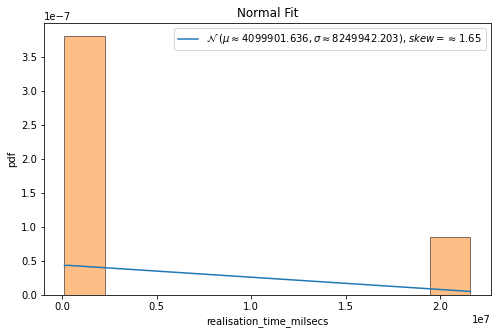


QQ plot 



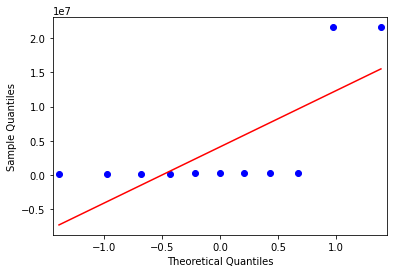


 Shapiro-Wilk Test 
 
Statistics=9.708, p=0.007796
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  realisation_size_kb
max value =  128838720 min value =  1751268
mean=  101348206.18181819 standard deviation=  47334309.88364628
left range=  77681051.23999505 right range=  125015361.12364133
2.104117255 0.580773521
data covered within this range=  36.36 %
percent left and right=  27.27 72.73



normality test :----

kurtosis value=  0.5352108587000965
skewness value=  -1.550934595781786


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


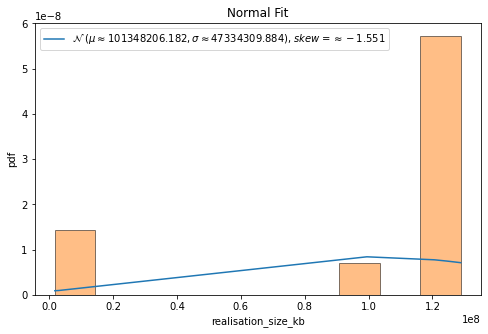


QQ plot 



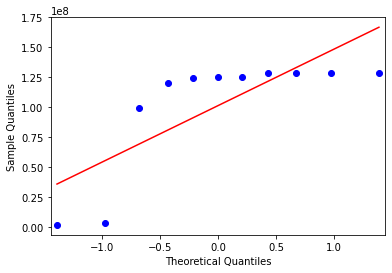


 Shapiro-Wilk Test 
 
Statistics=8.538, p=0.013999
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  classification_time_milsecs
max value =  21600214 min value =  88047
mean=  2481518.909090909 standard deviation=  6145585.1521699615
left range=  115683 right range=  21600214
data covered within this range=  90.91 %
percent left and right=  81.82 18.18
data covered within 1 standard deviation=  90.91 %
data covered within 2 standard deviation=  90.91 %
data covered within 3 standard deviation=  90.91 %



normality test :----

kurtosis value=  5.531471034262731
skewness value=  2.695749118132936


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


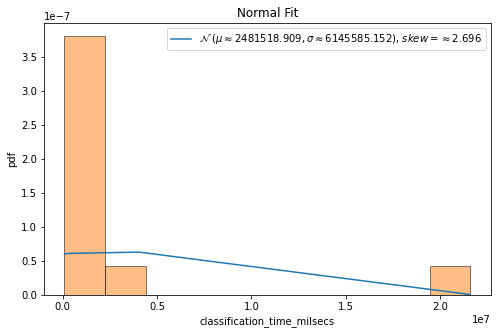


QQ plot 



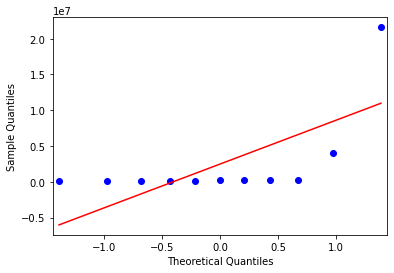


 Shapiro-Wilk Test 
 
Statistics=28.877, p=0.000001
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  classification_size_kb
max value =  128839328 min value =  5992900
mean=  110444217.0909091 standard deviation=  34238707.11055604
left range=  99465700 right range=  128839328
data covered within this range=  90.91 %
percent left and right=  27.27 72.73
data covered within 1 standard deviation=  90.91 %
data covered within 2 standard deviation=  90.91 %
data covered within 3 standard deviation=  90.91 %



normality test :----

kurtosis value=  4.911220656281445
skewness value=  -2.512548045827529


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


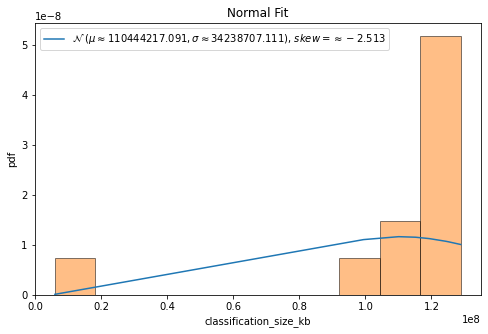


QQ plot 



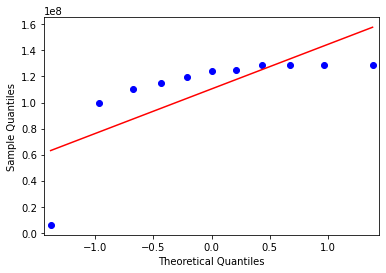


 Shapiro-Wilk Test 
 
Statistics=26.179, p=0.000002
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  SOV
max value =  896100 min value =  6039
mean=  176594.45454545456 standard deviation=  251897.9103011101
left range=  18039 right range=  896100
data covered within this range=  90.91 %
percent left and right=  72.73 27.27
data covered within 1 standard deviation=  90.91 %
data covered within 2 standard deviation=  90.91 %
data covered within 3 standard deviation=  100.0 %



normality test :----

kurtosis value=  3.1647866423918574
skewness value=  2.0547065913274865


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


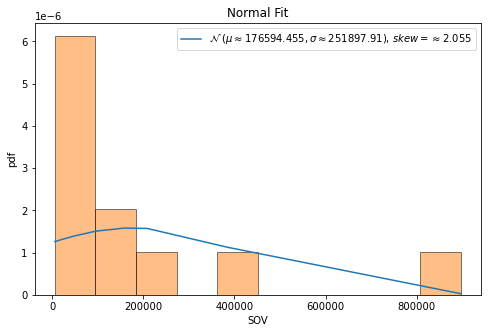


QQ plot 



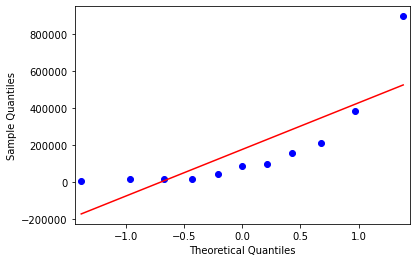


 Shapiro-Wilk Test 
 
Statistics=18.757, p=0.000085
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  ENR
max value =  991.7200330214639 min value =  1.1054484823886883
mean=  93.31913722851176 standard deviation=  284.1021301819107
left range=  2.8189113114056834 right range=  991.7200330214639
data covered within this range=  90.91 %
percent left and right=  90.91 9.09
data covered within 1 standard deviation=  90.91 %
data covered within 2 standard deviation=  90.91 %
data covered within 3 standard deviation=  90.91 %



normality test :----

kurtosis value=  6.099650253388434
skewness value=  2.845946337334146


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


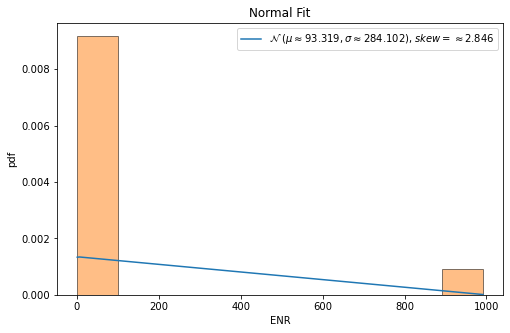


QQ plot 



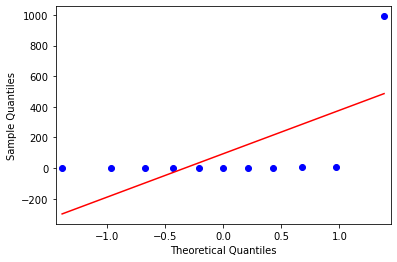


 Shapiro-Wilk Test 
 
Statistics=31.149, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  EOG
max value =  3.628430385977584 min value =  1.2951533292047157
mean=  2.4613956217550115 standard deviation=  0.5502692159592716
left range=  2.1862610137753755 right range=  2.7365302297346474
2.119403119 2.120843272
data covered within this range=  45.45 %
percent left and right=  45.45 54.55



normality test :----

kurtosis value=  0.7591687911134009
skewness value=  0.0330526183151282


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


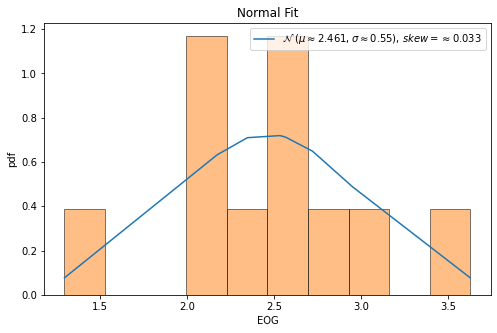


QQ plot 



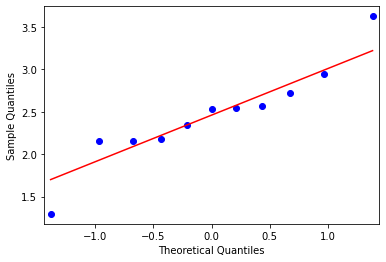


 Shapiro-Wilk Test 
 
Statistics=2.297, p=0.317053
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  CYC
max value =  18001387 min value =  10357
mean=  2160682.272727273 standard deviation=  5059026.671919791
left range=  35924 right range=  18001387
data covered within this range=  90.91 %
percent left and right=  81.82 18.18
data covered within 1 standard deviation=  90.91 %
data covered within 2 standard deviation=  90.91 %
data covered within 3 standard deviation=  90.91 %



normality test :----

kurtosis value=  5.754540948473094
skewness value=  2.749701808014302


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


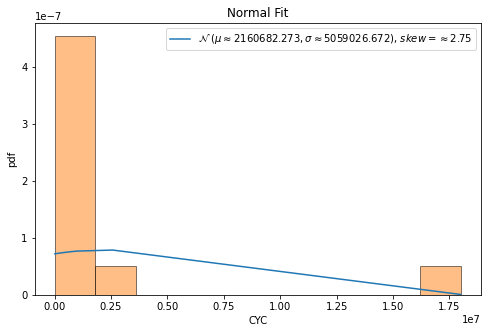


QQ plot 



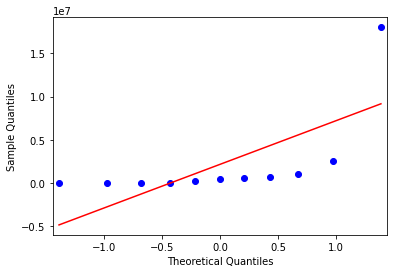


 Shapiro-Wilk Test 
 
Statistics=29.733, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  HGCI
max value =  17672 min value =  0
mean=  3225.3636363636365 standard deviation=  6810.229047979988
left range=  -179.75088762635733 right range=  6630.47816035363
0.47360575 2.121314314
data covered within this range=  81.82 %
percent left and right=  81.82 18.18



normality test :----

kurtosis value=  0.7221874456436543
skewness value=  1.6498937365297173


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


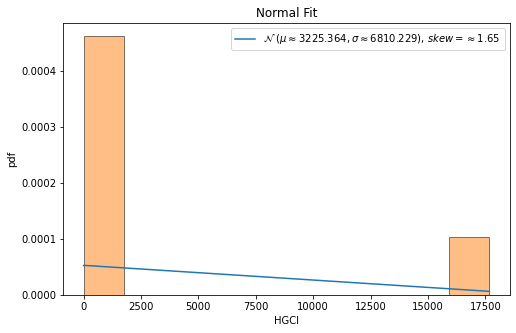


QQ plot 



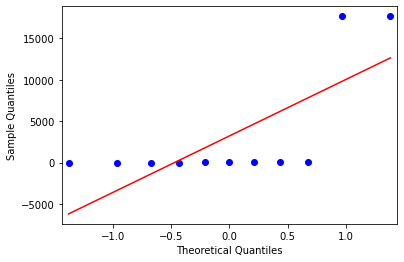


 Shapiro-Wilk Test 
 
Statistics=9.711, p=0.007787
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  ESUB
max value =  0.7799082850268849 min value =  0.0
mean=  0.14612550693595108 standard deviation=  0.29907385820026855
left range=  -0.003411422164183192 right range=  0.29566243603608533
0.488593379 2.119151376
data covered within this range=  81.82 %
percent left and right=  81.82 18.18



normality test :----

kurtosis value=  0.7093019879007123
skewness value=  1.6422253672348943


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


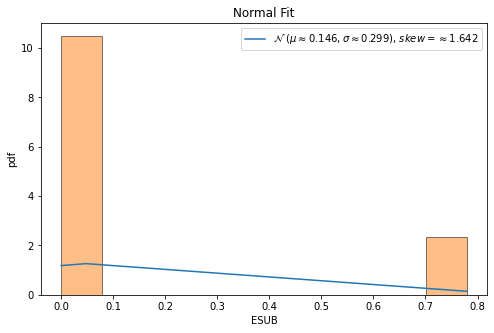


QQ plot 



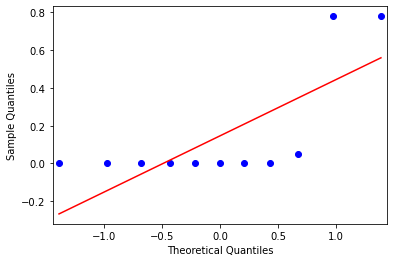


 Shapiro-Wilk Test 
 
Statistics=9.622, p=0.008138
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  ELCLSPRT
max value =  0.9995810688728471 min value =  0.157894736842105
mean=  0.6727100513283298 standard deviation=  0.3782405666379299
left range=  0.48358976800936493 right range=  0.8618303346472947
1.361079059 0.864188155
data covered within this range=  0.0 %
percent left and right=  36.36 63.64



normality test :----

kurtosis value=  -1.6628729469027888
skewness value=  -0.5537382794913273


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


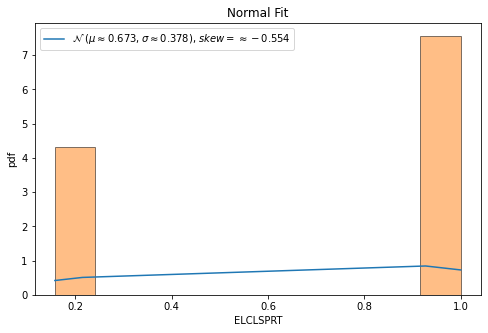


QQ plot 



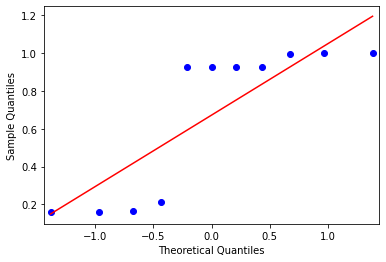


 Shapiro-Wilk Test 
 
Statistics=6.362, p=0.041554
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  ELAXPRT
max value =  0.9989447375728964 min value =  0.25
mean=  0.6780397820381107 standard deviation=  0.28730058734636826
left range=  0.5343894883649265 right range=  0.8216900757112948
1.48986741 1.116965888
data covered within this range=  36.36 %
percent left and right=  36.36 63.64



normality test :----

kurtosis value=  -1.5620785082840538
skewness value=  -0.3695057455015509


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


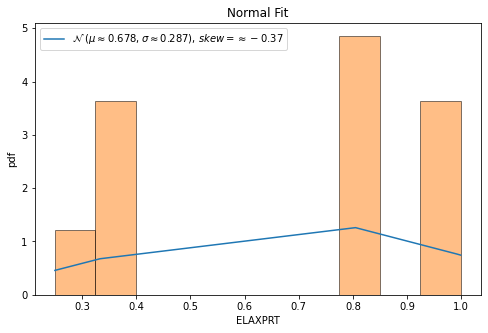


QQ plot 



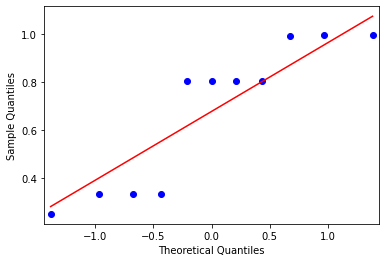


 Shapiro-Wilk Test 
 
Statistics=4.377, p=0.112100
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  IHR
max value =  818460 min value =  0
mean=  143559.54545454544 standard deviation=  233693.49690230956
left range=  0 right range=  818460
data covered within this range=  100.0 %
percent left and right=  72.73 27.27
data covered within 1 standard deviation=  90.91 %
data covered within 2 standard deviation=  90.91 %
data covered within 3 standard deviation=  100.0 %



normality test :----

kurtosis value=  3.422043721826734
skewness value=  2.1229280292817214


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


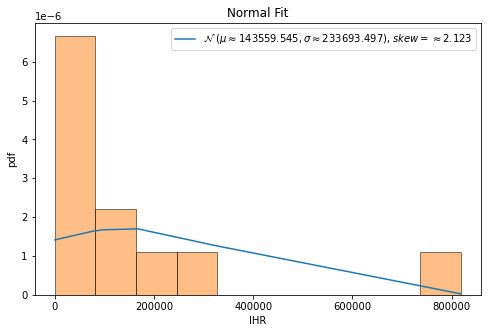


QQ plot 



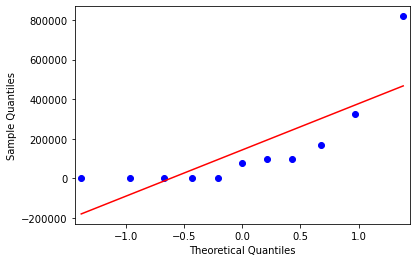


 Shapiro-Wilk Test 
 
Statistics=19.884, p=0.000048
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  IIR
max value =  416622 min value =  0
mean=  79071.27272727272 standard deviation=  118414.7862742663
left range=  0 right range=  416622
data covered within this range=  100.0 %
percent left and right=  54.55 45.45
data covered within 1 standard deviation=  90.91 %
data covered within 2 standard deviation=  90.91 %
data covered within 3 standard deviation=  100.0 %



normality test :----

kurtosis value=  3.119339336677215
skewness value=  2.001790557599665


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


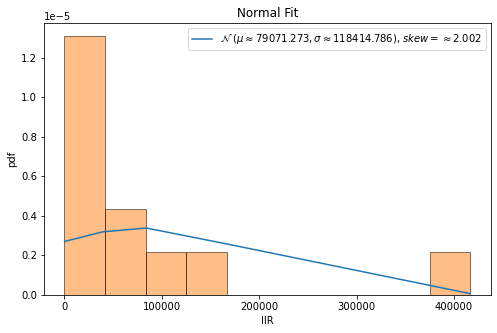


QQ plot 



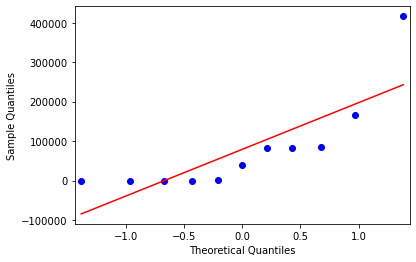


 Shapiro-Wilk Test 
 
Statistics=18.227, p=0.000110
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  ITR
max value =  98278 min value =  0
mean=  30027.363636363636 standard deviation=  37100.34821515763
left range=  11477.18952878482 right range=  48577.53774394245
0.809355305 1.839622528
data covered within this range=  18.18 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -1.063203257074817
skewness value=  0.8045297631361936


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


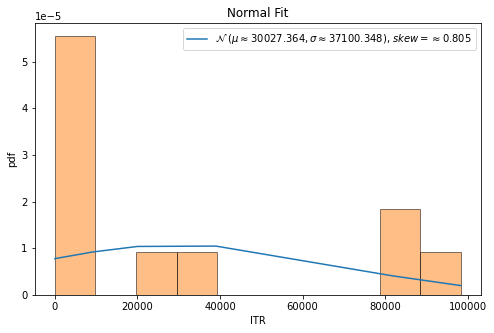


QQ plot 



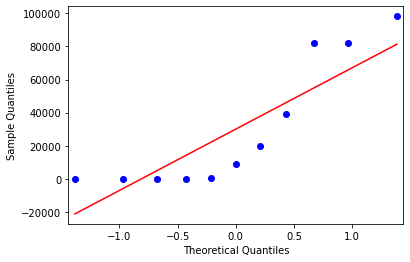


 Shapiro-Wilk Test 
 
Statistics=2.606, p=0.271673
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  IND
max value =  246271 min value =  6016
mean=  47397.09090909091 standard deviation=  68263.63637392705
left range=  6016 right range=  246271
data covered within this range=  100.0 %
percent left and right=  72.73 27.27
data covered within 1 standard deviation=  90.91 %
data covered within 2 standard deviation=  90.91 %
data covered within 3 standard deviation=  100.0 %



normality test :----

kurtosis value=  3.6322969397932026
skewness value=  2.1846580737880514


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


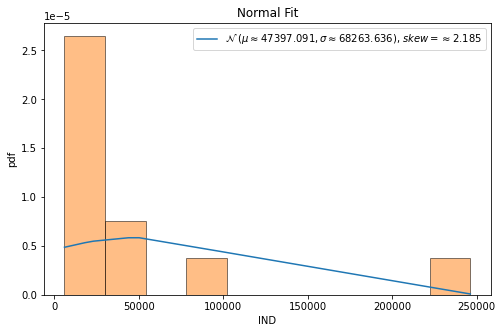


QQ plot 



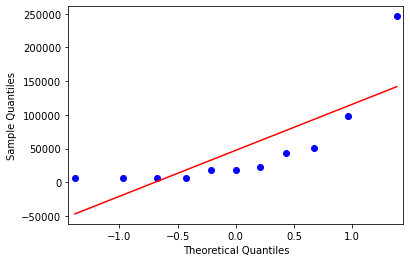


 Shapiro-Wilk Test 
 
Statistics=20.848, p=0.000030
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  aNOC
max value =  1.104188381442641 min value =  0.0206896551724138
mean=  0.44551735490756383 standard deviation=  0.36087576079345296
left range=  0.26507947451083735 right range=  0.6259552353042903
1.177213174 1.825201629
data covered within this range=  18.18 %
percent left and right=  45.45 54.55



normality test :----

kurtosis value=  -1.2084288665242573
skewness value=  0.09483133855129793


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


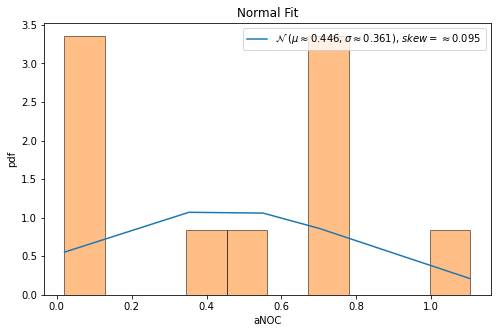


QQ plot 



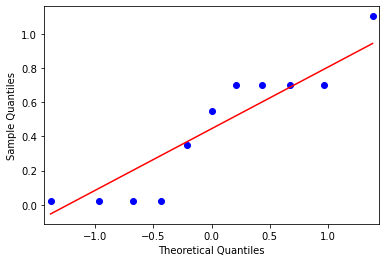


 Shapiro-Wilk Test 
 
Statistics=1.116, p=0.572416
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  mNOC
max value =  1794 min value =  3
mean=  185.63636363636363 standard deviation=  509.81374009218007
left range=  3 right range=  1794
data covered within this range=  100.0 %
percent left and right=  90.91 9.09
data covered within 1 standard deviation=  90.91 %
data covered within 2 standard deviation=  90.91 %
data covered within 3 standard deviation=  90.91 %



normality test :----

kurtosis value=  6.016569762982842
skewness value=  2.821959005972176


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


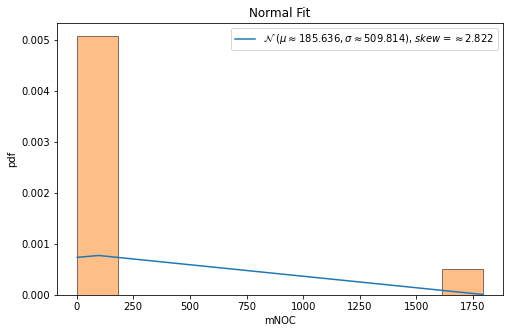


QQ plot 



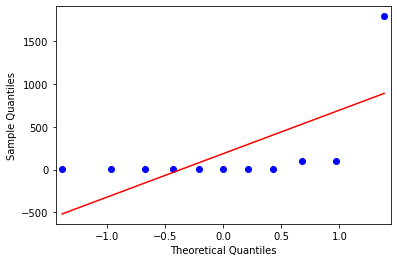


 Shapiro-Wilk Test 
 
Statistics=30.803, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  tNOC
max value =  123853 min value =  3
mean=  27283.090909090908 standard deviation=  47849.62222792749
left range=  3358.279795127164 right range=  51207.90202305465
0.570121343 2.018195852
data covered within this range=  0.0 %
percent left and right=  72.73 27.27



normality test :----

kurtosis value=  0.0988967623339998
skewness value=  1.3730829170442107


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


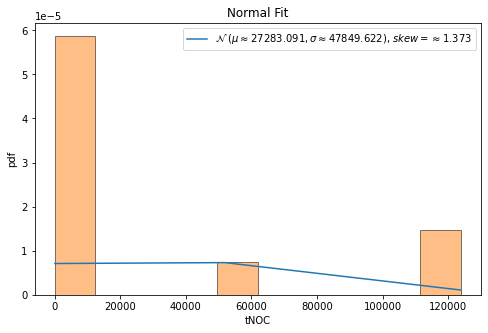


QQ plot 



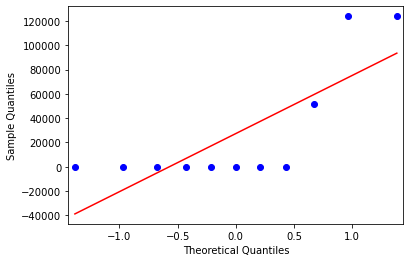


 Shapiro-Wilk Test 
 
Statistics=6.341, p=0.041975
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  aCID
max value =  1987.5632183908046 min value =  2.0473989295912727
mean=  342.07404571081713 standard deviation=  567.8544447151328
left range=  2.0958711790857456 right range=  1987.5632183908046
data covered within this range=  90.91 %
percent left and right=  72.73 27.27
data covered within 1 standard deviation=  90.91 %
data covered within 2 standard deviation=  90.91 %
data covered within 3 standard deviation=  100.0 %



normality test :----

kurtosis value=  3.497798352857065
skewness value=  2.167192082295396


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


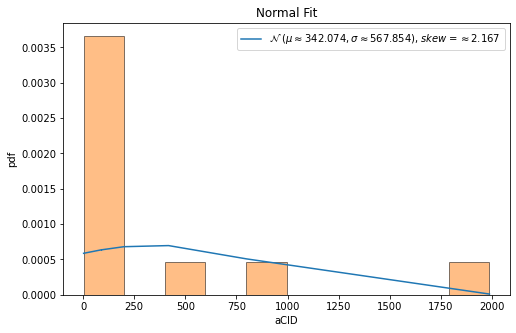


QQ plot 



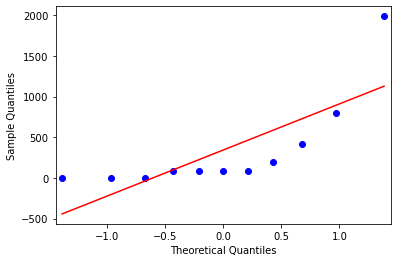


 Shapiro-Wilk Test 
 
Statistics=20.413, p=0.000037
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  mCID
max value =  93749 min value =  3315
mean=  18922.636363636364 standard deviation=  25568.352214381703
left range=  3315 right range=  93749
data covered within this range=  100.0 %
percent left and right=  72.73 27.27
data covered within 1 standard deviation=  90.91 %
data covered within 2 standard deviation=  90.91 %
data covered within 3 standard deviation=  100.0 %



normality test :----

kurtosis value=  3.743496320087125
skewness value=  2.218452840065488


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


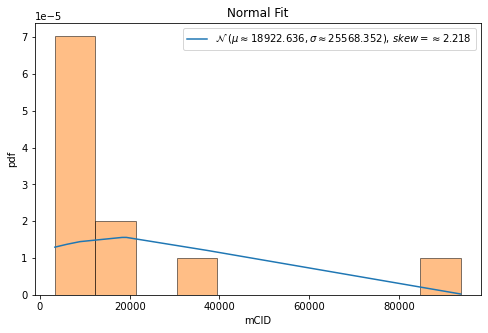


QQ plot 



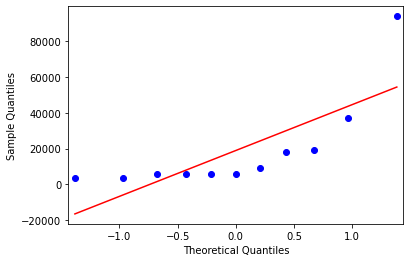


 Shapiro-Wilk Test 
 
Statistics=21.365, p=0.000023
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  tCID
max value =  718420 min value =  12014
mean=  186327.9090909091 standard deviation=  241352.4653430612
left range=  65651.67641937849 right range=  307004.1417624397
0.722237947 2.204626707
data covered within this range=  27.27 %
percent left and right=  72.73 27.27



normality test :----

kurtosis value=  0.01198353731550661
skewness value=  1.258981463919318


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


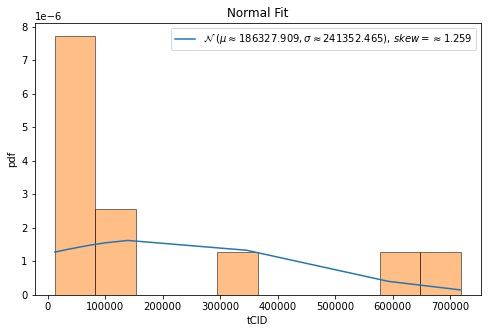


QQ plot 



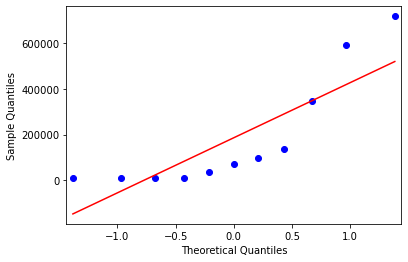


 Shapiro-Wilk Test 
 
Statistics=5.406, p=0.067011
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  aCOD
max value =  13.166666666666664 min value =  1.1940298507462686
mean=  5.780394087403111 standard deviation=  5.599780094156134
left range=  2.9805040403250436 right range=  8.580284134481179
0.819025776 1.319029043
data covered within this range=  0.0 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -1.675446291463007
skewness value=  0.5482760871528903


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


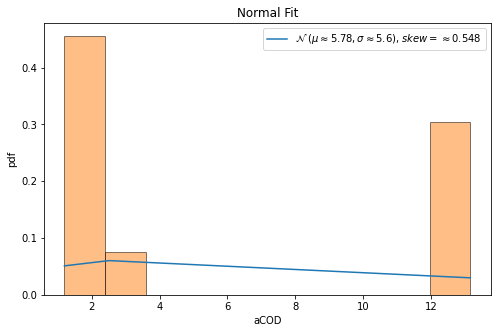


QQ plot 



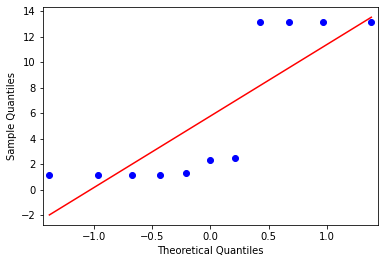


 Shapiro-Wilk Test 
 
Statistics=6.549, p=0.037835
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  tCOD
max value =  819316 min value =  160
mean=  132060.0 standard deviation=  270392.1851883096
left range=  -3136.0925941547903 right range=  267256.09259415476
0.487809956 2.541700676
data covered within this range=  81.82 %
percent left and right=  81.82 18.18



normality test :----

kurtosis value=  1.4436001407362689
skewness value=  1.7869250116998252


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


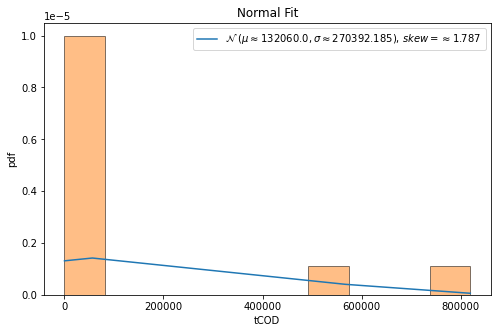


QQ plot 



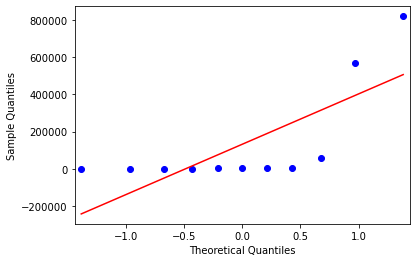


 Shapiro-Wilk Test 
 
Statistics=12.522, p=0.001909
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  aNOP
max value =  1.4226668802449 min value =  0.9925373134328358
mean=  1.071710162943606 standard deviation=  0.14061485604446153
left range=  1.0014027349213754 right range=  1.1420175909658368
0.563047545 2.495872251
data covered within this range=  0.0 %
percent left and right=  72.73 27.27



normality test :----

kurtosis value=  0.9690344048622381
skewness value=  1.559684217822578


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


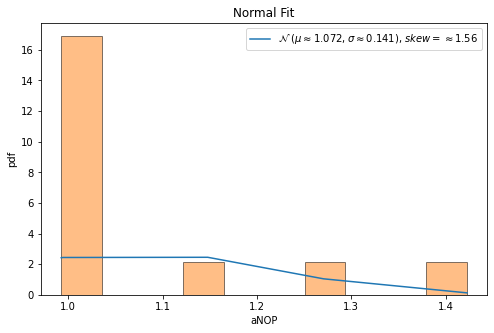


QQ plot 



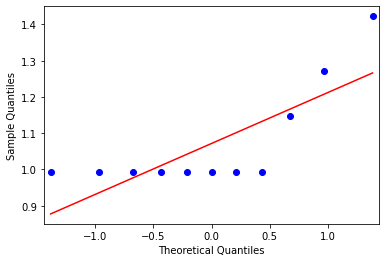


 Shapiro-Wilk Test 
 
Statistics=9.628, p=0.008117
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  mNOP
max value =  33 min value =  1
mean=  7.7272727272727275 standard deviation=  12.248123485890392
left range=  1.6032109843275313 right range=  13.851334470217925
0.549249257 2.063395858
data covered within this range=  9.09 %
percent left and right=  72.73 27.27



normality test :----

kurtosis value=  0.3625014834818323
skewness value=  1.4785235476113232


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


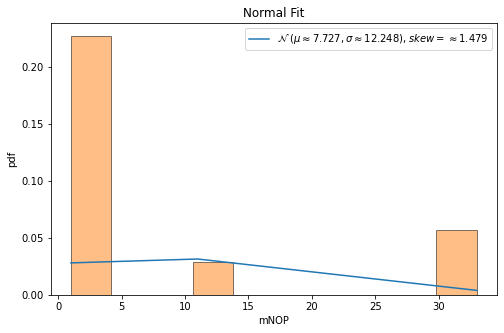


QQ plot 



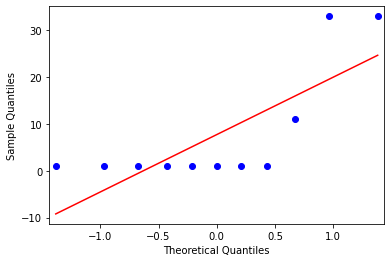


 Shapiro-Wilk Test 
 
Statistics=7.626, p=0.022082
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  tNOP
max value =  445839 min value =  133
mean=  74615.27272727272 standard deviation=  148529.6909663586
left range=  350.42724409341463 right range=  148880.11821045203
0.501463864 2.499323367
data covered within this range=  9.09 %
percent left and right=  81.82 18.18



normality test :----

kurtosis value=  1.2675637516207017
skewness value=  1.736019746948576


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


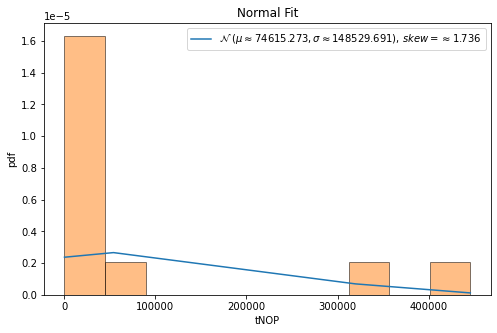


QQ plot 



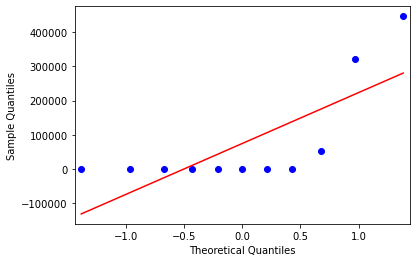


 Shapiro-Wilk Test 
 
Statistics=11.693, p=0.002890
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  CONJP
max value =  0.3939 min value =  0.0179
mean=  0.19173636363636362 standard deviation=  0.1564120157714424
left range=  0.11353035575064242 right range=  0.26994237152208483
1.111400315 1.292507071
data covered within this range=  18.18 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -1.6633066576975173
skewness value=  0.43645636620253053


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


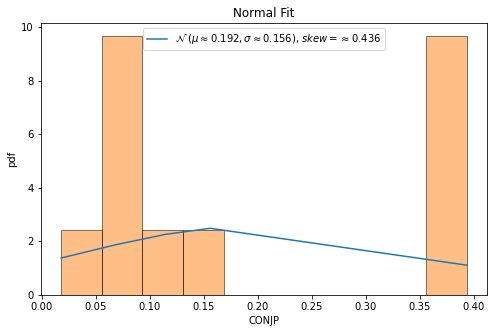


QQ plot 



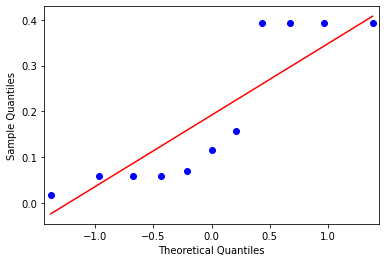


 Shapiro-Wilk Test 
 
Statistics=5.993, p=0.049971
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  DISJ
max value =  129 min value =  0
mean=  27.727272727272727 standard deviation=  48.95469317104413
left range=  3.249926141750663 right range=  52.20461931279479
0.566386406 2.068703136
data covered within this range=  9.09 %
percent left and right=  72.73 27.27



normality test :----

kurtosis value=  0.39530509434099326
skewness value=  1.4919116020688616


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


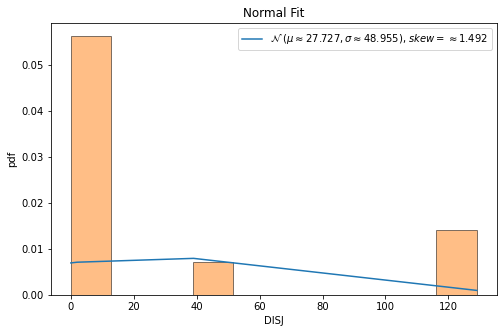


QQ plot 



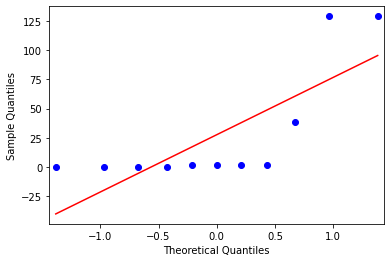


 Shapiro-Wilk Test 
 
Statistics=7.794, p=0.020303
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  DISJP
max value =  0.0606 min value =  0.0
mean=  0.023927272727272728 standard deviation=  0.028234636720591993
left range=  0.009809954366976731 right range=  0.038044591087568726
0.847443973 1.298855999
data covered within this range=  9.09 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -1.6941798580979723
skewness value=  0.4738873662692929


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


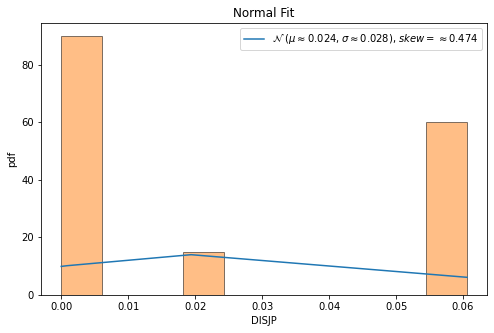


QQ plot 



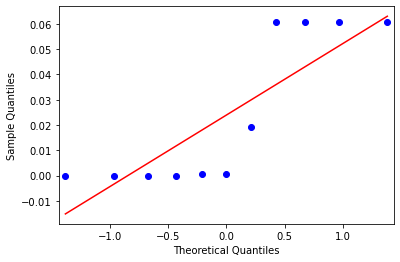


 Shapiro-Wilk Test 
 
Statistics=6.625, p=0.036428
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  EF
max value =  186188 min value =  1
mean=  28939.272727272728 standard deviation=  62104.40885402128
left range=  -2112.9316997379137 right range=  59991.47715428337
0.465961648 2.532005862
data covered within this range=  81.82 %
percent left and right=  81.82 18.18



normality test :----

kurtosis value=  1.4182873981974948
skewness value=  1.789452216849074


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


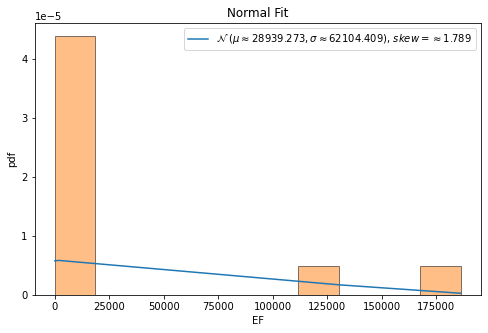


QQ plot 



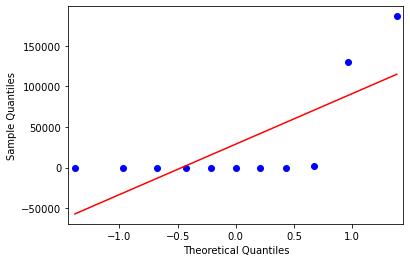


 Shapiro-Wilk Test 
 
Statistics=12.480, p=0.001950
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  EFP
max value =  0.9138 min value =  0.0083
mean=  0.33559090909090905 standard deviation=  0.3473971488199989
left range=  0.1618923346809096 right range=  0.5092894835009085
0.942123187 1.664403674
data covered within this range=  36.36 %
percent left and right=  72.73 27.27



normality test :----

kurtosis value=  -1.067368665950329
skewness value=  0.7802596878321524


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


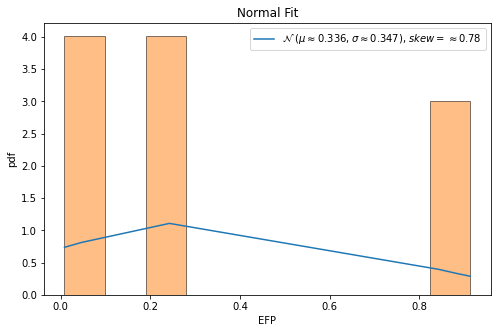


QQ plot 



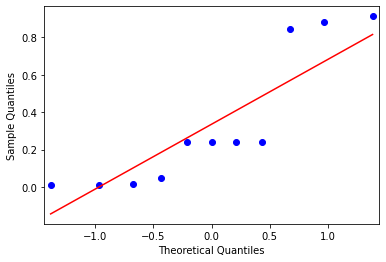


 Shapiro-Wilk Test 
 
Statistics=2.502, p=0.286221
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  SELF
max value =  1 min value =  0
mean=  0.36363636363636365 standard deviation=  0.4810456929208347
left range=  0.12311351717594629 right range=  0.604159210096781
0.755928946 1.322875656
data covered within this range=  0.0 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -1.678571428571429
skewness value=  0.5669467095138406


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


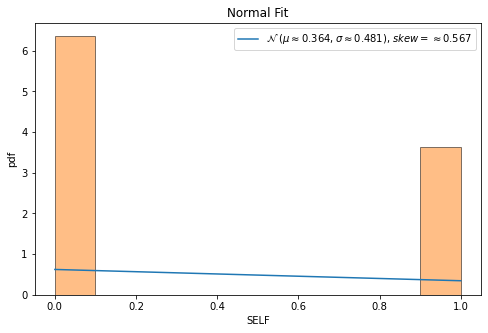


QQ plot 



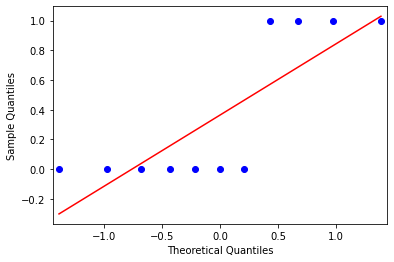


 Shapiro-Wilk Test 
 
Statistics=6.668, p=0.035647
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  SELFP
max value =  0.0303 min value =  0.0
mean=  0.011018181818181818 standard deviation=  0.014575684495501291
left range=  0.003730339570431172 right range=  0.018306024065932465
0.755928946 1.322875656
data covered within this range=  0.0 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -1.6785714285714284
skewness value=  0.5669467095138412


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


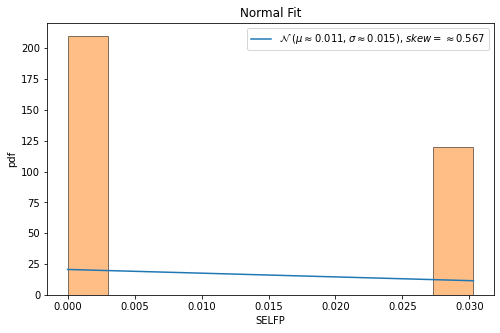


QQ plot 



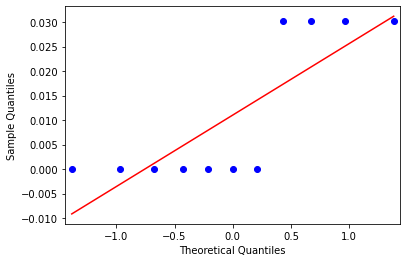


 Shapiro-Wilk Test 
 
Statistics=6.668, p=0.035647
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  MNCAR
max value =  9 min value =  1
mean=  3.8181818181818183 standard deviation=  2.854603357837742
left range=  2.390880139262947 right range=  5.24548349710069
0.987241121 1.815249803
data covered within this range=  45.45 %
percent left and right=  54.55 45.45



normality test :----

kurtosis value=  -0.6738373743566126
skewness value=  0.746293048982085


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


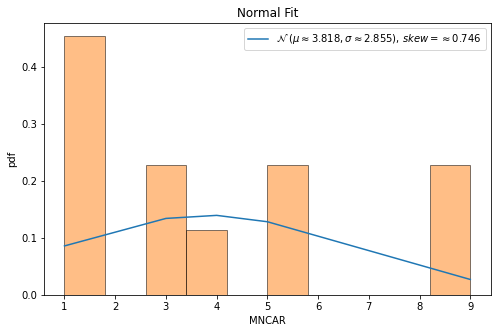


QQ plot 



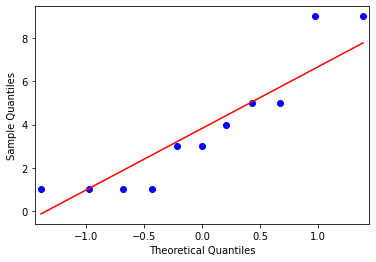


 Shapiro-Wilk Test 
 
Statistics=1.797, p=0.407169
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  MNCARP
max value =  0.0417 min value =  0.0
mean=  0.0239 standard deviation=  0.01515237755121438
left range=  0.01632381122439281 right range=  0.03147618877560719
1.577310222 1.174733136
data covered within this range=  45.45 %
percent left and right=  36.36 63.64



normality test :----

kurtosis value=  -1.0784833237981013
skewness value=  -0.658882576345267


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


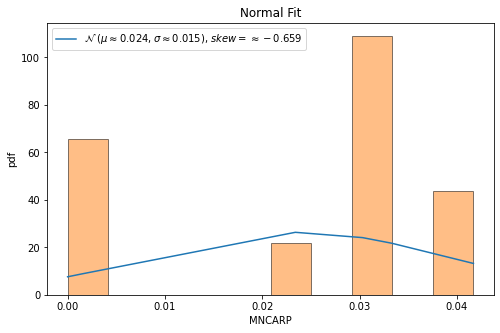


QQ plot 



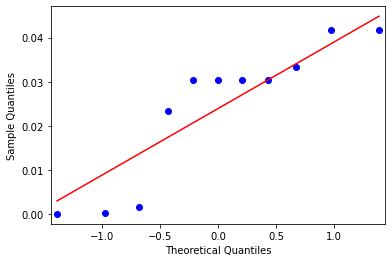


 Shapiro-Wilk Test 
 
Statistics=1.996, p=0.368531
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  MXCAR
max value =  9 min value =  1
mean=  3.4545454545454546 standard deviation=  2.903403531394784
left range=  2.0028436888480625 right range=  4.906247220242847
0.845402793 1.909984088
data covered within this range=  36.36 %
percent left and right=  54.55 45.45



normality test :----

kurtosis value=  -0.3477508650519052
skewness value=  0.9936706030601112


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


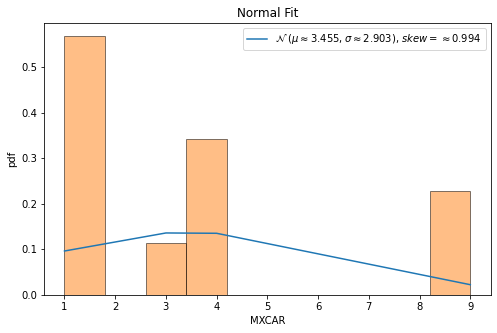


QQ plot 



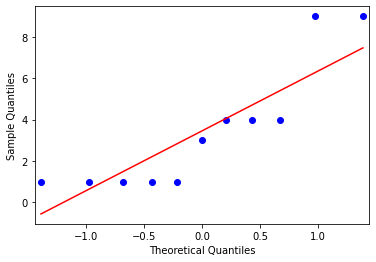


 Shapiro-Wilk Test 
 
Statistics=3.241, p=0.197809
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  MXCARP
max value =  0.0333 min value =  0.0
mean=  0.02095454545454545 standard deviation=  0.014244958510827846
left range=  0.013832066199131528 right range=  0.028077024709959375
1.471014846 0.8666543
data covered within this range=  0.0 %
percent left and right=  36.36 63.64



normality test :----

kurtosis value=  -1.5531323868231695
skewness value=  -0.5975782826334168


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


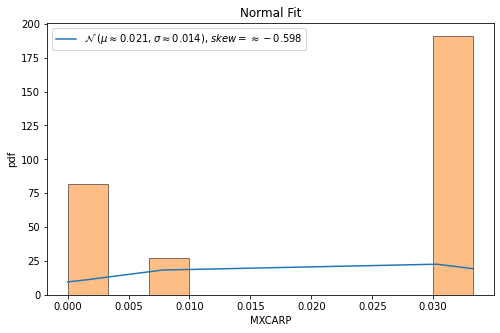


QQ plot 



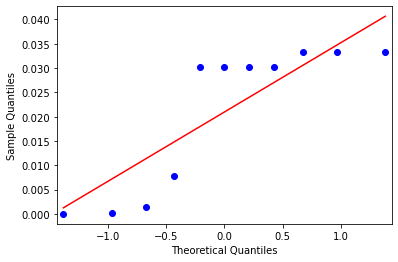


 Shapiro-Wilk Test 
 
Statistics=4.981, p=0.082855
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  CAR
max value =  103 min value =  0
mean=  40.36363636363637 standard deviation=  47.625953060896094
left range=  16.55065983318832 right range=  64.17661289408441
0.847513462 1.315172918
data covered within this range=  9.09 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -1.677483364853516
skewness value=  0.5338383914903836


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


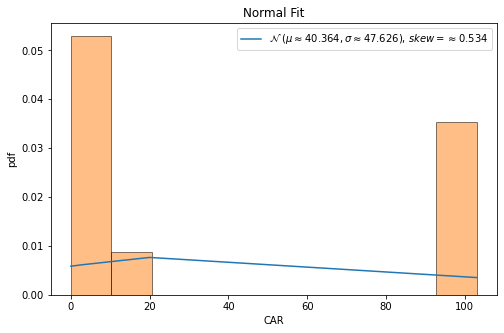


QQ plot 



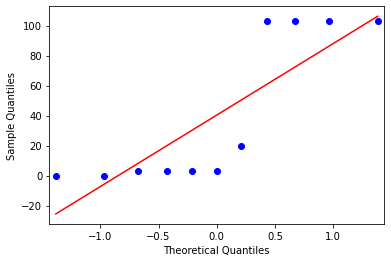


 Shapiro-Wilk Test 
 
Statistics=6.533, p=0.038139
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  CARP
max value =  0.8583 min value =  0.0
mean=  0.3412 standard deviation=  0.38259142222955855
left range=  0.14990428888522073 right range=  0.5324957111147792
0.891812989 1.351572382
data covered within this range=  0.0 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -1.6614056009658067
skewness value=  0.5452401582827955


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


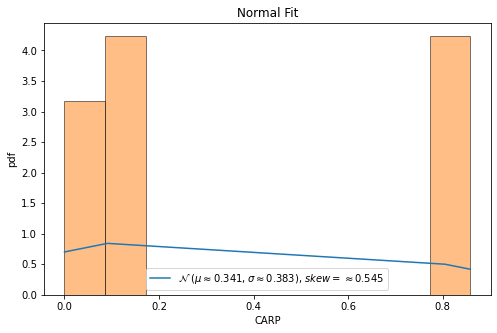


QQ plot 



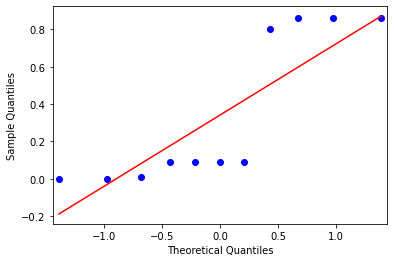


 Shapiro-Wilk Test 
 
Statistics=6.308, p=0.042684
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  OBPP
max value =  1.0 min value =  0.7143
mean=  0.8329909090909091 standard deviation=  0.10414219697165333
left range=  0.7809198106050824 right range=  0.8850620075767358
1.139700453 1.603663988
data covered within this range=  45.45 %
percent left and right=  45.45 54.55



normality test :----

kurtosis value=  -1.17519021184576
skewness value=  0.2325013960288564


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


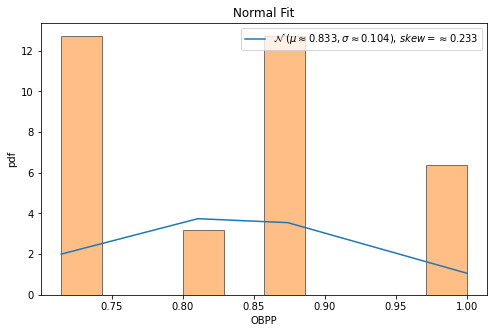


QQ plot 



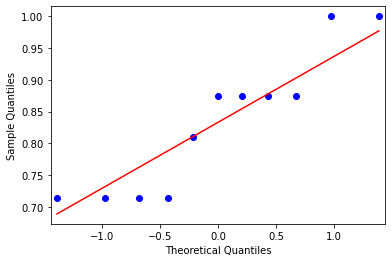


 Shapiro-Wilk Test 
 
Statistics=1.119, p=0.571546
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  DTPP
max value =  0.2857 min value =  0.0
mean=  0.1670090909090909 standard deviation=  0.10414219697165336
left range=  0.11493799242326423 right range=  0.21908018939491758
1.603663988 1.139700453
data covered within this range=  45.45 %
percent left and right=  54.55 45.45



normality test :----

kurtosis value=  -1.1751902118457602
skewness value=  -0.2325013960288563


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


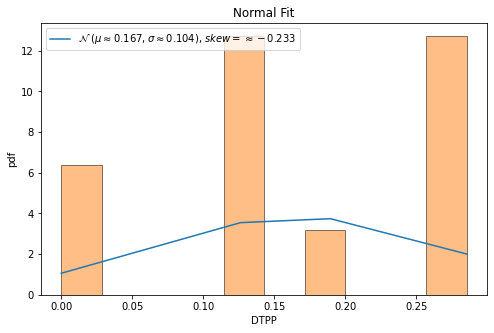


QQ plot 



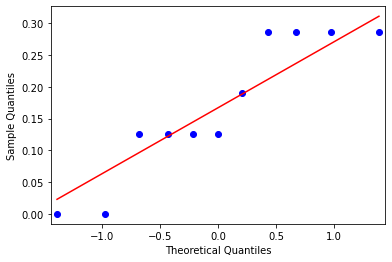


 Shapiro-Wilk Test 
 
Statistics=1.119, p=0.571546
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  SYM
max value =  7 min value =  0
mean=  2.4545454545454546 standard deviation=  1.776801844153824
left range=  1.5661445324685426 right range=  3.3429463766223666
1.381440177 2.55822255
data covered within this range=  72.73 %
percent left and right=  54.55 45.45



normality test :----

kurtosis value=  1.5606343027877498
skewness value=  1.047130047103564


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


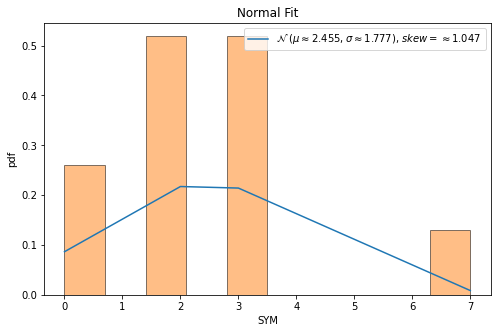


QQ plot 



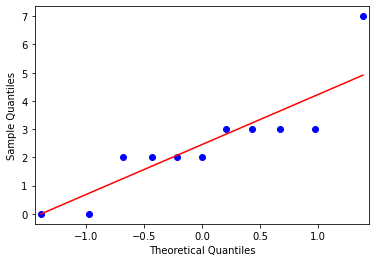


 Shapiro-Wilk Test 
 
Statistics=7.636, p=0.021970
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  SYMP
max value =  0.4286 min value =  0.0
mean=  0.1654727272727273 standard deviation=  0.19906578670885794
left range=  0.06593983391829833 right range=  0.26500562062715627
0.831246444 1.321810629
data covered within this range=  0.0 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -1.677152991120645
skewness value=  0.561881251087591


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


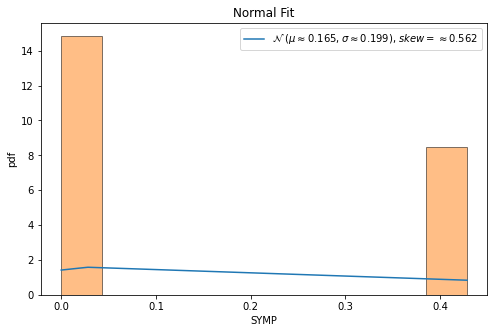


QQ plot 



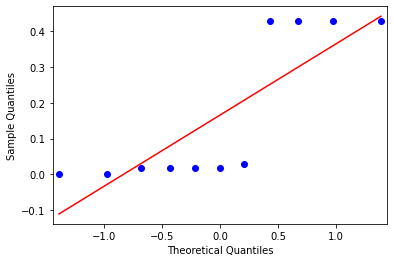


 Shapiro-Wilk Test 
 
Statistics=6.626, p=0.036406
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  REFLE
max value =  1 min value =  0
mean=  0.36363636363636365 standard deviation=  0.4810456929208347
left range=  0.12311351717594629 right range=  0.604159210096781
0.755928946 1.322875656
data covered within this range=  0.0 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -1.678571428571429
skewness value=  0.5669467095138406


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


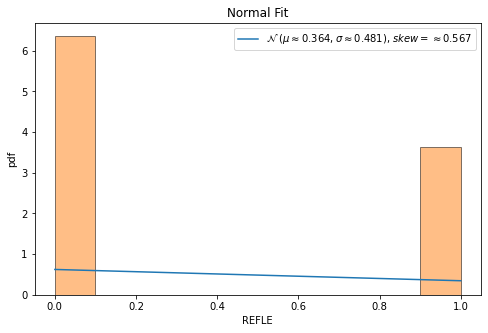


QQ plot 



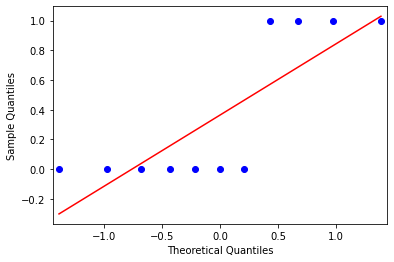


 Shapiro-Wilk Test 
 
Statistics=6.668, p=0.035647
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  RANG
max value =  148 min value =  7
mean=  41.81818181818182 standard deviation=  40.0813222922375
left range=  21.77752067206307 right range=  61.85884296430057
0.868688452 2.649159561
data covered within this range=  54.55 %
percent left and right=  54.55 45.45



normality test :----

kurtosis value=  1.6986874670727783
skewness value=  1.4645537232670824


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


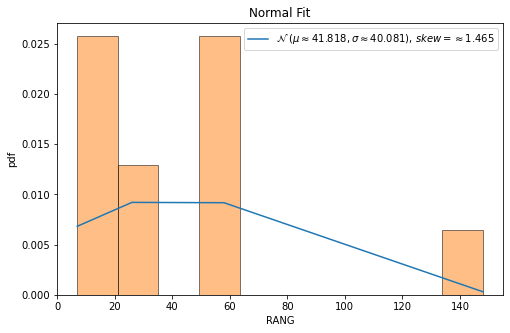


QQ plot 



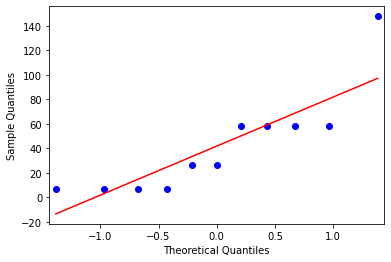


 Shapiro-Wilk Test 
 
Statistics=10.731, p=0.004675
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  CAL_TIME
max value =  5520890 min value =  1520
mean=  552780.9090909091 standard deviation=  1573733.7666688475
left range=  1730 right range=  5520890
data covered within this range=  90.91 %
percent left and right=  90.91 9.09
data covered within 1 standard deviation=  90.91 %
data covered within 2 standard deviation=  90.91 %
data covered within 3 standard deviation=  90.91 %



normality test :----

kurtosis value=  6.039676907010886
skewness value=  2.828809276034004


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


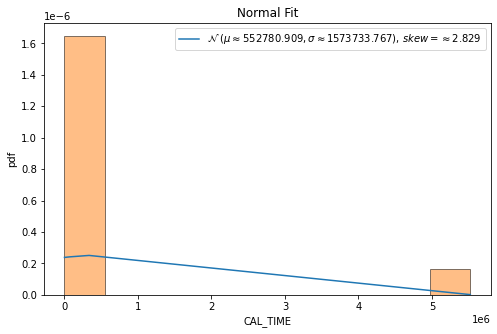


QQ plot 



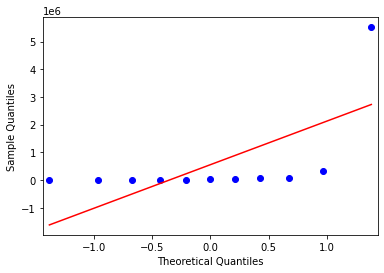


 Shapiro-Wilk Test 
 
Statistics=30.901, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------



/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


In [250]:
#after easy time and memory clusering ,
#collect the hard ones
#**** follow the same notation as explained above in 'easy_tim_easy_memory' category wherever required*******#
                        
from matplotlib import pyplot as plt
%matplotlib inline
#%matplotlib qt 
import scipy
from scipy.stats import norm
from statsmodels.graphics.gofplots import qqplot
import statistics
from scipy.stats import shapiro
from scipy.stats import normaltest
import math

#interquratile range 
def cal(sov_sort):
    p=0
    l=len(sov_sort)
    left=0
    right=0
    while  p < 90 :
        if p==0:
            if l % 2 ==0:
                left=( l /2)
                right=( l / 2) + 1
                p= round((((right -left +1) / l) * 100),2)
                
            else:
                left=math.floor( l /2)
                right=math.ceil(l/2) + 1
                p= round((((right -left +1) / l) * 100),2)
                
        else:
            if left % 2 !=0:
                left = math.ceil(left/2)
            else:
                left = left /2
            
            dist = l - right +1
            if dist % 2 !=0:
                right = right + math.ceil(dist/2)
            else:
                right = right + (dist /2)
                
            p= round((((right -left +1) / l) * 100),2)
             
        
    return left-1,right-1





print(df_easy_time_mem_feature_df.shape)
easy_time_mem_hard = df_easy_time_mem_feature_df[df_easy_time_mem_feature_df['label_mem']== 'hard']
print(easy_time_mem_hard.shape) # contain easy time hard memory ontologies
prior_hard= round(easy_time_mem_hard.shape[0] / df_easy_time_mem_feature_df.shape[0] ,5)
                #fraction of easy time hard memory ontologies in the easy time category
main_dict_etmh={}
main_dict_etmh_iqr={}

for i in range(len(cols_list)):
    if cols_list[i] in top_n_1:
        tmp_dict={}
        tmp_dict_iqr={}
        
        feature = cols_list[i]
        print("feature name= ",feature)
        
        sov=np.array(easy_time_mem_hard[feature])
        sov_1=(np.sort(sov))
        skew=scipy.stats.skew(sov)
        
        tmp_dict["skew"]=round(skew,4)
        tmp_dict_iqr["skew"]=round(skew,4)
        
        if -2 < skew and skew < 2:
        
            print("max value = ",np.max(sov),"min value = ",np.min(sov))
            tmp_dict["min"]=round(np.min(sov),9)
            tmp_dict["max"]=round(np.max(sov),9)
            min_val=np.min(sov)
            max_val=np.max(sov)

            mean = np.mean(sov)
            std = np.std(sov)
            print("mean= ",mean,"standard deviation= ",std)
            tmp_dict["mean"]=round(mean,9)
            tmp_dict["std"]=round(std,9)
            #gamma=2
            #rx= mean - ((1- prior_hard) *gamma * std) 
            #ry= mean + ((1- prior_hard) *gamma * std)
            
            l_weight=0.5
            r_weight=0.5
            rx= mean - (l_weight* std) 
            ry= mean + (r_weight* std)
            print("left range= ",rx,"right range= ", ry)
            tmp_dict["lw_i"]=round(l_weight,9)
            tmp_dict["rw_i"]=round(r_weight,9)
            tmp_dict["lr"]=round(rx,9)
            tmp_dict["rr"]=round(ry,9)

            min_val_w= round(((mean - min_val) /std ),9)
            max_val_w= round(((max_val - mean) /std ),9)
            print(min_val_w,max_val_w)
            tmp_dict["min_val_w"]=round(min_val_w,9)
            tmp_dict["max_val_w"]=round(max_val_w,9)


            val=(((rx <= sov) & (sov <= ry)).sum()) / easy_time_mem_hard.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within this range= ",v,"%")

            tmp_dict["percent_i"]=round(v,9)
            tmp_dict["percent_change"]=round(v,9)

            val=(((min_val <= sov) & (sov <= mean)).sum()) / easy_time_mem_hard.shape[0]
            percent_l =  round((val * 100 ),2)

            val=(((mean <= sov) & (sov <= max_val)).sum()) / easy_time_mem_hard.shape[0]
            percent_r =  round((val * 100 ),2)

            print("percent left and right= ",percent_l,percent_r)
            tmp_dict["percent_l"]=percent_l
            tmp_dict["percent_r"]=percent_r
            
            main_dict_etmh[feature]=tmp_dict
            
        else:
            
            left_index,right_index = cal(sov_1)
            rx=sov_1[int(left_index)]
            ry=sov_1[int(right_index)]

            print("max value = ",np.max(sov),"min value = ",np.min(sov))
            
            tmp_dict_iqr["min"]=round(np.min(sov),9)
            tmp_dict_iqr["max"]=round(np.max(sov),9)
            min_val=np.min(sov)
            max_val=np.max(sov)
            
            
            mean = np.mean(sov)
            std = np.std(sov)
            print("mean= ",mean,"standard deviation= ",std)
            tmp_dict_iqr["mean"]=round(mean,9)
            tmp_dict_iqr["std"]=round(std,9)
            
            print("left range= ",rx,"right range= ", ry)
            tmp_dict_iqr["lw_i"]="null"
            tmp_dict_iqr["rw_i"]="null"
            tmp_dict_iqr["lr"]=round(rx,9)
            tmp_dict_iqr["rr"]=round(ry,9)
            
            
            tmp_dict_iqr["min_val_w"]="null"
            tmp_dict_iqr["max_val_w"]="null"
            tmp_dict_iqr["percent_i"]="null"
            val=(((rx <= sov) & (sov <= ry)).sum()) / easy_time_mem_hard.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within this range= ",v,"%")
            tmp_dict_iqr["percent_change"]=round(v,9)
            
            val=(((min_val <= sov) & (sov <= mean)).sum()) / easy_time_mem_hard.shape[0]
            percent_l =  round((val * 100 ),2)

            val=(((mean <= sov) & (sov <= max_val)).sum()) / easy_time_mem_hard.shape[0]
            percent_r =  round((val * 100 ),2)

            print("percent left and right= ",percent_l,percent_r)
            
            tmp_dict_iqr["percent_l"]=percent_l
            tmp_dict_iqr["percent_r"]=percent_r
            
            main_dict_etmh_iqr[feature]=tmp_dict_iqr

            
            # 68–95–99.7 rule, also known as the empirical rule

            # for 1*std
            left = mean - std
            right = mean + std
            val=(((left <= sov) & (sov <= right)).sum()) / easy_time_mem_hard.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 1 standard deviation= ",v,"%")
            
            # for 2*std
            left = mean - (2*std)
            right = mean + (2*std)
            val=(((left <= sov) & (sov <= right)).sum()) / easy_time_mem_hard.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 2 standard deviation= ",v,"%")
            


            # for 3*std
            left = mean - (3*std)
            right = mean + (3*std)
            val=(((left <= sov) & (sov <= right)).sum()) / easy_time_mem_hard.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 3 standard deviation= ",v,"%")
            
            
        print("\n\n")
        
        #normality test
        print("normality test :----\n")
        # kurtosis and skew function
        kurt=scipy.stats.kurtosis(sov)
        print("kurtosis value= ",kurt)
        
        
        print("skewness value= ",skew)
        
        
        
        #plotting graph for to see the skewess
        sov_1=np.sort(sov)
        fig, ax1 = plt.subplots(1, 1, figsize=(8,5))
        ax1.plot(sov_1, norm.pdf(sov_1, mean, std),label='$\mathcal{N}$ '+ f'$( \mu \\approx {round(mean,3)} , \sigma \\approx {round(std,3)})$, $ skew = \\approx {round(skew,3)}$')
        ax1.hist(sov_1,edgecolor='black',alpha=0.5,density= True)
        ax1.set_title("Normal Fit")
        ax1.set_xlabel(feature)
        ax1.set_ylabel("pdf")
        ax1.legend()
        #plt.savefig('/home/ritam/ontology_hardness/normal_curve_&_skewness/easy_time_hard_memory/'+str(feature)+'.jpeg')
        plt.show()
        
        # Quantile-Quantile Plot Nomrality check
        print("\nQQ plot \n")
        qqplot(sov_1, line='s')
        plt.show()
        
        #Statistical Normality Tests
        # Shapiro-Wilk Test
        print("\n Shapiro-Wilk Test \n ")
        #stat, p = shapiro(sov_1[0:4998])
        stat, p = normaltest(sov_1)
        print('Statistics=%.3f, p=%f' % (stat, p))
        
        alpha = 0.05
        if p > alpha:
            print('Sample looks Gaussian (fail to reject H0)')
        else:
            print('Sample does not look Gaussian (reject H0)')
            
        print("ends normality test ------------------------------------------------\n")
        
        

In [251]:
print(len(main_dict_etmh),len(main_dict_etmh_iqr))

38 12


In [252]:
#**** follow the same notation as explained above in 'easy_tim_easy_memory' category wherever required*******#


import copy

main_dict_cal_etmh={}
dec_rate=[(0.9,0.9)]
for i in range(len(dec_rate)):
 
    main_dict_cal_etmh=copy.deepcopy(main_dict_etmh)
    lower_r=dec_rate[i][0]
    high_r=dec_rate[i][1]
    for j in range (100):
        c=0
        for key,value in main_dict_cal_etmh.items():
            
            if value["percent_change"] < 90:
                
                lw_i_temp=value["lw_i"]
                rw_i_temp=value["rw_i"]
                if value["percent_l"] >= 50:
                    diff=value["min_val_w"] - lw_i_temp
                    frac = round(lower_r * diff, 9)  
                
                    lw_i_temp= round(lw_i_temp + frac , 9)
                    main_dict_cal_etmh[key]["lw_i"]=lw_i_temp
                else:
                    diff=value["min_val_w"] - lw_i_temp
                    frac = round(high_r * diff, 9)  
                
                    lw_i_temp= round(lw_i_temp + frac ,9 )
                    main_dict_cal_etmh[key]["lw_i"]=lw_i_temp

                if value["percent_r"] >= 50:
                    diff=value["max_val_w"] - rw_i_temp
                    frac = round(lower_r * diff, 9)  
                
                    rw_i_temp= round(rw_i_temp + frac , 9 )
                    main_dict_cal_etmh[key]["rw_i"]=rw_i_temp
                else:
                    diff=value["max_val_w"] - rw_i_temp
                    frac = round(high_r * diff, 9)  
                
                    rw_i_temp= round(rw_i_temp + frac ,9 )
                    main_dict_cal_etmh[key]["rw_i"]=rw_i_temp

                sov=np.array(easy_time_mem_hard[key])
                rx= round(value["mean"] - (lw_i_temp* value["std"]) ,9)
                ry= round(value["mean"] + (rw_i_temp* value["std"]),9)
                main_dict_cal_etmh[key]["lr"]=round(rx,9)
                main_dict_cal_etmh[key]["rr"]=round(ry,9)
                
                val=(((rx <= sov) & (sov <= ry)).sum()) / easy_time_mem_hard.shape[0]
                v =  round((val * 100 ),2)
                main_dict_cal_etmh[key]["percent_change"]=v

                if v >=85:
                    c=c+1
                
            else:
                c=c+1
        p=round(c / len(list(main_dict_cal_etmh.keys())),2)
        print ("percent in loop ",j , "covers ", p , "%" )
        

percent in loop  0 covers  0.05 %
percent in loop  1 covers  0.05 %
percent in loop  2 covers  0.05 %
percent in loop  3 covers  0.05 %
percent in loop  4 covers  0.05 %
percent in loop  5 covers  0.08 %
percent in loop  6 covers  0.11 %
percent in loop  7 covers  0.18 %
percent in loop  8 covers  0.5 %
percent in loop  9 covers  0.61 %
percent in loop  10 covers  0.61 %
percent in loop  11 covers  0.61 %
percent in loop  12 covers  0.61 %
percent in loop  13 covers  0.61 %
percent in loop  14 covers  0.61 %
percent in loop  15 covers  0.61 %
percent in loop  16 covers  0.61 %
percent in loop  17 covers  0.61 %
percent in loop  18 covers  0.61 %
percent in loop  19 covers  0.61 %
percent in loop  20 covers  0.61 %
percent in loop  21 covers  0.61 %
percent in loop  22 covers  0.61 %
percent in loop  23 covers  0.61 %
percent in loop  24 covers  0.61 %
percent in loop  25 covers  0.61 %
percent in loop  26 covers  0.61 %
percent in loop  27 covers  0.61 %
percent in loop  28 covers  0.6

In [253]:
#**** follow the same notation as explained above in 'easy_tim_easy_memory' category wherever required*******#

main_dict_cal_etmh
#print(len(main_dict_cal_etmh))
etmh_pd=pd.DataFrame(main_dict_cal_etmh)
etmh_iqr_pd=pd.DataFrame(main_dict_etmh_iqr)

frames = [etmh_pd,etmh_iqr_pd]
result = pd.concat(frames,axis=1)
result
#result.to_csv("etmh_ranges.csv")


In [254]:
easy_time_mem_hard # total 11 otologies in this category

,file,size_kb,consistency_time_milsecs,consistency_size_kb,realisation_time_milsecs,realisation_size_kb,classification_time_milsecs,classification_size_kb,SOV,ENR,...,EQVP,DISP,INV,DOMN,RANG,CHN,CHNP,ELPROP,CAL_TIME,label_mem
10575,00566.owl_functional.owl,23817,99035,121958472,134023,120652816,88047,119310568,45262,1.105448,...,0,0,72,147,148,0,0.000000,0.838828,10280,hard
11000,1e574289-de70-4647-9fe0-5ee8eaf3d0da_2009close...,15184,137223,99630024,112002,99463200,115683,99465700,18042,991.720033,...,0,0,0,6,7,0,0.000000,0.850000,5520890,hard
11159,35517746-4898-4c15-a905-6518355a4b85_ST2009SHI...,15198,97796,107716396,21600141,3020648,133029,115170004,18039,3.308717,...,0,0,0,6,7,0,0.000000,0.850000,1730,hard
11374,5101ac50-defd-457e-a6f4-62f2e9ce5738_phenotype...,123559,243533,125277292,254685,124853944,246571,124351796,158673,2.818911,...,0,0,10,30,26,40,0.229885,0.948187,54220,hard
11919,a3aef80f-4383-4dfb-82a8-6cb2f611c29b_ersection...,91232,268078,125349432,288102,125344676,247878,125208808,88442,3.244441,...,0,0,10,30,26,40,0.229885,0.948187,32450,hard
11960,a8f6019c-f34e-4418-af12-f0f464881e4c_VAST2009a...,15024,118628,124962672,298684,124423692,4033179,110068632,18039,3.308717,...,0,0,0,6,7,0,0.000000,0.850000,1520,hard
14276,c06f618d-66a7-432e-890e-d2592d17bb7d_009UNAeas...,11829,268714,122270796,21600104,1751268,21600214,5992900,6039,6.832765,...,0,0,0,6,7,0,0.000000,0.850000,1810,hard
15152,OWL2DL-10.owl,52169,164713,128834792,170637,128835496,166692,128835404,208952,3.417432,...,5,2,22,69,58,8,0.077670,0.843373,34210,hard
15154,OWL2DL-20.owl,102420,181142,128821984,117096,128823256,127483,128821796,385154,3.586793,...,5,2,22,69,58,8,0.077670,0.843373,76070,hard
15156,OWL2DL-50.owl,260201,248831,128822156,253286,128822552,236493,128821452,896100,3.875240,...,5,2,22,69,58,8,0.077670,0.843373,335900,hard


In [255]:
#**** follow the same notation as explained above wherever required, just names are modified*******#


# collect the medium ones
df_medium=partial_dataframe[partial_dataframe['label_time']=='medium']
df_medium_drop=df_medium # contains based on time
df_medium_drop

,file,size_kb,consistency_time_milsecs,consistency_size_kb,realisation_time_milsecs,realisation_size_kb,classification_time_milsecs,classification_size_kb,label_time
185,00699.owl_functional.owl,582904,510801,118948904,533505,117505604,572655,117441840,medium
0,OWL2DL-100.owl,543811,673449,128672792,704093,128793224,690983,128832840,medium
3,OWL2DL-200.owl,1108757,616636,128837964,628923,128842096,642479,128838868,medium
11,OWL2EL-200.owl,1108750,605649,106586272,607356,108235012,591436,107000568,medium
19,OWL2QL-200.owl,1108752,500321,85606796,506705,86797824,517881,85706104,medium
27,OWL2RL-200.owl,1108754,556153,88531188,549992,89854124,548326,88689260,medium
0,OWL2DL-210.owl,1129377,733716,56204052,631449,56734688,651077,51986764,medium
1,OWL2DL-212.owl,1139587,623903,50402200,676014,50601952,653379,50397368,medium
2,OWL2DL-214.owl,1149982,616735,50068120,610524,49966496,684282,50360276,medium
3,OWL2DL-216.owl,1161516,670292,49925028,595086,50112620,639233,50953272,medium


(56, 9)
[2 2 2 2 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


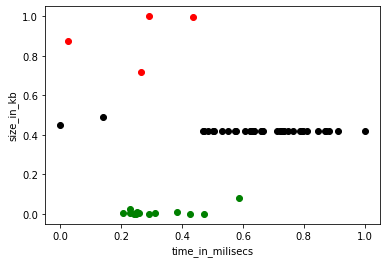

In [256]:
# now medium time ontologies clustered on memory
print(df_medium_drop.shape)
t=df_medium_drop.drop(['file','label_time'],axis=1)
scaler = MinMaxScaler()
scaler.fit(t)
t_df_scaled=scaler.transform(t)

t_MinMax = pd.DataFrame(data=t_df_scaled, columns=['size_kb', 'consistency_time_milsecs', 'consistency_size_kb',
       'realisation_time_milsecs', 'realisation_size_kb',
       'classification_time_milsecs', 'classification_size_kb'])
t=t_MinMax

km_2 = KMeans(n_clusters=3,random_state=0)
y_predicted_2=km_2.fit_predict(t[["consistency_size_kb"]])
print(y_predicted_2)
t['cluster']=y_predicted_2

t1=t[t['cluster']==0]
t2=t[t['cluster']==1]
t3=t[t['cluster']==2]

plt.scatter(t1["consistency_time_milsecs"],t1["consistency_size_kb"],c='black')
plt.scatter(t2["consistency_time_milsecs"],t2["consistency_size_kb"],c='green')
plt.scatter(t3["consistency_time_milsecs"],t3["consistency_size_kb"],c='red')
plt.xlabel('time_in_milisecs')
plt.ylabel('size_in_kb')
plt.show()


In [257]:
label_col=[]
for i in range((y_predicted_2.shape[0])):
    if y_predicted_2[i]==0:
        label_col.append('medium')
    elif y_predicted_2[i]==1:
        label_col.append('easy')
    else:
        label_col.append('hard')
        
df_medium_drop['label_mem']=label_col
df_medium_time_mem=df_medium_drop # contains first based on time and now on memory
df_medium_time_mem

<ipython-input-257-d8cea36094a2>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_medium_drop['label_mem']=label_col


,file,size_kb,consistency_time_milsecs,consistency_size_kb,realisation_time_milsecs,realisation_size_kb,classification_time_milsecs,classification_size_kb,label_time,label_mem
185,00699.owl_functional.owl,582904,510801,118948904,533505,117505604,572655,117441840,medium,hard
0,OWL2DL-100.owl,543811,673449,128672792,704093,128793224,690983,128832840,medium,hard
3,OWL2DL-200.owl,1108757,616636,128837964,628923,128842096,642479,128838868,medium,hard
11,OWL2EL-200.owl,1108750,605649,106586272,607356,108235012,591436,107000568,medium,hard
19,OWL2QL-200.owl,1108752,500321,85606796,506705,86797824,517881,85706104,medium,medium
27,OWL2RL-200.owl,1108754,556153,88531188,549992,89854124,548326,88689260,medium,medium
0,OWL2DL-210.owl,1129377,733716,56204052,631449,56734688,651077,51986764,medium,easy
1,OWL2DL-212.owl,1139587,623903,50402200,676014,50601952,653379,50397368,medium,easy
2,OWL2DL-214.owl,1149982,616735,50068120,610524,49966496,684282,50360276,medium,easy
3,OWL2DL-216.owl,1161516,670292,49925028,595086,50112620,639233,50953272,medium,easy


In [258]:
#**** follow the same notation as explained above wherever required*******#

total_df= pd.read_csv('final_new_more.csv') # for features collection 
print("size of final_new_more= ",total_df.shape)

df_medium_time_mem_feature=[]
for i in range(df_medium_time_mem.shape[0]):
    ont=df_medium_time_mem.iloc[i,:]['file']
    lab=df_medium_time_mem.iloc[i,:]['label_mem']
    o=(np.array(total_df[total_df['file']==ont]))
    if o.shape[0]!=0:
    
        u=list(np.array(total_df[total_df['file']==ont])[0])
        u.append(str(lab))
        df_medium_time_mem_feature.append(u)

    
total_df_cols=list(total_df.columns)
total_df_cols.append('label_mem')
df_medium_time_mem_feature_df=pd.DataFrame(data=df_medium_time_mem_feature,columns=total_df_cols)

df_medium_time_mem_feature_df # medium time ontologies are 56 in total

size of final_new_more=  (16433, 100)


,file,size_kb,consistency_time_milsecs,consistency_size_kb,realisation_time_milsecs,realisation_size_kb,classification_time_milsecs,classification_size_kb,SOV,ENR,...,EQVP,DISP,INV,DOMN,RANG,CHN,CHNP,ELPROP,CAL_TIME,label_mem
0,00699.owl_functional.owl,582904,510801,118948904,533505,117505604,572655,117441840,448079,3.890409,...,0,0,33,58,49,102,0.373626,0.915929,549920,hard
1,OWL2DL-100.owl,543811,673449,128672792,704093,128793224,690983,128832840,1757531,4.114746,...,5,2,22,69,58,8,0.077670,0.843373,1131430,hard
2,OWL2DL-200.owl,1108757,616636,128837964,628923,128842096,642479,128838868,3389780,4.291430,...,5,2,22,69,58,7,0.067961,0.842742,3971860,hard
3,OWL2EL-200.owl,1108750,605649,106586272,607356,108235012,591436,107000568,3389774,4.291401,...,4,0,0,56,46,8,0.081633,0.954286,3450510,hard
4,OWL2QL-200.owl,1108752,500321,85606796,506705,86797824,517881,85706104,3389777,4.291451,...,5,1,22,73,61,0,0.000000,0.834081,2006430,medium
5,OWL2RL-200.owl,1108754,556153,88531188,549992,89854124,548326,88689260,3389782,4.291403,...,5,1,22,70,57,8,0.079208,0.838983,3032880,medium
6,OWL2DL-210.owl,1129377,733716,56204052,631449,56734688,651077,51986764,3591778,4.308760,...,5,2,22,68,58,8,0.077670,0.842742,2442460,easy
7,OWL2DL-212.owl,1139587,623903,50402200,676014,50601952,653379,50397368,3625707,4.306205,...,5,2,22,68,58,8,0.077670,0.842742,6614020,easy
8,OWL2DL-214.owl,1149982,616735,50068120,610524,49966496,684282,50360276,3653413,4.312273,...,5,2,22,68,58,8,0.077670,0.842742,3956700,easy
9,OWL2DL-216.owl,1161516,670292,49925028,595086,50112620,639233,50953272,3686863,4.315591,...,5,2,22,68,58,8,0.077670,0.842742,3439860,easy


In [259]:
#**** follow the same notation as explained above wherever required*******#


# medium time with easy mem, medium mem and hard mem
l=df_medium_time_mem_feature_df.drop('file',axis=1)
x=l.groupby(l['label_mem']).agg(['min', 'max','mean'])
#x.to_csv('medium_time_feature_details.csv',index_label=True)
x_medium=x
x_medium

size_kb                        consistency_time_milsecs          \
               min      max          mean                      min     max   
label_mem                                                                    
easy       1129377  1268879  1.197086e+06                   582929  733716   
hard        543811  1108757  8.360555e+05                   510801  673449   
medium     1108752  1660138  1.454182e+06                   500321  898338   

                         consistency_size_kb                           \
                    mean                 min        max          mean   
label_mem                                                               
easy       625085.500000            49912292   56204052  5.078432e+07   
hard       601633.750000           106586272  128837964  1.207615e+08   
medium     761017.736842            82886588   88531188  8.315617e+07   

          realisation_time_milsecs  ...        CHN      CHNP            \
                               min  ...       mean       min       max   
label_mem                           ...                                  
easy                        582552  ...   8.000000  0.077670  0.077670   
hard                        533505  ...  31.250000  0.067961  0.373626   
medium                      506705  ...   7.789474  0.000000  0.079208   

                       ELPROP                     CAL_TIME           \
               mean       min       max      mean      min      max   
label_mem                                                             
easy       0.077670  0.842742  0.842742  0.842742  2442460  7333710   
hard       0.150223  0.842742  0.954286  0.889083   549920  3971860   
medium     0.075666  0.834081  0.842742  0.842415  2006430  5657230   

                         
                   mean  
label_mem                
easy       4.271891e+06  
hard       2.275930e+06  
medium     4.107021e+06  

[3 rows x 297 columns]

99
consistency_size_kb 0.09386
classification_size_kb 0.08606
IHR 0.08055
size_kb 0.06701
tCID 0.06619
CYC 0.06071
ITR 0.05718
realisation_size_kb 0.05672
IND 0.04739
aCID 0.0464
consistency_time_milsecs 0.03557
mCID 0.03446
IIR 0.03305
SOV 0.03261
EOG 0.02136
realisation_time_milsecs 0.02068
ENR 0.02047
CAL_TIME 0.01485
classification_time_milsecs 0.01136
DOMN 0.00689
aCOD 0.006
CHNP 0.00537
HGCI 0.00536
ELPROP 0.0053
DTP 0.00482
SUBP 0.00461
CONJP 0.00414
DISP 0.00391
tNOC 0.00374
SYMP 0.00368
FUNP 0.00276
OBPP 0.00274
NEG 0.00262
tCOD 0.00252
INV 0.00247
MNCARP 0.00242
RANG 0.00238
DTPP 0.00227
NEGP 0.00225
VALUE 0.00222
aNOP 0.00211
HLC 0.002
OBP 0.00193
ELCLSPRT 0.00184
EFP 0.00169
SELFP 0.00167
CHN 0.00165
ENUMP 0.00158
aNOC 0.00151
TIP 0.00136
ELAXPRT 0.00136
EF 0.00128
IFUNP 0.00123
DISJP 0.00122
MXCAR 0.00119
GCI 0.00101
CSUB 0.00099
EQVP 0.00096
IFUN 0.00094
ENUM 0.00085
mNOC 0.0008
MXCARP 0.00079
mCOD 0.00078
VALUEP 0.00074
ASYM 0.00068
TRNP 0.00061
MNCAR 0.00059
DISJ 0.0005

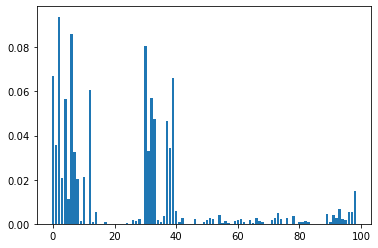

In [260]:
#**** follow the same notation as explained above wherever required*******#

from sklearn import preprocessing
from sklearn.ensemble import RandomForestClassifier
import operator
le = preprocessing.LabelEncoder()
p=df_medium_time_mem_feature_df
le.fit(p['label_mem'])
g=le.transform(p['label_mem']) 

x_train_np=p.drop(['file','label_mem'],axis=1)
y_train_np=np.array(g)


model = RandomForestClassifier(n_estimators = 100, random_state = 2)
model.feature_names = list(x_train_np.columns.values)
model.fit(x_train_np, y_train_np)
ft=list(model.feature_names)
importance = model.feature_importances_
print(model.n_features_)

dict1_imp={}
c=0
for i,v in enumerate(importance):
    val= round(v,5)
    dict1_imp[ft[c]]=val
    c+=1
dict1_imp_sort=dict(sorted(dict1_imp.items(), key=operator.itemgetter(1),reverse=True))

for key,val in dict1_imp_sort.items():
    print(key,val)
plt.bar([x for x in range(len(importance))], importance)
plt.show()


medium_feature_sort_dic=dict1_imp_sort

top_n_2=(list(medium_feature_sort_dic.keys())[:50])

In [261]:
#**** follow the same notation as explained above wherever required*******#

d= dict(x_medium)
medium_zero_features =[]
for key, value in dict1_imp_sort.items():
    if value == 0.0:
        if ( sum(list(d[(key, 'mean')]))/3 )== 0.0 :
            #print(key,list(d[(key, 'mean')]))
            medium_zero_features.append(key)
print(medium_zero_features)

print(top_n_2)

['SUPDCHN', 'DSUPDCHN', 'aDIT', 'mDIT', 'tDIT', 'ASYMP', 'REFLEP', 'IRREFP']
['consistency_size_kb', 'classification_size_kb', 'IHR', 'size_kb', 'tCID', 'CYC', 'ITR', 'realisation_size_kb', 'IND', 'aCID', 'consistency_time_milsecs', 'mCID', 'IIR', 'SOV', 'EOG', 'realisation_time_milsecs', 'ENR', 'CAL_TIME', 'classification_time_milsecs', 'DOMN', 'aCOD', 'CHNP', 'HGCI', 'ELPROP', 'DTP', 'SUBP', 'CONJP', 'DISP', 'tNOC', 'SYMP', 'FUNP', 'OBPP', 'NEG', 'tCOD', 'INV', 'MNCARP', 'RANG', 'DTPP', 'NEGP', 'VALUE', 'aNOP', 'HLC', 'OBP', 'ELCLSPRT', 'EFP', 'SELFP', 'CHN', 'ENUMP', 'aNOC', 'TIP']


(56, 101)
(14, 101)
feature name=  size_kb
max value =  1268879 min value =  1129377
mean=  1197086.5 standard deviation=  42933.48632103584
left range=  1175619.756839482 right range=  1218553.243160518
data covered within this range=  28.57 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.2245697521381982
skewness value=  0.05092056988288058


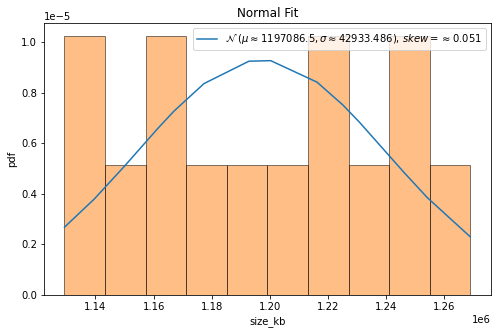


QQ plot 



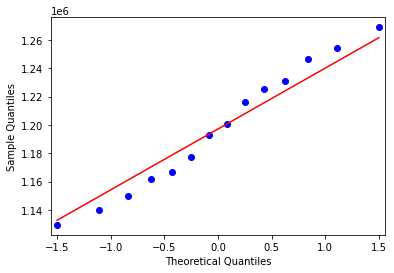


 Shapiro-Wilk Test 
 
Statistics=1.765, p=0.413767
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  consistency_time_milsecs
max value =  733716 min value =  582929
mean=  625085.5 standard deviation=  43133.60181997657
left range=  603518.6990900118 right range=  646652.3009099882
data covered within this range=  14.29 %
percent left and right=  71.43 28.57



normality test :----

kurtosis value=  0.4755043543414641
skewness value=  1.264247517038612


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


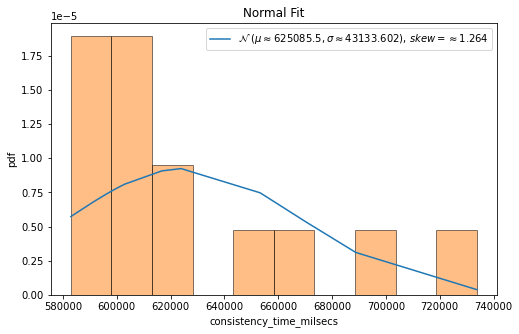


QQ plot 



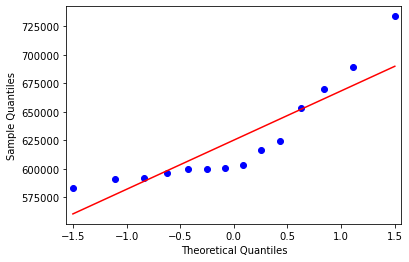


 Shapiro-Wilk Test 
 
Statistics=6.664, p=0.035729
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  consistency_size_kb
max value =  56204052 min value =  49912292
mean=  50784319.71428572 standard deviation=  1593838.6712433526
left range=  49925028 right range=  56204052
data covered within this range=  92.86 %
percent left and right=  78.57 21.43
data covered within 1 standard deviation=  92.86 %
data covered within 2 standard deviation=  92.86 %
data covered within 3 standard deviation=  92.86 %



normality test :----

kurtosis value=  6.606694698629672
skewness value=  2.7844749075069277


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


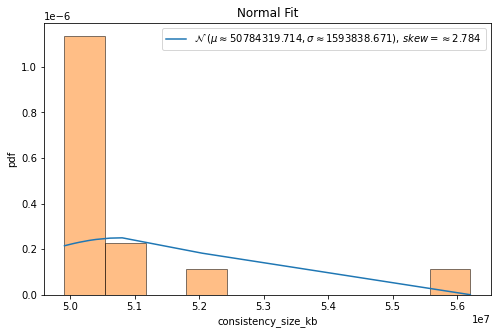


QQ plot 



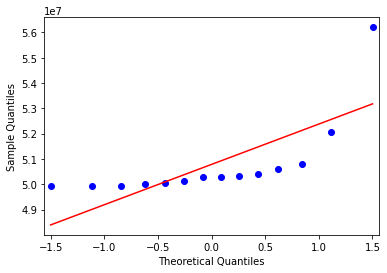


 Shapiro-Wilk Test 
 
Statistics=30.773, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  realisation_time_milsecs
max value =  676014 min value =  582552
mean=  620075.5 standard deviation=  26647.72250185209
left range=  606751.638749074 right range=  633399.361250926
data covered within this range=  42.86 %
percent left and right=  64.29 35.71



normality test :----

kurtosis value=  -0.4243401685678325
skewness value=  0.7524425572562367


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


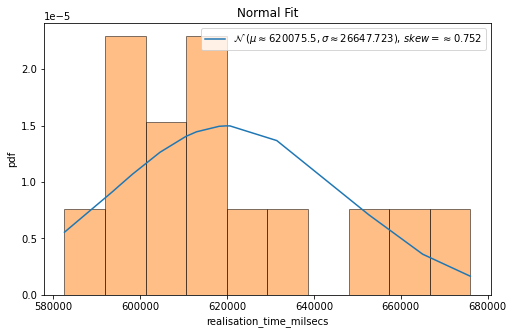


QQ plot 



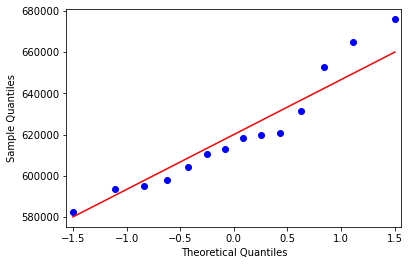


 Shapiro-Wilk Test 
 
Statistics=2.113, p=0.347742
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  realisation_size_kb
max value =  56734688 min value =  49797088
mean=  51291185.71428572 standard deviation=  2192531.433146217
left range=  50194919.997712605 right range=  52387451.43085883
data covered within this range=  50.0 %
percent left and right=  78.57 21.43



normality test :----

kurtosis value=  1.719421225838584
skewness value=  1.842116927451732


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


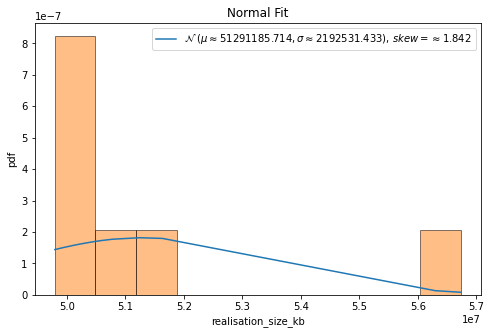


QQ plot 



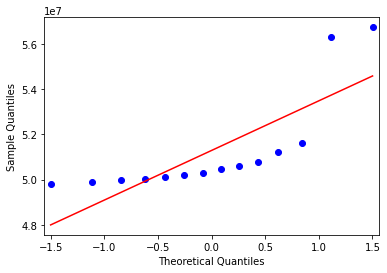


 Shapiro-Wilk Test 
 
Statistics=13.873, p=0.000972
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  classification_time_milsecs
max value =  684282 min value =  590026
mean=  632473.7857142857 standard deviation=  28709.21067775629
left range=  618119.1803754076 right range=  646828.3910531638
data covered within this range=  35.71 %
percent left and right=  57.14 42.86



normality test :----

kurtosis value=  -0.9603073719283395
skewness value=  0.1773947691508114


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


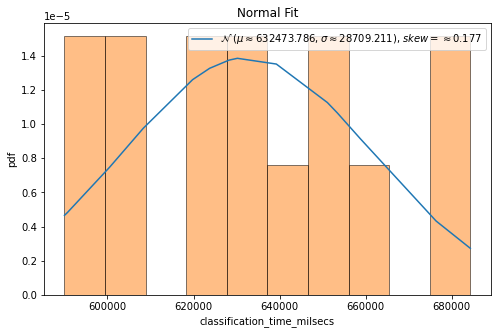


QQ plot 



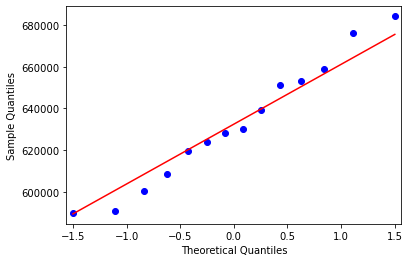


 Shapiro-Wilk Test 
 
Statistics=0.637, p=0.727103
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  classification_size_kb
max value =  82960812 min value =  49932476
mean=  53109371.428571425 standard deviation=  8300560.528260501
left range=  50014060 right range=  82960812
data covered within this range=  92.86 %
percent left and right=  92.86 7.14
data covered within 1 standard deviation=  92.86 %
data covered within 2 standard deviation=  92.86 %
data covered within 3 standard deviation=  92.86 %



normality test :----

kurtosis value=  8.955959110339519
skewness value=  3.2985451322870847


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


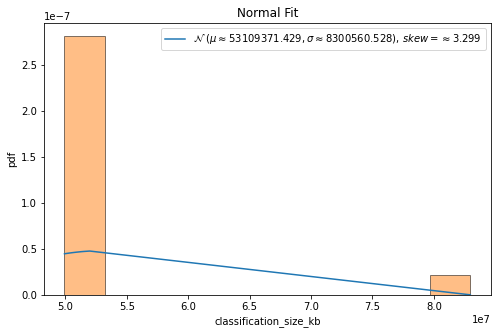


QQ plot 



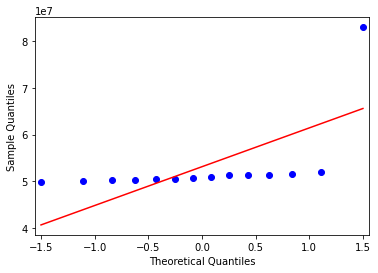


 Shapiro-Wilk Test 
 
Statistics=38.039, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  SOV
max value =  4007514 min value =  3591778
mean=  3795092.6428571427 standard deviation=  128134.6435939316
left range=  3731025.321060177 right range=  3859159.9646541085
data covered within this range=  28.57 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.2300403879753405
skewness value=  0.04688430899890422


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


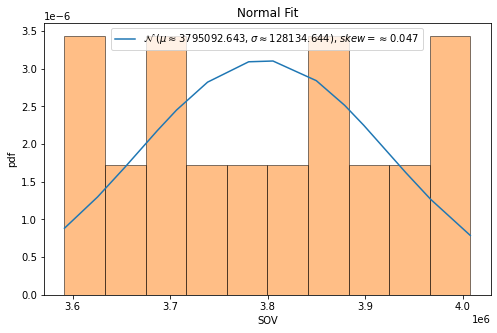


QQ plot 



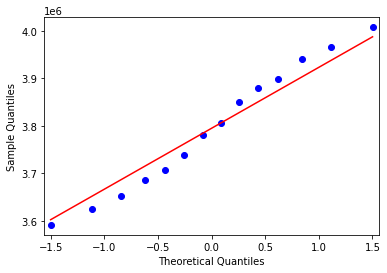


 Shapiro-Wilk Test 
 
Statistics=1.801, p=0.406329
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  ENR
max value =  4.33148532560594 min value =  4.30620516792103
mean=  4.318325350103728 standard deviation=  0.007115793605056793
left range=  4.3147674533012 right range=  4.321883246906256
data covered within this range=  28.57 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -0.9848358933820767
skewness value=  0.028585125705945482


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


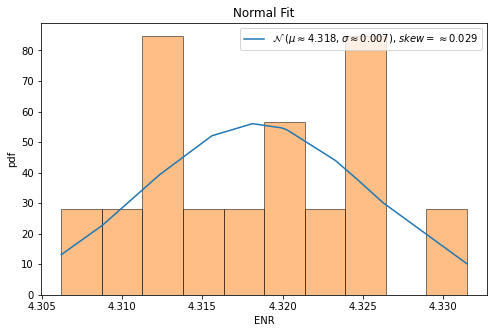


QQ plot 



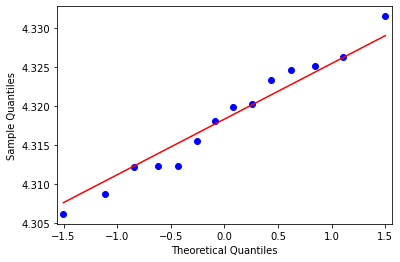


 Shapiro-Wilk Test 
 
Statistics=0.592, p=0.743684
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  TIP
max value =  0 min value =  0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
<ipython-input-262-87a1b557fd88>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-262-87a1b557fd88>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


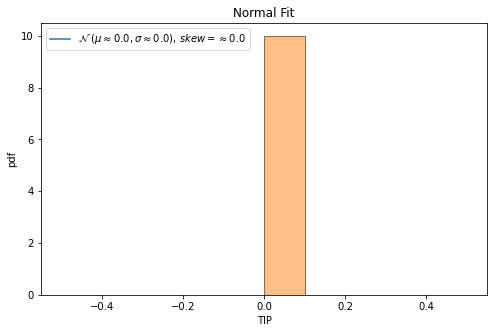


QQ plot 



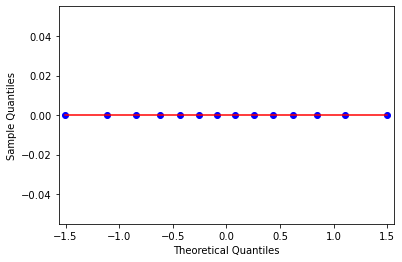


 Shapiro-Wilk Test 
 
Statistics=644.979, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  EOG
max value =  2.6957562257617096 min value =  2.6723253633620696
mean=  2.6843921976998737 standard deviation=  0.006915794498170783
left range=  2.6809343004507884 right range=  2.687850094948959
data covered within this range=  28.57 %
percent left and right=  57.14 42.86



normality test :----

kurtosis value=  -0.9675124640912189
skewness value=  0.1398482636948287


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


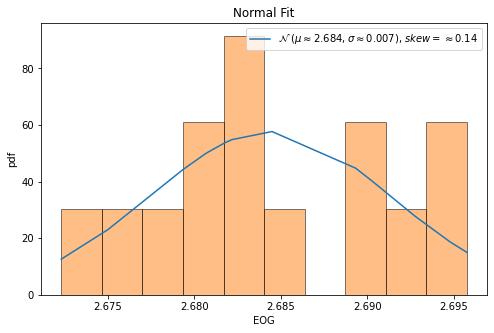


QQ plot 



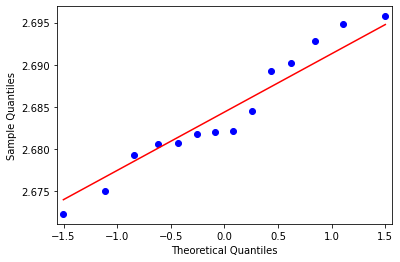


 Shapiro-Wilk Test 
 
Statistics=0.612, p=0.736335
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  CYC
max value =  13351140 min value =  11884494
mean=  12594379.642857144 standard deviation=  450906.61692838464
left range=  12368926.334392952 right range=  12819832.951321336
data covered within this range=  28.57 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.2218427841401922
skewness value=  0.05188444459105279


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


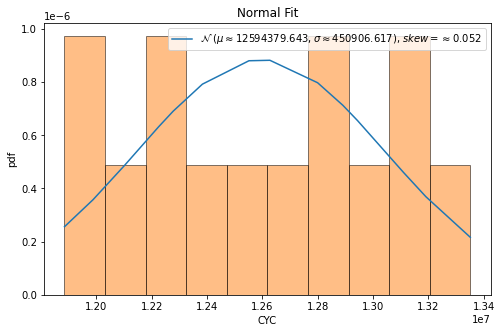


QQ plot 



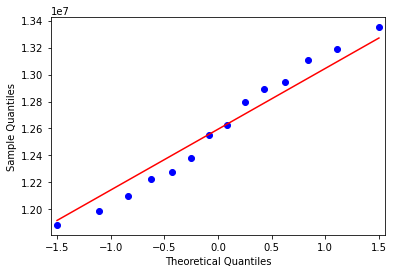


 Shapiro-Wilk Test 
 
Statistics=1.747, p=0.417559
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  HGCI
max value =  19 min value =  19
mean=  19.0 standard deviation=  0.0
left range=  19.0 right range=  19.0
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
<ipython-input-262-87a1b557fd88>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-262-87a1b557fd88>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


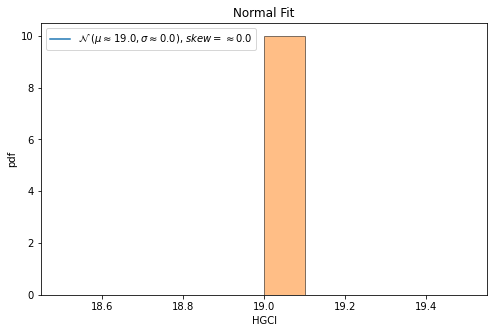


QQ plot 



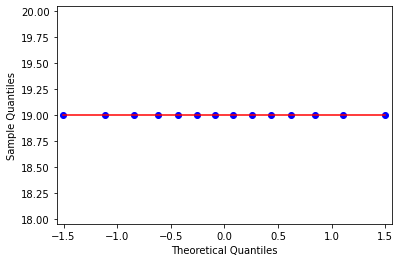


 Shapiro-Wilk Test 
 
Statistics=644.979, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  ELCLSPRT
max value =  0.9268292682926828 min value =  0.9268292682926828
mean=  0.9268292682926825 standard deviation=  2.220446049250313e-16
left range=  0.9268292682926824 right range=  0.9268292682926826
data covered within this range=  0.0 %
percent left and right=  0.0 100.0



normality test :----

kurtosis value=  -2.0
skewness value=  1.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


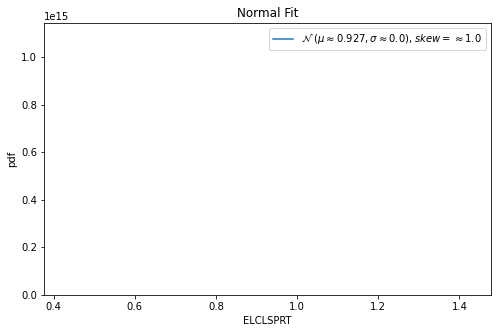


QQ plot 



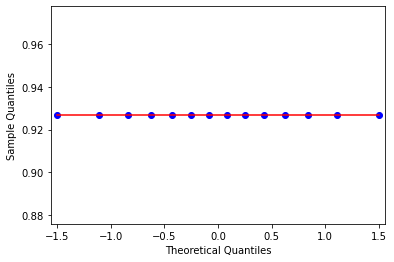


 Shapiro-Wilk Test 
 
Statistics=25.912, p=0.000002
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  HLC
max value =  0 min value =  0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
<ipython-input-262-87a1b557fd88>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-262-87a1b557fd88>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


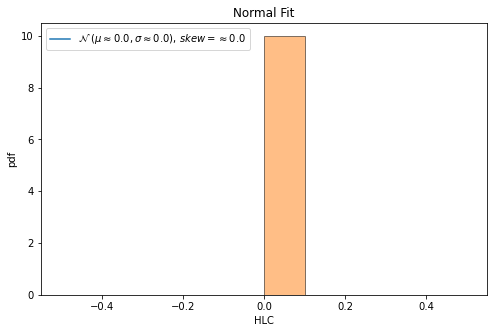


QQ plot 



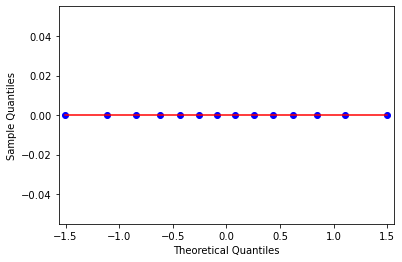


 Shapiro-Wilk Test 
 
Statistics=644.979, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  IHR
max value =  4097630 min value =  3651235
mean=  3866490.4285714286 standard deviation=  137119.8809700654
left range=  3797930.488086396 right range=  3935050.3690564614
data covered within this range=  28.57 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.2190961014462989
skewness value=  0.05567032407035744


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


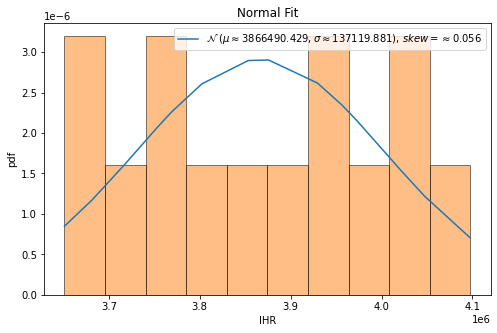


QQ plot 



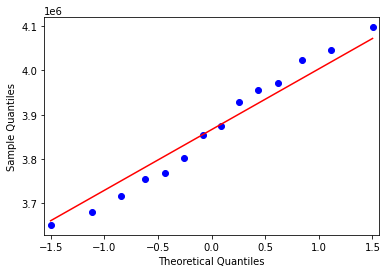


 Shapiro-Wilk Test 
 
Statistics=1.730, p=0.421126
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  IIR
max value =  2088905 min value =  1862804
mean=  1975171.0 standard deviation=  69775.82799836303
left range=  1940283.0860008185 right range=  2010058.9139991815
data covered within this range=  28.57 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.2285576923698145
skewness value=  0.034165925523472786


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


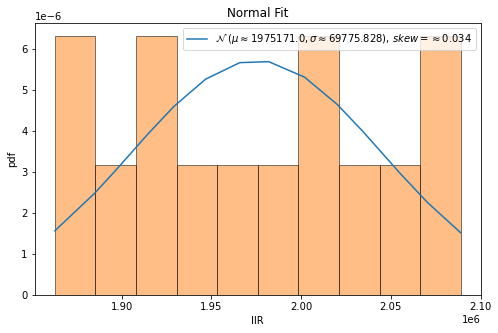


QQ plot 



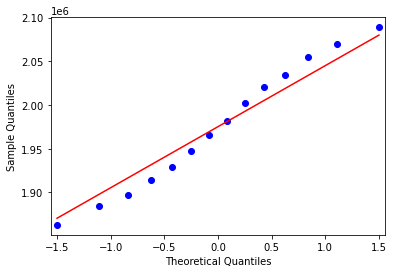


 Shapiro-Wilk Test 
 
Statistics=1.787, p=0.409261
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  ITR
max value =  492037 min value =  438976
mean=  465697.4285714286 standard deviation=  16497.65326910937
left range=  457448.6019368739 right range=  473946.25520598324
data covered within this range=  28.57 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.255306100976611
skewness value=  0.010285966859126963


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


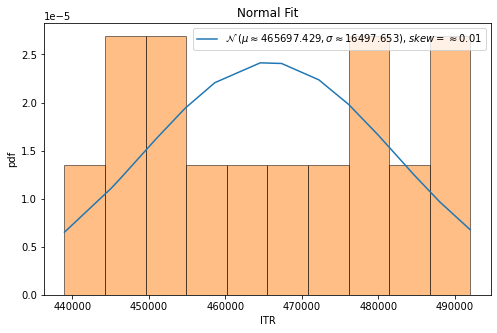


QQ plot 



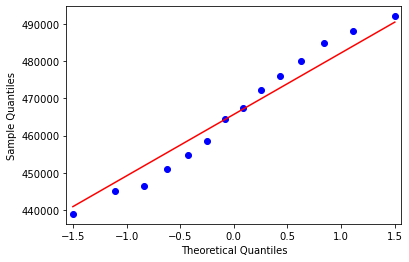


 Shapiro-Wilk Test 
 
Statistics=1.976, p=0.372373
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  IND
max value =  1232214 min value =  1097113
mean=  1160804.5714285714 standard deviation=  41432.281068396565
left range=  1140088.430894373 right range=  1181520.7119627697
data covered within this range=  14.29 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.1979132729569244
skewness value=  0.07494556381374334


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


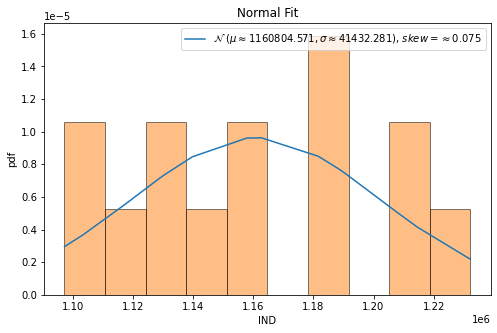


QQ plot 



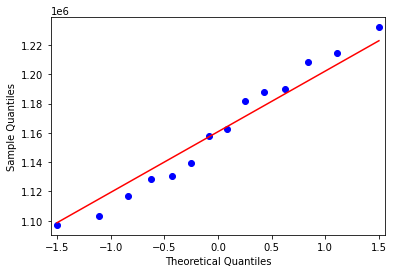


 Shapiro-Wilk Test 
 
Statistics=1.601, p=0.449125
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  aNOC
max value =  0.7011494252873559 min value =  0.7011494252873559
mean=  0.7011494252873559 standard deviation=  0.0
left range=  0.7011494252873559 right range=  0.7011494252873559
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
<ipython-input-262-87a1b557fd88>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-262-87a1b557fd88>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


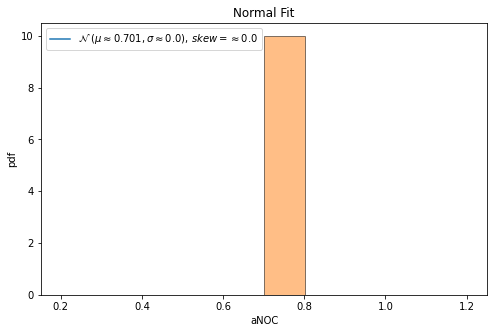


QQ plot 



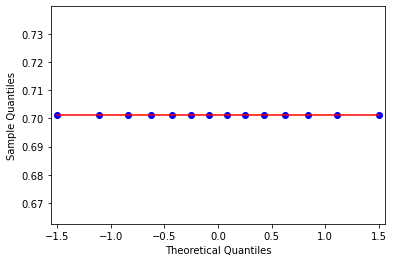


 Shapiro-Wilk Test 
 
Statistics=644.979, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  tNOC
max value =  122 min value =  122
mean=  122.0 standard deviation=  0.0
left range=  122.0 right range=  122.0
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
<ipython-input-262-87a1b557fd88>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-262-87a1b557fd88>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


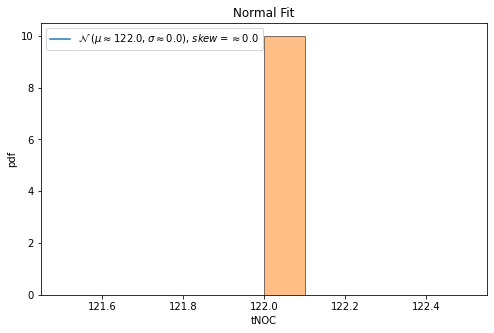


QQ plot 



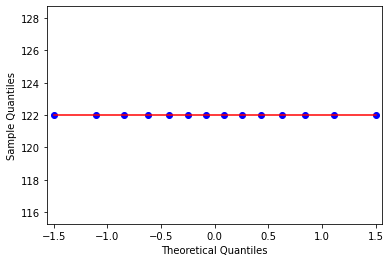


 Shapiro-Wilk Test 
 
Statistics=644.979, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  aCID
max value =  9900.55747126437 min value =  8831.17816091954
mean=  9343.421592775041 standard deviation=  328.9211396246651
left range=  9178.961022962709 right range=  9507.882162587373
data covered within this range=  28.57 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.2197689887682999
skewness value=  0.06035473135240551


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


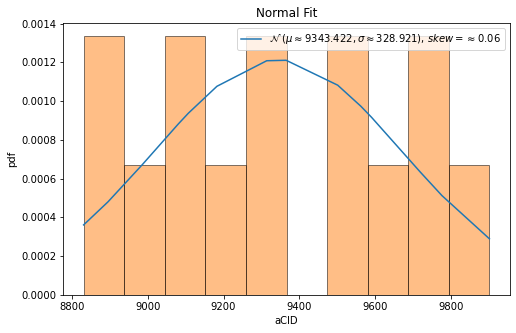


QQ plot 



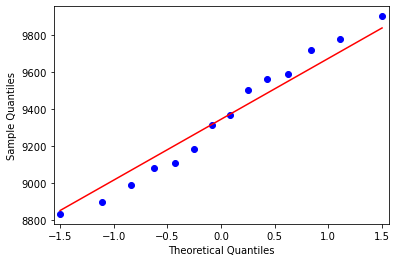


 Shapiro-Wilk Test 
 
Statistics=1.736, p=0.419720
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  mCID
max value =  468056 min value =  417301
mean=  442566.14285714284 standard deviation=  15669.694170856152
left range=  434731.29577171477 right range=  450400.9899425709
data covered within this range=  28.57 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.2336678322319479
skewness value=  0.03457209043919381


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


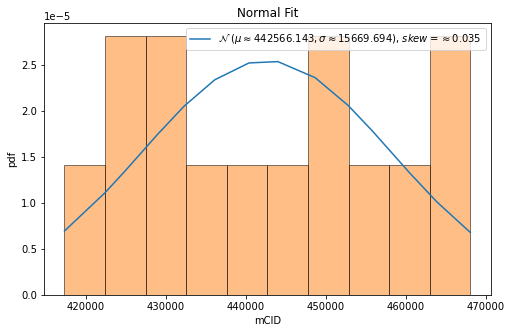


QQ plot 



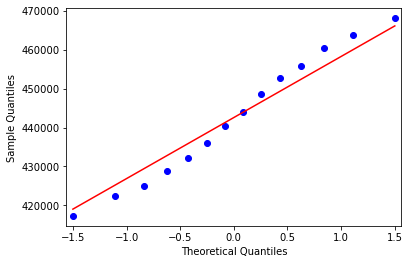


 Shapiro-Wilk Test 
 
Statistics=1.823, p=0.401990
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  tCID
max value =  1722697 min value =  1536625
mean=  1625755.357142857 standard deviation=  57232.27829469154
left range=  1597139.2179955114 right range=  1654371.4962902027
data covered within this range=  28.57 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.2197689887683012
skewness value=  0.06035473135241374


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


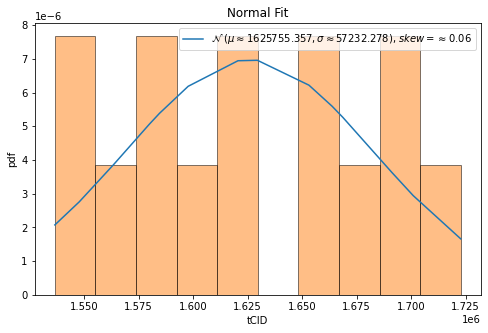


QQ plot 



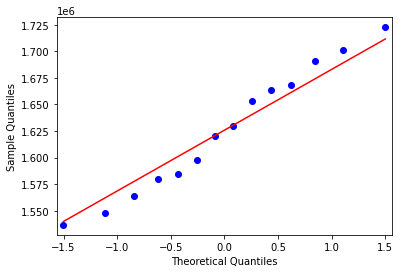


 Shapiro-Wilk Test 
 
Statistics=1.736, p=0.419720
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  aCOD
max value =  13.1551724137931 min value =  13.1551724137931
mean=  13.155172413793101 standard deviation=  1.7763568394002505e-15
left range=  13.1551724137931 right range=  13.155172413793103
data covered within this range=  100.0 %
percent left and right=  100.0 0.0



normality test :----

kurtosis value=  -2.0
skewness value=  -1.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


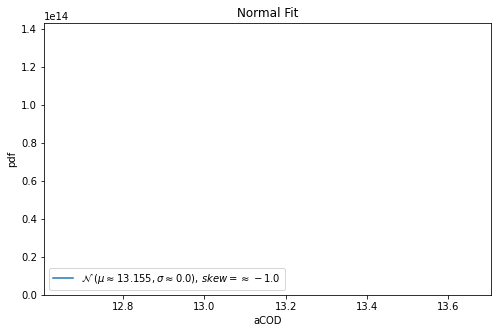


QQ plot 



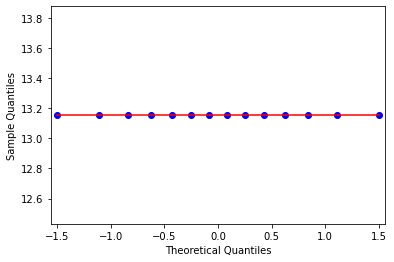


 Shapiro-Wilk Test 
 
Statistics=25.912, p=0.000002
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  tCOD
max value =  2289 min value =  2289
mean=  2289.0 standard deviation=  0.0
left range=  2289.0 right range=  2289.0
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
<ipython-input-262-87a1b557fd88>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-262-87a1b557fd88>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


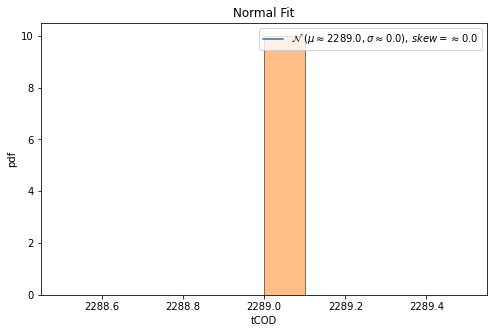


QQ plot 



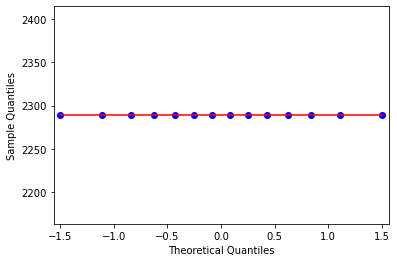


 Shapiro-Wilk Test 
 
Statistics=644.979, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  aNOP
max value =  0.994252873563218 min value =  0.994252873563218
mean=  0.9942528735632179 standard deviation=  1.1102230246251565e-16
left range=  0.9942528735632179 right range=  0.9942528735632179
data covered within this range=  0.0 %
percent left and right=  0.0 100.0



normality test :----

kurtosis value=  -2.0
skewness value=  1.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


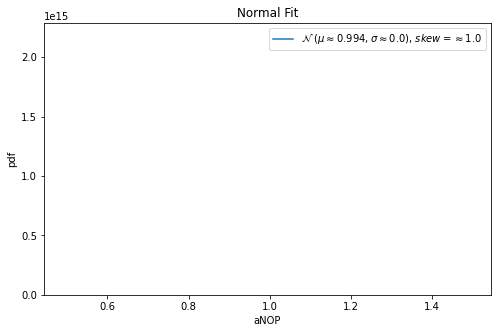


QQ plot 



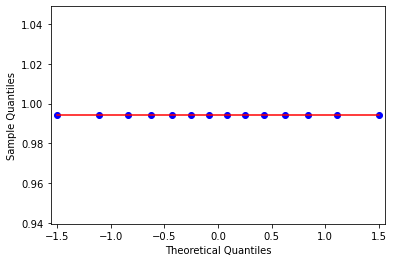


 Shapiro-Wilk Test 
 
Statistics=25.912, p=0.000002
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  ENUMP
max value =  0.0303 min value =  0.0303
mean=  0.030299999999999997 standard deviation=  3.469446951953614e-18
left range=  0.030299999999999994 right range=  0.0303
data covered within this range=  100.0 %
percent left and right=  0.0 100.0



normality test :----

kurtosis value=  -2.0
skewness value=  1.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


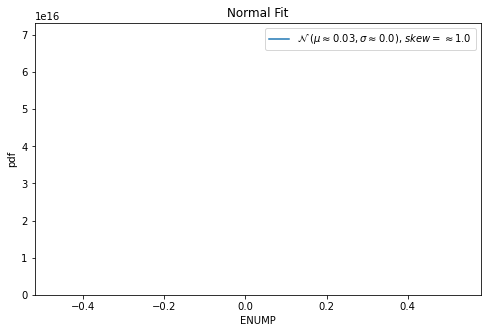


QQ plot 



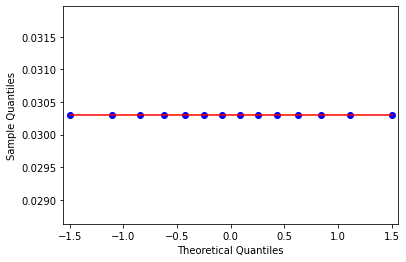


 Shapiro-Wilk Test 
 
Statistics=25.912, p=0.000002
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  NEG
max value =  1 min value =  1
mean=  1.0 standard deviation=  0.0
left range=  1.0 right range=  1.0
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
<ipython-input-262-87a1b557fd88>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-262-87a1b557fd88>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


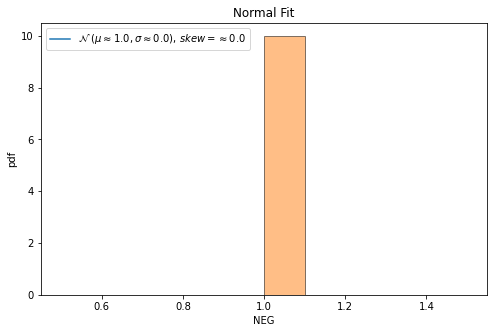


QQ plot 



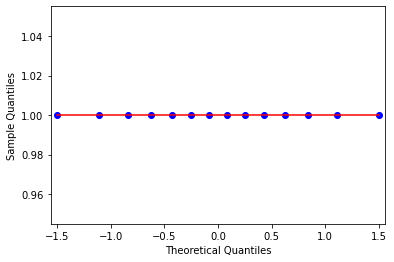


 Shapiro-Wilk Test 
 
Statistics=644.979, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  NEGP
max value =  0.0303 min value =  0.0303
mean=  0.030299999999999997 standard deviation=  3.469446951953614e-18
left range=  0.030299999999999994 right range=  0.0303
data covered within this range=  100.0 %
percent left and right=  0.0 100.0



normality test :----

kurtosis value=  -2.0
skewness value=  1.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


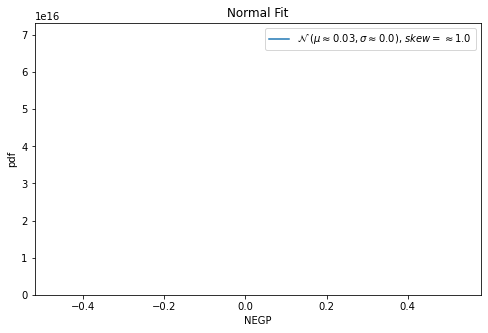


QQ plot 



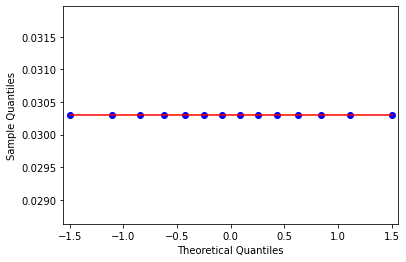


 Shapiro-Wilk Test 
 
Statistics=25.912, p=0.000002
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  CONJP
max value =  0.3939 min value =  0.3939
mean=  0.39390000000000003 standard deviation=  5.551115123125783e-17
left range=  0.39390000000000003 right range=  0.39390000000000003
data covered within this range=  0.0 %
percent left and right=  100.0 0.0



normality test :----

kurtosis value=  -2.0
skewness value=  -1.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


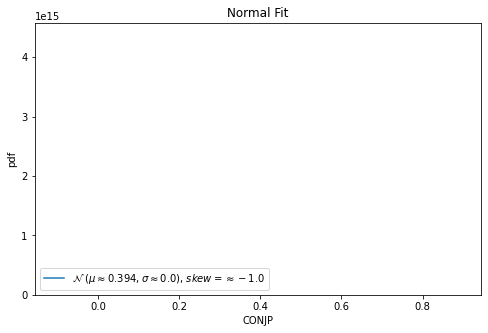


QQ plot 



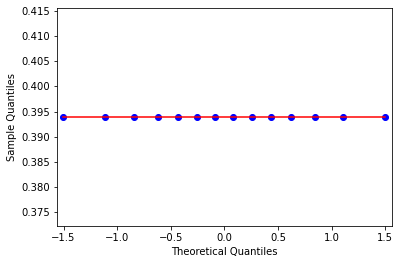


 Shapiro-Wilk Test 
 
Statistics=25.912, p=0.000002
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  EFP
max value =  0.2424 min value =  0.2424
mean=  0.24239999999999998 standard deviation=  2.7755575615628914e-17
left range=  0.24239999999999995 right range=  0.2424
data covered within this range=  100.0 %
percent left and right=  0.0 100.0



normality test :----

kurtosis value=  -2.0
skewness value=  1.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


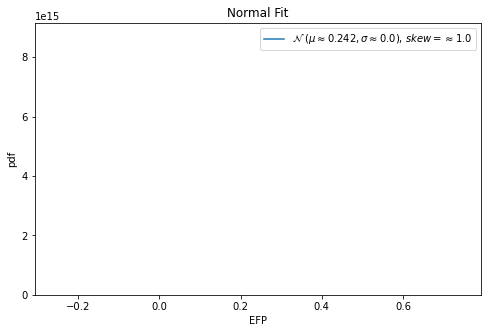


QQ plot 



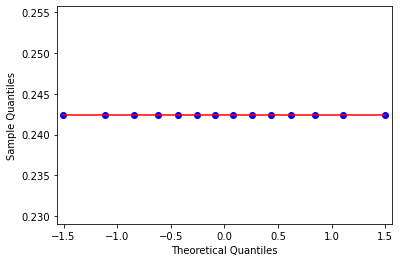


 Shapiro-Wilk Test 
 
Statistics=25.912, p=0.000002
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  VALUE
max value =  1 min value =  1
mean=  1.0 standard deviation=  0.0
left range=  1.0 right range=  1.0
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
<ipython-input-262-87a1b557fd88>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-262-87a1b557fd88>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


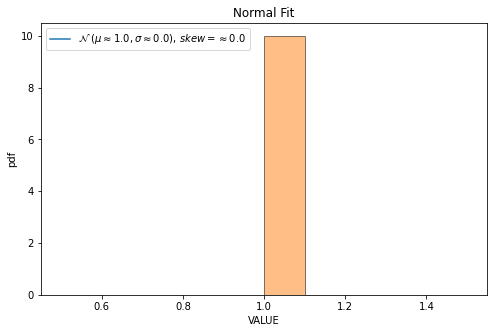


QQ plot 



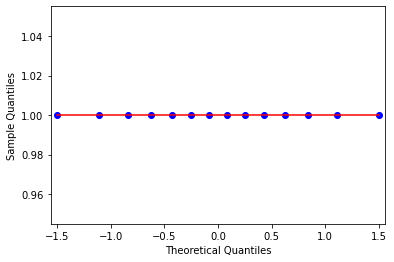


 Shapiro-Wilk Test 
 
Statistics=644.979, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  SELFP
max value =  0.0303 min value =  0.0303
mean=  0.030299999999999997 standard deviation=  3.469446951953614e-18
left range=  0.030299999999999994 right range=  0.0303
data covered within this range=  100.0 %
percent left and right=  0.0 100.0



normality test :----

kurtosis value=  -2.0
skewness value=  1.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


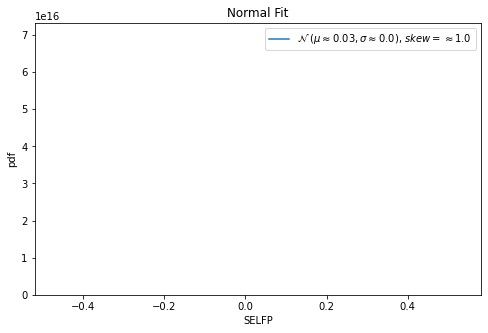


QQ plot 



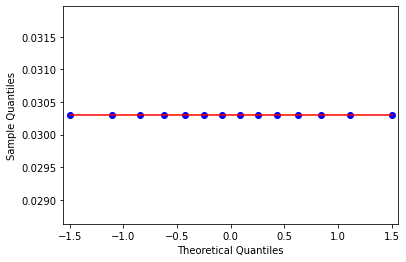


 Shapiro-Wilk Test 
 
Statistics=25.912, p=0.000002
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  MNCARP
max value =  0.0303 min value =  0.0303
mean=  0.030299999999999997 standard deviation=  3.469446951953614e-18
left range=  0.030299999999999994 right range=  0.0303
data covered within this range=  100.0 %
percent left and right=  0.0 100.0



normality test :----

kurtosis value=  -2.0
skewness value=  1.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


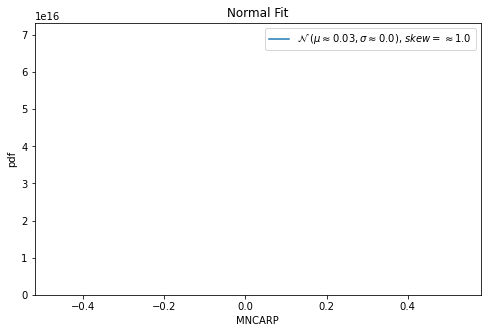


QQ plot 



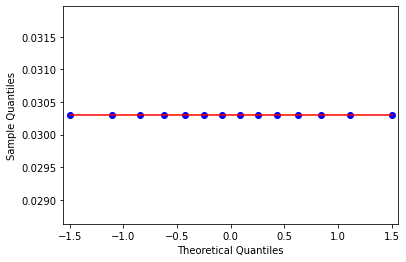


 Shapiro-Wilk Test 
 
Statistics=25.912, p=0.000002
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  OBP
max value =  90 min value =  90
mean=  90.0 standard deviation=  0.0
left range=  90.0 right range=  90.0
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
<ipython-input-262-87a1b557fd88>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-262-87a1b557fd88>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


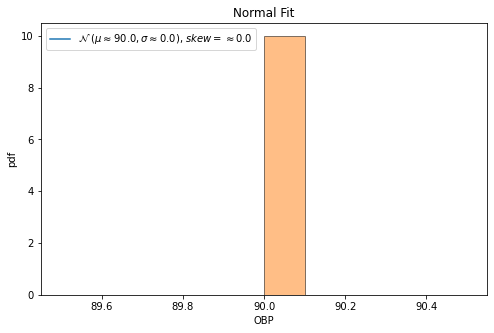


QQ plot 



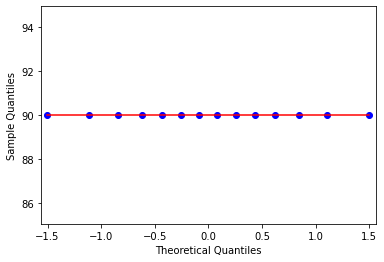


 Shapiro-Wilk Test 
 
Statistics=644.979, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  OBPP
max value =  0.8738 min value =  0.8738
mean=  0.8737999999999998 standard deviation=  2.220446049250313e-16
left range=  0.8737999999999997 right range=  0.8737999999999999
data covered within this range=  0.0 %
percent left and right=  0.0 100.0



normality test :----

kurtosis value=  -2.0
skewness value=  1.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


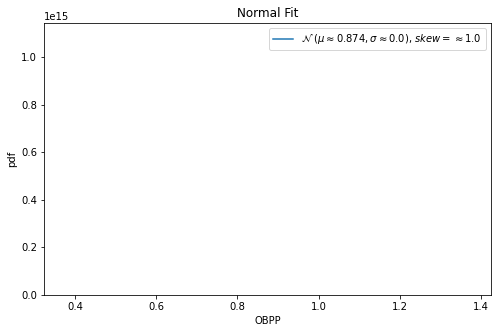


QQ plot 



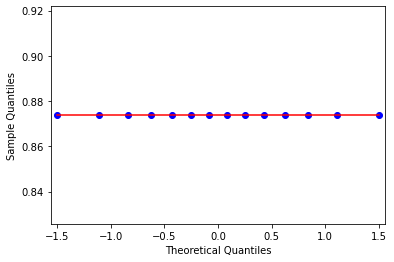


 Shapiro-Wilk Test 
 
Statistics=25.912, p=0.000002
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  DTP
max value =  13 min value =  13
mean=  13.0 standard deviation=  0.0
left range=  13.0 right range=  13.0
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
<ipython-input-262-87a1b557fd88>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-262-87a1b557fd88>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


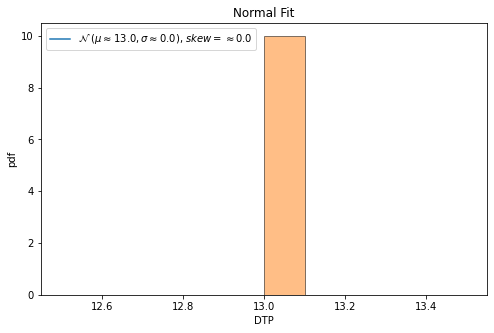


QQ plot 



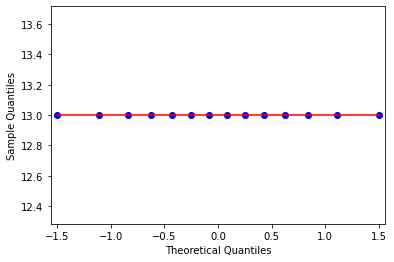


 Shapiro-Wilk Test 
 
Statistics=644.979, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  DTPP
max value =  0.1262 min value =  0.1262
mean=  0.12620000000000003 standard deviation=  2.7755575615628914e-17
left range=  0.12620000000000003 right range=  0.12620000000000003
data covered within this range=  0.0 %
percent left and right=  100.0 0.0



normality test :----

kurtosis value=  -2.0
skewness value=  -1.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


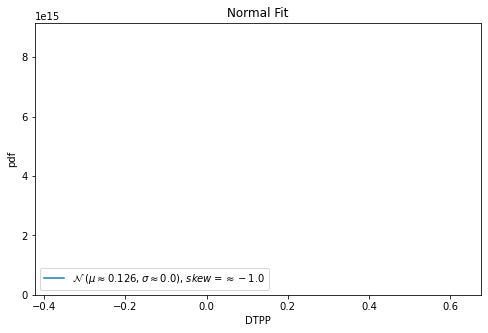


QQ plot 



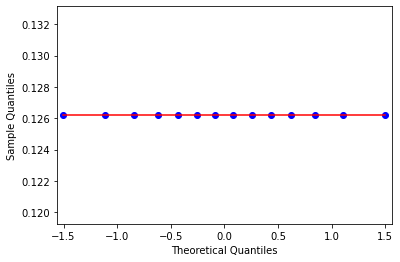


 Shapiro-Wilk Test 
 
Statistics=25.912, p=0.000002
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  FUNP
max value =  0.0485 min value =  0.0485
mean=  0.048499999999999995 standard deviation=  6.938893903907228e-18
left range=  0.04849999999999999 right range=  0.0485
data covered within this range=  100.0 %
percent left and right=  0.0 100.0



normality test :----

kurtosis value=  -2.0
skewness value=  1.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


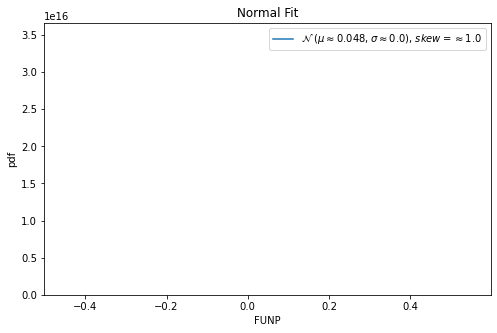


QQ plot 



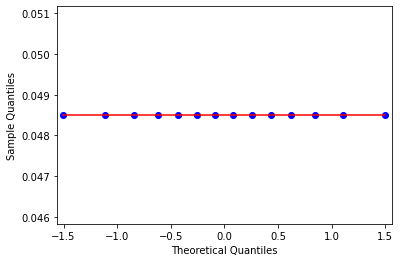


 Shapiro-Wilk Test 
 
Statistics=25.912, p=0.000002
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  SYMP
max value =  0.0194 min value =  0.0194
mean=  0.019399999999999997 standard deviation=  3.469446951953614e-18
left range=  0.019399999999999994 right range=  0.0194
data covered within this range=  100.0 %
percent left and right=  0.0 100.0



normality test :----

kurtosis value=  -2.0
skewness value=  1.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


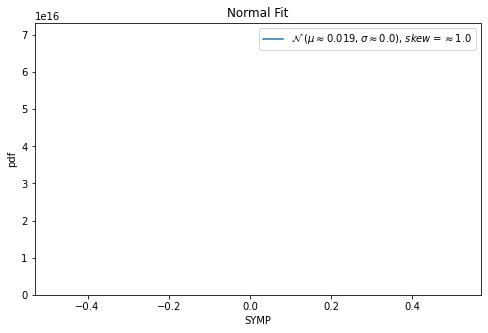


QQ plot 



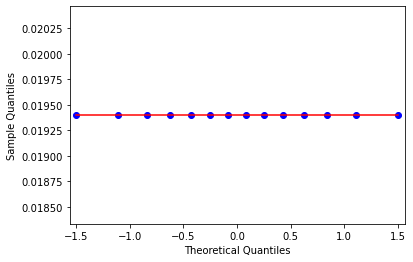


 Shapiro-Wilk Test 
 
Statistics=25.912, p=0.000002
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  SUBP
max value =  65 min value =  65
mean=  65.0 standard deviation=  0.0
left range=  65.0 right range=  65.0
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
<ipython-input-262-87a1b557fd88>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-262-87a1b557fd88>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


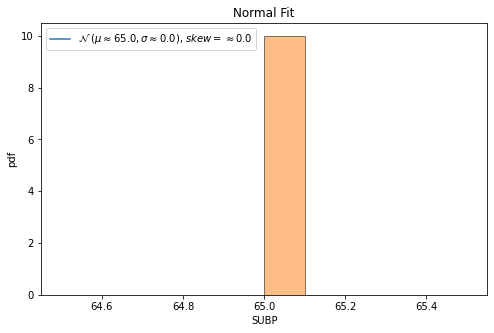


QQ plot 



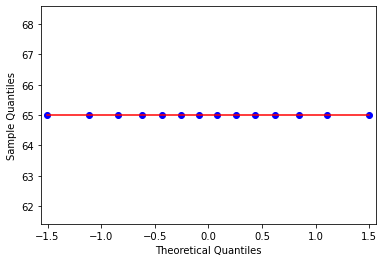


 Shapiro-Wilk Test 
 
Statistics=644.979, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  DISP
max value =  2 min value =  2
mean=  2.0 standard deviation=  0.0
left range=  2.0 right range=  2.0
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
<ipython-input-262-87a1b557fd88>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-262-87a1b557fd88>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


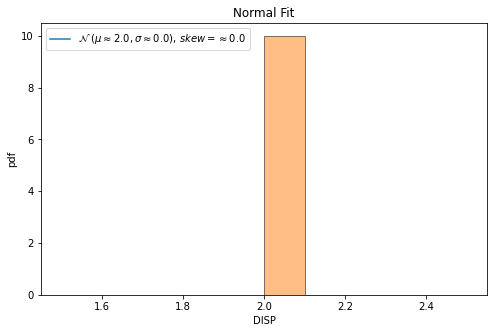


QQ plot 



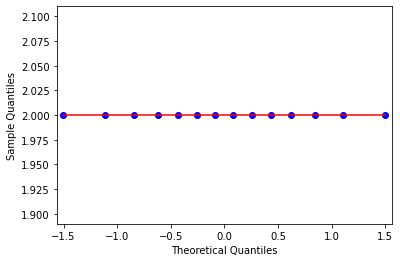


 Shapiro-Wilk Test 
 
Statistics=644.979, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  INV
max value =  22 min value =  22
mean=  22.0 standard deviation=  0.0
left range=  22.0 right range=  22.0
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
<ipython-input-262-87a1b557fd88>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-262-87a1b557fd88>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


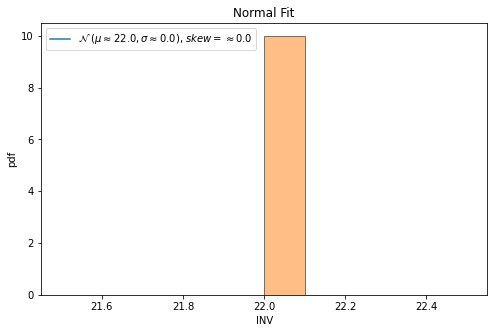


QQ plot 



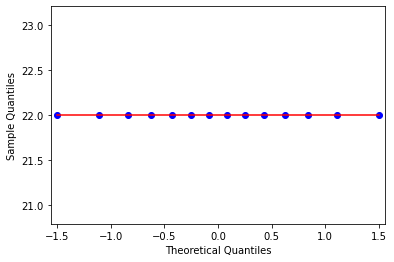


 Shapiro-Wilk Test 
 
Statistics=644.979, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  DOMN
max value =  68 min value =  68
mean=  68.0 standard deviation=  0.0
left range=  68.0 right range=  68.0
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
<ipython-input-262-87a1b557fd88>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-262-87a1b557fd88>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


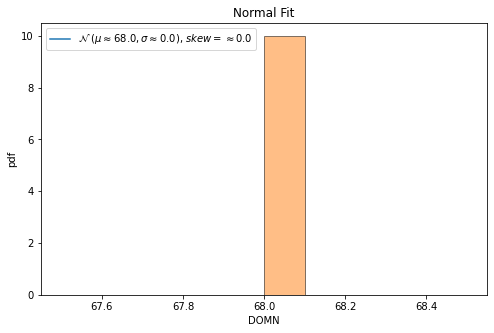


QQ plot 



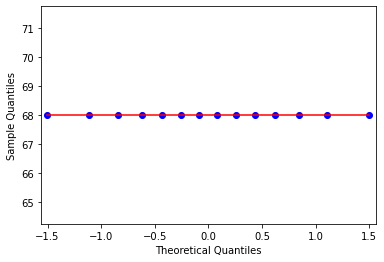


 Shapiro-Wilk Test 
 
Statistics=644.979, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  RANG
max value =  58 min value =  58
mean=  58.0 standard deviation=  0.0
left range=  58.0 right range=  58.0
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
<ipython-input-262-87a1b557fd88>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-262-87a1b557fd88>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


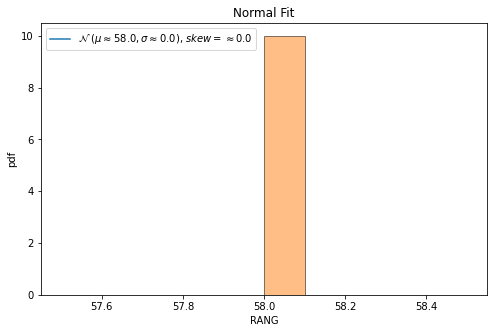


QQ plot 



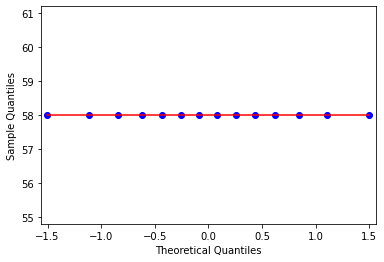


 Shapiro-Wilk Test 
 
Statistics=644.979, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  CHN
max value =  8 min value =  8
mean=  8.0 standard deviation=  0.0
left range=  8.0 right range=  8.0
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
<ipython-input-262-87a1b557fd88>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-262-87a1b557fd88>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


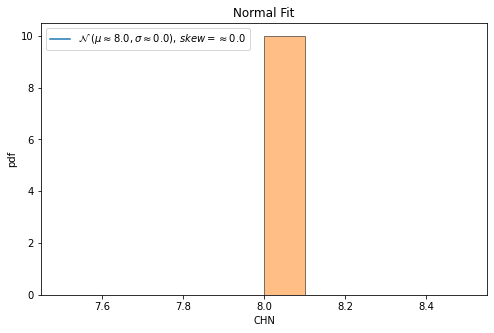


QQ plot 



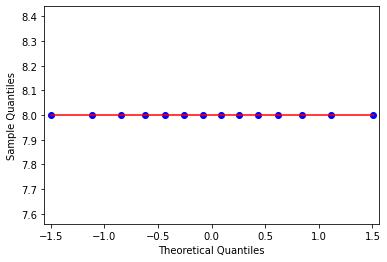


 Shapiro-Wilk Test 
 
Statistics=644.979, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  CHNP
max value =  0.077669902912621 min value =  0.077669902912621
mean=  0.077669902912621 standard deviation=  0.0
left range=  0.077669902912621 right range=  0.077669902912621
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
<ipython-input-262-87a1b557fd88>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-262-87a1b557fd88>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


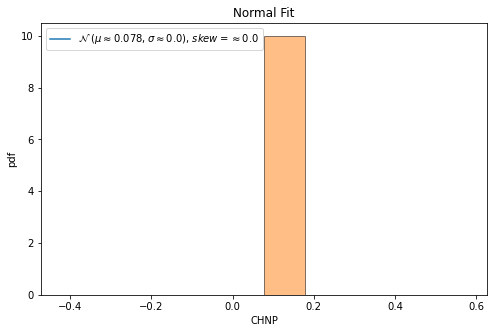


QQ plot 



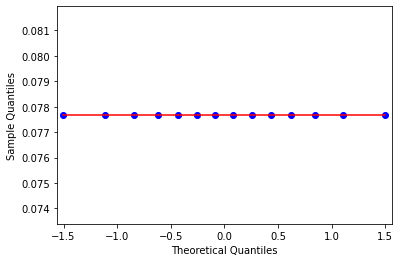


 Shapiro-Wilk Test 
 
Statistics=644.979, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  ELPROP
max value =  0.842741935483871 min value =  0.842741935483871
mean=  0.8427419354838711 standard deviation=  1.1102230246251565e-16
left range=  0.842741935483871 right range=  0.8427419354838712
data covered within this range=  100.0 %
percent left and right=  100.0 0.0



normality test :----

kurtosis value=  -2.0
skewness value=  -1.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


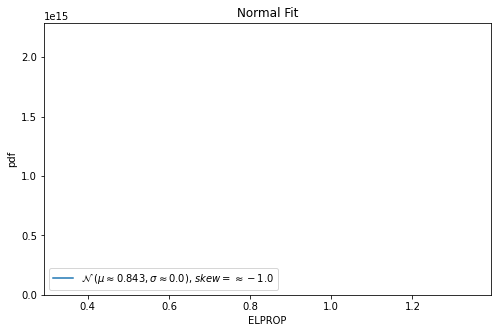


QQ plot 



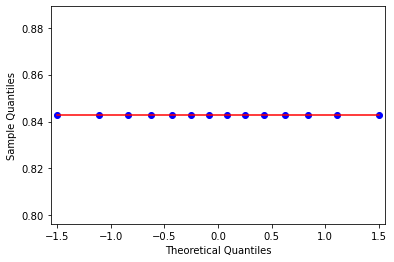


 Shapiro-Wilk Test 
 
Statistics=25.912, p=0.000002
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  CAL_TIME
max value =  7333710 min value =  2442460
mean=  4271891.428571428 standard deviation=  1862604.5516114454
left range=  3340589.1527657053 right range=  5203193.704377151
data covered within this range=  21.43 %
percent left and right=  64.29 35.71



normality test :----

kurtosis value=  -1.545644953316576
skewness value=  0.48586552858359977


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


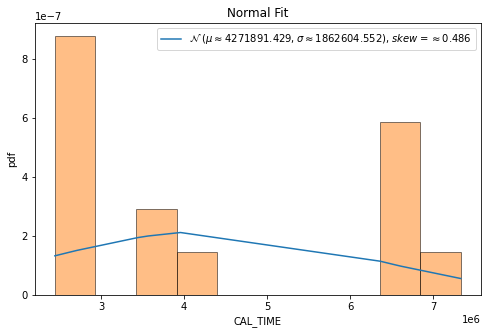


QQ plot 



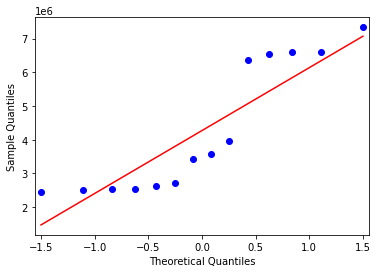


 Shapiro-Wilk Test 
 
Statistics=6.263, p=0.043658
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------



/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


In [262]:
#**** follow the same notation as explained above in 'easy time easy memory' category wherever required*******#

#after medium time and memory clusering ,
#collect the easy ones

from matplotlib import pyplot as plt
%matplotlib inline
#%matplotlib qt 
import scipy
from scipy.stats import norm
from statsmodels.graphics.gofplots import qqplot
import statistics
from scipy.stats import shapiro
from scipy.stats import normaltest
import math
#interquratile range 

def cal(sov_sort):
    p=0
    l=len(sov_sort)
    left=0
    right=0
    while  p < 90 :
        if p==0:
            if l % 2 ==0:
                left=( l /2)
                right=( l / 2) + 1
                p= round((((right -left +1) / l) * 100),2)
                
            else:
                left=math.floor( l /2)
                right=math.ceil(l/2) + 1
                p= round((((right -left +1) / l) * 100),2)
                
        else:
            if left % 2 !=0:
                left = math.ceil(left/2)
            else:
                left = left /2
            
            dist = l - right +1
            if dist % 2 !=0:
                right = right + math.ceil(dist/2)
            else:
                right = right + (dist /2)
                
            p= round((((right -left +1) / l) * 100),2)
             
    return left-1,right-1





print(df_medium_time_mem_feature_df.shape)
medium_time_mem_easy = df_medium_time_mem_feature_df[df_medium_time_mem_feature_df['label_mem']== 'easy']
print(medium_time_mem_easy.shape)
prior_easy= round(medium_time_mem_easy.shape[0] / df_medium_time_mem_feature_df.shape[0] ,5)

main_dict_mtme={}
main_dict_mtme_iqr={}

for i in range(len(cols_list)):
    if cols_list[i] in top_n_2:
        tmp_dict={}
        tmp_dict_iqr={}
        
        feature = cols_list[i]
        print("feature name= ",feature)
        
        sov=np.array(medium_time_mem_easy[feature])
        sov_1=(np.sort(sov))
        skew=scipy.stats.skew(sov)
        
        tmp_dict["skew"]=round(skew,4)
        tmp_dict_iqr["skew"]=round(skew,4)
        
        if -2 < skew and skew < 2:
        
            print("max value = ",np.max(sov),"min value = ",np.min(sov))
            tmp_dict["min"]=round(np.min(sov),9)
            tmp_dict["max"]=round(np.max(sov),9)
            min_val=np.min(sov)
            max_val=np.max(sov)

            mean = np.mean(sov)
            std = np.std(sov)
            print("mean= ",mean,"standard deviation= ",std)
            tmp_dict["mean"]=round(mean,9)
            tmp_dict["std"]=round(std,9)
            #gamma=2
            #rx= mean - ((1- prior_easy) *gamma * std) 
            #ry= mean + ((1- prior_easy) *gamma * std)
            l_weight=0.5
            r_weight=0.5
            rx= mean - (l_weight* std) 
            ry= mean + (r_weight* std)
            print("left range= ",rx,"right range= ", ry)
            tmp_dict["lw_i"]=round(l_weight,9)
            tmp_dict["rw_i"]=round(r_weight,9)
            tmp_dict["lr"]=round(rx,9)
            tmp_dict["rr"]=round(ry,9)

            min_val_w= round(((mean - min_val) /std ),9)
            max_val_w= round(((max_val - mean) /std ),9)
            tmp_dict["min_val_w"]=round(min_val_w,9)
            tmp_dict["max_val_w"]=round(max_val_w,9)


            val=(((rx <= sov) & (sov <= ry)).sum()) / medium_time_mem_easy.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within this range= ",v,"%")

            tmp_dict["percent_i"]=round(v,9)
            tmp_dict["percent_change"]=round(v,9)

            val=(((min_val <= sov) & (sov <= mean)).sum()) / medium_time_mem_easy.shape[0]
            percent_l =  round((val * 100 ),2)

            val=(((mean <= sov) & (sov <= max_val)).sum()) / medium_time_mem_easy.shape[0]
            percent_r =  round((val * 100 ),2)

            print("percent left and right= ",percent_l,percent_r)
            tmp_dict["percent_l"]=percent_l
            tmp_dict["percent_r"]=percent_r
            
            main_dict_mtme[feature]=tmp_dict
            
        else:
            
            left_index,right_index = cal(sov_1)
            rx=sov_1[int(left_index)]
            ry=sov_1[int(right_index)]

            print("max value = ",np.max(sov),"min value = ",np.min(sov))
            
            tmp_dict_iqr["min"]=round(np.min(sov),9)
            tmp_dict_iqr["max"]=round(np.max(sov),9)
            min_val=np.min(sov)
            max_val=np.max(sov)
            
            
            mean = np.mean(sov)
            std = np.std(sov)
            print("mean= ",mean,"standard deviation= ",std)
            tmp_dict_iqr["mean"]=round(mean,9)
            tmp_dict_iqr["std"]=round(std,9)
            
            print("left range= ",rx,"right range= ", ry)
            tmp_dict_iqr["lw_i"]="null"
            tmp_dict_iqr["rw_i"]="null"
            tmp_dict_iqr["lr"]=round(rx,9)
            tmp_dict_iqr["rr"]=round(ry,9)
            
            
            tmp_dict_iqr["min_val_w"]="null"
            tmp_dict_iqr["max_val_w"]="null"
            tmp_dict_iqr["percent_i"]="null"
            val=(((rx <= sov) & (sov <= ry)).sum()) / medium_time_mem_easy.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within this range= ",v,"%")
            tmp_dict_iqr["percent_change"]=round(v,9)
            
            val=(((min_val <= sov) & (sov <= mean)).sum()) / medium_time_mem_easy.shape[0]
            percent_l =  round((val * 100 ),2)

            val=(((mean <= sov) & (sov <= max_val)).sum()) / medium_time_mem_easy.shape[0]
            percent_r =  round((val * 100 ),2)

            print("percent left and right= ",percent_l,percent_r)
            
            tmp_dict_iqr["percent_l"]=percent_l
            tmp_dict_iqr["percent_r"]=percent_r
            
            main_dict_mtme_iqr[feature]=tmp_dict_iqr

            
            # 68–95–99.7 rule, also known as the empirical rule

            # for 1*std
            left = mean - std
            right = mean + std
            val=(((left <= sov) & (sov <= right)).sum()) / medium_time_mem_easy.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 1 standard deviation= ",v,"%")
            
            # for 2*std
            left = mean - (2*std)
            right = mean + (2*std)
            val=(((left <= sov) & (sov <= right)).sum()) / medium_time_mem_easy.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 2 standard deviation= ",v,"%")
            


            # for 3*std
            left = mean - (3*std)
            right = mean + (3*std)
            val=(((left <= sov) & (sov <= right)).sum()) / medium_time_mem_easy.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 3 standard deviation= ",v,"%")
            
        print("\n\n")
        
        #normality test
        print("normality test :----\n")
        # kurtosis and skew function
        kurt=scipy.stats.kurtosis(sov)
        print("kurtosis value= ",kurt)
        
        
        print("skewness value= ",skew)
        
        
        #plotting graph for to see the skewess
        sov_1=np.sort(sov)
        fig, ax1 = plt.subplots(1, 1, figsize=(8,5))
        ax1.plot(sov_1, norm.pdf(sov_1, mean, std),label='$\mathcal{N}$ '+ f'$( \mu \\approx {round(mean,3)} , \sigma \\approx {round(std,3)})$, $ skew = \\approx {round(skew,3)}$')
        ax1.hist(sov_1,edgecolor='black',alpha=0.5,density= True)
        ax1.set_title("Normal Fit")
        ax1.set_xlabel(feature)
        ax1.set_ylabel("pdf")
        ax1.legend()
        #plt.savefig('/home/ritam/ontology_hardness/normal_curve_&_skewness/medium_time_easy_memory/'+str(feature)+'.jpeg')
        plt.show()
        
        # Quantile-Quantile Plot Nomrality check
        print("\nQQ plot \n")
        qqplot(sov_1, line='s')
        plt.show()
        
        #Statistical Normality Tests
        # Shapiro-Wilk Test
        print("\n Shapiro-Wilk Test \n ")
        #stat, p = shapiro(sov_1[0:4998])
        stat, p = normaltest(sov_1)
        print('Statistics=%.3f, p=%f' % (stat, p))
        
        alpha = 0.05
        if p > alpha:
            print('Sample looks Gaussian (fail to reject H0)')
        else:
            print('Sample does not look Gaussian (reject H0)')
            
        print("ends normality test ------------------------------------------------\n")
        
        

In [263]:
#**** follow the same notation as explained above in 'easy time easy memory' category wherever required*******#

import copy

main_dict_cal_mtme={}
dec_rate=[(0.9,0.9)]
for i in range(len(dec_rate)):
 
    main_dict_cal_mtme=copy.deepcopy(main_dict_mtme)
    lower_r=dec_rate[i][0]
    high_r=dec_rate[i][1]
    for j in range (100):
        c=0
        for key,value in main_dict_cal_mtme.items():
            
            if value["percent_change"] < 90:
                
                lw_i_temp=value["lw_i"]
                rw_i_temp=value["rw_i"]
                if value["percent_l"] >= 50:
                    diff=value["min_val_w"] - lw_i_temp
                    frac = round(lower_r * diff, 9)  
                    
                    lw_i_temp= round(lw_i_temp + frac , 9)
                    main_dict_cal_mtme[key]["lw_i"]=lw_i_temp
                else:
                    diff=value["min_val_w"] - lw_i_temp
                    frac = round(high_r * diff, 9)  
                    
                    lw_i_temp= round(lw_i_temp + frac ,9 )
                    main_dict_cal_mtme[key]["lw_i"]=lw_i_temp

                if value["percent_r"] >= 50:
                    diff=value["max_val_w"] - rw_i_temp
                    frac = round(lower_r * diff, 9)  
                    
                    rw_i_temp= round(rw_i_temp + frac , 9 )
                    main_dict_cal_mtme[key]["rw_i"]=rw_i_temp
                else:
                    diff=value["max_val_w"] - rw_i_temp
                    frac = round(high_r * diff, 9)  
                    
                    rw_i_temp= round(rw_i_temp + frac ,9 )
                    main_dict_cal_mtme[key]["rw_i"]=rw_i_temp

                sov=np.array(medium_time_mem_easy[key])
                rx= round(value["mean"] - (lw_i_temp* value["std"]) ,9)
                ry= round(value["mean"] + (rw_i_temp* value["std"]),9)
                main_dict_cal_mtme[key]["lr"]=round(rx,9)
                main_dict_cal_mtme[key]["rr"]=round(ry,9)
                
                val=(((rx <= sov) & (sov <= ry)).sum()) / medium_time_mem_easy.shape[0]
                v =  round((val * 100 ),2)
                main_dict_cal_mtme[key]["percent_change"]=v

                if v >=85:
                    c=c+1
                
            else:
                c=c+1
        p=round(c / len(list(main_dict_cal_mtme.keys())),2)
        print ("percent in loop ",j , "covers ", p , "%" )
        

percent in loop  0 covers  0.9 %
percent in loop  1 covers  0.96 %
percent in loop  2 covers  0.96 %
percent in loop  3 covers  0.96 %
percent in loop  4 covers  0.96 %
percent in loop  5 covers  0.96 %
percent in loop  6 covers  0.96 %
percent in loop  7 covers  0.96 %
percent in loop  8 covers  0.96 %
percent in loop  9 covers  0.96 %
percent in loop  10 covers  0.96 %
percent in loop  11 covers  0.96 %
percent in loop  12 covers  0.96 %
percent in loop  13 covers  0.96 %
percent in loop  14 covers  0.96 %
percent in loop  15 covers  0.96 %
percent in loop  16 covers  0.96 %
percent in loop  17 covers  0.96 %
percent in loop  18 covers  0.96 %
percent in loop  19 covers  0.96 %
percent in loop  20 covers  0.96 %
percent in loop  21 covers  0.96 %
percent in loop  22 covers  0.96 %
percent in loop  23 covers  0.96 %
percent in loop  24 covers  0.96 %
percent in loop  25 covers  0.96 %
percent in loop  26 covers  0.96 %
percent in loop  27 covers  0.96 %
percent in loop  28 covers  0.9

In [264]:
#**** follow the same notation as explained above in 'easy time easy memory' category wherever required*******#

main_dict_cal_mtme
print(len(main_dict_cal_mtme),len(main_dict_mtme_iqr))
mtme_pd=pd.DataFrame(main_dict_cal_mtme)
mtme_iqr_pd=pd.DataFrame(main_dict_mtme_iqr)

frames = [mtme_pd,mtme_iqr_pd]
result = pd.concat(frames,axis=1)
result
#result.to_csv("mtme_ranges.csv")


48 2


In [265]:
medium_time_mem_easy # contians 14 ontologies in this category

,file,size_kb,consistency_time_milsecs,consistency_size_kb,realisation_time_milsecs,realisation_size_kb,classification_time_milsecs,classification_size_kb,SOV,ENR,...,EQVP,DISP,INV,DOMN,RANG,CHN,CHNP,ELPROP,CAL_TIME,label_mem
6,OWL2DL-210.owl,1129377,733716,56204052,631449,56734688,651077,51986764,3591778,4.308760,...,5,2,22,68,58,8,0.07767,0.842742,2442460,easy
7,OWL2DL-212.owl,1139587,623903,50402200,676014,50601952,653379,50397368,3625707,4.306205,...,5,2,22,68,58,8,0.07767,0.842742,6614020,easy
8,OWL2DL-214.owl,1149982,616735,50068120,610524,49966496,684282,50360276,3653413,4.312273,...,5,2,22,68,58,8,0.07767,0.842742,3956700,easy
9,OWL2DL-216.owl,1161516,670292,49925028,595086,50112620,639233,50953272,3686863,4.315591,...,5,2,22,68,58,8,0.07767,0.842742,3439860,easy
10,OWL2DL-218.owl,1167004,653266,50807420,620661,50778620,658791,50014060,3706640,4.312235,...,5,2,22,68,58,8,0.07767,0.842742,2635210,easy
11,OWL2DL-220.owl,1177359,688801,50028128,598200,49918232,600525,49932476,3738368,4.312348,...,5,2,22,68,58,8,0.07767,0.842742,2709220,easy
12,OWL2DL-222.owl,1192779,596130,49942300,665039,56300300,590026,51495236,3780485,4.319926,...,5,2,22,68,58,8,0.07767,0.842742,2520310,easy
13,OWL2DL-224.owl,1200270,602886,50145836,593557,50214800,590715,51329596,3805370,4.318121,...,5,2,22,68,58,8,0.07767,0.842742,6531600,easy
14,OWL2DL-226.owl,1216185,599829,49912292,604533,50021612,623742,50693608,3849767,4.324637,...,5,2,22,68,58,8,0.07767,0.842742,2553340,easy
15,OWL2DL-228.owl,1225140,591810,50278816,582552,51242612,630186,51267520,3878809,4.323278,...,5,2,22,68,58,8,0.07767,0.842742,6604810,easy


(56, 101)
(38, 101)
feature name=  size_kb
max value =  1660138 min value =  1108752
mean=  1454181.605263158 standard deviation=  136601.6949787997
left range=  1385880.7577737581 right range=  1522482.4527525578
data covered within this range=  28.95 %
percent left and right=  47.37 52.63



normality test :----

kurtosis value=  -0.022361042880326032
skewness value=  -0.6141326790668155


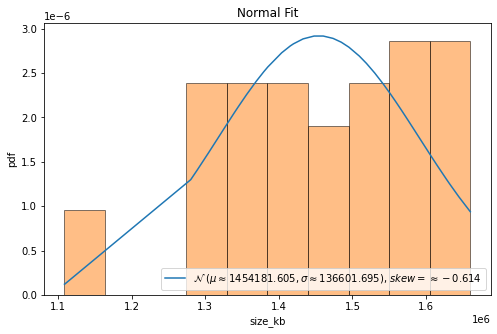


QQ plot 



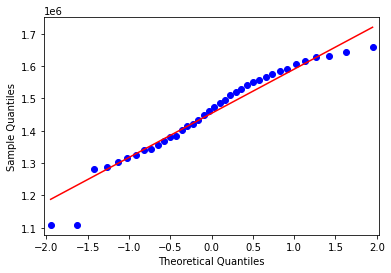


 Shapiro-Wilk Test 
 
Statistics=3.008, p=0.222218
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  consistency_time_milsecs
max value =  898338 min value =  500321
mean=  761017.7368421053 standard deviation=  75669.5531257225
left range=  723182.960279244 right range=  798852.5134049666
data covered within this range=  47.37 %
percent left and right=  47.37 52.63



normality test :----

kurtosis value=  2.7959919224654124
skewness value=  -1.2790748769546685


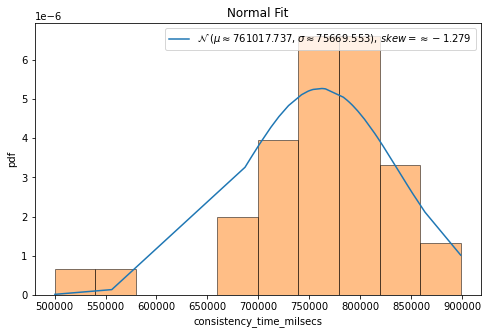


QQ plot 



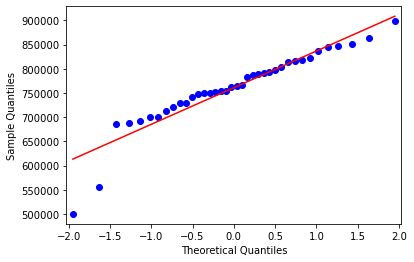


 Shapiro-Wilk Test 
 
Statistics=16.928, p=0.000211
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  consistency_size_kb
38
max value =  88531188 min value =  82886588
mean=  83156168.0 standard deviation=  981522.6866837809
left range=  82892052 right range=  85606796
data covered within this range=  92.11 %
percent left and right=  94.74 5.26
data covered within 1 standard deviation=  94.74 %
data covered within 2 standard deviation=  94.74 %
data covered within 3 standard deviation=  97.37 %



normality test :----

kurtosis value=  21.691597194169184
skewness value=  4.720792838268112


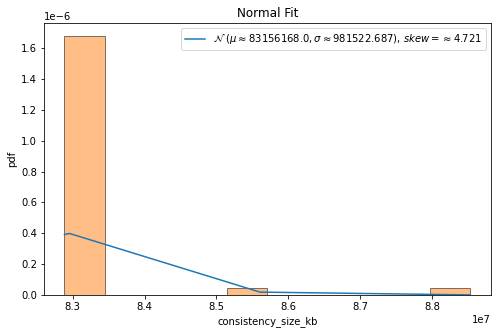


QQ plot 



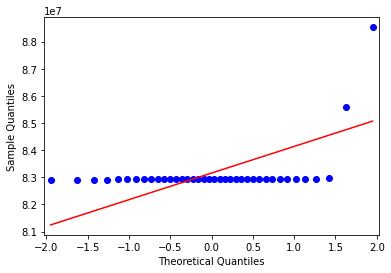


 Shapiro-Wilk Test 
 
Statistics=73.604, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  realisation_time_milsecs
max value =  860720 min value =  506705
mean=  758128.3947368421 standard deviation=  76487.27847699817
left range=  719884.755498343 right range=  796372.0339753412
data covered within this range=  34.21 %
percent left and right=  44.74 55.26



normality test :----

kurtosis value=  2.0557554403405947
skewness value=  -1.3265125479742577


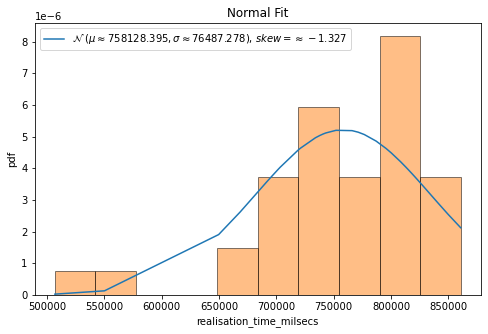


QQ plot 



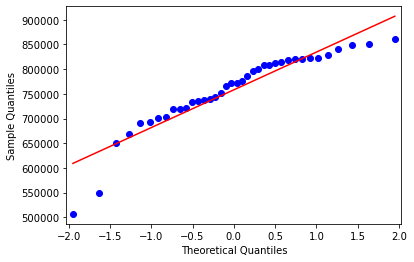


 Shapiro-Wilk Test 
 
Statistics=15.579, p=0.000414
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  realisation_size_kb
38
max value =  89854124 min value =  82888340
mean=  83222571.4736842 standard deviation=  1253047.8925527472
left range=  82892296 right range=  86797824
data covered within this range=  92.11 %
percent left and right=  94.74 5.26
data covered within 1 standard deviation=  94.74 %
data covered within 2 standard deviation=  94.74 %
data covered within 3 standard deviation=  97.37 %



normality test :----

kurtosis value=  19.391255608494394
skewness value=  4.501012213651714


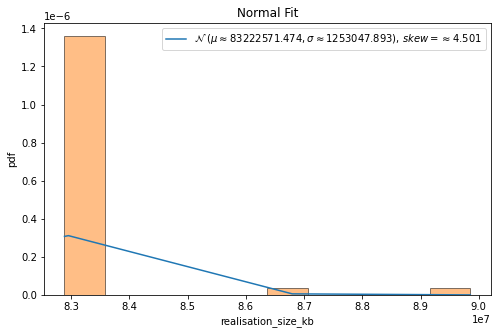


QQ plot 



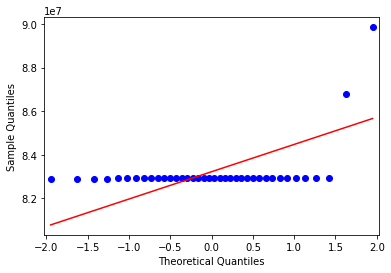


 Shapiro-Wilk Test 
 
Statistics=70.343, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  classification_time_milsecs
max value =  893876 min value =  517881
mean=  761421.2105263158 standard deviation=  76322.3173708085
left range=  723260.0518409116 right range=  799582.3692117201
data covered within this range=  50.0 %
percent left and right=  42.11 57.89



normality test :----

kurtosis value=  2.1475535215418526
skewness value=  -1.1308621646526056


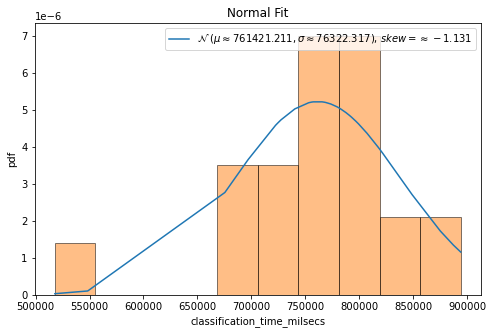


QQ plot 



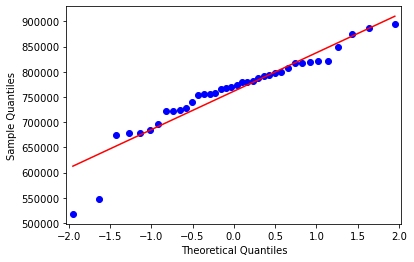


 Shapiro-Wilk Test 
 
Statistics=13.617, p=0.001105
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  classification_size_kb
38
max value =  88689260 min value =  82890844
mean=  83162374.94736843 standard deviation=  1010984.3189840948
left range=  82891964 right range=  85706104
data covered within this range=  92.11 %
percent left and right=  94.74 5.26
data covered within 1 standard deviation=  94.74 %
data covered within 2 standard deviation=  94.74 %
data covered within 3 standard deviation=  97.37 %



normality test :----

kurtosis value=  21.562094863624065
skewness value=  4.708174234879399


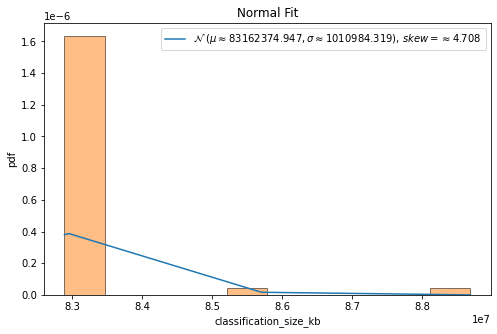


QQ plot 



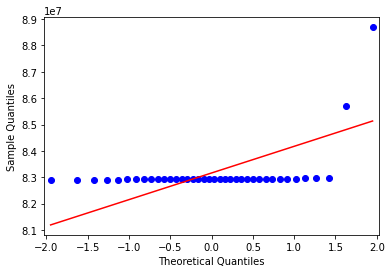


 Shapiro-Wilk Test 
 
Statistics=73.424, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  SOV
max value =  5178704 min value =  3389777
mean=  4556865.368421053 standard deviation=  428390.85676255863
left range=  4342669.9400397735 right range=  4771060.796802332
data covered within this range=  31.58 %
percent left and right=  47.37 52.63



normality test :----

kurtosis value=  0.5999883322571744
skewness value=  -0.826625476800434


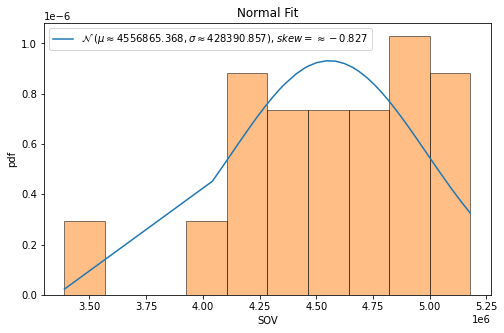


QQ plot 



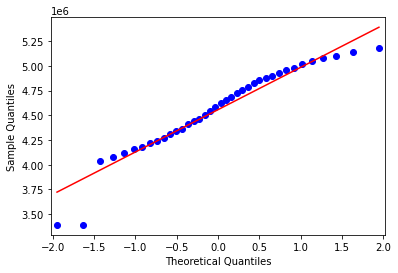


 Shapiro-Wilk Test 
 
Statistics=6.235, p=0.044268
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  ENR
max value =  4.37108711003372 min value =  4.2914029602769235
mean=  4.3483916896356964 standard deviation=  0.017571979436154614
left range=  4.33960569991762 right range=  4.357177679353773
data covered within this range=  34.21 %
percent left and right=  42.11 57.89



normality test :----

kurtosis value=  3.2031720099747867
skewness value=  -1.631256001696173


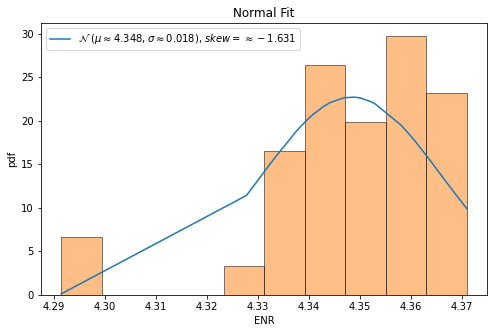


QQ plot 



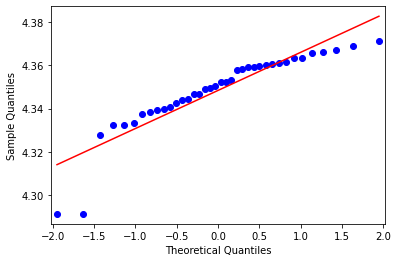


 Shapiro-Wilk Test 
 
Statistics=21.952, p=0.000017
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  TIP
38
max value =  18 min value =  0
mean=  0.6052631578947368 standard deviation=  2.969489356103348
left range=  0 right range=  5
data covered within this range=  97.37 %
percent left and right=  94.74 5.26
data covered within 1 standard deviation=  94.74 %
data covered within 2 standard deviation=  97.37 %
data covered within 3 standard deviation=  97.37 %



normality test :----

kurtosis value=  28.113542976186164
skewness value=  5.366904051521242


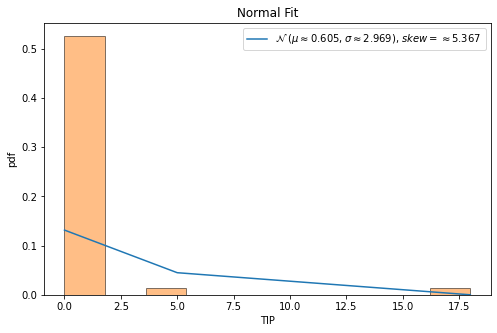


QQ plot 



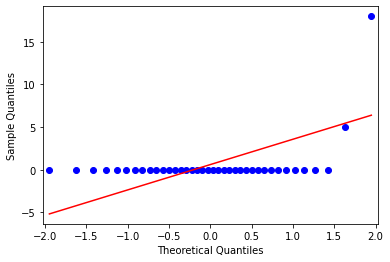


 Shapiro-Wilk Test 
 
Statistics=82.059, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  EOG
max value =  2.6935720542396844 min value =  2.62624237820608
mean=  2.655757548787496 standard deviation=  0.016517282503928674
left range=  2.6474989075355313 right range=  2.6640161900394603
data covered within this range=  28.95 %
percent left and right=  60.53 39.47



normality test :----

kurtosis value=  -0.36801947758240017
skewness value=  0.3972430747638425


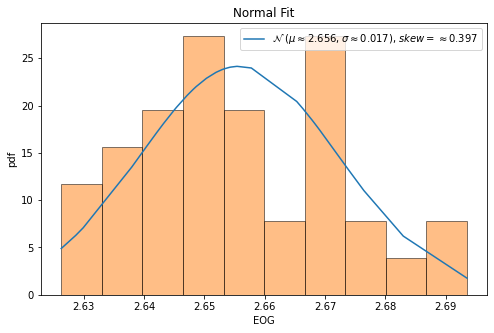


QQ plot 



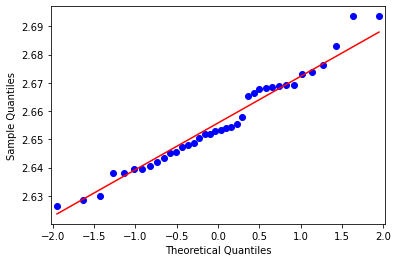


 Shapiro-Wilk Test 
 
Statistics=1.273, p=0.529239
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  CYC
max value =  17458028 min value =  11157267
mean=  15265675.184210526 standard deviation=  1504582.4801957493
left range=  14513383.944112651 right range=  16017966.4243084
data covered within this range=  31.58 %
percent left and right=  47.37 52.63



normality test :----

kurtosis value=  0.6230446773363236
skewness value=  -0.8340071618771276


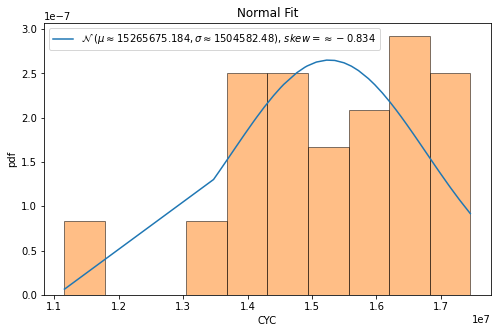


QQ plot 



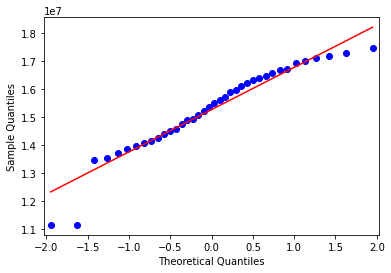


 Shapiro-Wilk Test 
 
Statistics=6.366, p=0.041455
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  HGCI
38
max value =  19 min value =  3
mean=  18.18421052631579 standard deviation=  3.463001916180259
left range=  19 right range=  19
data covered within this range=  94.74 %
percent left and right=  5.26 94.74
data covered within 1 standard deviation=  94.74 %
data covered within 2 standard deviation=  94.74 %
data covered within 3 standard deviation=  94.74 %



normality test :----

kurtosis value=  14.136538929939725
skewness value=  -4.014302947176283


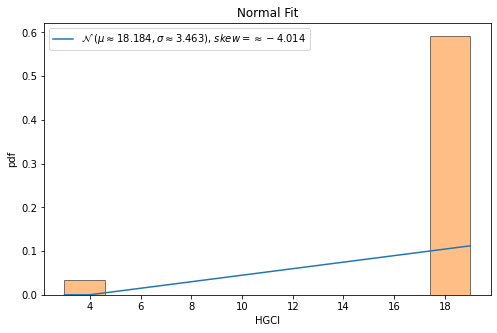


QQ plot 



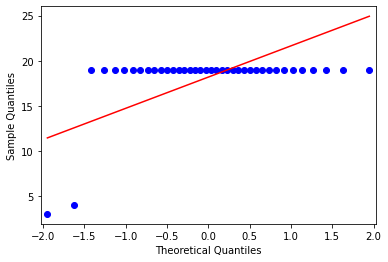


 Shapiro-Wilk Test 
 
Statistics=62.134, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  ELCLSPRT
38
max value =  0.9935064935064936 min value =  0.9268292682926828
mean=  0.929712029519475 standard deviation=  0.012531749488120077
left range=  0.9268292682926828 right range=  0.9696969696969696
data covered within this range=  97.37 %
percent left and right=  94.74 5.26
data covered within 1 standard deviation=  94.74 %
data covered within 2 standard deviation=  94.74 %
data covered within 3 standard deviation=  94.74 %



normality test :----

kurtosis value=  17.40273903985981
skewness value=  4.31488462338094


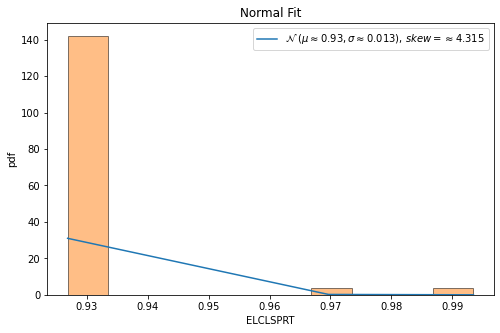


QQ plot 



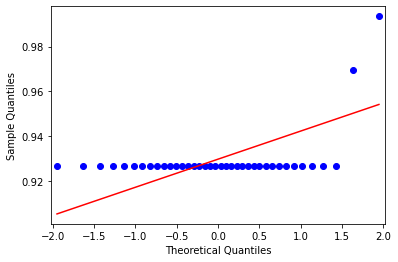


 Shapiro-Wilk Test 
 
Statistics=67.382, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  HLC
38
max value =  14 min value =  0
mean=  0.42105263157894735 standard deviation=  2.255187924803006
left range=  0 right range=  2
data covered within this range=  97.37 %
percent left and right=  94.74 5.26
data covered within 1 standard deviation=  97.37 %
data covered within 2 standard deviation=  97.37 %
data covered within 3 standard deviation=  97.37 %



normality test :----

kurtosis value=  31.597419795805017
skewness value=  5.747554854703199


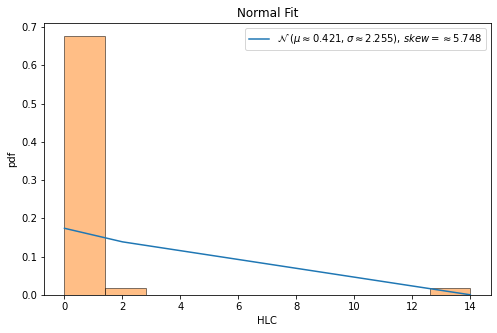


QQ plot 



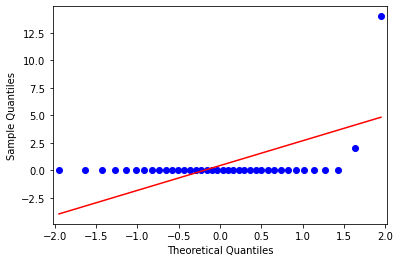


 Shapiro-Wilk Test 
 
Statistics=86.423, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  IHR
max value =  5349324 min value =  2585886
mean=  4636268.105263158 standard deviation=  597306.7250454894
left range=  4337614.742740413 right range=  4934921.467785902
data covered within this range=  44.74 %
percent left and right=  44.74 55.26



normality test :----

kurtosis value=  4.594092811867142
skewness value=  -1.9396241395522724


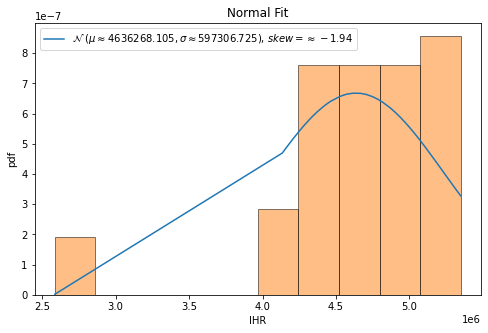


QQ plot 



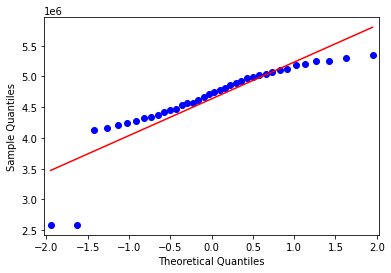


 Shapiro-Wilk Test 
 
Statistics=28.497, p=0.000001
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  IIR
max value =  2727959 min value =  1756393
mean=  2391388.8947368423 standard deviation=  233739.206442924
left range=  2274519.29151538 right range=  2508258.4979583044
data covered within this range=  31.58 %
percent left and right=  47.37 52.63



normality test :----

kurtosis value=  0.5715862239923855
skewness value=  -0.8167046597039698


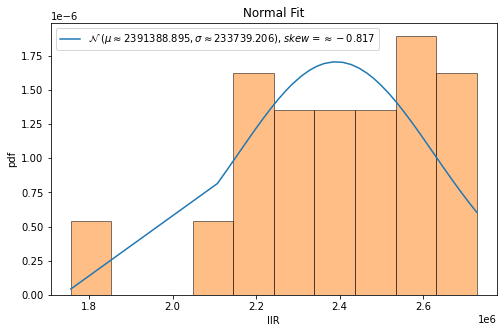


QQ plot 



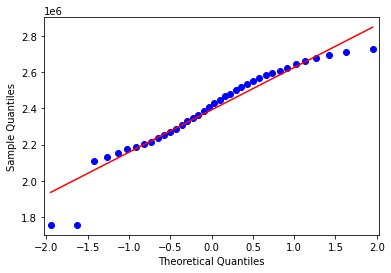


 Shapiro-Wilk Test 
 
Statistics=6.066, p=0.048169
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  ITR
38
max value =  642900 min value =  0
mean=  552816.552631579 standard deviation=  103372.70828432764
left range=  496917 right range=  638558
data covered within this range=  92.11 %
percent left and right=  42.11 57.89
data covered within 1 standard deviation=  94.74 %
data covered within 2 standard deviation=  97.37 %
data covered within 3 standard deviation=  97.37 %



normality test :----

kurtosis value=  18.691819007924295
skewness value=  -3.9929638741283764


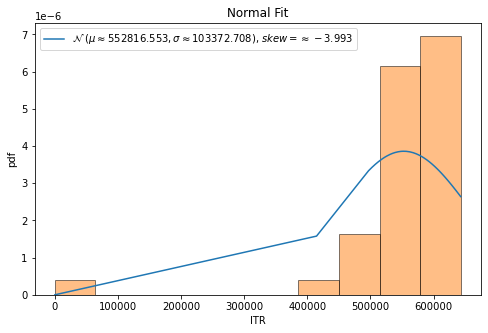


QQ plot 



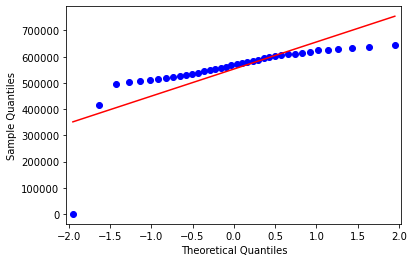


 Shapiro-Wilk Test 
 
Statistics=65.402, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  IND
max value =  1607167 min value =  1028838
mean=  1404812.2894736843 standard deviation=  137449.99975721468
left range=  1336087.2895950768 right range=  1473537.2893522917
data covered within this range=  34.21 %
percent left and right=  47.37 52.63



normality test :----

kurtosis value=  0.6427678878527092
skewness value=  -0.8404763787747284


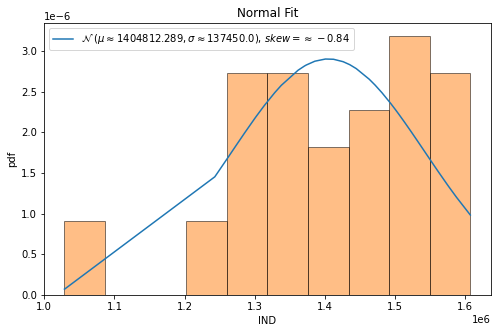


QQ plot 



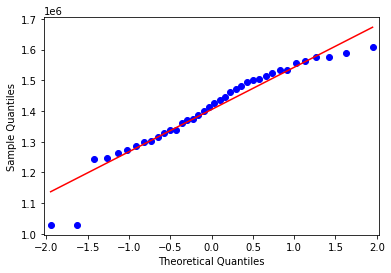


 Shapiro-Wilk Test 
 
Statistics=6.481, p=0.039149
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  aNOC
38
max value =  0.8562874251497006 min value =  0.7011494252873559
mean=  0.7082044552525545 standard deviation=  0.030320576456436023
left range=  0.7011494252873559 right range=  0.8141025641025641
data covered within this range=  97.37 %
percent left and right=  94.74 5.26
data covered within 1 standard deviation=  94.74 %
data covered within 2 standard deviation=  94.74 %
data covered within 3 standard deviation=  94.74 %



normality test :----

kurtosis value=  15.890816397075572
skewness value=  4.174855811039369


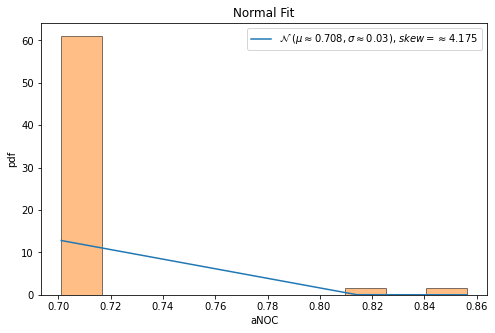


QQ plot 



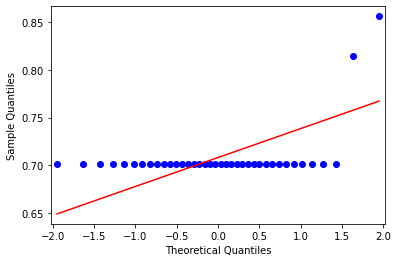


 Shapiro-Wilk Test 
 
Statistics=65.018, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  tNOC
38
max value =  143 min value =  122
mean=  122.6842105263158 standard deviation=  3.434386968647463
left range=  122 right range=  127
data covered within this range=  97.37 %
percent left and right=  94.74 5.26
data covered within 1 standard deviation=  94.74 %
data covered within 2 standard deviation=  97.37 %
data covered within 3 standard deviation=  97.37 %



normality test :----

kurtosis value=  29.289250681887232
skewness value=  5.4918867378123295


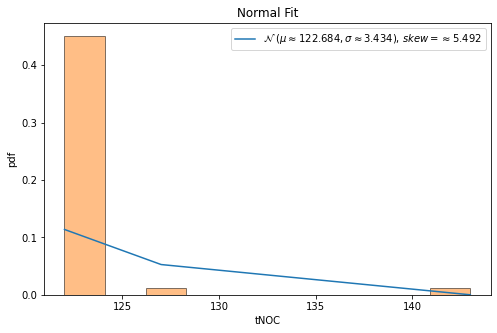


QQ plot 



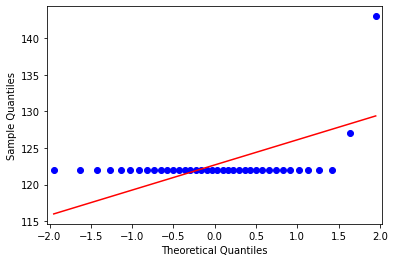


 Shapiro-Wilk Test 
 
Statistics=83.537, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  aCID
max value =  12899.172413793101 min value =  8634.353293413174
mean=  11327.960446620367 standard deviation=  1014.1032277189013
left range=  10820.908832760917 right range=  11835.012060479818
data covered within this range=  28.95 %
percent left and right=  47.37 52.63



normality test :----

kurtosis value=  -0.29612192774402013
skewness value=  -0.4924180037449495


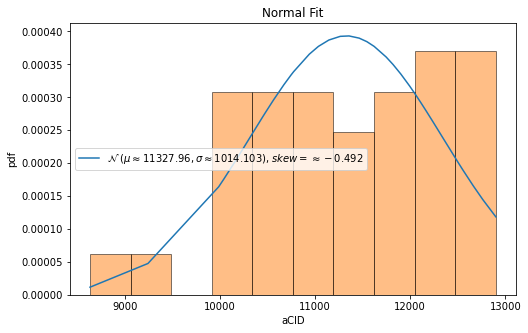


QQ plot 



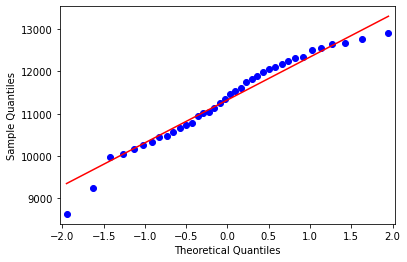


 Shapiro-Wilk Test 
 
Statistics=1.875, p=0.391629
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  mCID
max value =  610136 min value =  394189
mean=  535313.5789473684 standard deviation=  51869.51650086244
left range=  509378.8206969372 right range=  561248.3371977997
data covered within this range=  31.58 %
percent left and right=  47.37 52.63



normality test :----

kurtosis value=  0.5885266756235037
skewness value=  -0.8214576120878961


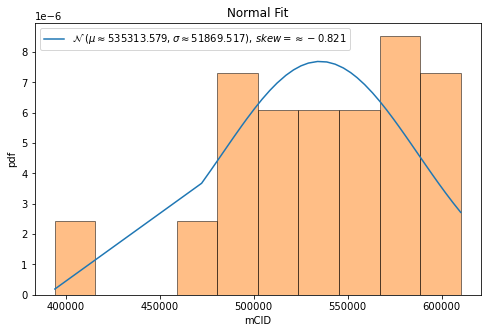


QQ plot 



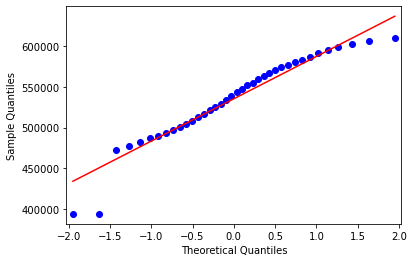


 Shapiro-Wilk Test 
 
Statistics=6.155, p=0.046070
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  tCID
max value =  2244456 min value =  1441937
mean=  1965096.0789473683 standard deviation=  191290.54777214545
left range=  1869450.8050612956 right range=  2060741.352833441
data covered within this range=  34.21 %
percent left and right=  47.37 52.63



normality test :----

kurtosis value=  0.6390846098519081
skewness value=  -0.8401633877247064


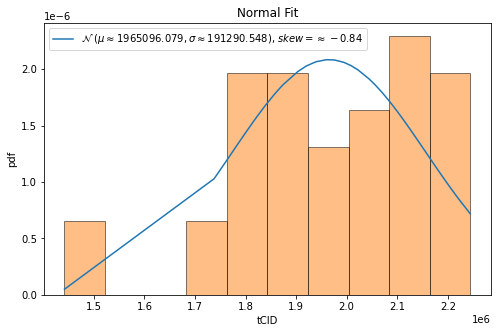


QQ plot 



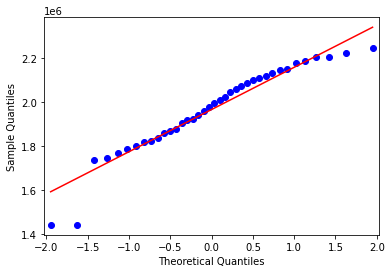


 Shapiro-Wilk Test 
 
Statistics=6.468, p=0.039394
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  aCOD
38
max value =  15.006410256410255 min value =  13.1551724137931
mean=  13.219818320917838 standard deviation=  0.30927215566655625
left range=  13.1551724137931 right range=  13.760479041916168
data covered within this range=  97.37 %
percent left and right=  94.74 5.26
data covered within 1 standard deviation=  94.74 %
data covered within 2 standard deviation=  97.37 %
data covered within 3 standard deviation=  97.37 %



normality test :----

kurtosis value=  26.553460200601336
skewness value=  5.2050030226405894


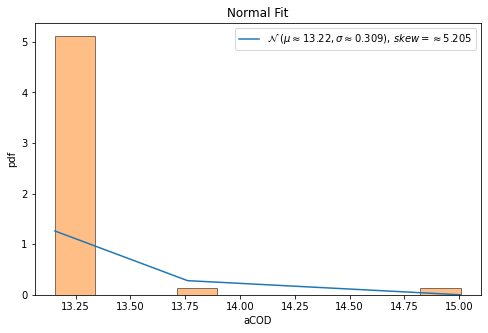


QQ plot 



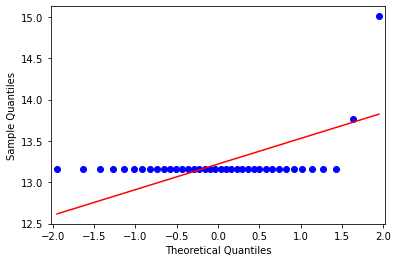


 Shapiro-Wilk Test 
 
Statistics=80.074, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  tCOD
38
max value =  2341 min value =  2289
mean=  2290.6052631578946 standard deviation=  8.409078658100208
left range=  2289 right range=  2298
data covered within this range=  97.37 %
percent left and right=  94.74 5.26
data covered within 1 standard deviation=  97.37 %
data covered within 2 standard deviation=  97.37 %
data covered within 3 standard deviation=  97.37 %



normality test :----

kurtosis value=  30.961030105016384
skewness value=  5.675350019139998


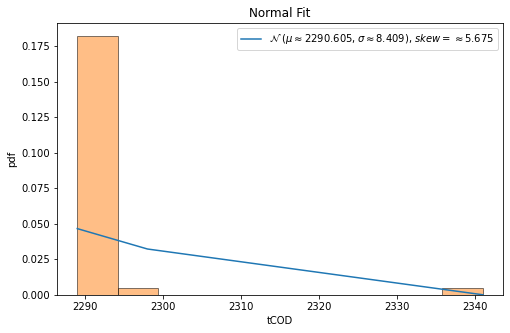


QQ plot 



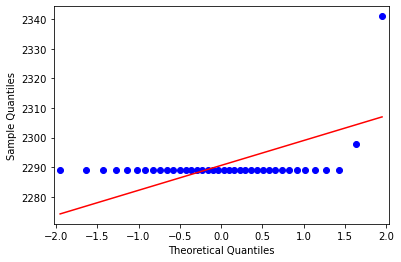


 Shapiro-Wilk Test 
 
Statistics=85.627, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  aNOP
38
max value =  1.1017964071856288 min value =  0.994252873563218
mean=  0.9979089705553292 standard deviation=  0.01780218791746847
left range=  0.994252873563218 right range=  1.0256410256410255
data covered within this range=  97.37 %
percent left and right=  94.74 5.26
data covered within 1 standard deviation=  94.74 %
data covered within 2 standard deviation=  97.37 %
data covered within 3 standard deviation=  97.37 %



normality test :----

kurtosis value=  27.675986996086813
skewness value=  5.321078396422245


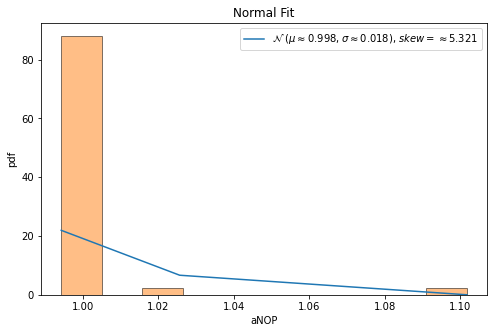


QQ plot 



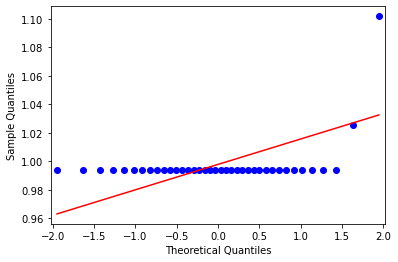


 Shapiro-Wilk Test 
 
Statistics=81.505, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  ENUMP
38
max value =  0.0303 min value =  0.0
mean=  0.028705263157894737 standard deviation=  0.006765895411563912
left range=  0.0303 right range=  0.0303
data covered within this range=  94.74 %
percent left and right=  5.26 94.74
data covered within 1 standard deviation=  94.74 %
data covered within 2 standard deviation=  94.74 %
data covered within 3 standard deviation=  94.74 %



normality test :----

kurtosis value=  14.05555555555555
skewness value=  -4.006938426723769


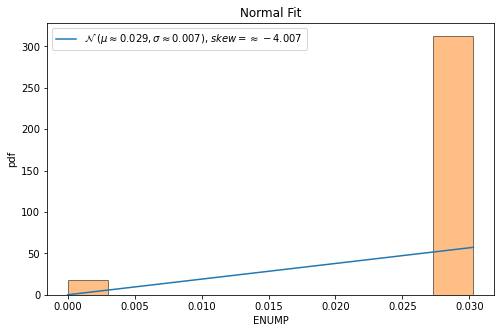


QQ plot 



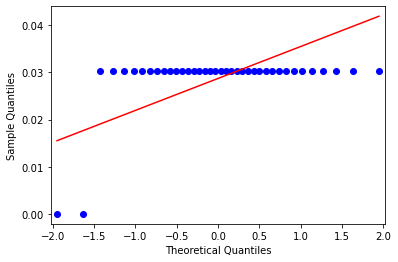


 Shapiro-Wilk Test 
 
Statistics=61.997, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  NEG
max value =  1 min value =  1
mean=  1.0 standard deviation=  0.0
left range=  1.0 right range=  1.0
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-266-5d0fb09e4347>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-266-5d0fb09e4347>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


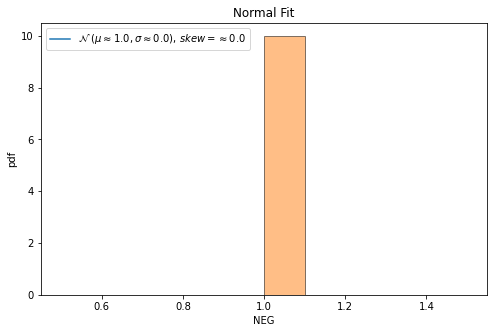


QQ plot 



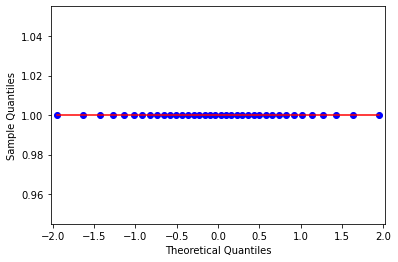


 Shapiro-Wilk Test 
 
Statistics=397.166, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  NEGP
38
max value =  0.0417 min value =  0.0303
mean=  0.030623684210526313 standard deviation=  0.0018266210119588682
left range=  0.0303 right range=  0.0312
data covered within this range=  97.37 %
percent left and right=  94.74 5.26
data covered within 1 standard deviation=  97.37 %
data covered within 2 standard deviation=  97.37 %
data covered within 3 standard deviation=  97.37 %



normality test :----

kurtosis value=  32.58102939940601
skewness value=  5.863108272549204


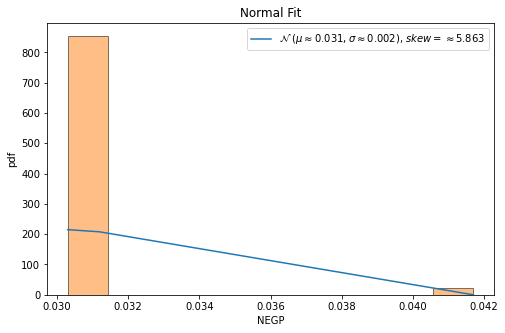


QQ plot 



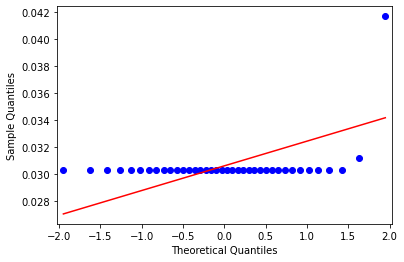


 Shapiro-Wilk Test 
 
Statistics=87.665, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  CONJP
38
max value =  0.4167 min value =  0.3939
mean=  0.3948236842105263 standard deviation=  0.0040997711239407165
left range=  0.3939 right range=  0.4062
data covered within this range=  97.37 %
percent left and right=  94.74 5.26
data covered within 1 standard deviation=  94.74 %
data covered within 2 standard deviation=  94.74 %
data covered within 3 standard deviation=  97.37 %



normality test :----

kurtosis value=  19.89677411611488
skewness value=  4.549591836913849


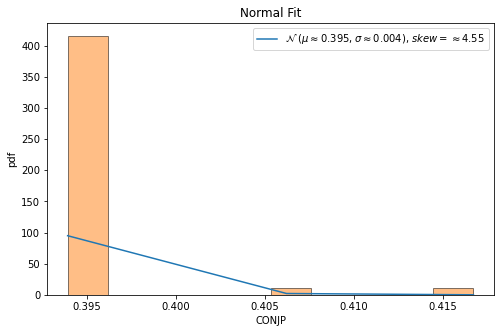


QQ plot 



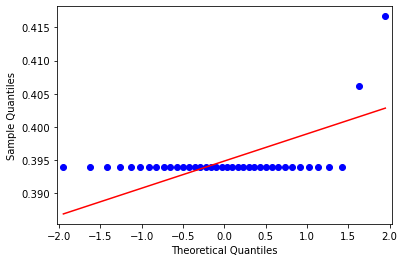


 Shapiro-Wilk Test 
 
Statistics=71.079, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  EFP
38
max value =  0.5417 min value =  0.2424
mean=  0.2554105263157895 standard deviation=  0.05647824354970533
left range=  0.2424 right range=  0.4375
data covered within this range=  97.37 %
percent left and right=  94.74 5.26
data covered within 1 standard deviation=  94.74 %
data covered within 2 standard deviation=  94.74 %
data covered within 3 standard deviation=  94.74 %



normality test :----

kurtosis value=  17.220557861752702
skewness value=  4.297925984501199


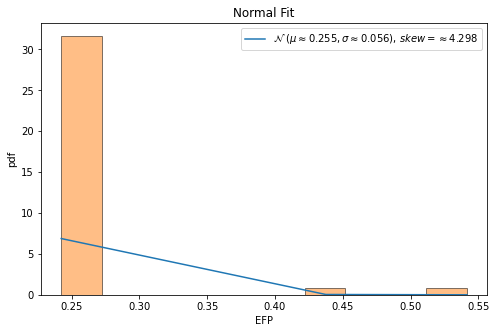


QQ plot 



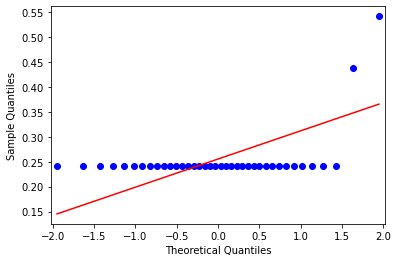


 Shapiro-Wilk Test 
 
Statistics=67.103, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  VALUE
38
max value =  1 min value =  0
mean=  0.9736842105263158 standard deviation=  0.16007269816574266
left range=  1 right range=  1
data covered within this range=  97.37 %
percent left and right=  2.63 97.37
data covered within 1 standard deviation=  97.37 %
data covered within 2 standard deviation=  97.37 %
data covered within 3 standard deviation=  97.37 %



normality test :----

kurtosis value=  33.02702702702701
skewness value=  -5.918363542992859


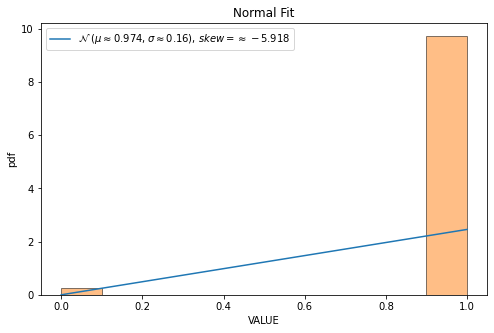


QQ plot 



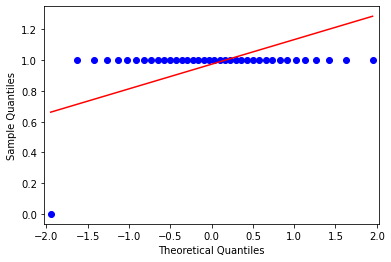


 Shapiro-Wilk Test 
 
Statistics=88.242, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  SELFP
38
max value =  0.0303 min value =  0.0
mean=  0.028705263157894737 standard deviation=  0.006765895411563912
left range=  0.0303 right range=  0.0303
data covered within this range=  94.74 %
percent left and right=  5.26 94.74
data covered within 1 standard deviation=  94.74 %
data covered within 2 standard deviation=  94.74 %
data covered within 3 standard deviation=  94.74 %



normality test :----

kurtosis value=  14.05555555555555
skewness value=  -4.006938426723769


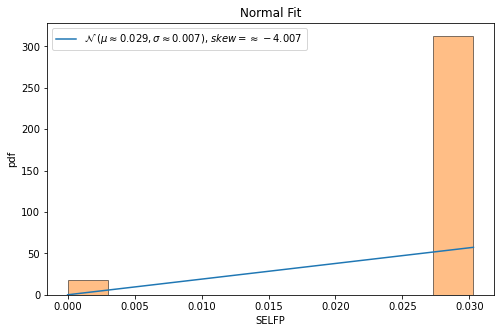


QQ plot 



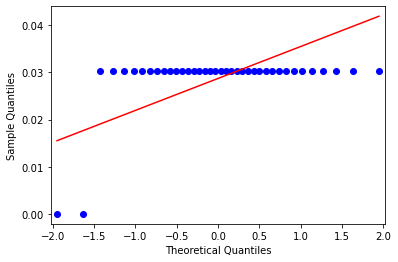


 Shapiro-Wilk Test 
 
Statistics=61.997, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  MNCARP
38
max value =  0.0303 min value =  0.0
mean=  0.028705263157894737 standard deviation=  0.006765895411563912
left range=  0.0303 right range=  0.0303
data covered within this range=  94.74 %
percent left and right=  5.26 94.74
data covered within 1 standard deviation=  94.74 %
data covered within 2 standard deviation=  94.74 %
data covered within 3 standard deviation=  94.74 %



normality test :----

kurtosis value=  14.05555555555555
skewness value=  -4.006938426723769


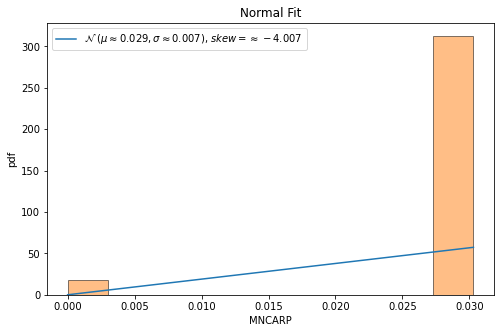


QQ plot 



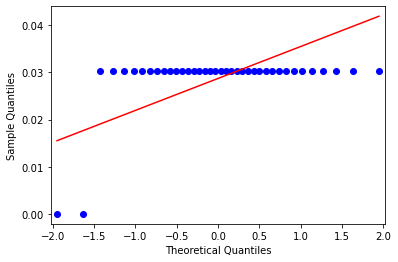


 Shapiro-Wilk Test 
 
Statistics=61.997, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  OBP
38
max value =  90 min value =  85
mean=  89.84210526315789 standard deviation=  0.8119604537127113
left range=  90 right range=  90
data covered within this range=  94.74 %
percent left and right=  5.26 94.74
data covered within 1 standard deviation=  94.74 %
data covered within 2 standard deviation=  97.37 %
data covered within 3 standard deviation=  97.37 %



normality test :----

kurtosis value=  30.314137419673635
skewness value=  -5.603421600152181


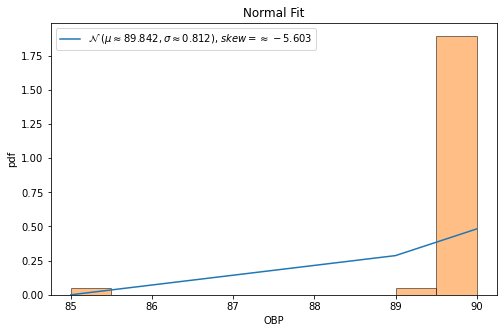


QQ plot 



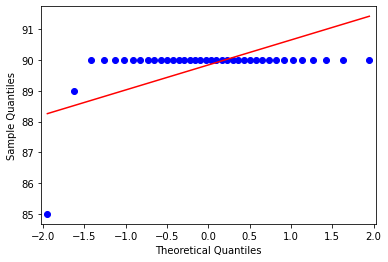


 Shapiro-Wilk Test 
 
Statistics=84.819, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  OBPP
38
max value =  0.8812 min value =  0.8738
mean=  0.8740605263157896 standard deviation=  0.0012400211105342593
left range=  0.8738 right range=  0.8763
data covered within this range=  97.37 %
percent left and right=  94.74 5.26
data covered within 1 standard deviation=  94.74 %
data covered within 2 standard deviation=  97.37 %
data covered within 3 standard deviation=  97.37 %



normality test :----

kurtosis value=  26.199573304855107
skewness value=  5.168817072132804


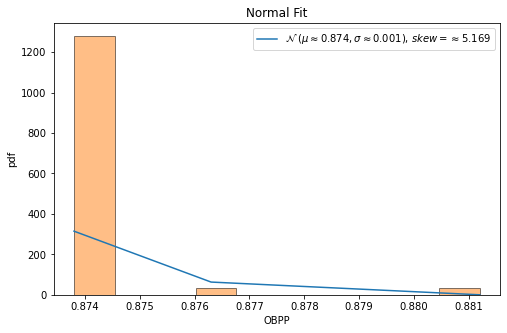


QQ plot 



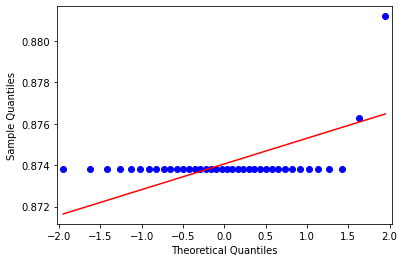


 Shapiro-Wilk Test 
 
Statistics=79.619, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  DTP
38
max value =  13 min value =  12
mean=  12.947368421052632 standard deviation=  0.22329687826943606
left range=  13 right range=  13
data covered within this range=  94.74 %
percent left and right=  5.26 94.74
data covered within 1 standard deviation=  94.74 %
data covered within 2 standard deviation=  94.74 %
data covered within 3 standard deviation=  94.74 %



normality test :----

kurtosis value=  14.055555555555568
skewness value=  -4.006938426723773


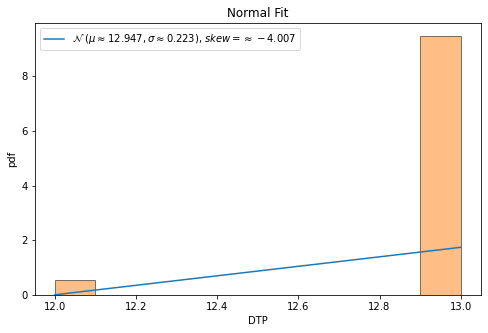


QQ plot 



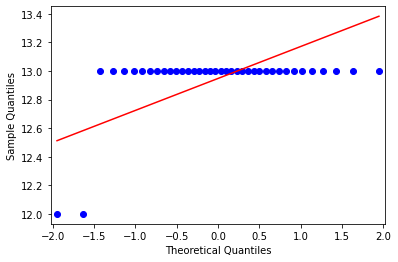


 Shapiro-Wilk Test 
 
Statistics=61.997, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  DTPP
38
max value =  0.1262 min value =  0.1188
mean=  0.12593947368421052 standard deviation=  0.0012400211105342677
left range=  0.1262 right range=  0.1262
data covered within this range=  94.74 %
percent left and right=  5.26 94.74
data covered within 1 standard deviation=  94.74 %
data covered within 2 standard deviation=  97.37 %
data covered within 3 standard deviation=  97.37 %



normality test :----

kurtosis value=  26.199573304855935
skewness value=  -5.16881707213293


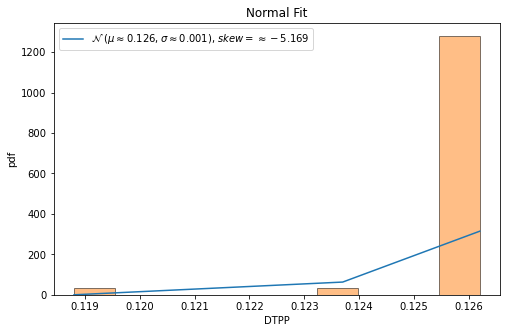


QQ plot 



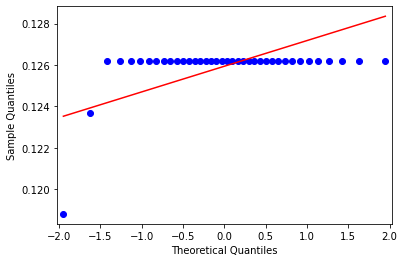


 Shapiro-Wilk Test 
 
Statistics=79.619, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  FUNP
38
max value =  0.0594 min value =  0.0
mean=  0.04751052631578947 standard deviation=  0.00800305170326276
left range=  0.0485 right range=  0.0485
data covered within this range=  94.74 %
percent left and right=  2.63 97.37
data covered within 1 standard deviation=  94.74 %
data covered within 2 standard deviation=  97.37 %
data covered within 3 standard deviation=  97.37 %



normality test :----

kurtosis value=  29.813768963813857
skewness value=  -5.417706730962815


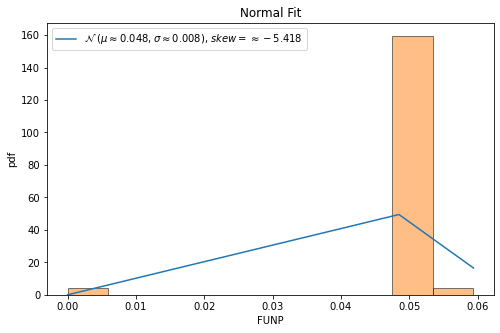


QQ plot 



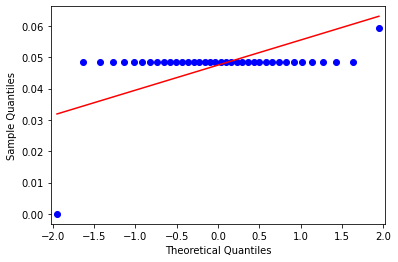


 Shapiro-Wilk Test 
 
Statistics=83.181, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  SYMP
38
max value =  0.0206 min value =  0.0194
mean=  0.019442105263157893 standard deviation=  0.00020082930556146225
left range=  0.0194 right range=  0.0198
data covered within this range=  97.37 %
percent left and right=  94.74 5.26
data covered within 1 standard deviation=  94.74 %
data covered within 2 standard deviation=  97.37 %
data covered within 3 standard deviation=  97.37 %



normality test :----

kurtosis value=  26.34657650042291
skewness value=  5.1838261156578795


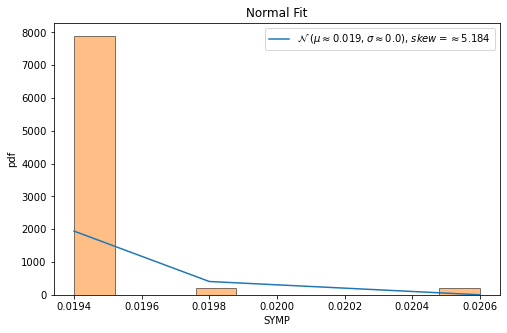


QQ plot 



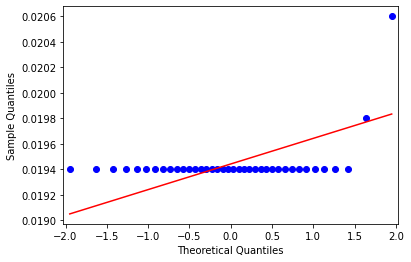


 Shapiro-Wilk Test 
 
Statistics=79.808, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  SUBP
38
max value =  65 min value =  51
mean=  64.3157894736842 standard deviation=  2.9119107776048536
left range=  65 right range=  65
data covered within this range=  94.74 %
percent left and right=  5.26 94.74
data covered within 1 standard deviation=  94.74 %
data covered within 2 standard deviation=  94.74 %
data covered within 3 standard deviation=  94.74 %



normality test :----

kurtosis value=  14.511420991083902
skewness value=  -4.04844723546062


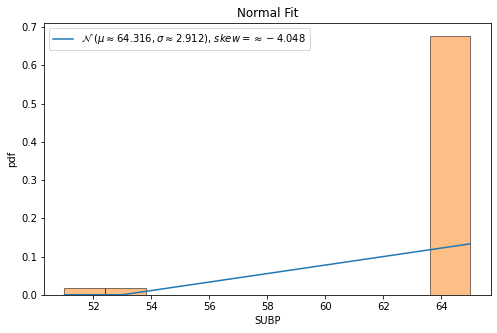


QQ plot 



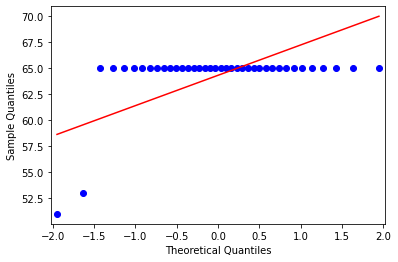


 Shapiro-Wilk Test 
 
Statistics=62.765, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  DISP
38
max value =  2 min value =  1
mean=  1.9473684210526316 standard deviation=  0.22329687826943603
left range=  2 right range=  2
data covered within this range=  94.74 %
percent left and right=  5.26 94.74
data covered within 1 standard deviation=  94.74 %
data covered within 2 standard deviation=  94.74 %
data covered within 3 standard deviation=  94.74 %



normality test :----

kurtosis value=  14.055555555555564
skewness value=  -4.006938426723772


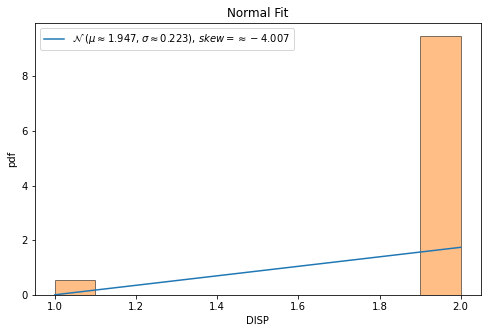


QQ plot 



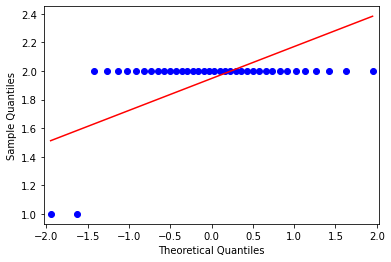


 Shapiro-Wilk Test 
 
Statistics=61.997, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  INV
max value =  22 min value =  22
mean=  22.0 standard deviation=  0.0
left range=  22.0 right range=  22.0
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-266-5d0fb09e4347>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-266-5d0fb09e4347>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


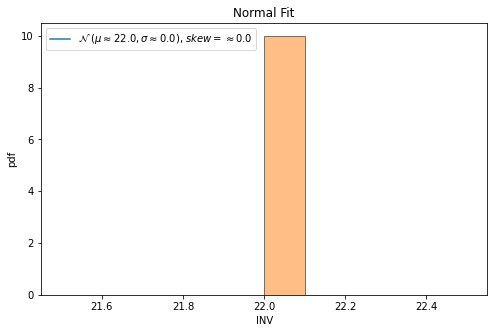


QQ plot 



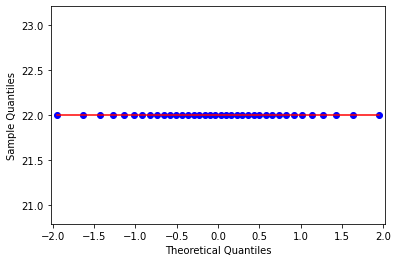


 Shapiro-Wilk Test 
 
Statistics=397.166, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  DOMN
38
max value =  73 min value =  68
mean=  68.1842105263158 standard deviation=  0.8539463547151556
left range=  68 right range=  70
data covered within this range=  97.37 %
percent left and right=  94.74 5.26
data covered within 1 standard deviation=  94.74 %
data covered within 2 standard deviation=  94.74 %
data covered within 3 standard deviation=  97.37 %



normality test :----

kurtosis value=  24.157320151622
skewness value=  4.963328821304923


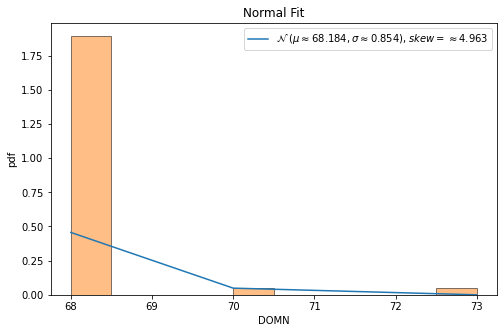


QQ plot 



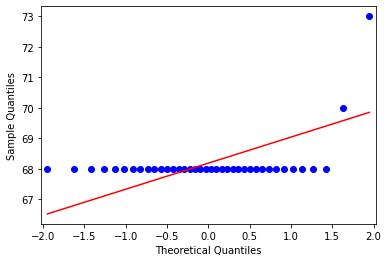


 Shapiro-Wilk Test 
 
Statistics=76.951, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  RANG
38
max value =  61 min value =  57
mean=  58.05263157894737 standard deviation=  0.5102820902543506
left range=  58 right range=  58
data covered within this range=  94.74 %
percent left and right=  97.37 2.63
data covered within 1 standard deviation=  94.74 %
data covered within 2 standard deviation=  94.74 %
data covered within 3 standard deviation=  97.37 %



normality test :----

kurtosis value=  26.766183793571674
skewness value=  4.838901804256664


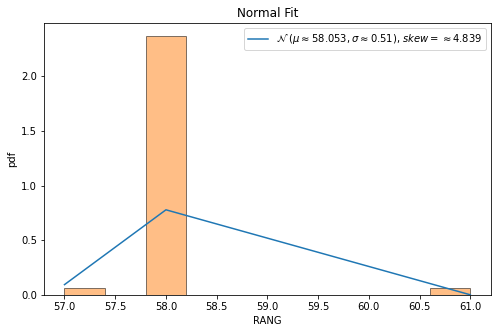


QQ plot 



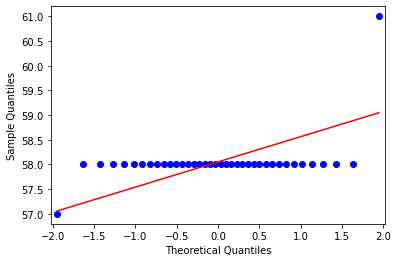


 Shapiro-Wilk Test 
 
Statistics=77.204, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  CHN
38
max value =  8 min value =  0
mean=  7.7894736842105265 standard deviation=  1.2805815853259412
left range=  8 right range=  8
data covered within this range=  97.37 %
percent left and right=  2.63 97.37
data covered within 1 standard deviation=  97.37 %
data covered within 2 standard deviation=  97.37 %
data covered within 3 standard deviation=  97.37 %



normality test :----

kurtosis value=  33.02702702702701
skewness value=  -5.918363542992859


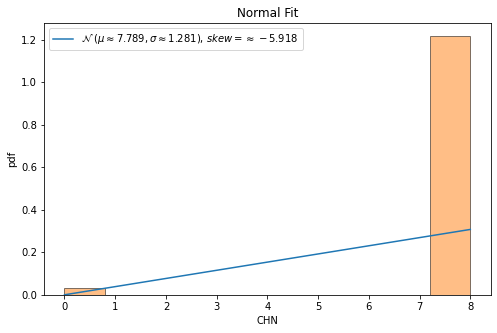


QQ plot 



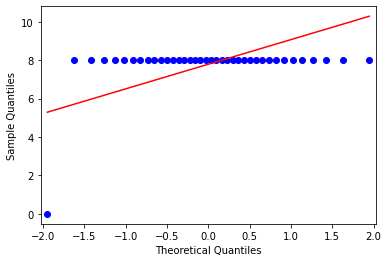


 Shapiro-Wilk Test 
 
Statistics=88.242, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  CHNP
38
max value =  0.07920792079207921 min value =  0.0
mean=  0.07566643225385354 standard deviation=  0.012441919084916235
left range=  0.077669902912621 right range=  0.077669902912621
data covered within this range=  94.74 %
percent left and right=  2.63 97.37
data covered within 1 standard deviation=  97.37 %
data covered within 2 standard deviation=  97.37 %
data covered within 3 standard deviation=  97.37 %



normality test :----

kurtosis value=  32.9989396990262
skewness value=  -5.914651774466758


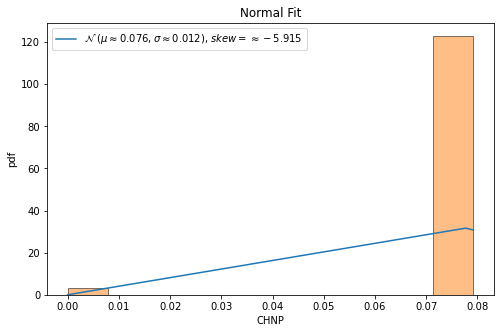


QQ plot 



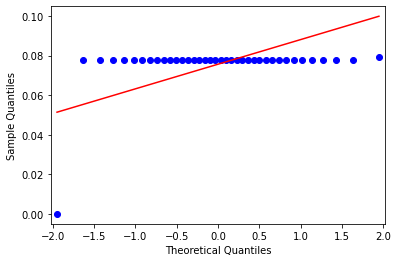


 Shapiro-Wilk Test 
 
Statistics=88.204, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  ELPROP
38
max value =  0.842741935483871 min value =  0.8340807174887892
mean=  0.8424150906777792 standard deviation=  0.0014963681016307083
left range=  0.842741935483871 right range=  0.842741935483871
data covered within this range=  94.74 %
percent left and right=  5.26 94.74
data covered within 1 standard deviation=  94.74 %
data covered within 2 standard deviation=  94.74 %
data covered within 3 standard deviation=  97.37 %



normality test :----

kurtosis value=  23.055680944705838
skewness value=  -4.854585092449449


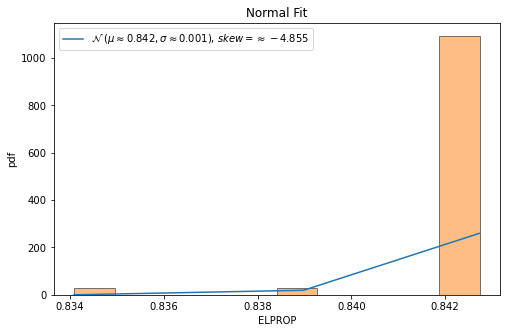


QQ plot 



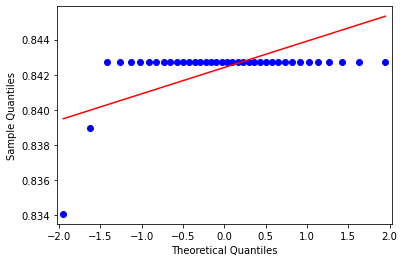


 Shapiro-Wilk Test 
 
Statistics=75.477, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  CAL_TIME
max value =  5657230 min value =  2006430
mean=  4107021.052631579 standard deviation=  601344.3866510992
left range=  3806348.859306029 right range=  4407693.245957129
data covered within this range=  42.11 %
percent left and right=  47.37 52.63



normality test :----

kurtosis value=  3.1975748003951665
skewness value=  -1.049553768842086


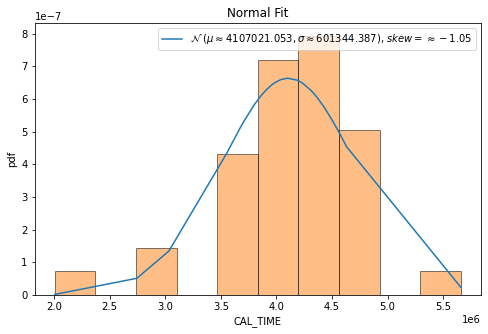


QQ plot 



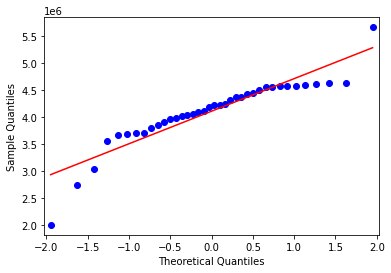


 Shapiro-Wilk Test 
 
Statistics=15.334, p=0.000468
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------



In [266]:
#**** follow the same notation as explained above in 'easy time easy memory' category wherever required*******#


#after medium time and memory clusering ,
#collect the medium ones

from matplotlib import pyplot as plt
%matplotlib inline
#%matplotlib qt 
import scipy
from scipy.stats import norm
from statsmodels.graphics.gofplots import qqplot
import statistics
from scipy.stats import shapiro
from scipy.stats import normaltest
import math
#interquratile range 
def cal(sov_sort):
    p=0
    l=len(sov_sort)
    print(l)
    left=0
    right=0
    while  p < 90 :
        if p==0:
            if l % 2 ==0:
                left=( l /2)
                right=( l / 2) + 1
                p= round((((right -left +1) / l) * 100),2)
                
            else:
                left=math.floor( l /2)
                right=math.ceil(l/2) + 1
                p= round((((right -left +1) / l) * 100),2)
                
        else:
            if left % 2 !=0:
                left = math.ceil(left/2)
            else:
                left = left /2
            
            dist = l - right +1
            if dist % 2 !=0:
                right = right + math.ceil(dist/2)
            else:
                right = right + (dist /2)
                
            p= round((((right -left +1) / l) * 100),2)
             
        
    return left-1,right-1



print(df_medium_time_mem_feature_df.shape)
medium_time_mem_medium = df_medium_time_mem_feature_df[df_medium_time_mem_feature_df['label_mem']== 'medium']
print(medium_time_mem_medium.shape)
prior_medium= round(medium_time_mem_medium.shape[0] / df_medium_time_mem_feature_df.shape[0] ,5)

main_dict_mtmm={}
main_dict_mtmm_iqr={}

for i in range(len(cols_list)):
    if cols_list[i] in top_n_2:
        tmp_dict={}
        tmp_dict_iqr={}
        
        feature = cols_list[i]
        print("feature name= ",feature)
        
        sov=np.array(medium_time_mem_medium[feature])
        sov_1=(np.sort(sov))
        skew=scipy.stats.skew(sov)
        
        tmp_dict["skew"]=round(skew,4)
        tmp_dict_iqr["skew"]=round(skew,4)
        
        if -2 < skew and skew < 2:
        
            print("max value = ",np.max(sov),"min value = ",np.min(sov))
            tmp_dict["min"]=round(np.min(sov),9)
            tmp_dict["max"]=round(np.max(sov),9)
            min_val=np.min(sov)
            max_val=np.max(sov)

            mean = np.mean(sov)
            std = np.std(sov)
            print("mean= ",mean,"standard deviation= ",std)
            tmp_dict["mean"]=round(mean,9)
            tmp_dict["std"]=round(std,9)
            #gamma=2
            #rx= mean - ((1- prior_medium) *gamma * std) 
            #ry= mean + ((1- prior_medium) *gamma * std)
            
            l_weight=0.5
            r_weight=0.5
            rx= mean - (l_weight* std) 
            ry= mean + (r_weight* std)
            print("left range= ",rx,"right range= ", ry)
            tmp_dict["lw_i"]=round(l_weight,9)
            tmp_dict["rw_i"]=round(r_weight,9)
            tmp_dict["lr"]=round(rx,9)
            tmp_dict["rr"]=round(ry,9)

            min_val_w= round(((mean - min_val) /std ),9)
            max_val_w= round(((max_val - mean) /std ),9)
            tmp_dict["min_val_w"]=round(min_val_w,9)
            tmp_dict["max_val_w"]=round(max_val_w,9)


            val=(((rx <= sov) & (sov <= ry)).sum()) / medium_time_mem_medium.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within this range= ",v,"%")

            tmp_dict["percent_i"]=round(v,9)
            tmp_dict["percent_change"]=round(v,9)

            val=(((min_val <= sov) & (sov <= mean)).sum()) / medium_time_mem_medium.shape[0]
            percent_l =  round((val * 100 ),2)

            val=(((mean <= sov) & (sov <= max_val)).sum()) / medium_time_mem_medium.shape[0]
            percent_r =  round((val * 100 ),2)

            print("percent left and right= ",percent_l,percent_r)
            tmp_dict["percent_l"]=percent_l
            tmp_dict["percent_r"]=percent_r
            
            main_dict_mtmm[feature]=tmp_dict
            
        else:
            
            left_index,right_index = cal(sov_1)
            rx=sov_1[int(left_index)]
            ry=sov_1[int(right_index)]

            print("max value = ",np.max(sov),"min value = ",np.min(sov))
            
            tmp_dict_iqr["min"]=round(np.min(sov),9)
            tmp_dict_iqr["max"]=round(np.max(sov),9)
            min_val=np.min(sov)
            max_val=np.max(sov)
            
            
            mean = np.mean(sov)
            std = np.std(sov)
            print("mean= ",mean,"standard deviation= ",std)
            tmp_dict_iqr["mean"]=round(mean,9)
            tmp_dict_iqr["std"]=round(std,9)
            
            print("left range= ",rx,"right range= ", ry)
            tmp_dict_iqr["lw_i"]="null"
            tmp_dict_iqr["rw_i"]="null"
            tmp_dict_iqr["lr"]=round(rx,9)
            tmp_dict_iqr["rr"]=round(ry,9)
            
            
            tmp_dict_iqr["min_val_w"]="null"
            tmp_dict_iqr["max_val_w"]="null"
            tmp_dict_iqr["percent_i"]="null"
            val=(((rx <= sov) & (sov <= ry)).sum()) / medium_time_mem_medium.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within this range= ",v,"%")
            tmp_dict_iqr["percent_change"]=round(v,9)
            
            val=(((min_val <= sov) & (sov <= mean)).sum()) / medium_time_mem_medium.shape[0]
            percent_l =  round((val * 100 ),2)

            val=(((mean <= sov) & (sov <= max_val)).sum()) / medium_time_mem_medium.shape[0]
            percent_r =  round((val * 100 ),2)

            print("percent left and right= ",percent_l,percent_r)
        
            
            tmp_dict_iqr["percent_l"]=percent_l
            tmp_dict_iqr["percent_r"]=percent_r
            
            main_dict_mtmm_iqr[feature]=tmp_dict_iqr

            
            # 68–95–99.7 rule, also known as the empirical rule

            # for 1*std
            left = mean - std
            right = mean + std
            val=(((left <= sov) & (sov <= right)).sum()) / medium_time_mem_medium.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 1 standard deviation= ",v,"%")
            
            # for 2*std
            left = mean - (2*std)
            right = mean + (2*std)
            val=(((left <= sov) & (sov <= right)).sum()) / medium_time_mem_medium.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 2 standard deviation= ",v,"%")
            


            # for 3*std
            left = mean - (3*std)
            right = mean + (3*std)
            val=(((left <= sov) & (sov <= right)).sum()) / medium_time_mem_medium.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 3 standard deviation= ",v,"%")
            
        print("\n\n")
        
        #normality test
        print("normality test :----\n")
        # kurtosis and skew function
        kurt=scipy.stats.kurtosis(sov)
        print("kurtosis value= ",kurt)
        
        
        print("skewness value= ",skew)
        
        
        
        #plotting graph for to see the skewess
        sov_1=np.sort(sov)
        fig, ax1 = plt.subplots(1, 1, figsize=(8,5))
        ax1.plot(sov_1, norm.pdf(sov_1, mean, std),label='$\mathcal{N}$ '+ f'$( \mu \\approx {round(mean,3)} , \sigma \\approx {round(std,3)})$, $ skew = \\approx {round(skew,3)}$')
        ax1.hist(sov_1,edgecolor='black',alpha=0.5,density= True)
        ax1.set_title("Normal Fit")
        ax1.set_xlabel(feature)
        ax1.set_ylabel("pdf")
        ax1.legend()
        #plt.savefig('/home/ritam/ontology_hardness/normal_curve_&_skewness/medium_time_medium_memory/'+str(feature)+'.jpeg')
        plt.show()
        
        # Quantile-Quantile Plot Nomrality check
        print("\nQQ plot \n")
        qqplot(sov_1, line='s')
        plt.show()
        
        #Statistical Normality Tests
        # Shapiro-Wilk Test
        print("\n Shapiro-Wilk Test \n ")
        #stat, p = shapiro(sov_1[0:4998])
        stat, p = normaltest(sov_1)
        print('Statistics=%.3f, p=%f' % (stat, p))
        
        alpha = 0.05
        if p > alpha:
            print('Sample looks Gaussian (fail to reject H0)')
        else:
            print('Sample does not look Gaussian (reject H0)')
            
        print("ends normality test ------------------------------------------------\n")
        
        

In [267]:
#**** follow the same notation as explained above in 'easy time easy memory' category wherever required*******#

import copy

main_dict_cal_mtmm={}
dec_rate=[(0.9,0.9)]
for i in range(len(dec_rate)):
 
    main_dict_cal_mtmm=copy.deepcopy(main_dict_mtmm)
    lower_r=dec_rate[i][0]
    high_r=dec_rate[i][1]
    for j in range (100):
        c=0
        for key,value in main_dict_cal_mtmm.items():
            
            if value["percent_change"] < 90:
                
                lw_i_temp=value["lw_i"]
                rw_i_temp=value["rw_i"]
                if value["percent_l"] >= 50:
                    diff=value["min_val_w"] - lw_i_temp
                    frac = round(lower_r * diff, 9)  
                    
                    lw_i_temp= round(lw_i_temp + frac , 9)
                    main_dict_cal_mtmm[key]["lw_i"]=lw_i_temp
                else:
                    diff=value["min_val_w"] - lw_i_temp
                    frac = round(high_r * diff, 9)  
                    
                    lw_i_temp= round(lw_i_temp + frac ,9 )
                    main_dict_cal_mtmm[key]["lw_i"]=lw_i_temp

                if value["percent_r"] >= 50:
                    diff=value["max_val_w"] - rw_i_temp
                    frac = round(lower_r * diff, 9)  
                    
                    rw_i_temp= round(rw_i_temp + frac , 9 )
                    main_dict_cal_mtmm[key]["rw_i"]=rw_i_temp
                else:
                    diff=value["max_val_w"] - rw_i_temp
                    frac = round(high_r * diff, 9)  
                    
                    rw_i_temp= round(rw_i_temp + frac ,9 )
                    main_dict_cal_mtmm[key]["rw_i"]=rw_i_temp

                sov=np.array(medium_time_mem_medium[key])
                rx= round(value["mean"] - (lw_i_temp* value["std"]) ,9)
                ry= round(value["mean"] + (rw_i_temp* value["std"]),9)
                main_dict_cal_mtmm[key]["lr"]=round(rx,9)
                main_dict_cal_mtmm[key]["rr"]=round(ry,9)
                #print(rx,ry)

                val=(((rx <= sov) & (sov <= ry)).sum()) / medium_time_mem_medium.shape[0]
                v =  round((val * 100 ),2)
                main_dict_cal_mtmm[key]["percent_change"]=v

                if v >=85:
                    c=c+1
                
            else:
                c=c+1
        p=round(c / len(list(main_dict_cal_mtmm.keys())),2)
        print ("percent in loop ",j , "covers ", p , "%" )
        

percent in loop  0 covers  1.0 %
percent in loop  1 covers  1.0 %
percent in loop  2 covers  1.0 %
percent in loop  3 covers  1.0 %
percent in loop  4 covers  1.0 %
percent in loop  5 covers  1.0 %
percent in loop  6 covers  1.0 %
percent in loop  7 covers  1.0 %
percent in loop  8 covers  1.0 %
percent in loop  9 covers  1.0 %
percent in loop  10 covers  1.0 %
percent in loop  11 covers  1.0 %
percent in loop  12 covers  1.0 %
percent in loop  13 covers  1.0 %
percent in loop  14 covers  1.0 %
percent in loop  15 covers  1.0 %
percent in loop  16 covers  1.0 %
percent in loop  17 covers  1.0 %
percent in loop  18 covers  1.0 %
percent in loop  19 covers  1.0 %
percent in loop  20 covers  1.0 %
percent in loop  21 covers  1.0 %
percent in loop  22 covers  1.0 %
percent in loop  23 covers  1.0 %
percent in loop  24 covers  1.0 %
percent in loop  25 covers  1.0 %
percent in loop  26 covers  1.0 %
percent in loop  27 covers  1.0 %
percent in loop  28 covers  1.0 %
percent in loop  29 cove

In [268]:
#**** follow the same notation as explained above in 'easy time easy memory' category wherever required*******#

main_dict_cal_mtmm
print(len(main_dict_cal_mtmm),len(main_dict_mtmm_iqr))
mtmm_pd=pd.DataFrame(main_dict_cal_mtmm)
mtmm_iqr_pd=pd.DataFrame(main_dict_mtmm_iqr)

frames = [mtmm_pd,mtmm_iqr_pd]
result = pd.concat(frames,axis=1)
result
#result.to_csv("mtmm_ranges.csv")


17 33


In [269]:
medium_time_mem_medium  #  contains 38 ontoogies in this category

,file,size_kb,consistency_time_milsecs,consistency_size_kb,realisation_time_milsecs,realisation_size_kb,classification_time_milsecs,classification_size_kb,SOV,ENR,...,EQVP,DISP,INV,DOMN,RANG,CHN,CHNP,ELPROP,CAL_TIME,label_mem
4,OWL2QL-200.owl,1108752,500321,85606796,506705,86797824,517881,85706104,3389777,4.291451,...,5,1,22,73,61,0,0.000000,0.834081,2006430,medium
5,OWL2RL-200.owl,1108754,556153,88531188,549992,89854124,548326,88689260,3389782,4.291403,...,5,1,22,70,57,8,0.079208,0.838983,3032880,medium
20,OWL2DL-238.owl,1280275,701110,82947772,720911,82942016,724538,82947644,4041350,4.333371,...,5,2,22,68,58,8,0.077670,0.842742,3957950,medium
21,OWL2DL-240.owl,1289274,792833,82944380,649579,82947080,678730,82947924,4073652,4.327781,...,5,2,22,68,58,8,0.077670,0.842742,3680630,medium
22,OWL2DL-242.owl,1304585,688112,82949124,701174,82948968,679151,82948860,4117362,4.332383,...,5,2,22,68,58,8,0.077670,0.842742,2744200,medium
23,OWL2DL-244.owl,1316584,750405,82957488,668309,82954744,675364,82957500,4154481,4.332585,...,5,2,22,68,58,8,0.077670,0.842742,3800700,medium
24,OWL2DL-246.owl,1326649,686813,82952608,693671,82956704,684503,82954980,4181487,4.337410,...,5,2,22,68,58,8,0.077670,0.842742,3553070,medium
25,OWL2DL-248.owl,1339337,693132,82954196,734502,82950808,768885,82953388,4217925,4.340842,...,5,2,22,68,58,8,0.077670,0.842742,4104490,medium
26,OWL2DL-250.owl,1344931,700017,82938864,703245,82951144,696988,82952084,4236967,4.338219,...,5,2,22,68,58,8,0.077670,0.842742,3702180,medium
27,OWL2DL-252.owl,1356079,712149,82946516,691194,82949716,722948,82952040,4270680,4.339328,...,5,2,22,68,58,8,0.077670,0.842742,4504660,medium


(4, 101)
feature name=  size_kb
feature values=  [ 582904  543811 1108757 1108750]
max value =  1108757 min value =  543811
mean=  836055.5 standard deviation=  273048.03980481165
left range=  699531.4800975942 right range=  972579.5199024058
1.070304333 0.998730847
data covered within this range=  0.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.9897704979516595
skewness value=  -0.007677043762299754


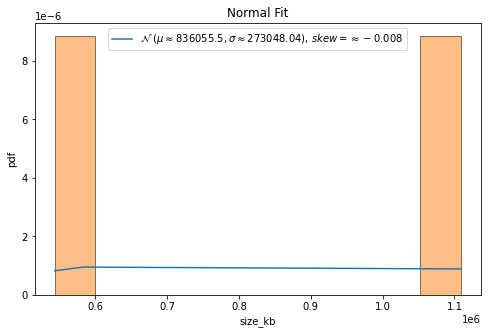


QQ plot 



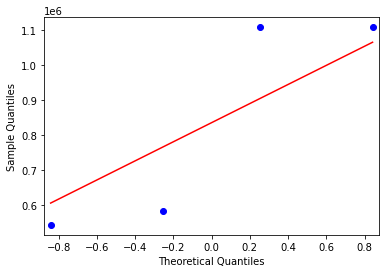

ends normality test ------------------------------------------------

feature name=  consistency_time_milsecs
feature values=  [510801 673449 616636 605649]
max value =  673449 min value =  510801
mean=  601633.75 standard deviation=  58414.91321304432
left range=  572426.2933934778 right range=  630841.2066065222
1.554958229 1.229399242
data covered within this range=  50.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.9662531543289985
skewness value=  -0.47108001067817773


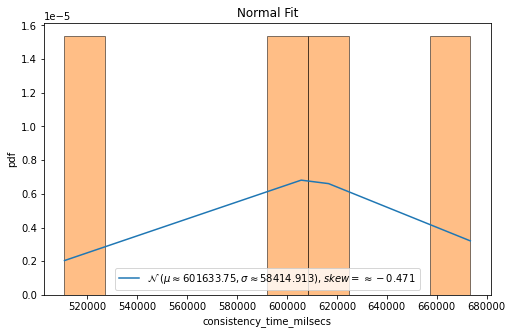


QQ plot 



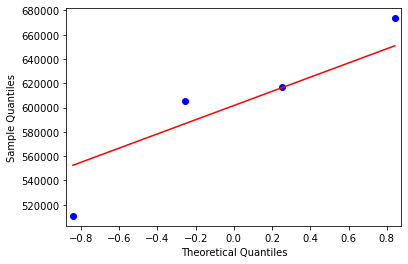

ends normality test ------------------------------------------------

feature name=  consistency_size_kb
feature values=  [118948904 128672792 128837964 106586272]
max value =  128837964 min value =  106586272
mean=  120761483.0 standard deviation=  9110987.93988067
left range=  116205989.03005967 right range=  125316976.96994033
1.555836875 0.88645502
data covered within this range=  25.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.2382512086030042
skewness value=  -0.6056722061057589


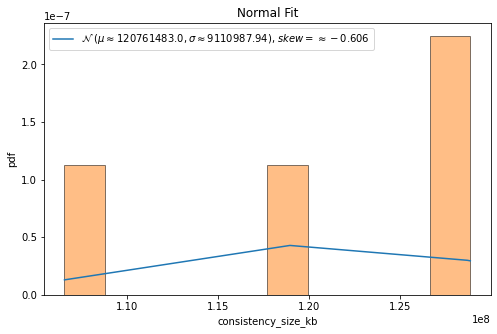


QQ plot 



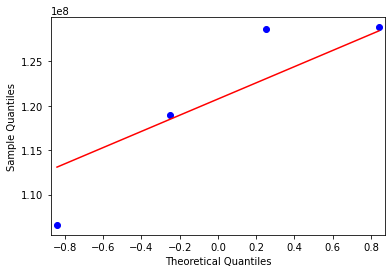

ends normality test ------------------------------------------------

feature name=  realisation_time_milsecs
feature values=  [533505 704093 628923 607356]
max value =  704093 min value =  533505
mean=  618469.25 standard deviation=  60792.95920735805
left range=  588072.770396321 right range=  648865.729603679
1.397600168 1.408448464
data covered within this range=  50.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.0618771825323448
skewness value=  0.01575996987494145


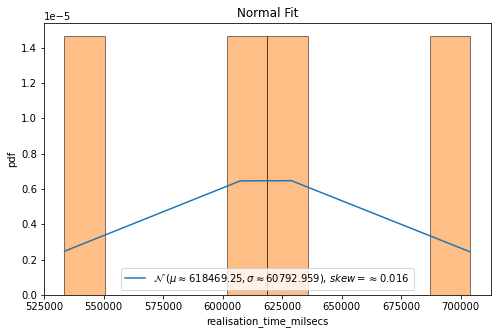


QQ plot 



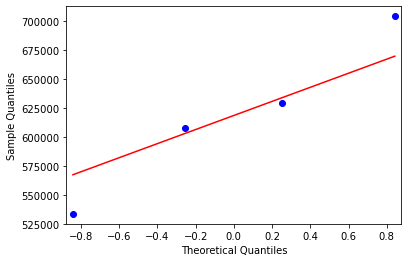

ends normality test ------------------------------------------------

feature name=  realisation_size_kb
feature values=  [117505604 128793224 128842096 108235012]
max value =  128842096 min value =  108235012
mean=  120843984.0 standard deviation=  8621066.75625656
left range=  116533450.62187172 right range=  125154517.37812828
1.462576773 0.927740409
data covered within this range=  25.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.4844896555256297
skewness value=  -0.4010603190541234


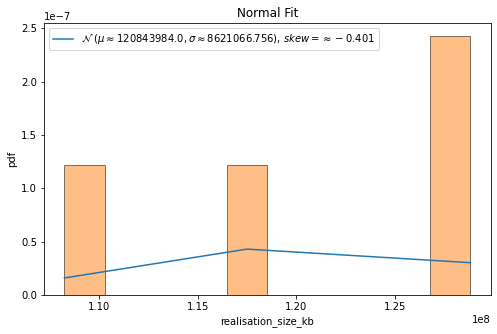


QQ plot 



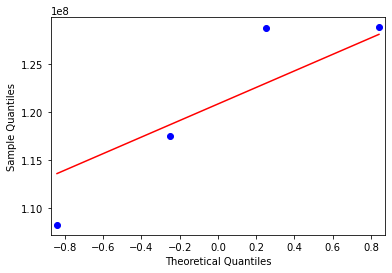

ends normality test ------------------------------------------------

feature name=  classification_time_milsecs
feature values=  [572655 690983 642479 591436]
max value =  690983 min value =  572655
mean=  624388.25 standard deviation=  46163.61093640206
left range=  601306.444531799 right range=  647470.055468201
1.120649987 1.442581043
data covered within this range=  25.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.4522226522408208
skewness value=  0.3227913660716867


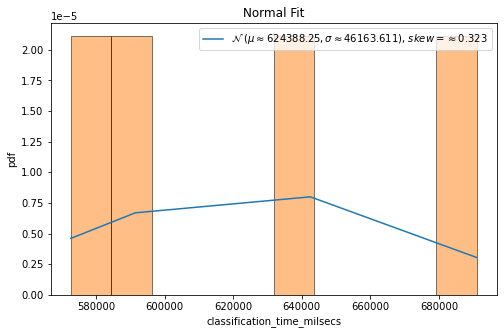


QQ plot 



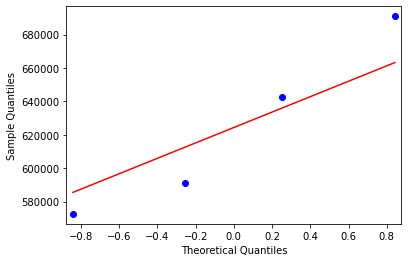

ends normality test ------------------------------------------------

feature name=  classification_size_kb
feature values=  [117441840 128832840 128838868 107000568]
max value =  128838868 min value =  107000568
mean=  120528529.0 standard deviation=  9090609.073102362
left range=  115983224.46344882 right range=  125073833.53655118
1.488124821 0.914167459
data covered within this range=  25.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.4219642269220412
skewness value=  -0.45208510366610394


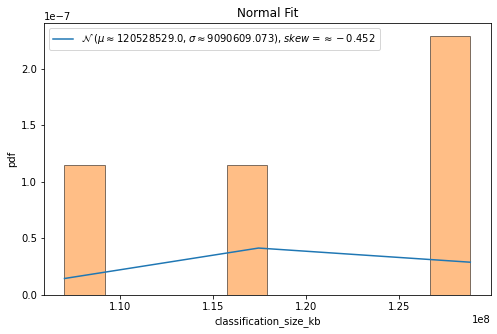


QQ plot 



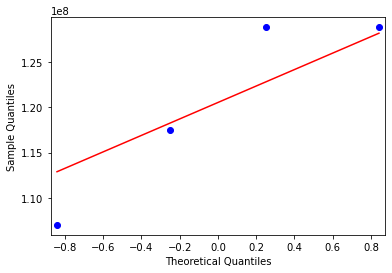

ends normality test ------------------------------------------------

feature name=  SOV
feature values=  [ 448079 1757531 3389780 3389774]
max value =  3389780 min value =  448079
mean=  2246291.0 standard deviation=  1233650.3960760115
left range=  1629465.8019619943 right range=  2863116.1980380057
1.457635004 0.926914954
data covered within this range=  25.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.49616924512962
skewness value=  -0.3916201041719136


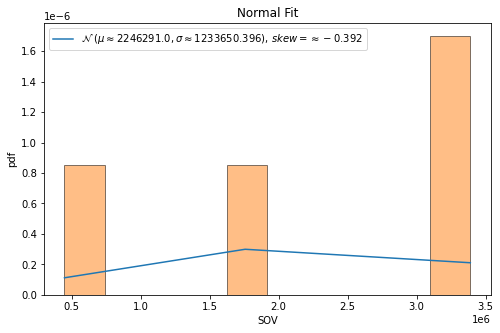


QQ plot 



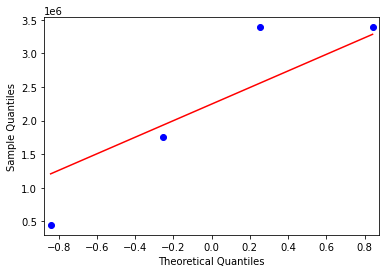

ends normality test ------------------------------------------------

feature name=  ENR
feature values=  [3.89040934 4.1147461  4.29143009 4.29140062]
max value =  4.291430088573893 min value =  3.8904093367582058
mean=  4.146996538486896 standard deviation=  0.16476549456132525
left range=  4.0646137912062335 right range=  4.229379285767558
1.557287237 0.876600713
data covered within this range=  25.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.2341817513498243
skewness value=  -0.6093364590613881


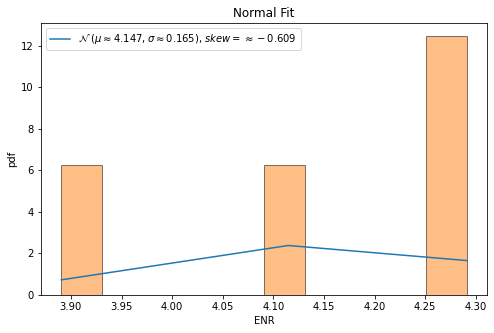


QQ plot 



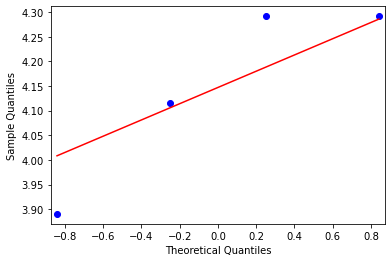

ends normality test ------------------------------------------------

feature name=  TIP
feature values=  [2037944       0       0       0]
max value =  2037944 min value =  0
mean=  509486.0 standard deviation=  882455.637745037
left range=  68258.18112748151 right range=  950713.8188725185
0.577350269 1.732050808
data covered within this range=  0.0 %
percent left and right=  75.0 25.0



normality test :----

kurtosis value=  -0.6666666666666665
skewness value=  1.1547005383792517


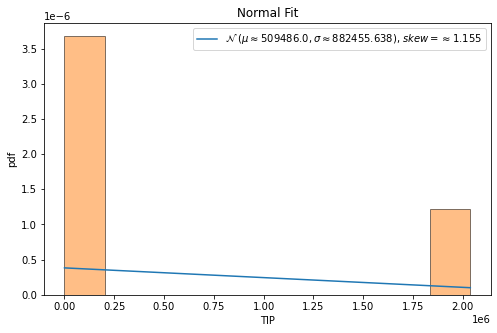


QQ plot 



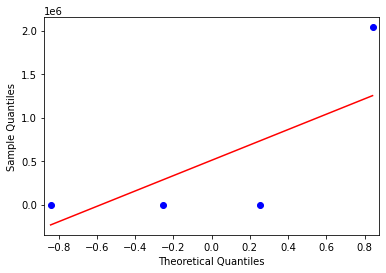

ends normality test ------------------------------------------------

feature name=  EOG
feature values=  [2.71373635 2.76596571 2.69358529 2.69351819]
max value =  2.7659657132107784 min value =  2.693518193515438
mean=  2.716701388170214 standard deviation=  0.029612410797619317
left range=  2.701895182771404 right range=  2.7315075935690234
0.782887784 1.663637769
data covered within this range=  25.0 %
percent left and right=  75.0 25.0



normality test :----

kurtosis value=  -0.8981982624712499
skewness value=  0.9119751546719566


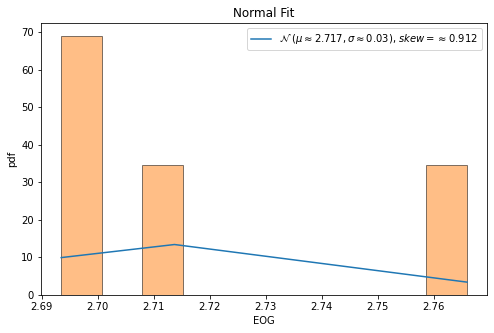


QQ plot 



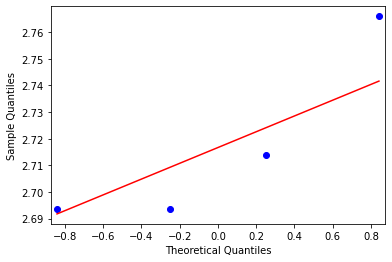

ends normality test ------------------------------------------------

feature name=  CYC
feature values=  [ 2929461  5474417 11157388 11157213]
max value =  11157388 min value =  2929461
mean=  7679619.75 standard deviation=  3592194.807216152
left range=  5883522.346391924 right range=  9475717.153608076
1.322355553 0.968145782
data covered within this range=  0.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.7608456272641635
skewness value=  -0.18222245410199142


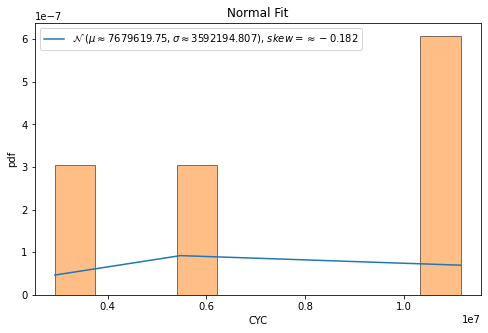


QQ plot 



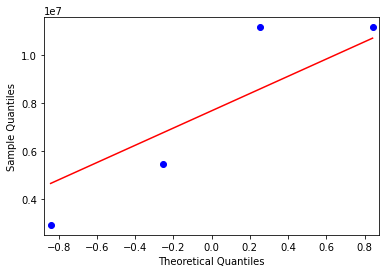

ends normality test ------------------------------------------------

feature name=  HGCI
feature values=  [65365    19    19    17]
max value =  65365 min value =  17
mean=  16355.0 standard deviation=  28295.93670476381
left range=  2207.031647618094 right range=  30502.968352381904
0.57739739 1.732050807
data covered within this range=  0.0 %
percent left and right=  75.0 25.0



normality test :----

kurtosis value=  -0.6666666688870113
skewness value=  1.1547005354948603


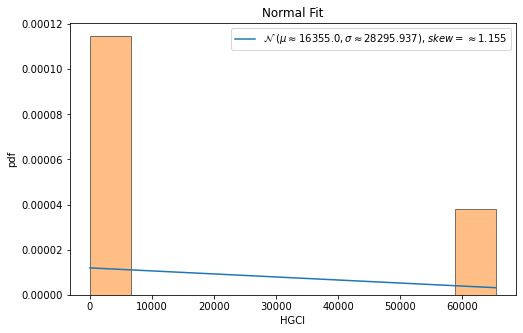


QQ plot 



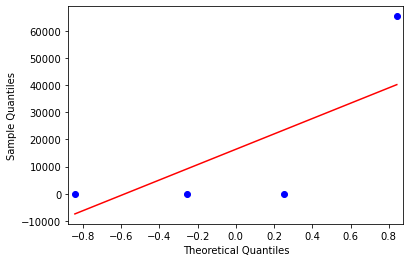

ends normality test ------------------------------------------------

feature name=  ELCLSPRT
feature values=  [0.99994645 0.92682927 0.92682927 0.98717949]
max value =  0.9999464495408048 min value =  0.9268292682926828
mean=  0.9601961183264144 standard deviation=  0.03367077511976
left range=  0.9433607307665344 right range=  0.9770315058862944
0.990973624 1.18055884
data covered within this range=  0.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.929083791999631
skewness value=  0.05342718477340458


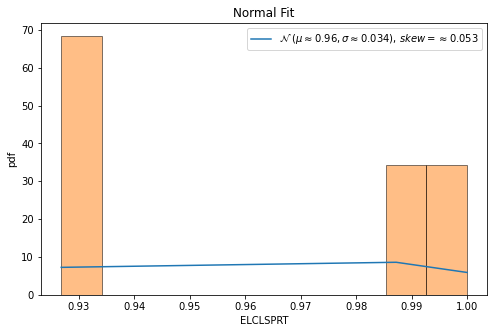


QQ plot 



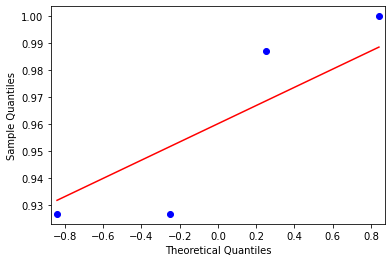

ends normality test ------------------------------------------------

feature name=  HLC
feature values=  [4088685       0       0       0]
max value =  4088685 min value =  0
mean=  1022171.25 standard deviation=  1770452.5390361887
left range=  136944.98048190563 right range=  1907397.5195180944
0.577350269 1.732050808
data covered within this range=  0.0 %
percent left and right=  75.0 25.0



normality test :----

kurtosis value=  -0.6666666666666661
skewness value=  1.1547005383792517


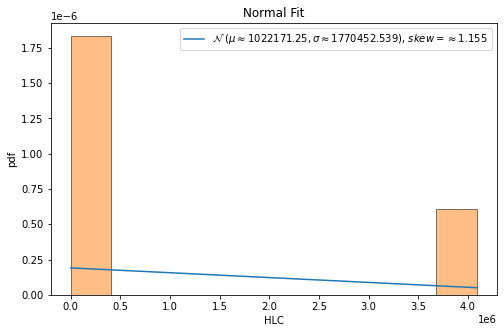


QQ plot 



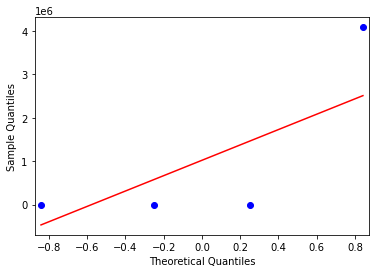

ends normality test ------------------------------------------------

feature name=  IHR
feature values=  [2204879 1705199 3430272 2890970]
max value =  3430272 min value =  1705199
mean=  2557830.0 standard deviation=  656447.1291593101
left range=  2229606.435420345 right range=  2886053.564579655
1.298857078 1.329036203
data covered within this range=  0.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.471020563848475
skewness value=  0.032896006919261624


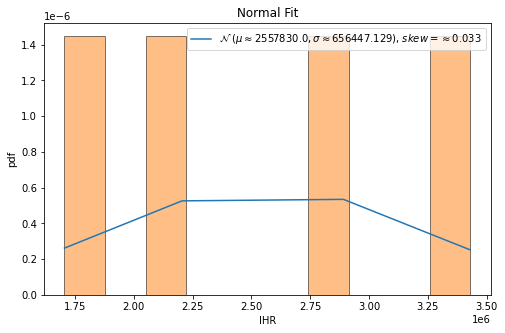


QQ plot 



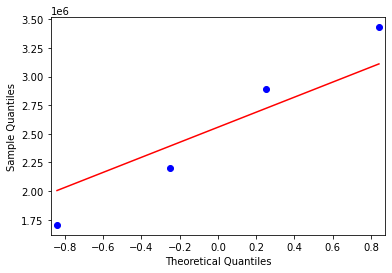

ends normality test ------------------------------------------------

feature name=  IIR
feature values=  [2194625  867968 1756394       0]
max value =  2194625 min value =  0
mean=  1204746.75 standard deviation=  843950.2793919127
left range=  782771.6103040436 right range=  1626721.8896959564
1.427509155 1.172910625
data covered within this range=  25.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.4367332306723555
skewness value=  -0.2699065947876924


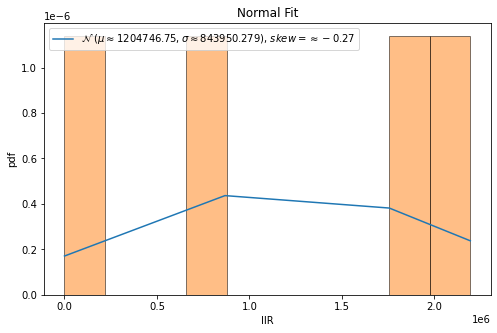


QQ plot 



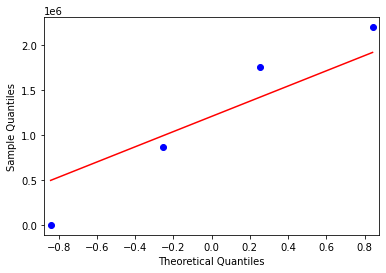

ends normality test ------------------------------------------------

feature name=  ITR
feature values=  [198426 204650 414560 414560]
max value =  414560 min value =  198426
mean=  308049.0 standard deviation=  106533.72889841038
left range=  254782.1355507948 right range=  361315.86444920517
1.028998057 0.999786651
data covered within this range=  0.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.9982939336259318
skewness value=  -0.00127968627608301


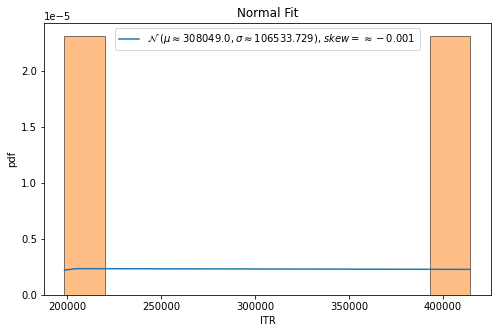


QQ plot 



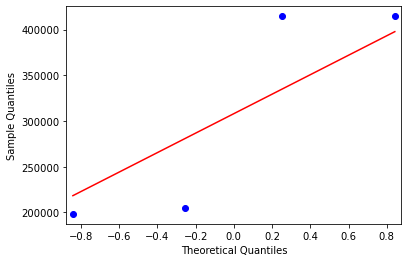

ends normality test ------------------------------------------------

feature name=  IND
feature values=  [ 228790  513094 1028838 1028838]
max value =  1028838 min value =  228790
mean=  699890.0 standard deviation=  343962.7628915665
left range=  527908.6185542168 right range=  871871.3814457832
1.369625003 0.956347708
data covered within this range=  0.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.6802827548358592
skewness value=  -0.24501358883028948


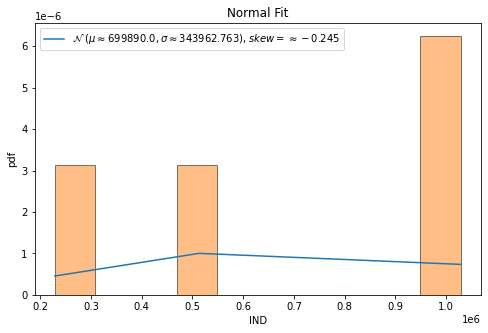


QQ plot 



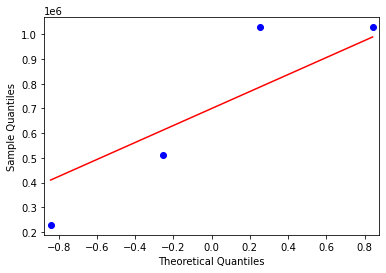

ends normality test ------------------------------------------------

feature name=  aNOC
feature values=  [2.79260316 0.70114943 0.70114943 0.76582278]
max value =  2.7926031610030755 min value =  0.7011494252873564
mean=  1.2401811990969787 standard deviation=  0.8966800376061975
left range=  0.7918411802938798 right range=  1.6885212179000775
0.601141713 1.731299791
data covered within this range=  0.0 %
percent left and right=  75.0 25.0



normality test :----

kurtosis value=  -0.6690250593325597
skewness value=  1.1517189454717787


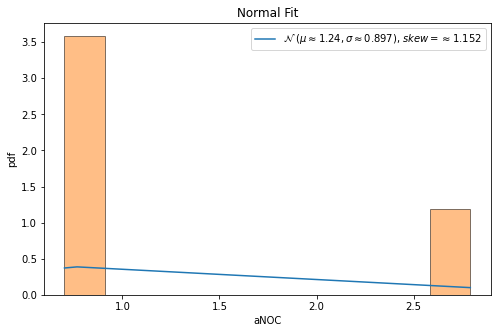


QQ plot 



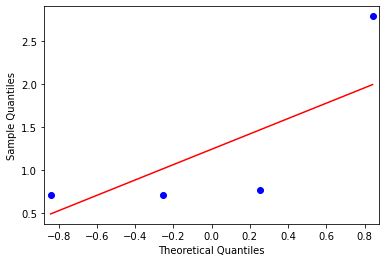

ends normality test ------------------------------------------------

feature name=  tNOC
feature values=  [2190261     122     122     121]
max value =  2190261 min value =  121
mean=  547656.5 standard deviation=  948358.1502471785
left range=  73477.42487641075 right range=  1021835.5751235893
0.577350972 1.732050808
data covered within this range=  0.0 %
percent left and right=  75.0 25.0



normality test :----

kurtosis value=  -0.6666666666671608
skewness value=  1.1547005383786098


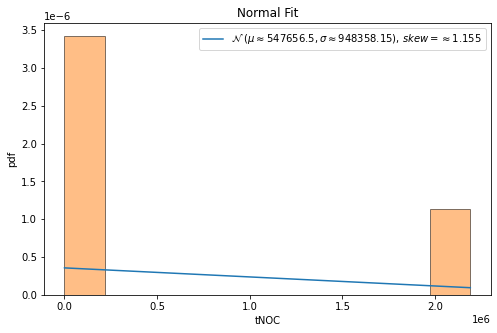


QQ plot 



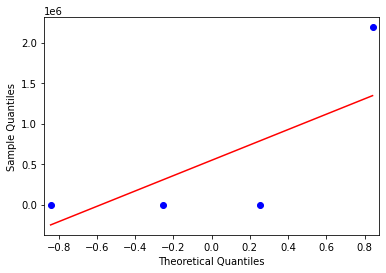

ends normality test ------------------------------------------------

feature name=  aCID
feature values=  [4.22038026e+00 4.12938506e+03 8.28735057e+03 9.12581013e+03]
max value =  9125.81012658228 min value =  4.220380258775888
mean=  5386.691534756241 standard deviation=  3638.222299992126
left range=  3567.580384760178 right range=  7205.802684752303
1.479423386 1.027732305
data covered within this range=  25.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.418920738123878
skewness value=  -0.421741900197528


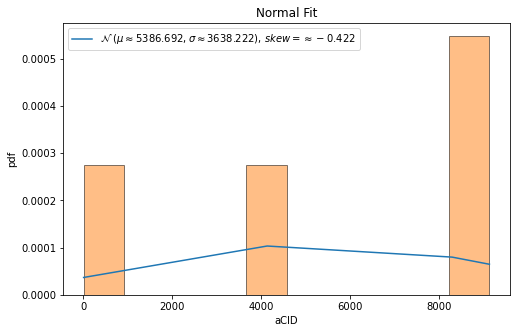


QQ plot 



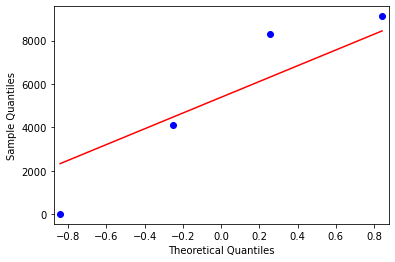

ends normality test ------------------------------------------------

feature name=  mCID
feature values=  [ 37661 196042 394192 394189]
max value =  394192 min value =  37661
mean=  255521.0 standard deviation=  149548.6471904711
left range=  180746.67640476447 right range=  330295.32359523553
1.456783489 0.927263487
data covered within this range=  25.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.4981648737803681
skewness value=  -0.3900056622345083


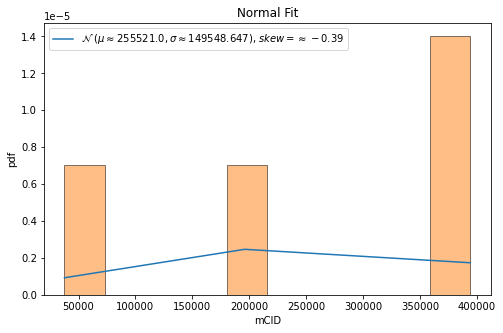


QQ plot 



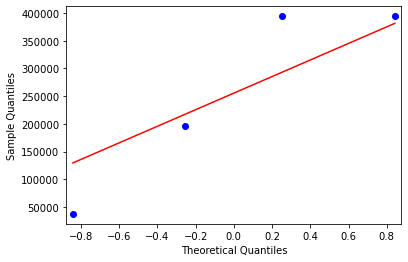

ends normality test ------------------------------------------------

feature name=  tCID
feature values=  [3310078  718513 1441999 1441878]
max value =  3310078 min value =  718513
mean=  1728117.0 standard deviation=  959908.4744628001
left range=  1248162.7627686 right range=  2208071.2372314
1.051771108 1.648033164
data covered within this range=  50.0 %
percent left and right=  75.0 25.0



normality test :----

kurtosis value=  -0.8459358761363136
skewness value=  0.8148975354642622


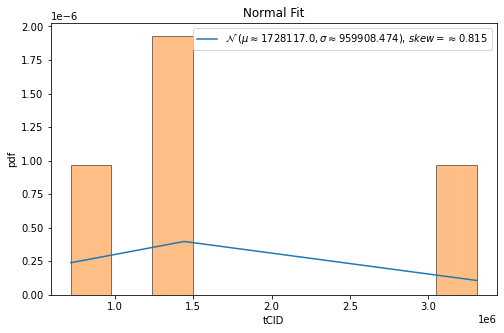


QQ plot 



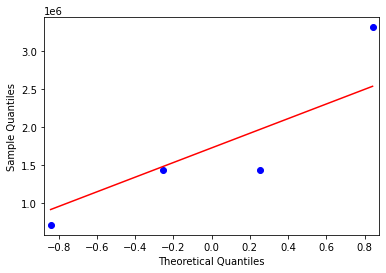

ends normality test ------------------------------------------------

feature name=  aCOD
feature values=  [ 4.72933082 13.16091954 13.15517241 13.65189873]
max value =  13.651898734177214 min value =  4.729330824115016
mean=  11.174330378078807 standard deviation=  3.726480775455662
left range=  9.311089990350975 right range=  13.037570765806638
1.7295137 0.664854726
data covered within this range=  0.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.6741551192742725
skewness value=  -1.1444414128605347


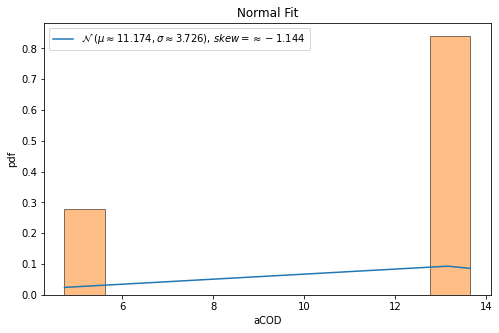


QQ plot 



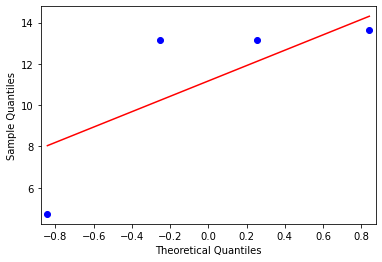

ends normality test ------------------------------------------------

feature name=  tCOD
feature values=  [3709252    2290    2289    2157]
max value =  3709252 min value =  2157
mean=  928997.0 standard deviation=  1605180.9735772787
left range=  126406.51321136067 right range=  1731587.4867886393
0.577405299 1.732050807
data covered within this range=  0.0 %
percent left and right=  75.0 25.0



normality test :----

kurtosis value=  -0.6666666696950401
skewness value=  1.154700534445154


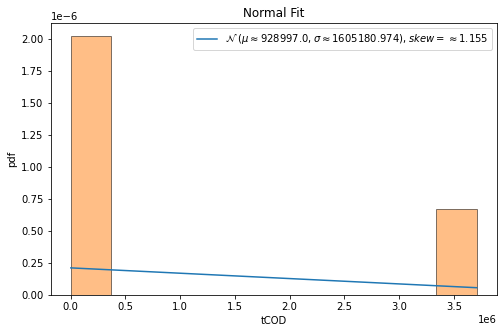


QQ plot 



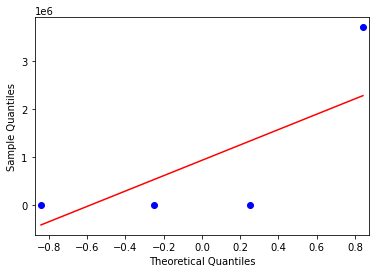

ends normality test ------------------------------------------------

feature name=  aNOP
feature values=  [3.59839629 0.99425287 0.99425287 0.99367089]
max value =  3.5983962932929416 min value =  0.9936708860759492
mean=  1.645143231623832 standard deviation=  1.1277112059793897
left range=  1.081287628634137 right range=  2.208998834613527
0.577694309 1.732050769
data covered within this range=  0.0 %
percent left and right=  75.0 25.0



normality test :----

kurtosis value=  -0.666666785021027
skewness value=  1.1547003846018795


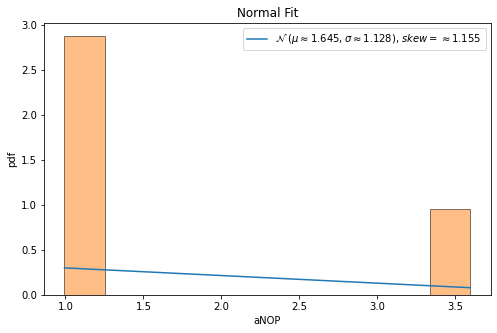


QQ plot 



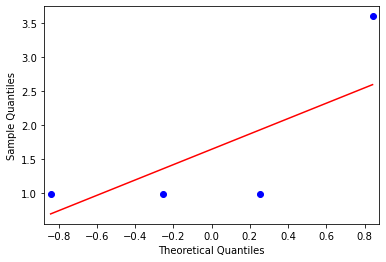

ends normality test ------------------------------------------------

feature name=  ENUMP
feature values=  [0.     0.0303 0.0303 0.    ]
max value =  0.0303 min value =  0.0
mean=  0.01515 standard deviation=  0.01515
left range=  0.007575 right range=  0.022725000000000002
1.0 1.0
data covered within this range=  0.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -2.0
skewness value=  0.0


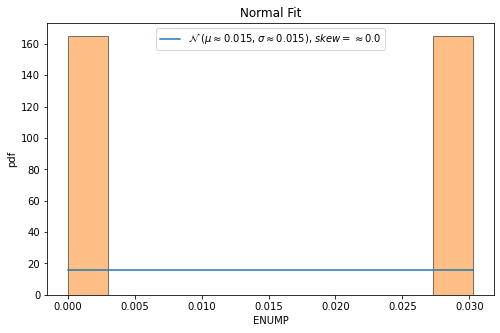


QQ plot 



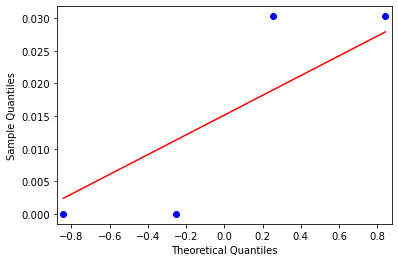

ends normality test ------------------------------------------------

feature name=  NEG
feature values=  [0 1 1 0]
max value =  1 min value =  0
mean=  0.5 standard deviation=  0.5
left range=  0.25 right range=  0.75
1.0 1.0
data covered within this range=  0.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -2.0
skewness value=  0.0


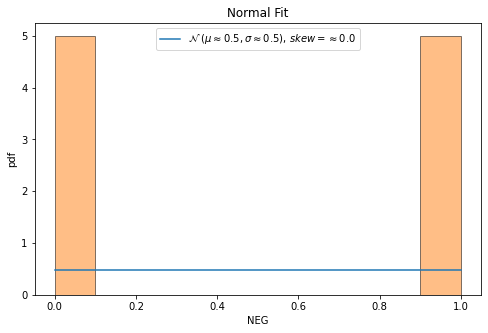


QQ plot 



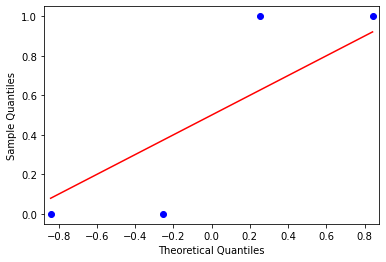

ends normality test ------------------------------------------------

feature name=  NEGP
feature values=  [0.     0.0303 0.0303 0.    ]
max value =  0.0303 min value =  0.0
mean=  0.01515 standard deviation=  0.01515
left range=  0.007575 right range=  0.022725000000000002
1.0 1.0
data covered within this range=  0.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -2.0
skewness value=  0.0


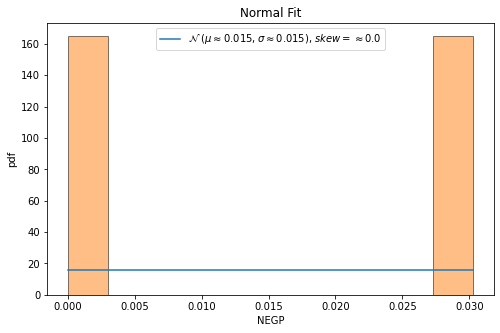


QQ plot 



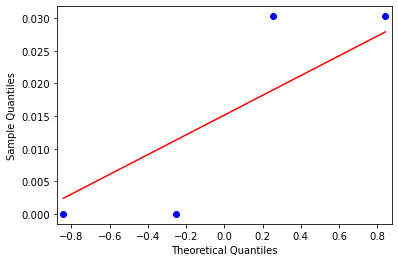

ends normality test ------------------------------------------------

feature name=  CONJP
feature values=  [0.4448 0.3939 0.3939 0.4231]
max value =  0.4448 min value =  0.3939
mean=  0.413925 standard deviation=  0.021444390292102034
left range=  0.403202804853949 right range=  0.424647195146051
0.933810648 1.439770475
data covered within this range=  25.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.5371595201873813
skewness value=  0.3585767705965319


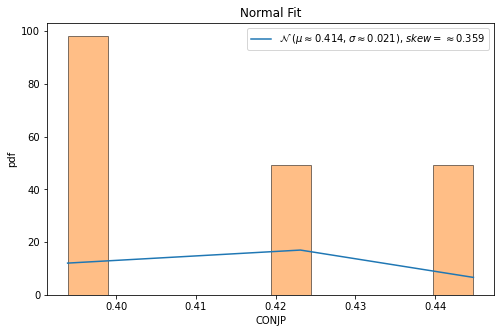


QQ plot 



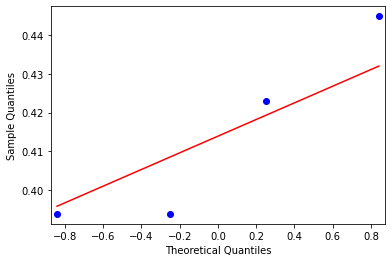

ends normality test ------------------------------------------------

feature name=  EFP
feature values=  [0.5552 0.2424 0.2424 0.5   ]
max value =  0.5552 min value =  0.2424
mean=  0.385 standard deviation=  0.14392928819389056
left range=  0.31303535590305476 right range=  0.45696464409694526
0.990764297 1.182525128
data covered within this range=  0.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.9274697138373673
skewness value=  0.054648898901756573


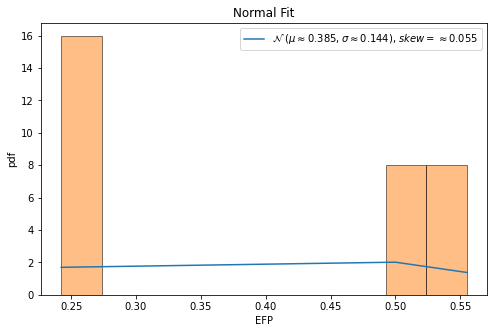


QQ plot 



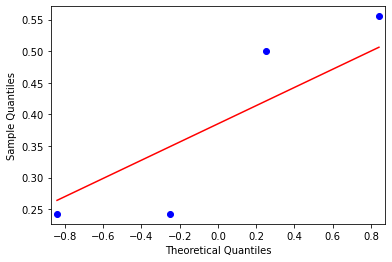

ends normality test ------------------------------------------------

feature name=  VALUE
feature values=  [0 1 1 1]
max value =  1 min value =  0
mean=  0.75 standard deviation=  0.4330127018922193
left range=  0.5334936490538904 right range=  0.9665063509461096
1.732050808 0.577350269
data covered within this range=  0.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.6666666666666665
skewness value=  -1.1547005383792515


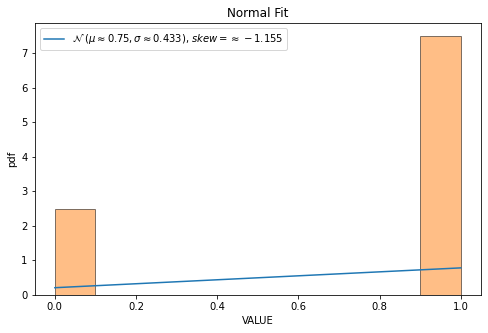


QQ plot 



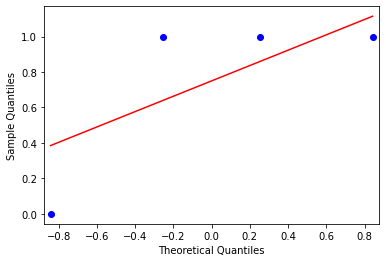

ends normality test ------------------------------------------------

feature name=  SELFP
feature values=  [0.     0.0303 0.0303 0.0385]
max value =  0.0385 min value =  0.0
mean=  0.024775 standard deviation=  0.014690366741507851
left range=  0.017429816629246073 right range=  0.032120183370753924
1.68647934 0.934285729
data covered within this range=  50.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.7771256810646436
skewness value=  -0.9686950826505083


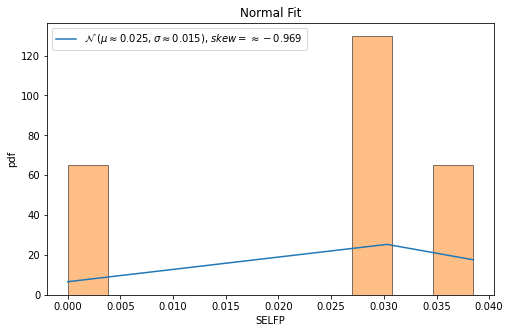


QQ plot 



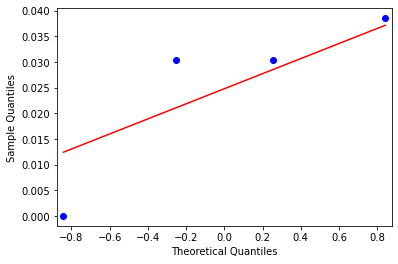

ends normality test ------------------------------------------------

feature name=  MNCARP
feature values=  [0.     0.0303 0.0303 0.    ]
max value =  0.0303 min value =  0.0
mean=  0.01515 standard deviation=  0.01515
left range=  0.007575 right range=  0.022725000000000002
1.0 1.0
data covered within this range=  0.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -2.0
skewness value=  0.0


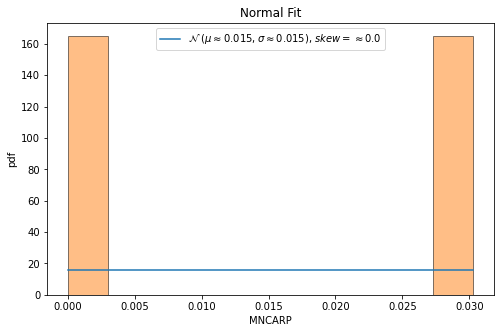


QQ plot 



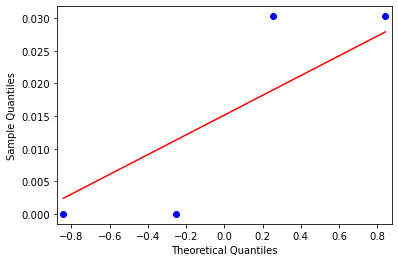

ends normality test ------------------------------------------------

feature name=  OBP
feature values=  [273  90  90  86]
max value =  273 min value =  86
mean=  134.75 standard deviation=  79.83537749644577
left range=  94.83231125177711 right range=  174.66768874822287
0.610631546 1.731688436
data covered within this range=  0.0 %
percent left and right=  75.0 25.0



normality test :----

kurtosis value=  -0.6677658227893217
skewness value=  1.15324444393975


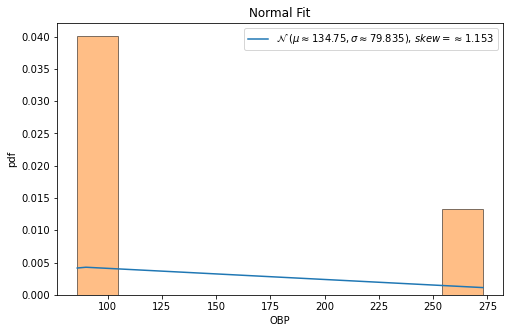


QQ plot 



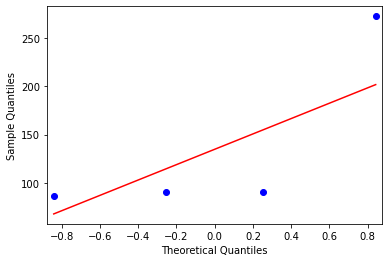

ends normality test ------------------------------------------------

feature name=  OBPP
feature values=  [1.     0.8738 0.8738 0.8776]
max value =  1.0 min value =  0.8738
mean=  0.9063000000000001 standard deviation=  0.054119959349578216
left range=  0.879240020325211 right range=  0.9333599796747892
0.60051782 1.731339068
data covered within this range=  0.0 %
percent left and right=  75.0 25.0



normality test :----

kurtosis value=  -0.6689006236703681
skewness value=  1.1518742748728787


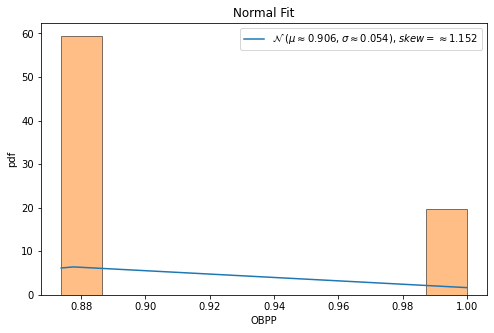


QQ plot 



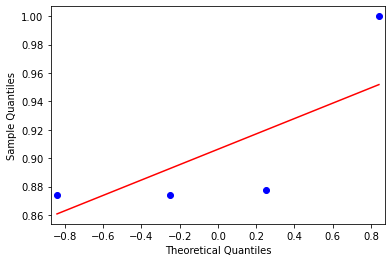

ends normality test ------------------------------------------------

feature name=  DTP
feature values=  [ 0 13 13 12]
max value =  13 min value =  0
mean=  9.5 standard deviation=  5.5
left range=  6.75 right range=  12.25
1.727272727 0.636363636
data covered within this range=  25.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.6820572365275597
skewness value=  -1.1359879789631855


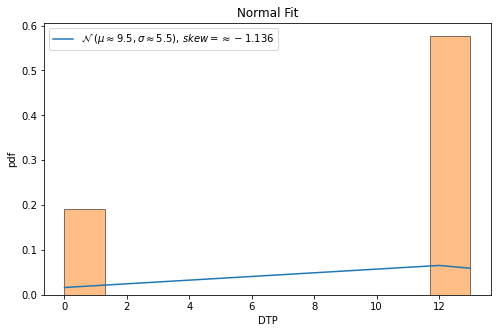


QQ plot 



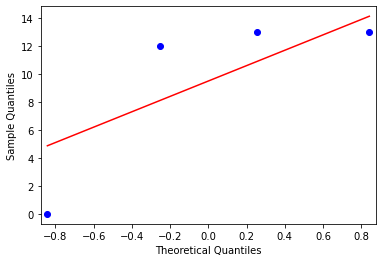

ends normality test ------------------------------------------------

feature name=  DTPP
feature values=  [0.     0.1262 0.1262 0.1224]
max value =  0.1262 min value =  0.0
mean=  0.0937 standard deviation=  0.05411995934957823
left range=  0.0666400203252109 right range=  0.12075997967478912
1.731339068 0.60051782
data covered within this range=  0.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.668900623670361
skewness value=  -1.1518742748728839


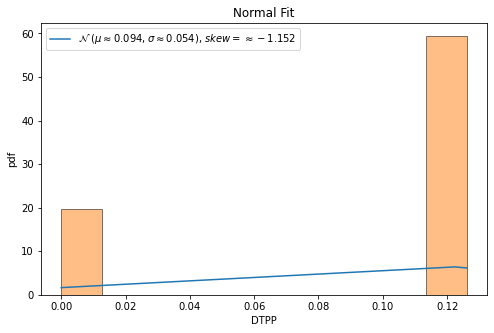


QQ plot 



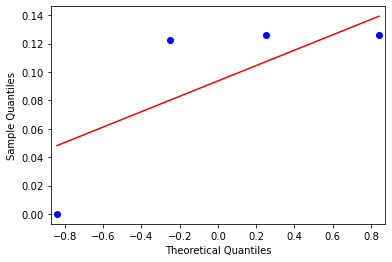

ends normality test ------------------------------------------------

feature name=  FUNP
feature values=  [0.0073 0.0485 0.0485 0.0102]
max value =  0.0485 min value =  0.0073
mean=  0.028625 standard deviation=  0.019901428968795182
left range=  0.01867428551560241 right range=  0.03857571448439759
1.071531096 0.998672006
data covered within this range=  0.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.9894042407795547
skewness value=  -0.007952096070701922


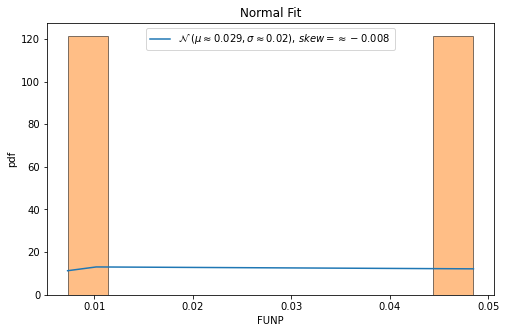


QQ plot 



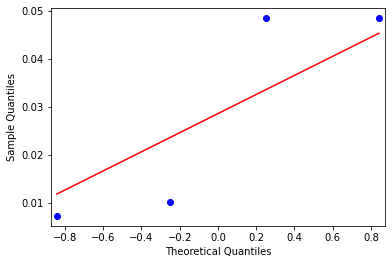

ends normality test ------------------------------------------------

feature name=  SYMP
feature values=  [0.0183 0.0194 0.0194 0.    ]
max value =  0.0194 min value =  0.0
mean=  0.014275 standard deviation=  0.00825390059305296
left range=  0.010148049703473518 right range=  0.01840195029652648
1.729485331 0.620918551
data covered within this range=  25.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.6748432270394695
skewness value=  -1.1445891233802652


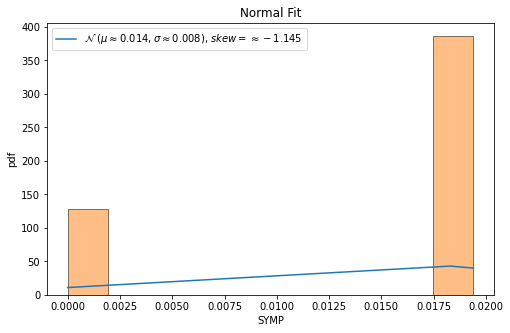


QQ plot 



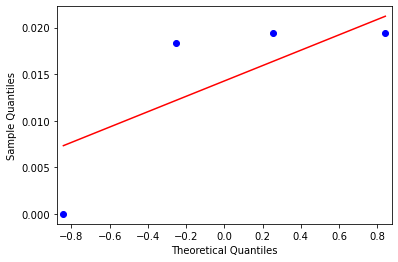

ends normality test ------------------------------------------------

feature name=  SUBP
feature values=  [168  65  65  53]
max value =  168 min value =  53
mean=  87.75 standard deviation=  46.59063747149206
left range=  64.45468126425396 right range=  111.04531873574604
0.745858007 1.722449066
data covered within this range=  50.0 %
percent left and right=  75.0 25.0



normality test :----

kurtosis value=  -0.6936851573562008
skewness value=  1.1156099817523268


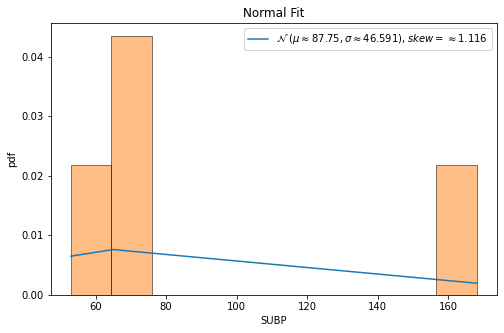


QQ plot 



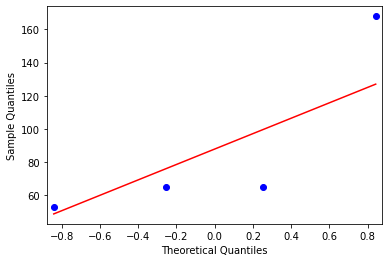

ends normality test ------------------------------------------------

feature name=  DISP
feature values=  [0 2 2 0]
max value =  2 min value =  0
mean=  1.0 standard deviation=  1.0
left range=  0.5 right range=  1.5
1.0 1.0
data covered within this range=  0.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -2.0
skewness value=  0.0


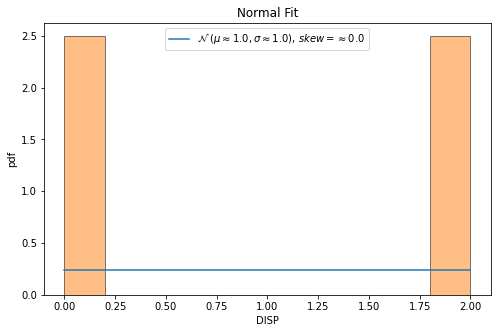


QQ plot 



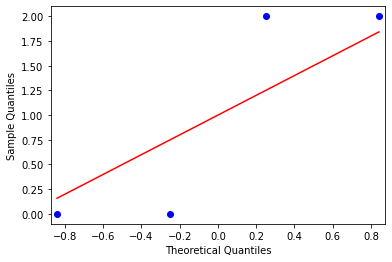

ends normality test ------------------------------------------------

feature name=  INV
feature values=  [33 22 22  0]
max value =  33 min value =  0
mean=  19.25 standard deviation=  11.986972094736853
left range=  13.256513952631574 right range=  25.243486047368428
1.605910137 1.147078669
data covered within this range=  50.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.9030470914127422
skewness value=  -0.6520236646847545


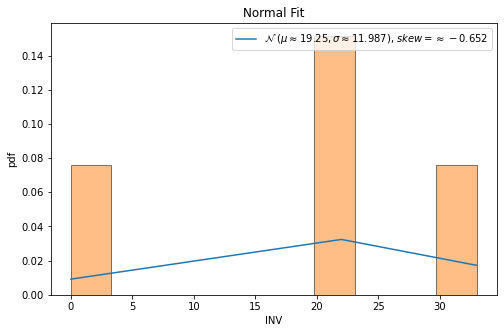


QQ plot 



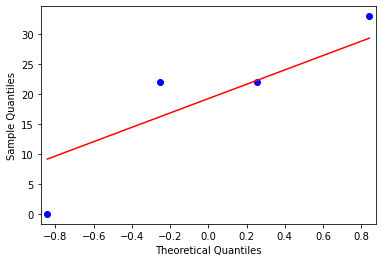

ends normality test ------------------------------------------------

feature name=  DOMN
feature values=  [58 69 69 56]
max value =  69 min value =  56
mean=  63.0 standard deviation=  6.041522986797286
left range=  59.979238506601355 right range=  66.02076149339864
1.158648244 0.993127066
data covered within this range=  0.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.9457684368549446
skewness value=  -0.04081344108176061


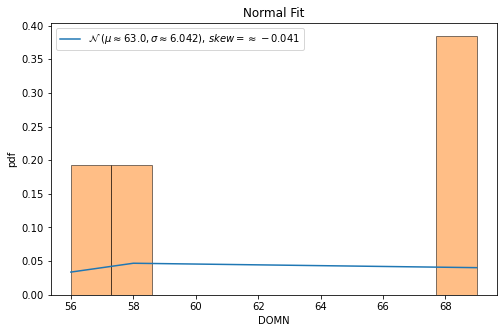


QQ plot 



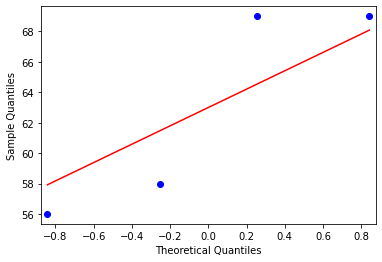

ends normality test ------------------------------------------------

feature name=  RANG
feature values=  [49 58 58 46]
max value =  58 min value =  46
mean=  52.75 standard deviation=  5.356071321407137
left range=  50.07196433929643 right range=  55.42803566070357
1.260252076 0.980196059
data covered within this range=  0.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.8477508650519032
skewness value=  -0.11531718339054198


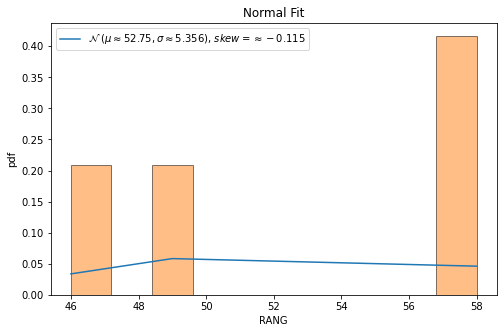


QQ plot 



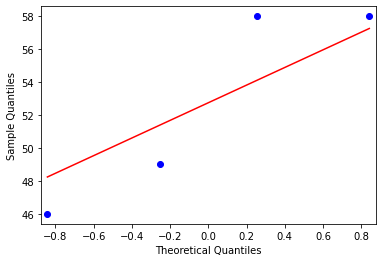

ends normality test ------------------------------------------------

feature name=  CHN
feature values=  [102   8   7   8]
max value =  102 min value =  7
mean=  31.25 standard deviation=  40.84957160118084
left range=  10.82521419940958 right range=  51.67478580059042
0.593641477 1.731964308
data covered within this range=  0.0 %
percent left and right=  75.0 25.0



normality test :----

kurtosis value=  -0.6669311050149065
skewness value=  1.1543537456767972


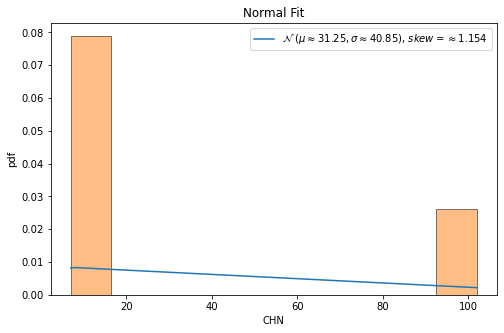


QQ plot 



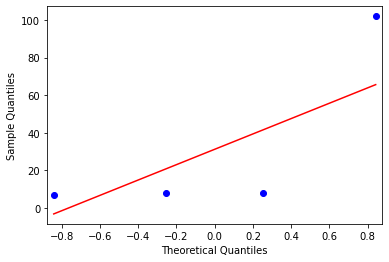

ends normality test ------------------------------------------------

feature name=  CHNP
feature values=  [0.37362637 0.0776699  0.06796117 0.08163265]
max value =  0.3736263736263736 min value =  0.06796116504854369
mean=  0.15022252366219077 standard deviation=  0.1290781395381014
left range=  0.08568345389314007 right range=  0.21476159343124146
0.637298918 1.73076441
data covered within this range=  0.0 %
percent left and right=  75.0 25.0



normality test :----

kurtosis value=  -0.6705505165702896
skewness value=  1.1495291230363955


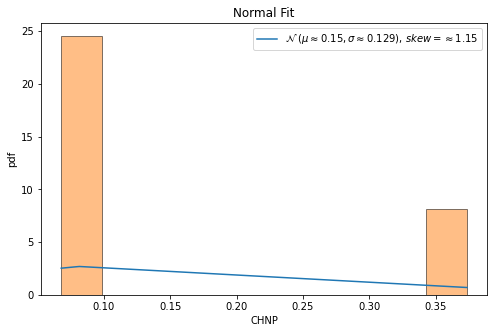


QQ plot 



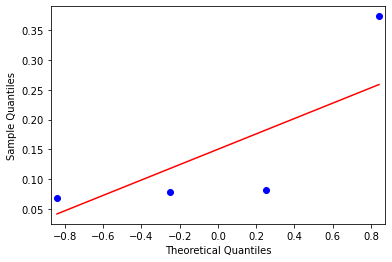

ends normality test ------------------------------------------------

feature name=  ELPROP
feature values=  [0.9159292  0.84337349 0.84274194 0.95428571]
max value =  0.9542857142857144 min value =  0.842741935483871
mean=  0.8890825868213281 standard deviation=  0.04798167826237994
left range=  0.8650917476901382 right range=  0.9130734259525181
0.965798884 1.358917191
data covered within this range=  0.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.6995535881386785
skewness value=  0.2298042109873242


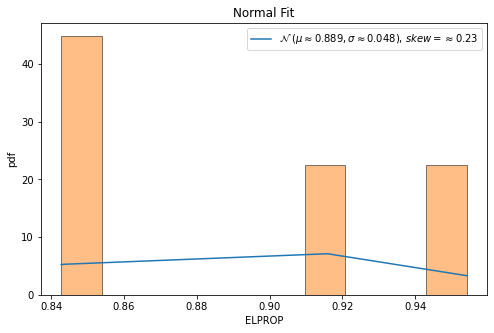


QQ plot 



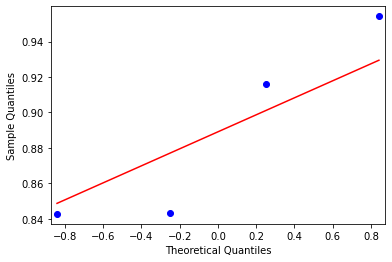

ends normality test ------------------------------------------------

feature name=  CAL_TIME
feature values=  [ 549920 1131430 3971860 3450510]
max value =  3971860 min value =  549920
mean=  2275930.0 standard deviation=  1461575.1358893595
left range=  1545142.4320553201 right range=  3006717.56794468
1.180924578 1.160344041
data covered within this range=  0.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.8623132193110676
skewness value=  -0.011437342076115816


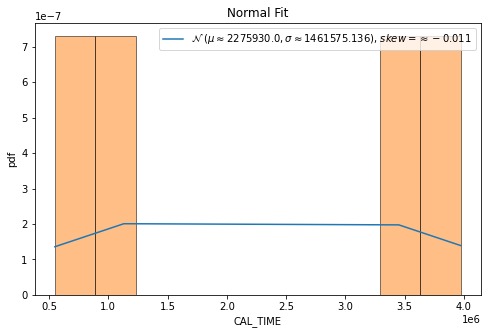


QQ plot 



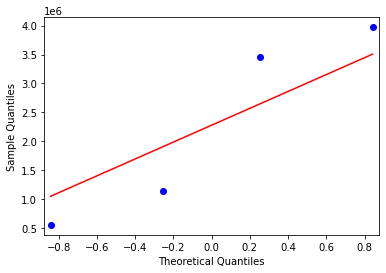

ends normality test ------------------------------------------------



In [270]:
#**** follow the same notation as explained above in 'easy time easy memory' category wherever required*******#


#after medium time and memory clusering ,
#collect the hard ones

from matplotlib import pyplot as plt
%matplotlib inline
#%matplotlib qt 
import scipy
from scipy.stats import norm
from statsmodels.graphics.gofplots import qqplot
import statistics
from scipy.stats import shapiro
from scipy.stats import normaltest
import math
#interquratile range 
def cal(sov_sort):
    p=0
    l=len(sov_sort)
    left=0
    right=0
    while  p < 90 :
        if p==0:
            if l % 2 ==0:
                left=( l /2)
                right=( l / 2) + 1
                p= round((((right -left +1) / l) * 100),2)
                
            else:
                left=math.floor( l /2)
                right=math.ceil(l/2) + 1
                p= round((((right -left +1) / l) * 100),2)
                
        else:
            if left % 2 !=0:
                left = math.ceil(left/2)
            else:
                left = left /2
            
            dist = l - right +1
            if dist % 2 !=0:
                right = right + math.ceil(dist/2)
            else:
                right = right + (dist /2)
                
            p= round((((right -left +1) / l) * 100),2)
             
        
    return left-1,right-1





medium_time_mem_hard = df_medium_time_mem_feature_df[df_medium_time_mem_feature_df['label_mem']== 'hard']
print(medium_time_mem_hard.shape)
prior_hard= round(medium_time_mem_hard.shape[0] / df_medium_time_mem_feature_df.shape[0] ,5)

main_dict_mtmh={}
main_dict_mtmh_iqr={}

for i in range(len(cols_list)):
    if cols_list[i] in top_n_2:
        tmp_dict={}
        tmp_dict_iqr={}
        
        feature = cols_list[i]
        print("feature name= ",feature)
        
        sov=np.array(medium_time_mem_hard[feature])
        sov_1=(np.sort(sov))
        print("feature values= ",sov)
        skew=scipy.stats.skew(sov)
        
        tmp_dict["skew"]=round(skew,4)
        tmp_dict_iqr["skew"]=round(skew,4)
        
        if -2 < skew and skew < 2:
        
            print("max value = ",np.max(sov),"min value = ",np.min(sov))
            tmp_dict["min"]=round(np.min(sov),9)
            tmp_dict["max"]=round(np.max(sov),9)
            min_val=np.min(sov)
            max_val=np.max(sov)

            mean = np.mean(sov)
            std = np.std(sov)
            print("mean= ",mean,"standard deviation= ",std)
            tmp_dict["mean"]=round(mean,9)
            tmp_dict["std"]=round(std,9)
            #gamma=2
            #rx= mean - ((1- prior_hard) *gamma * std) 
            #ry= mean + ((1- prior_hard) *gamma * std)
            
            l_weight=0.5
            r_weight=0.5
            rx= mean - (l_weight* std) 
            ry= mean + (r_weight* std)
            print("left range= ",rx,"right range= ", ry)
            tmp_dict["lw_i"]=round(l_weight,9)
            tmp_dict["rw_i"]=round(r_weight,9)
            tmp_dict["lr"]=round(rx,9)
            tmp_dict["rr"]=round(ry,9)

            min_val_w= round(((mean - min_val) /std ),9)
            max_val_w= round(((max_val - mean) /std ),9)
            print(min_val_w,max_val_w)
            tmp_dict["min_val_w"]=round(min_val_w,9)
            tmp_dict["max_val_w"]=round(max_val_w,9)


            val=(((rx <= sov) & (sov <= ry)).sum()) / medium_time_mem_hard.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within this range= ",v,"%")

            tmp_dict["percent_i"]=round(v,9)
            tmp_dict["percent_change"]=round(v,9)

            val=(((min_val <= sov) & (sov <= mean)).sum()) / medium_time_mem_hard.shape[0]
            percent_l =  round((val * 100 ),2)

            val=(((mean <= sov) & (sov <= max_val)).sum()) / medium_time_mem_hard.shape[0]
            percent_r =  round((val * 100 ),2)

            print("percent left and right= ",percent_l,percent_r)
            tmp_dict["percent_l"]=percent_l
            tmp_dict["percent_r"]=percent_r
            
            main_dict_mtmh[feature]=tmp_dict
            
        else:
            
            left_index,right_index = cal(sov_1)
            rx=sov_1[int(left_index)]
            ry=sov_1[int(right_index)]

            print("max value = ",np.max(sov),"min value = ",np.min(sov))
            
            tmp_dict_iqr["min"]=round(np.min(sov),9)
            tmp_dict_iqr["max"]=round(np.max(sov),9)
            min_val=np.min(sov)
            max_val=np.max(sov)
            
            
            mean = np.mean(sov)
            std = np.std(sov)
            print("mean= ",mean,"standard deviation= ",std)
            tmp_dict_iqr["mean"]=round(mean,9)
            tmp_dict_iqr["std"]=round(std,9)
            
            print("left range= ",rx,"right range= ", ry)
            tmp_dict_iqr["lw_i"]="null"
            tmp_dict_iqr["rw_i"]="null"
            tmp_dict_iqr["lr"]=round(rx,9)
            tmp_dict_iqr["rr"]=round(ry,9)
            
            
            tmp_dict_iqr["min_val_w"]="null"
            tmp_dict_iqr["max_val_w"]="null"
            tmp_dict_iqr["percent_i"]="null"
            val=(((rx <= sov) & (sov <= ry)).sum()) / medium_time_mem_hard.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within this range= ",v,"%")
            tmp_dict_iqr["percent_change"]=round(v,9)
            
            val=(((min_val <= sov) & (sov <= mean)).sum()) / medium_time_mem_hard.shape[0]
            percent_l =  round((val * 100 ),2)

            val=(((mean <= sov) & (sov <= max_val)).sum()) / medium_time_mem_hard.shape[0]
            percent_r =  round((val * 100 ),2)

            print("percent left and right= ",percent_l,percent_r)
            
            tmp_dict_iqr["percent_l"]=percent_l
            tmp_dict_iqr["percent_r"]=percent_r
            
            main_dict_mtmh_iqr[feature]=tmp_dict_iqr

            
            # 68–95–99.7 rule, also known as the empirical rule

            # for 1*std
            left = mean - std
            right = mean + std
            val=(((left <= sov) & (sov <= right)).sum()) / medium_time_mem_hard.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 1 standard deviation= ",v,"%")
            
            # for 2*std
            left = mean - (2*std)
            right = mean + (2*std)
            val=(((left <= sov) & (sov <= right)).sum()) / medium_time_mem_hard.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 2 standard deviation= ",v,"%")
            


            # for 3*std
            left = mean - (3*std)
            right = mean + (3*std)
            val=(((left <= sov) & (sov <= right)).sum()) / medium_time_mem_hard.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 3 standard deviation= ",v,"%")
            
            
        print("\n\n")
        
        #normality test
        print("normality test :----\n")
        # kurtosis and skew function
        kurt=scipy.stats.kurtosis(sov)
        print("kurtosis value= ",kurt)
        
        
        print("skewness value= ",skew)
        
        
        
        #plotting graph for to see the skewess
        sov_1=np.sort(sov)
        fig, ax1 = plt.subplots(1, 1, figsize=(8,5))
        ax1.plot(sov_1, norm.pdf(sov_1, mean, std),label='$\mathcal{N}$ '+ f'$( \mu \\approx {round(mean,3)} , \sigma \\approx {round(std,3)})$, $ skew = \\approx {round(skew,3)}$')
        ax1.hist(sov_1,edgecolor='black',alpha=0.5,density= True)
        ax1.set_title("Normal Fit")
        ax1.set_xlabel(feature)
        ax1.set_ylabel("pdf")
        ax1.legend()
        #plt.savefig('/home/ritam/ontology_hardness/normal_curve_&_skewness/medium_time_hard_memory/'+str(feature)+'.jpeg')
        plt.show()
        
        # Quantile-Quantile Plot Nomrality check
        print("\nQQ plot \n")
        qqplot(sov_1, line='s')
        plt.show()
        
        #try the below test when you have more than 8 ontologies
        ''''
        #Statistical Normality Tests
        # Shapiro-Wilk Test
        print("\n Shapiro-Wilk Test \n ")
        #stat, p = shapiro(sov_1[0:4998])
        stat, p = normaltest(sov_1)
        print('Statistics=%.3f, p=%f' % (stat, p))
        
        alpha = 0.05
        if p > alpha:
            print('Sample looks Gaussian (fail to reject H0)')
        else:
            print('Sample does not look Gaussian (reject H0)')
        '''   
        print("ends normality test ------------------------------------------------\n")
        
        

In [271]:
#**** follow the same notation as explained above in 'easy time easy memory' category wherever required*******#

import copy

main_dict_cal_mtmh={}
dec_rate=[(0.9,0.9)]
for i in range(len(dec_rate)):
 
    main_dict_cal_mtmh=copy.deepcopy(main_dict_mtmh)
    lower_r=dec_rate[i][0]
    high_r=dec_rate[i][1]
    for j in range (100):
        c=0
        for key,value in main_dict_cal_mtmh.items():
            
            if value["percent_change"] < 90:
                
                lw_i_temp=value["lw_i"]
                rw_i_temp=value["rw_i"]
                if value["percent_l"] >= 50:
                    diff=value["min_val_w"] - lw_i_temp
                    frac = round(lower_r * diff, 9)  
                    
                    lw_i_temp= round(lw_i_temp + frac , 9)
                    main_dict_cal_mtmh[key]["lw_i"]=lw_i_temp
                else:
                    diff=value["min_val_w"] - lw_i_temp
                    frac = round(high_r * diff, 9)  
                    
                    lw_i_temp= round(lw_i_temp + frac ,9 )
                    main_dict_cal_mtmh[key]["lw_i"]=lw_i_temp

                if value["percent_r"] >= 50:
                    diff=value["max_val_w"] - rw_i_temp
                    frac = round(lower_r * diff, 9)  
                    
                    rw_i_temp= round(rw_i_temp + frac , 9 )
                    main_dict_cal_mtmh[key]["rw_i"]=rw_i_temp
                else:
                    diff=value["max_val_w"] - rw_i_temp
                    frac = round(high_r * diff, 9)  
                    
                    rw_i_temp= round(rw_i_temp + frac ,9 )
                    main_dict_cal_mtmh[key]["rw_i"]=rw_i_temp

                sov=np.array(medium_time_mem_hard[key])
                rx= round(value["mean"] - (lw_i_temp* value["std"]) ,9)
                ry= round(value["mean"] + (rw_i_temp* value["std"]),9)
                main_dict_cal_mtmh[key]["lr"]=round(rx,9)
                main_dict_cal_mtmh[key]["rr"]=round(ry,9)
                
                val=(((rx <= sov) & (sov <= ry)).sum()) / medium_time_mem_hard.shape[0]
                v =  round((val * 100 ),2)
                main_dict_cal_mtmh[key]["percent_change"]=v

                if v >=85:
                    c=c+1
                
            else:
                c=c+1
        p=round(c / len(list(main_dict_cal_mtmh.keys())),2)
        print ("percent in loop ",j , "covers ", p , "%" )
        

percent in loop  0 covers  0.0 %
percent in loop  1 covers  0.0 %
percent in loop  2 covers  0.0 %
percent in loop  3 covers  0.0 %
percent in loop  4 covers  0.0 %
percent in loop  5 covers  0.0 %
percent in loop  6 covers  0.02 %
percent in loop  7 covers  0.12 %
percent in loop  8 covers  0.22 %
percent in loop  9 covers  0.46 %
percent in loop  10 covers  0.46 %
percent in loop  11 covers  0.46 %
percent in loop  12 covers  0.46 %
percent in loop  13 covers  0.46 %
percent in loop  14 covers  0.46 %
percent in loop  15 covers  0.46 %
percent in loop  16 covers  0.46 %
percent in loop  17 covers  0.46 %
percent in loop  18 covers  0.46 %
percent in loop  19 covers  0.46 %
percent in loop  20 covers  0.46 %
percent in loop  21 covers  0.46 %
percent in loop  22 covers  0.46 %
percent in loop  23 covers  0.46 %
percent in loop  24 covers  0.46 %
percent in loop  25 covers  0.46 %
percent in loop  26 covers  0.46 %
percent in loop  27 covers  0.46 %
percent in loop  28 covers  0.46 %
p

In [272]:
#**** follow the same notation as explained above in 'easy time easy memory' category wherever required*******#

main_dict_cal_mtmh
print(len(main_dict_cal_mtmh),len(main_dict_mtmh_iqr))
mtmh_pd=pd.DataFrame(main_dict_cal_mtmh)
mtmh_iqr_pd=pd.DataFrame(main_dict_mtmh_iqr)

frames = [mtmh_pd,mtmh_iqr_pd]
result = pd.concat(frames,axis=1)
result
#result.to_csv("mtmh_ranges.csv")


50 0


In [273]:
medium_time_mem_hard # contains 4 ontologies in this category

,file,size_kb,consistency_time_milsecs,consistency_size_kb,realisation_time_milsecs,realisation_size_kb,classification_time_milsecs,classification_size_kb,SOV,ENR,...,EQVP,DISP,INV,DOMN,RANG,CHN,CHNP,ELPROP,CAL_TIME,label_mem
0,00699.owl_functional.owl,582904,510801,118948904,533505,117505604,572655,117441840,448079,3.890409,...,0,0,33,58,49,102,0.373626,0.915929,549920,hard
1,OWL2DL-100.owl,543811,673449,128672792,704093,128793224,690983,128832840,1757531,4.114746,...,5,2,22,69,58,8,0.077670,0.843373,1131430,hard
2,OWL2DL-200.owl,1108757,616636,128837964,628923,128842096,642479,128838868,3389780,4.291430,...,5,2,22,69,58,7,0.067961,0.842742,3971860,hard
3,OWL2EL-200.owl,1108750,605649,106586272,607356,108235012,591436,107000568,3389774,4.291401,...,4,0,0,56,46,8,0.081633,0.954286,3450510,hard


In [274]:
#**** follow the same notation as explained above in  wherever required*******#

# collect the hard ones
df_hard=partial_dataframe[partial_dataframe['label_time']=='hard']
df_hard_drop=df_hard # contains based on time
df_hard_drop

,file,size_kb,consistency_time_milsecs,consistency_size_kb,realisation_time_milsecs,realisation_size_kb,classification_time_milsecs,classification_size_kb,label_time
287,085abd30-44cb-4bc3-90b2-ba12067a2253_premises6...,64,21600051,1352844,21600273,9697004,21600477,18797388,hard
29,0805c492-a3fa-41e6-b667-9968da4d9e3f_iridlcfds...,1178,21600095,1411176,21600125,1431748,21600094,1420944,hard
48,0952091f-65b7-4abb-88d9-589ec5d8709e_onmapping...,1180,21600095,1423224,21600073,1391916,656914,1097220,hard
117,107b3d41-1458-4d46-ae69-d1ba712085a2_EnzyO0616...,5547,21600449,17684888,21600430,17534216,21600584,24260664,hard
19,75714e9a-2962-4466-8377-5ceaad9662c7_VAST2009....,14328,21600406,8128296,92155,113488448,21600415,7870180,hard
128,feaf1577-ec44-4912-9caa-a57a720af930_cfobj.owl...,1150,21600056,1387476,21600107,1408484,21600114,1394612,hard


(6, 7)
[1 1 1 2 0 1]


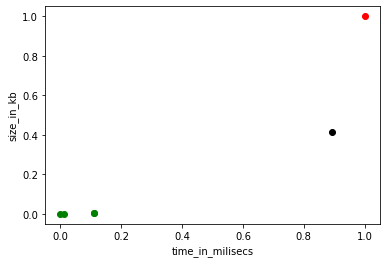

In [275]:
#**** follow the same notation as explained above in 'easy time easy memory' category wherever required*******#

# now hard time ontologies clustered on memory
t=df_hard_drop.drop(['file','label_time'],axis=1)
scaler = MinMaxScaler()
scaler.fit(t)
t_df_scaled=scaler.transform(t)

t_MinMax = pd.DataFrame(data=t_df_scaled, columns=['size_kb', 'consistency_time_milsecs', 'consistency_size_kb',
       'realisation_time_milsecs', 'realisation_size_kb',
       'classification_time_milsecs', 'classification_size_kb'])
t=t_MinMax

print(t.shape)
km_3 = KMeans(n_clusters=3,random_state=0)
y_predicted_3=km_3.fit_predict(t[["consistency_size_kb"]])
print(y_predicted_3)
t['cluster']=y_predicted_3

t1=t[t['cluster']==0]
t2=t[t['cluster']==1]
t3=t[t['cluster']==2]

plt.scatter(t1["consistency_time_milsecs"],t1["consistency_size_kb"],c='black')
plt.scatter(t2["consistency_time_milsecs"],t2["consistency_size_kb"],c='green')
plt.scatter(t3["consistency_time_milsecs"],t3["consistency_size_kb"],c='red')
plt.xlabel('time_in_milisecs')
plt.ylabel('size_in_kb')
plt.show()


In [276]:
#**** follow the same notation as explained above in  wherever required*******#


label_col=[]
for i in range((y_predicted_3.shape[0])):
    if y_predicted_3[i]==0:
        label_col.append('medium')
    elif y_predicted_3[i]==1:
        label_col.append('easy')
    else:
        label_col.append('hard')
        
df_hard_drop['label_mem']=label_col
df_hard_time_mem=df_hard_drop # contains first based on time and now on memory
df_hard_time_mem

<ipython-input-276-72dfc7b98f55>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_hard_drop['label_mem']=label_col


,file,size_kb,consistency_time_milsecs,consistency_size_kb,realisation_time_milsecs,realisation_size_kb,classification_time_milsecs,classification_size_kb,label_time,label_mem
287,085abd30-44cb-4bc3-90b2-ba12067a2253_premises6...,64,21600051,1352844,21600273,9697004,21600477,18797388,hard,easy
29,0805c492-a3fa-41e6-b667-9968da4d9e3f_iridlcfds...,1178,21600095,1411176,21600125,1431748,21600094,1420944,hard,easy
48,0952091f-65b7-4abb-88d9-589ec5d8709e_onmapping...,1180,21600095,1423224,21600073,1391916,656914,1097220,hard,easy
117,107b3d41-1458-4d46-ae69-d1ba712085a2_EnzyO0616...,5547,21600449,17684888,21600430,17534216,21600584,24260664,hard,hard
19,75714e9a-2962-4466-8377-5ceaad9662c7_VAST2009....,14328,21600406,8128296,92155,113488448,21600415,7870180,hard,medium
128,feaf1577-ec44-4912-9caa-a57a720af930_cfobj.owl...,1150,21600056,1387476,21600107,1408484,21600114,1394612,hard,easy


In [277]:
#**** follow the same notation as explained above  wherever required*******#


total_df= pd.read_csv('final_new_more.csv') # for features collection 
print("size of final_new_more= ",total_df.shape)

df_hard_time_mem_feature=[]
for i in range(df_hard_time_mem.shape[0]):
    ont=df_hard_time_mem.iloc[i,:]['file']
    lab=df_hard_time_mem.iloc[i,:]['label_mem']
    o=(np.array(total_df[total_df['file']==ont]))
    if o.shape[0]!=0:
    
        u=list(np.array(total_df[total_df['file']==ont])[0])
        u.append(str(lab))
        df_hard_time_mem_feature.append(u)

    
total_df_cols=list(total_df.columns)
total_df_cols.append('label_mem')
df_hard_time_mem_feature_df=pd.DataFrame(data=df_hard_time_mem_feature,columns=total_df_cols)
df_hard_time_mem_feature_df  # contains 6 ontologies in total in hard time category

size of final_new_more=  (16433, 100)


,file,size_kb,consistency_time_milsecs,consistency_size_kb,realisation_time_milsecs,realisation_size_kb,classification_time_milsecs,classification_size_kb,SOV,ENR,...,EQVP,DISP,INV,DOMN,RANG,CHN,CHNP,ELPROP,CAL_TIME,label_mem
0,085abd30-44cb-4bc3-90b2-ba12067a2253_premises6...,64,21600051,1352844,21600273,9697004,21600477,18797388,209,1.787500,...,0,0,0,0,0,0,0.000000,0.000000,80,easy
1,0805c492-a3fa-41e6-b667-9968da4d9e3f_iridlcfds...,1178,21600095,1411176,21600125,1431748,21600094,1420944,2798,1.407033,...,1,0,5,112,90,2,0.013986,0.963265,230,easy
2,0952091f-65b7-4abb-88d9-589ec5d8709e_onmapping...,1180,21600095,1423224,21600073,1391916,656914,1097220,2801,1.407369,...,0,0,5,112,90,2,0.013986,0.971193,180,easy
3,107b3d41-1458-4d46-ae69-d1ba712085a2_EnzyO0616...,5547,21600449,17684888,21600430,17534216,21600584,24260664,11583,1.386573,...,0,0,1,27,28,0,0.000000,0.986842,510,hard
4,75714e9a-2962-4466-8377-5ceaad9662c7_VAST2009....,14328,21600406,8128296,92155,113488448,21600415,7870180,18039,3.308662,...,0,0,0,6,7,0,0.000000,0.850000,1910,medium
5,feaf1577-ec44-4912-9caa-a57a720af930_cfobj.owl...,1150,21600056,1387476,21600107,1408484,21600114,1394612,2730,1.406852,...,0,0,2,73,66,2,0.020833,0.976331,340,easy


In [278]:
#**** follow the same notation as explained above  wherever required*******#

# hard time with easy mem, medium mem and hard mem
l=df_hard_time_mem_feature_df.drop('file',axis=1)
x=l.groupby(l['label_mem']).agg(['min', 'max','mean'])
#x.to_csv('hard_time_feature_details.csv',index_label=True)
x_hard = x
x_hard

size_kb               consistency_time_milsecs            \
              min    max   mean                      min       max   
label_mem                                                            
easy           64   1180    893                 21600051  21600095   
hard         5547   5547   5547                 21600449  21600449   
medium      14328  14328  14328                 21600406  21600406   

                       consistency_size_kb                      \
                  mean                 min       max      mean   
label_mem                                                        
easy       21600074.25             1352844   1423224   1393680   
hard       21600449.00            17684888  17684888  17684888   
medium     21600406.00             8128296   8128296   8128296   

          realisation_time_milsecs  ...  CHN CHNP                      \
                               min  ... mean  min       max      mean   
label_mem                           ...                                 
easy                      21600073  ...  1.5  0.0  0.020833  0.012201   
hard                      21600430  ...  0.0  0.0  0.000000  0.000000   
medium                       92155  ...  0.0  0.0  0.000000  0.000000   

             ELPROP                     CAL_TIME                
                min       max      mean      min   max    mean  
label_mem                                                       
easy       0.000000  0.976331  0.727698       80   340   207.5  
hard       0.986842  0.986842  0.986842      510   510   510.0  
medium     0.850000  0.850000  0.850000     1910  1910  1910.0  

[3 rows x 297 columns]

99
mCOD 0.04839
EF 0.04448
MNCARP 0.03943
RCH 0.03812
realisation_time_milsecs 0.03799
ELCLSPRT 0.03402
tCID 0.03307
aCOD 0.03258
tCOD 0.03226
HGCI 0.03193
CONJP 0.03128
consistency_time_milsecs 0.02867
ELPROP 0.02753
DTP 0.02395
CAL_TIME 0.02199
ELAXPRT 0.02151
UF 0.02151
UFP 0.02151
CYC 0.02118
EOG 0.02102
HLC 0.01935
SOV 0.01792
IHR 0.01792
OBP 0.01792
EFP 0.0176
classification_size_kb 0.01724
IND 0.01649
aCID 0.01613
size_kb 0.01466
VALUEP 0.01466
DISJ 0.01434
CARP 0.01434
CONJ 0.01401
TRN 0.01222
tNOC 0.01173
consistency_size_kb 0.01075
classification_time_milsecs 0.01075
ITR 0.01075
mNOC 0.01075
DTPP 0.01075
CHNP 0.01075
aNOP 0.00782
INV 0.00782
mNOP 0.00749
SUBP 0.00717
tNOP 0.00684
IFUNP 0.00684
DOMN 0.00684
VALUE 0.00635
SYM 0.00573
CAR 0.00538
IIR 0.00391
ENR 0.00358
MXCAR 0.00358
OBPP 0.00358
SYMP 0.00358
realisation_size_kb 0.0
TIP 0.0
GCI 0.0
ESUB 0.0
DSUB 0.0
CSUB 0.0
SUPECHN 0.0
SUBECHN 0.0
SUBCCHN 0.0
SUPDCHN 0.0
DSUPECHN 0.0
DSUBECHN 0.0
DSUBCCHN 0.0
DSUPDCHN 0.0
RHLC 

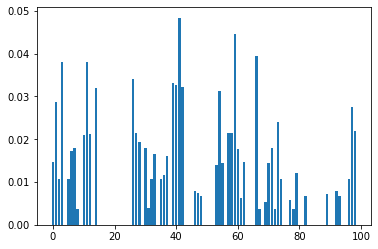

In [279]:
#**** follow the same notation as explained above wherever required*******#


from sklearn import preprocessing
from sklearn.ensemble import RandomForestClassifier
import operator
le = preprocessing.LabelEncoder()
p=df_hard_time_mem_feature_df
le.fit(p['label_mem'])
g=le.transform(p['label_mem']) 
x_train_np=p.drop(['file','label_mem'],axis=1)
y_train_np=np.array(g)


model = RandomForestClassifier(n_estimators = 100, random_state = 2)
model.feature_names = list(x_train_np.columns.values)
model.fit(x_train_np, y_train_np)
ft=list(model.feature_names)
importance = model.feature_importances_
print(model.n_features_)

dict1_imp={}
c=0
for i,v in enumerate(importance):
    val= round(v,5)
    dict1_imp[ft[c]]=val
    c+=1
dict1_imp_sort=dict(sorted(dict1_imp.items(), key=operator.itemgetter(1),reverse=True))

for key,val in dict1_imp_sort.items():
    print(key,val)
plt.bar([x for x in range(len(importance))], importance)
plt.show()


hard_feature_sort_dic=dict1_imp_sort

top_n_3=(list(hard_feature_sort_dic.keys())[:50])

In [280]:
d= dict(x_hard)
hard_zero_features =[]
for key, value in dict1_imp_sort.items():
    if value == 0.0:
        if ( sum(list(d[(key, 'mean')]))/3 )== 0.0 :
            #print(key,list(d[(key, 'mean')]))
            hard_zero_features.append(key)
print(hard_zero_features)
print(top_n_3)

['GCI', 'ESUB', 'DSUB', 'CSUB', 'SUPECHN', 'SUBECHN', 'SUBCCHN', 'SUPDCHN', 'DSUPECHN', 'DSUBECHN', 'DSUBCCHN', 'DSUPDCHN', 'aDIT', 'mDIT', 'tDIT', 'ENUM', 'ENUMP', 'NEG', 'NEGP', 'SELF', 'SELFP', 'ASYM', 'ASYMP', 'REFLE', 'REFLEP', 'IRREF', 'IRREFP', 'DISP']
['mCOD', 'EF', 'MNCARP', 'RCH', 'realisation_time_milsecs', 'ELCLSPRT', 'tCID', 'aCOD', 'tCOD', 'HGCI', 'CONJP', 'consistency_time_milsecs', 'ELPROP', 'DTP', 'CAL_TIME', 'ELAXPRT', 'UF', 'UFP', 'CYC', 'EOG', 'HLC', 'SOV', 'IHR', 'OBP', 'EFP', 'classification_size_kb', 'IND', 'aCID', 'size_kb', 'VALUEP', 'DISJ', 'CARP', 'CONJ', 'TRN', 'tNOC', 'consistency_size_kb', 'classification_time_milsecs', 'ITR', 'mNOC', 'DTPP', 'CHNP', 'aNOP', 'INV', 'mNOP', 'SUBP', 'tNOP', 'IFUNP', 'DOMN', 'VALUE', 'SYM']


(6, 101)
(4, 101)
feature name=  size_kb
max value =  1180 min value =  64
mean=  893.0 standard deviation=  478.7702998307226
left range=  653.6148500846386 right range=  1132.3851499153614
1.73151927 0.599452389
data covered within this range=  0.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.6683304474141654
skewness value=  -1.1525874173763218


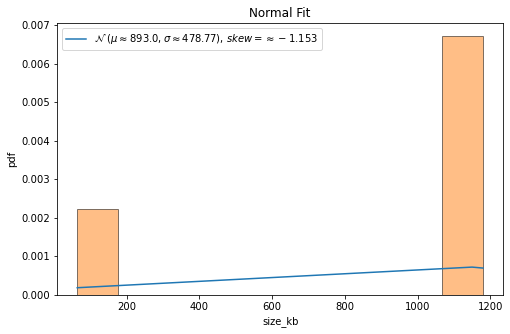


QQ plot 



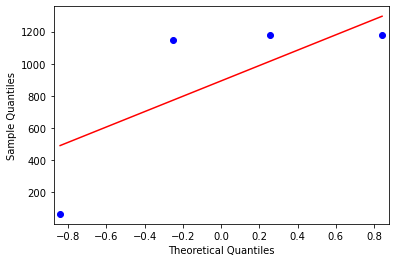

ends normality test ------------------------------------------------

feature name=  consistency_time_milsecs
max value =  21600095 min value =  21600051
mean=  21600074.25 standard deviation=  20.825165065372232
left range=  21600063.83741747 right range=  21600084.66258253
1.116437729 0.996390662
data covered within this range=  0.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.9713331672264518
skewness value=  -0.021538924810291984


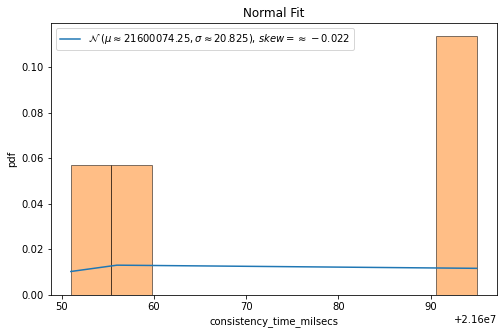


QQ plot 



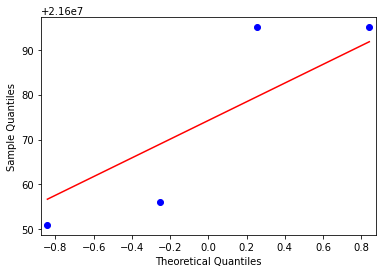

ends normality test ------------------------------------------------

feature name=  consistency_size_kb
max value =  1423224 min value =  1352844
mean=  1393680.0 standard deviation=  26856.22117871388
left range=  1380251.8894106431 right range=  1407108.1105893569
1.520541543 1.100080306
data covered within this range=  25.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.251734899843793
skewness value=  -0.48002690828348277


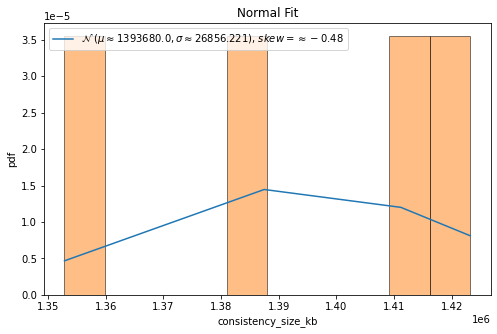


QQ plot 



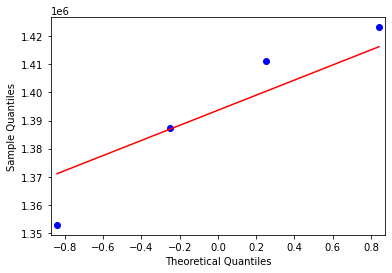

ends normality test ------------------------------------------------

feature name=  realisation_time_milsecs
max value =  21600273 min value =  21600073
mean=  21600144.5 standard deviation=  76.50326790405754
left range=  21600106.248366047 right range=  21600182.751633953
0.934600599 1.679666811
data covered within this range=  50.0 %
percent left and right=  75.0 25.0



normality test :----

kurtosis value=  -0.8038649993255209
skewness value=  0.9470306805167558


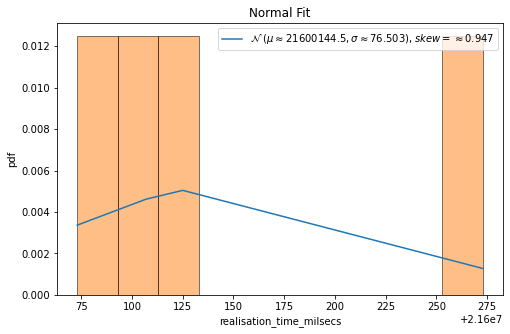


QQ plot 



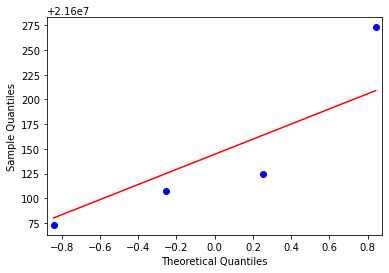

ends normality test ------------------------------------------------

feature name=  classification_time_milsecs
max value =  21600477 min value =  656914
mean=  16364399.75 standard deviation=  9068721.127335938
left range=  11830039.186332032 right range=  20898760.313667968
1.732050807 0.577377689
data covered within this range=  0.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.66666666742015
skewness value=  -1.154700537400433


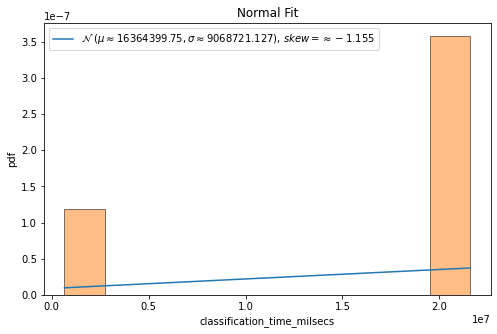


QQ plot 



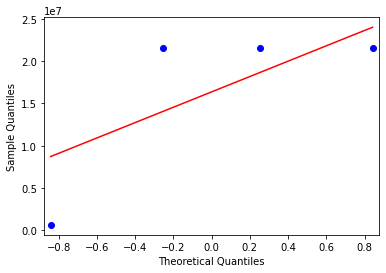

ends normality test ------------------------------------------------

feature name=  classification_size_kb
max value =  18797388 min value =  1097220
mean=  5677541.0 standard deviation=  7575813.893666805
left range=  1889634.0531665976 right range=  9465447.946833402
0.604597877 1.73180693
data covered within this range=  0.0 %
percent left and right=  75.0 25.0



normality test :----

kurtosis value=  -0.6674086834565482
skewness value=  1.1537214338515192


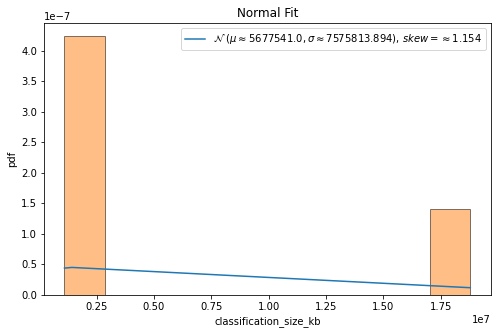


QQ plot 



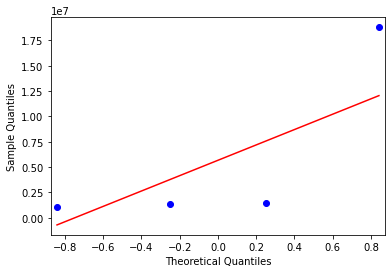

ends normality test ------------------------------------------------

feature name=  SOV
max value =  2801 min value =  209
mean=  2134.5 standard deviation=  1112.0504709769248
left range=  1578.4747645115376 right range=  2690.5252354884624
1.73148616 0.599343301
data covered within this range=  0.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.6684352320330267
skewness value=  -1.1524563740580955


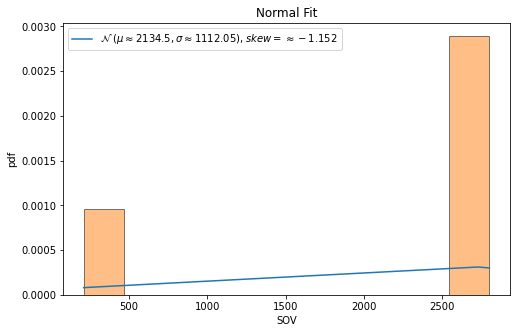


QQ plot 



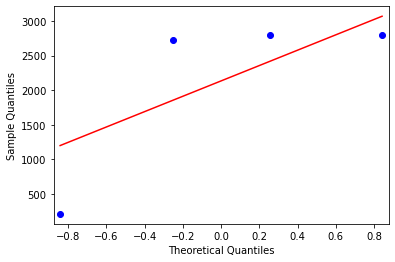

ends normality test ------------------------------------------------

feature name=  EOG
max value =  1.9295206042163933 min value =  1.5978102492560464
mean=  1.8374355420521717 standard deviation=  0.1390218383437916
left range=  1.7679246228802759 right range=  1.9069464612240676
1.723652166 0.662378395
data covered within this range=  25.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.6940080628092162
skewness value=  -1.1220756799299836


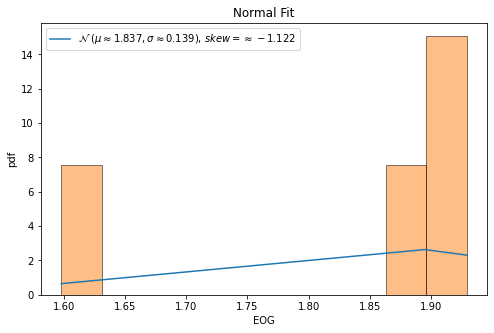


QQ plot 



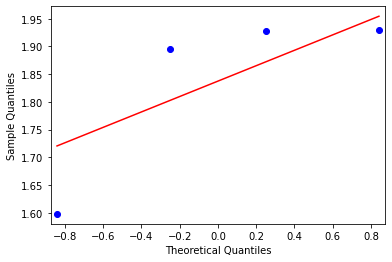

ends normality test ------------------------------------------------

feature name=  RCH
max value =  0.5457142857142857 min value =  0.3965517241379311
mean=  0.44532611252176696 standard deviation=  0.06013536534166794
left range=  0.415258429850933 right range=  0.47539379519260094
0.811076612 1.669369973
data covered within this range=  25.0 %
percent left and right=  75.0 25.0



normality test :----

kurtosis value=  -0.8772550796369241
skewness value=  0.9299445760596025


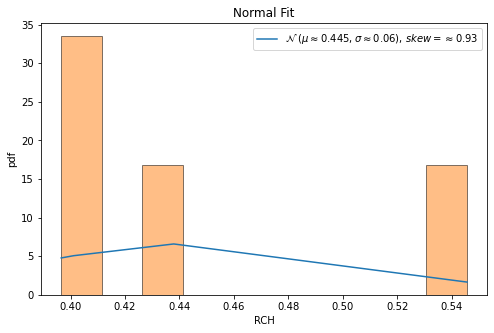


QQ plot 



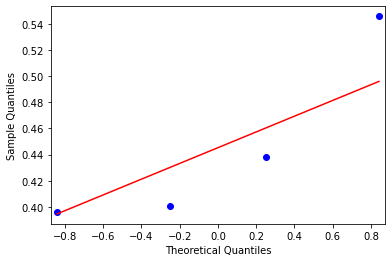

ends normality test ------------------------------------------------

feature name=  CYC
max value =  1178 min value =  315
mean=  953.5 standard deviation=  368.8499017215539
left range=  769.075049139223 right range=  1137.924950860777
1.731056446 0.608648664
data covered within this range=  0.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.6697954729846893
skewness value=  -1.1507566730149705


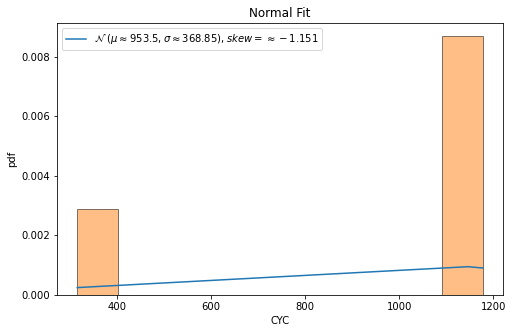


QQ plot 



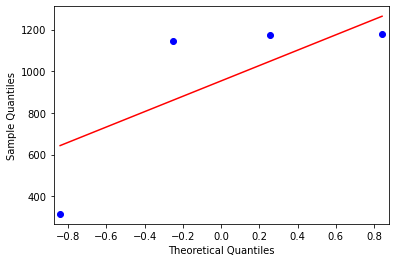

ends normality test ------------------------------------------------

feature name=  HGCI
max value =  41 min value =  0
mean=  30.25 standard deviation=  17.469616481193857
left range=  21.515191759403073 right range=  38.98480824059693
1.731577796 0.615354093
data covered within this range=  0.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.6680982124871702
skewness value=  -1.152798716900481


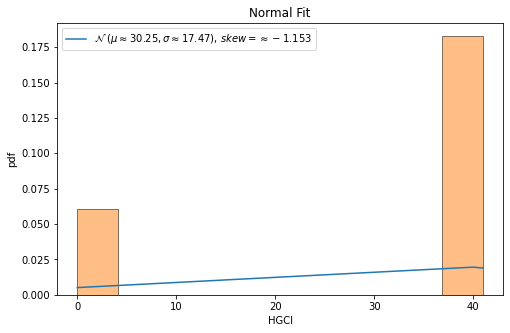


QQ plot 



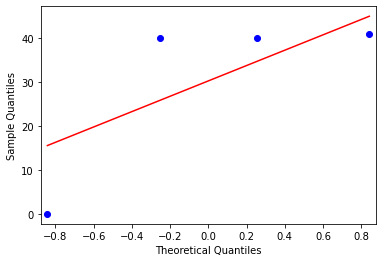

ends normality test ------------------------------------------------

feature name=  ELCLSPRT
max value =  0.75 min value =  0.7163323782234957
mean=  0.7344165855681728 standard deviation=  0.013003895270567601
left range=  0.727914637932889 right range=  0.7409185332034566
1.390676176 1.198365113
data covered within this range=  25.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.4940928679454284
skewness value=  -0.19760815089391903


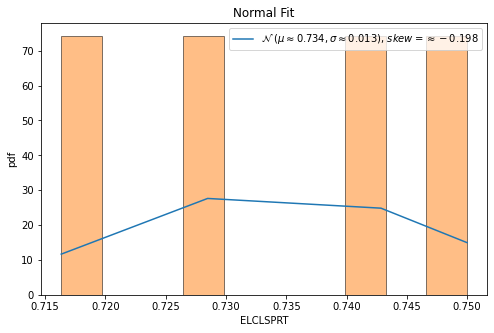


QQ plot 



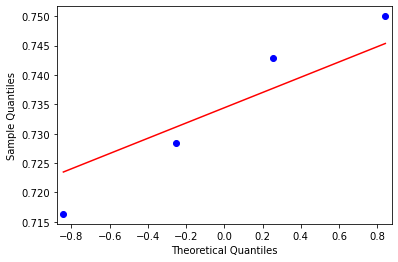

ends normality test ------------------------------------------------

feature name=  ELAXPRT
max value =  0.7214285714285714 min value =  0.53
mean=  0.6650636840757809 standard deviation=  0.0786638938696182
left range=  0.6257317371409717 right range=  0.70439563101059
1.716971757 0.716528061
data covered within this range=  25.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.7156306412381848
skewness value=  -1.096539672170673


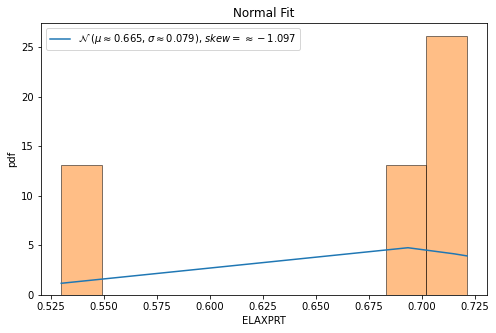


QQ plot 



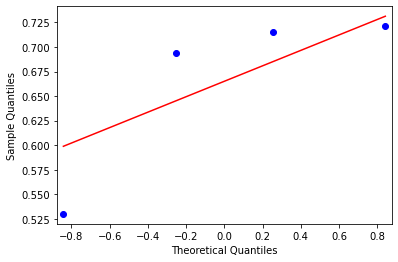

ends normality test ------------------------------------------------

feature name=  HLC
max value =  0 min value =  0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-281-6bdd78a05220>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-281-6bdd78a05220>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


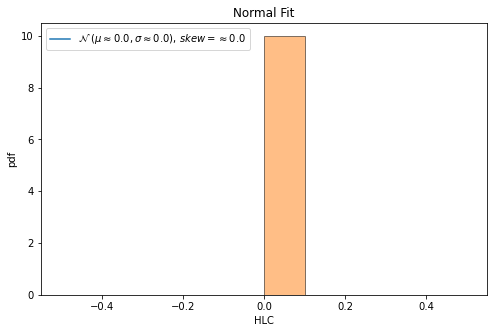


QQ plot 



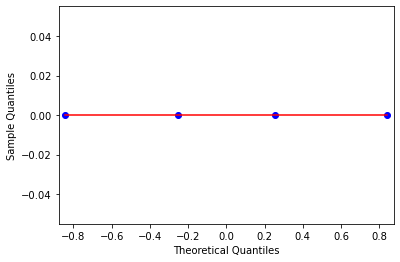

ends normality test ------------------------------------------------

feature name=  IHR
max value =  5 min value =  0
mean=  3.75 standard deviation=  2.165063509461097
left range=  2.6674682452694514 right range=  4.832531754730549
1.732050808 0.577350269
data covered within this range=  0.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.6666666666666665
skewness value=  -1.1547005383792515


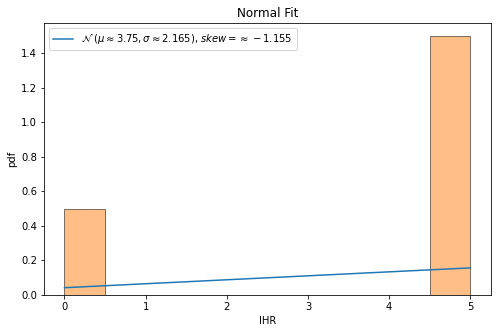


QQ plot 



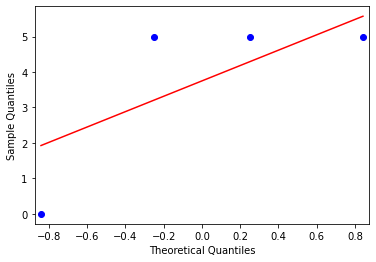

ends normality test ------------------------------------------------

feature name=  ITR
max value =  3 min value =  0
mean=  2.25 standard deviation=  1.299038105676658
left range=  1.600480947161671 right range=  2.899519052838329
1.732050808 0.577350269
data covered within this range=  0.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.6666666666666665
skewness value=  -1.1547005383792515


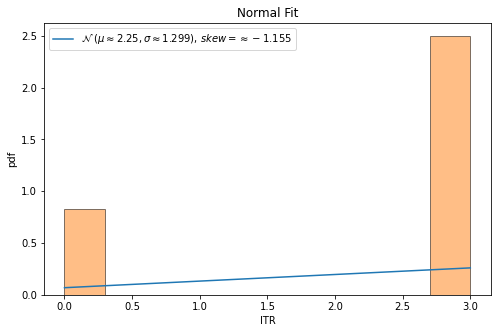


QQ plot 



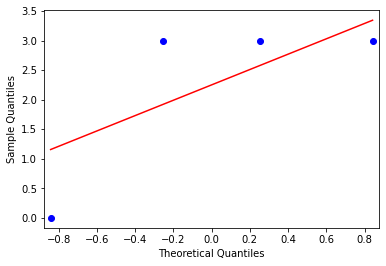

ends normality test ------------------------------------------------

feature name=  IND
max value =  988 min value =  1
mean=  740.5 standard deviation=  426.9511096132671
left range=  527.0244451933664 right range=  953.9755548066336
1.732048432 0.579691666
data covered within this range=  0.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.6666739811120448
skewness value=  -1.1546910366229521


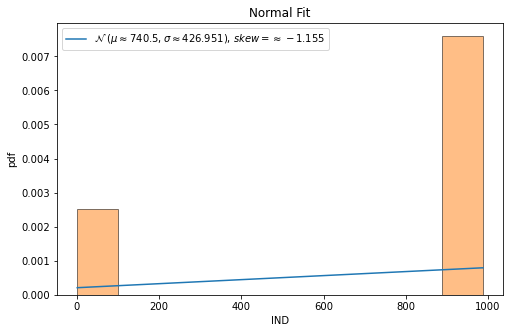


QQ plot 



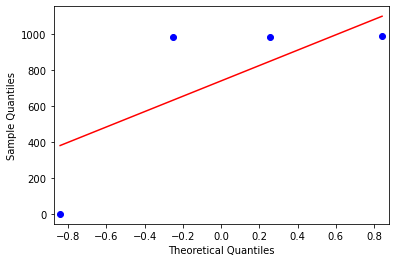

ends normality test ------------------------------------------------

feature name=  mNOC
max value =  8 min value =  0
mean=  6.0 standard deviation=  3.4641016151377544
left range=  4.267949192431123 right range=  7.732050807568877
1.732050808 0.577350269
data covered within this range=  0.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.6666666666666665
skewness value=  -1.1547005383792515


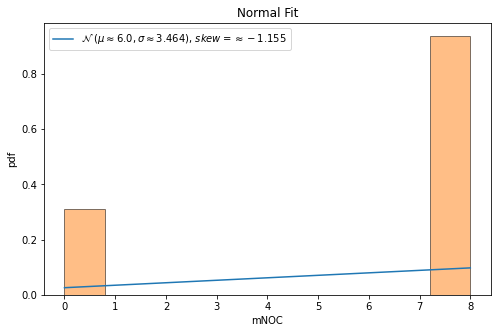


QQ plot 



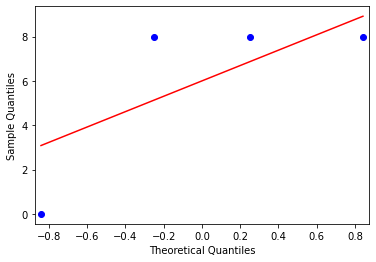

ends normality test ------------------------------------------------

feature name=  tNOC
max value =  96 min value =  0
mean=  67.0 standard deviation=  39.30648801406709
left range=  47.34675599296645 right range=  86.65324400703355
1.704553202 0.737791684
data covered within this range=  25.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.7582467716090111
skewness value=  -1.0512358248522924


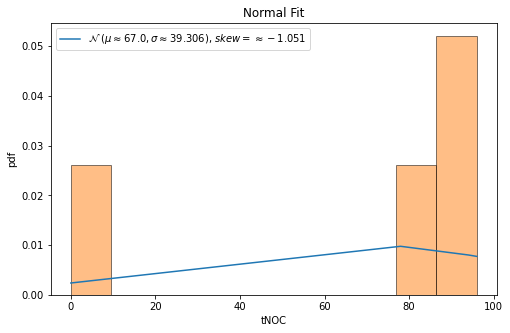


QQ plot 



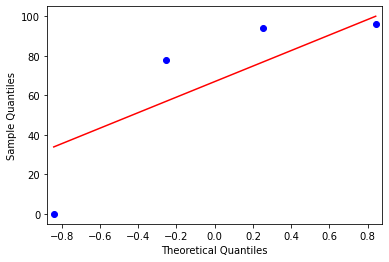

ends normality test ------------------------------------------------

feature name=  aCID
max value =  8.287581699346406 min value =  1.0457142857142858
mean=  6.1497812337481275 standard deviation=  2.9591493436333587
left range=  4.670206561931448 right range=  7.629355905564807
1.724842634 0.722437504
data covered within this range=  25.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.6873469791900444
skewness value=  -1.1254489003472434


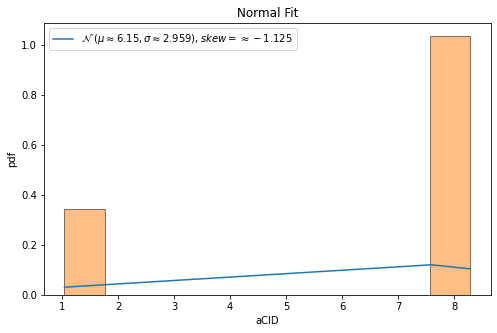


QQ plot 



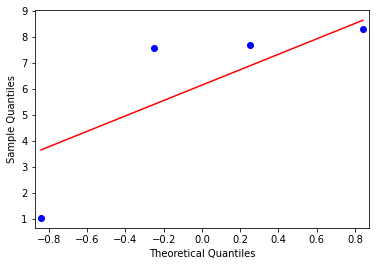

ends normality test ------------------------------------------------

feature name=  tCID
max value =  1342 min value =  366
mean=  1078.25 standard deviation=  412.25621584155647
left range=  872.1218920792218 right range=  1284.3781079207783
1.727687716 0.639772039
data covered within this range=  25.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.680685809481385
skewness value=  -1.1375897216729867


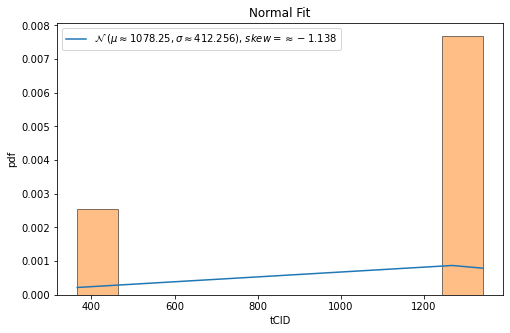


QQ plot 



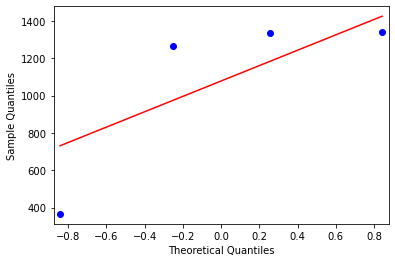

ends normality test ------------------------------------------------

feature name=  aCOD
max value =  1.9942857142857144 min value =  1.7011494252873562
mean=  1.7930013571764183 standard deviation=  0.11867603846588769
left range=  1.7336633379434745 right range=  1.852339376409362
0.773972009 1.696082543
data covered within this range=  25.0 %
percent left and right=  75.0 25.0



normality test :----

kurtosis value=  -0.786015742671677
skewness value=  1.0205887092334067


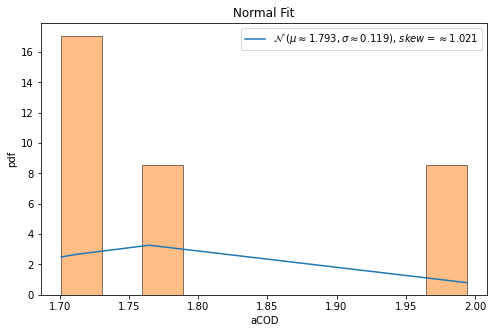


QQ plot 



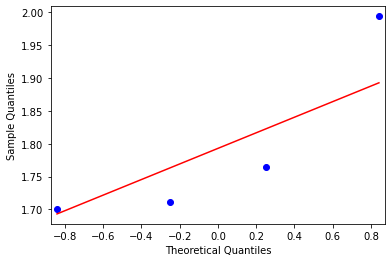

ends normality test ------------------------------------------------

feature name=  mCOD
max value =  4 min value =  3
mean=  3.75 standard deviation=  0.4330127018922193
left range=  3.53349364905389 right range=  3.96650635094611
1.732050808 0.577350269
data covered within this range=  0.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.6666666666666665
skewness value=  -1.1547005383792515


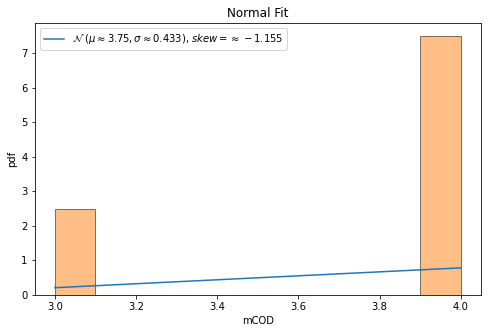


QQ plot 



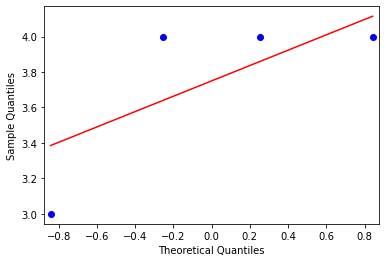

ends normality test ------------------------------------------------

feature name=  tCOD
max value =  698 min value =  270
mean=  391.75 standard deviation=  177.24047929296512
left range=  303.12976035351744 right range=  480.37023964648256
0.686919831 1.727878424
data covered within this range=  0.0 %
percent left and right=  75.0 25.0



normality test :----

kurtosis value=  -0.6789293934325071
skewness value=  1.1378375136036385


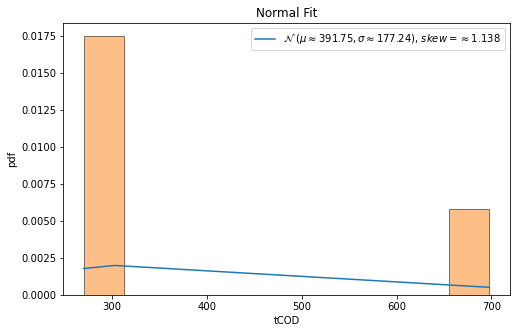


QQ plot 



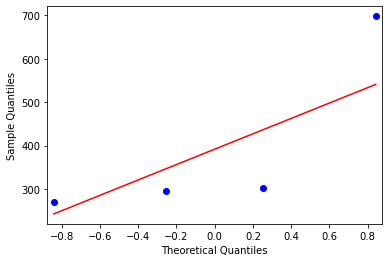

ends normality test ------------------------------------------------

feature name=  aNOP
max value =  1.0508474576271187 min value =  0.9971428571428572
mean=  1.0332957531346847 standard deviation=  0.021277653425294245
left range=  1.0226569264220375 right range=  1.0439345798473318
1.699101648 0.824889105
data covered within this range=  25.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.7675943833639223
skewness value=  -1.0276729778989597


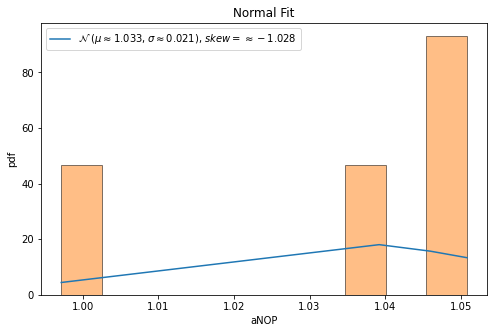


QQ plot 



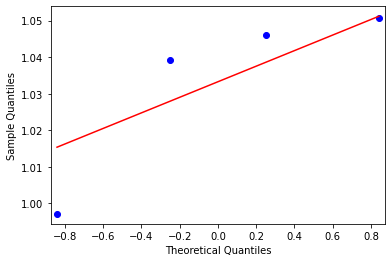

ends normality test ------------------------------------------------

feature name=  mNOP
max value =  3 min value =  1
mean=  2.5 standard deviation=  0.8660254037844386
left range=  2.066987298107781 right range=  2.933012701892219
1.732050808 0.577350269
data covered within this range=  0.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.6666666666666665
skewness value=  -1.1547005383792515


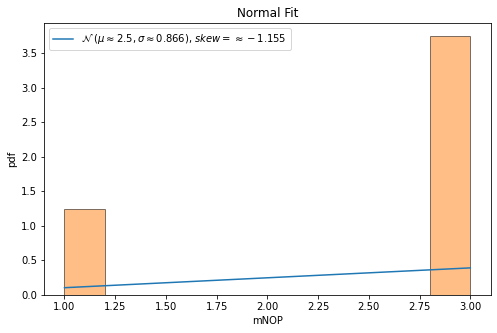


QQ plot 



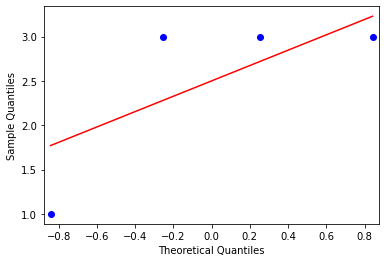

ends normality test ------------------------------------------------

feature name=  tNOP
max value =  349 min value =  159
mean=  219.0 standard deviation=  75.75948785465752
left range=  181.12025607267122 right range=  256.8797439273288
0.791980011 1.71595669
data covered within this range=  50.0 %
percent left and right=  75.0 25.0



normality test :----

kurtosis value=  -0.7108906440704117
skewness value=  1.0891881203547222


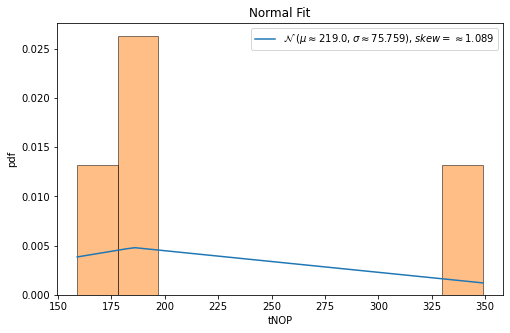


QQ plot 



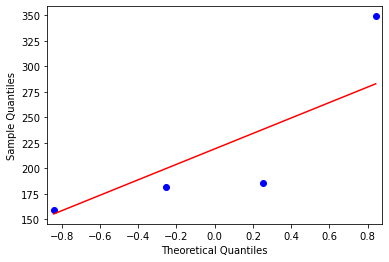

ends normality test ------------------------------------------------

feature name=  CONJ
max value =  52 min value =  15
mean=  24.25 standard deviation=  16.021469970012117
left range=  16.23926501499394 right range=  32.26073498500606
0.577350269 1.732050808
data covered within this range=  0.0 %
percent left and right=  75.0 25.0



normality test :----

kurtosis value=  -0.6666666666666665
skewness value=  1.1547005383792515


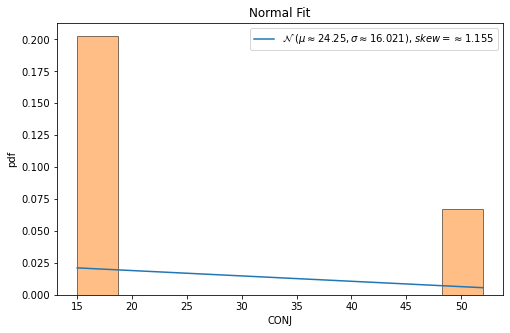


QQ plot 



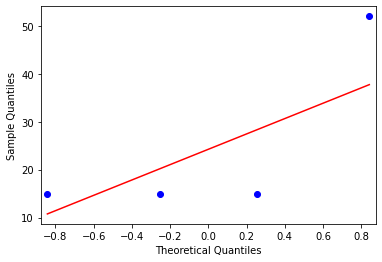

ends normality test ------------------------------------------------

feature name=  CONJP
max value =  0.2723 min value =  0.2113
mean=  0.231225 standard deviation=  0.02412958505652345
left range=  0.21916020747173828 right range=  0.24328979252826174
0.825749799 1.702267151
data covered within this range=  25.0 %
percent left and right=  75.0 25.0



normality test :----

kurtosis value=  -0.7555166675630005
skewness value=  1.0383944492790265


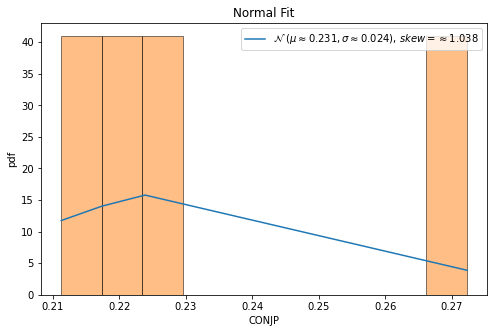


QQ plot 



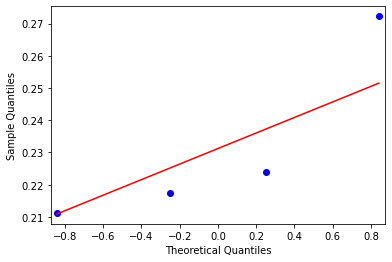

ends normality test ------------------------------------------------

feature name=  DISJ
max value =  8 min value =  0
mean=  5.75 standard deviation=  3.344772040064913
left range=  4.077613979967543 right range=  7.422386020032457
1.719100713 0.672691583
data covered within this range=  25.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.7092787366187072
skewness value=  -1.104867740459007


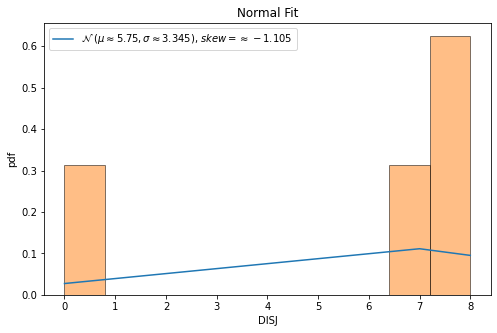


QQ plot 



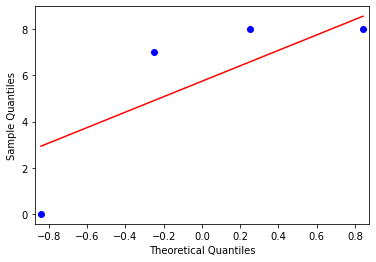

ends normality test ------------------------------------------------

feature name=  UF
max value =  8 min value =  5
mean=  7.25 standard deviation=  1.299038105676658
left range=  6.600480947161671 right range=  7.899519052838329
1.732050808 0.577350269
data covered within this range=  0.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.6666666666666665
skewness value=  -1.1547005383792515


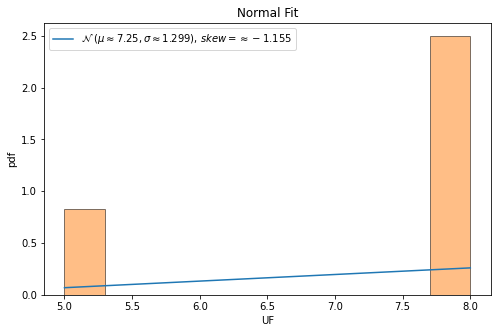


QQ plot 



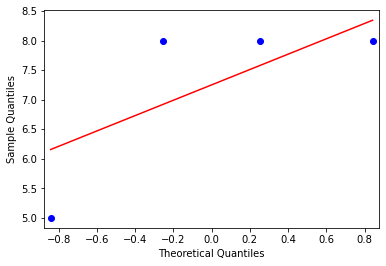

ends normality test ------------------------------------------------

feature name=  UFP
max value =  0.1194 min value =  0.0262
mean=  0.09355000000000001 standard deviation=  0.03895667465274725
left range=  0.07407166267362639 right range=  0.11302833732637363
1.72884366 0.663557663
data covered within this range=  25.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.6764682254231706
skewness value=  -1.1418873901344468


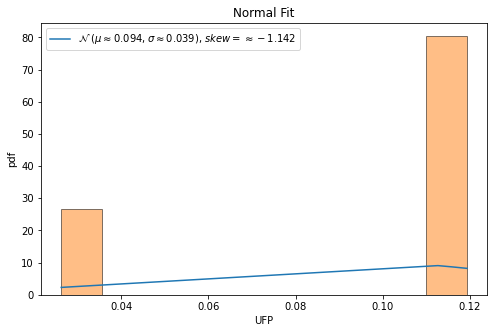


QQ plot 



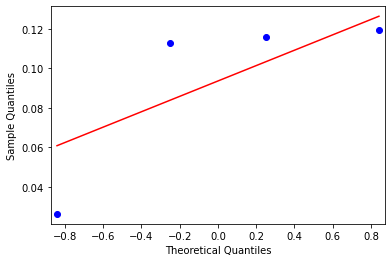

ends normality test ------------------------------------------------

feature name=  EF
max value =  40 min value =  11
mean=  18.25 standard deviation=  12.55736835487436
left range=  11.97131582256282 right range=  24.528684177437178
0.577350269 1.732050808
data covered within this range=  0.0 %
percent left and right=  75.0 25.0



normality test :----

kurtosis value=  -0.6666666666666665
skewness value=  1.1547005383792515


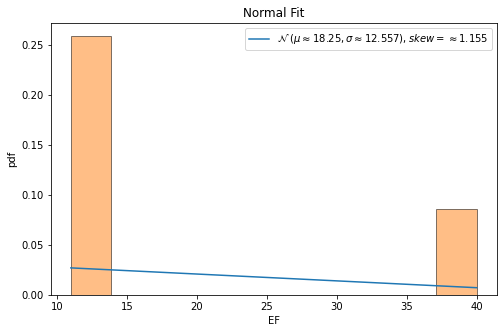


QQ plot 



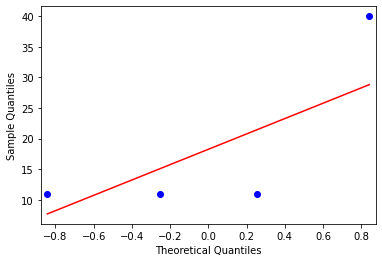

ends normality test ------------------------------------------------

feature name=  EFP
max value =  0.2094 min value =  0.1549
mean=  0.17197500000000002 standard deviation=  0.021856163318386877
left range=  0.1610469183408066 right range=  0.18290308165919344
0.781244162 1.712331641
data covered within this range=  25.0 %
percent left and right=  75.0 25.0



normality test :----

kurtosis value=  -0.726198890394647
skewness value=  1.077097420936568


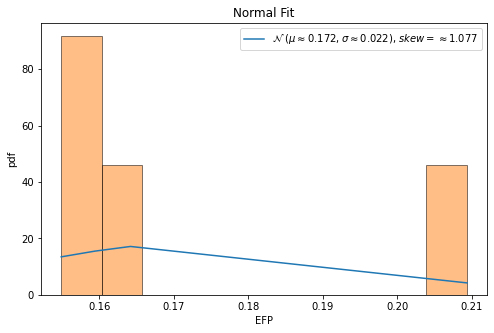


QQ plot 



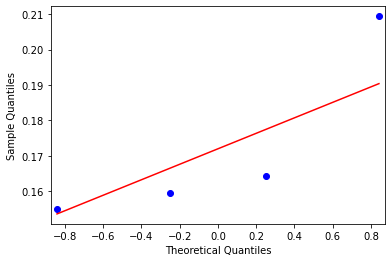

ends normality test ------------------------------------------------

feature name=  VALUE
max value =  24 min value =  0
mean=  16.75 standard deviation=  9.730750228014282
left range=  11.88462488599286 right range=  21.61537511400714
1.721347235 0.745060744
data covered within this range=  25.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.6977851844590401
skewness value=  -1.1116133319327495


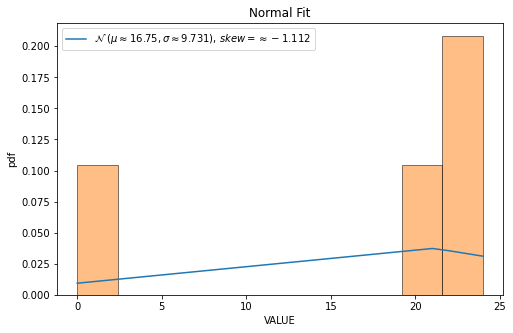


QQ plot 



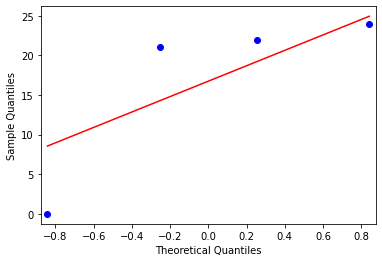

ends normality test ------------------------------------------------

feature name=  VALUEP
max value =  0.338 min value =  0.0
mean=  0.24255000000000002 standard deviation=  0.1403344130995673
left range=  0.17238279345021637 right range=  0.31271720654978363
1.728371499 0.680161037
data covered within this range=  0.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.6775219317987475
skewness value=  -1.1398401022849078


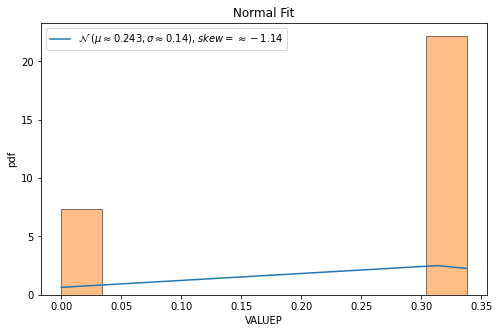


QQ plot 



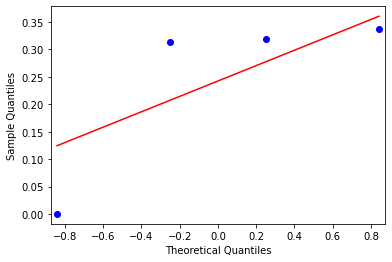

ends normality test ------------------------------------------------

feature name=  MNCARP
max value =  0.2461 min value =  0.0
mean=  0.061525 standard deviation=  0.1065644259356752
left range=  0.008242787032162406 right range=  0.11480721296783761
0.577350269 1.732050808
data covered within this range=  0.0 %
percent left and right=  75.0 25.0



normality test :----

kurtosis value=  -0.666666666666667
skewness value=  1.1547005383792515


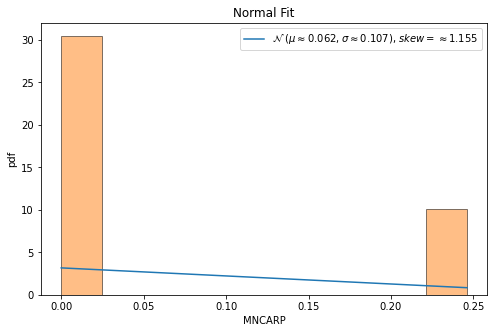


QQ plot 



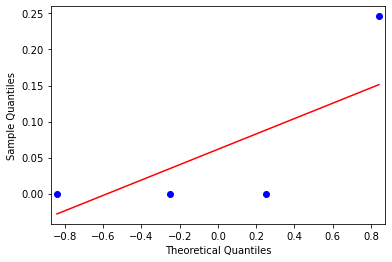

ends normality test ------------------------------------------------

feature name=  CARP
max value =  0.2042 min value =  0.0563
mean=  0.09455 standard deviation=  0.06331786872597654
left range=  0.06289106563701172 right range=  0.12620893436298827
0.604094875 1.731738642
data covered within this range=  0.0 %
percent left and right=  75.0 25.0



normality test :----

kurtosis value=  -0.6676274976900203
skewness value=  1.153452157275835


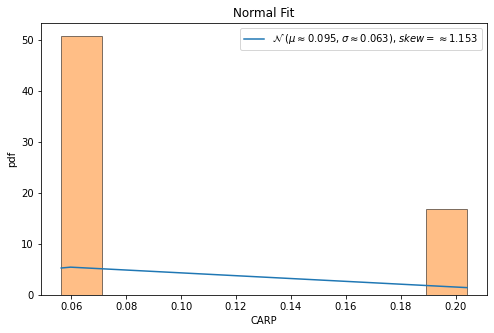


QQ plot 



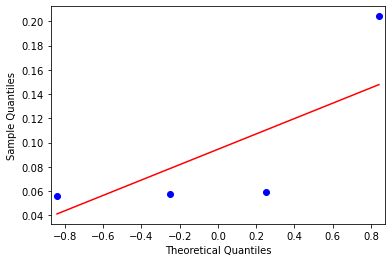

ends normality test ------------------------------------------------

feature name=  OBP
max value =  65 min value =  26
mean=  50.75 standard deviation=  16.068213964221414
left range=  42.71589301788929 right range=  58.78410698211071
1.540308092 0.886844053
data covered within this range=  25.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.2827260170589658
skewness value=  -0.5680439033682253


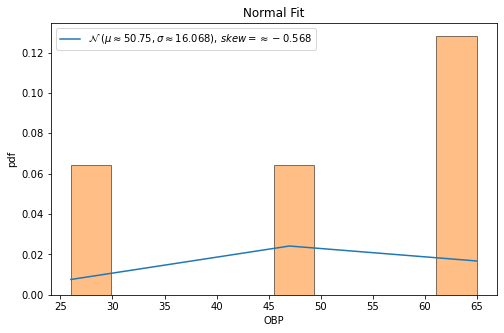


QQ plot 



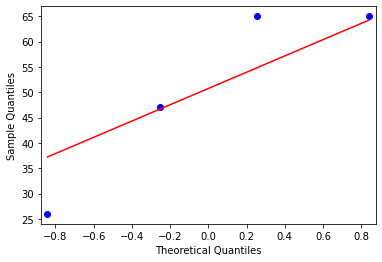

ends normality test ------------------------------------------------

feature name=  DTP
max value =  78 min value =  22
mean=  56.75 standard deviation=  23.29565410114084
left range=  45.10217294942958 right range=  68.39782705057041
1.491694539 0.912187308
data covered within this range=  25.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.4129283905618089
skewness value=  -0.4595079217667038


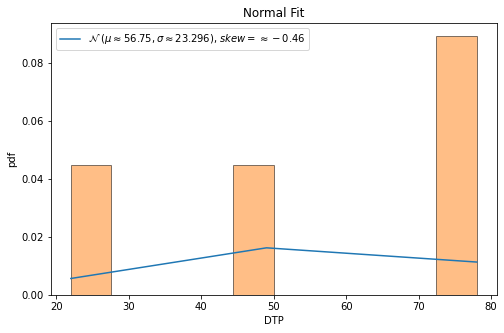


QQ plot 



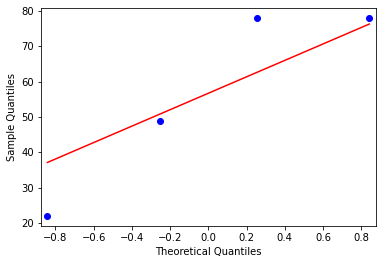

ends normality test ------------------------------------------------

feature name=  DTPP
max value =  0.5455 min value =  0.4583
mean=  0.5149250000000001 standard deviation=  0.03569498389129767
left range=  0.49707750805435125 right range=  0.5327724919456489
1.586357348 0.85656293
data covered within this range=  25.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.1475471987938033
skewness value=  -0.6843079872666723


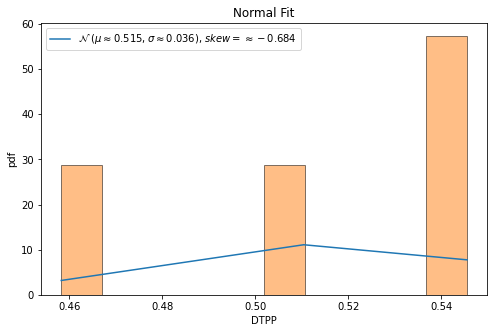


QQ plot 



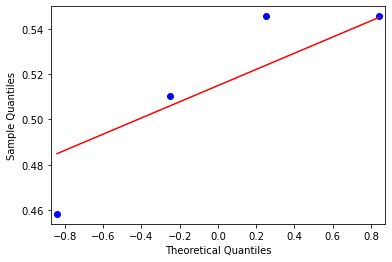

ends normality test ------------------------------------------------

feature name=  SYM
max value =  1 min value =  0
mean=  0.75 standard deviation=  0.4330127018922193
left range=  0.5334936490538904 right range=  0.9665063509461096
1.732050808 0.577350269
data covered within this range=  0.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.6666666666666665
skewness value=  -1.1547005383792515


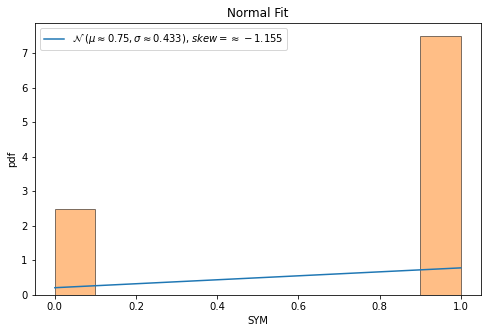


QQ plot 



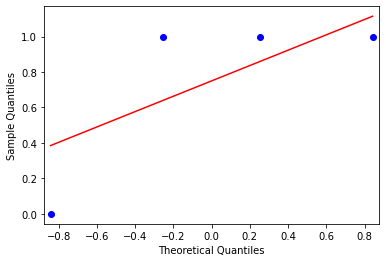

ends normality test ------------------------------------------------

feature name=  TRN
max value =  3 min value =  0
mean=  2.0 standard deviation=  1.224744871391589
left range=  1.3876275643042055 right range=  2.6123724356957947
1.632993162 0.816496581
data covered within this range=  25.0 %
percent left and right=  50.0 75.0



normality test :----

kurtosis value=  -1.0
skewness value=  -0.816496580927726


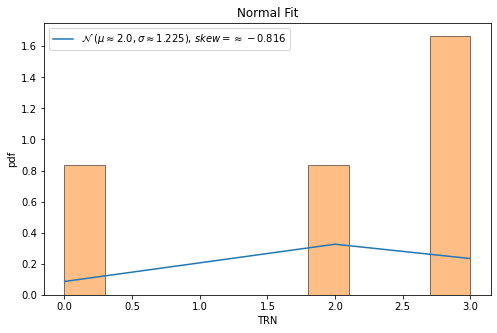


QQ plot 



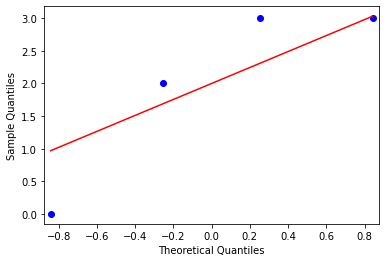

ends normality test ------------------------------------------------

feature name=  IFUNP
max value =  0.0104 min value =  0.0
mean=  0.0060999999999999995 standard deviation=  0.0037854986461495397
left range=  0.0042072506769252295 right range=  0.007992749323074769
1.611412543 1.13591376
data covered within this range=  50.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.8965356035508347
skewness value=  -0.6729319834634748


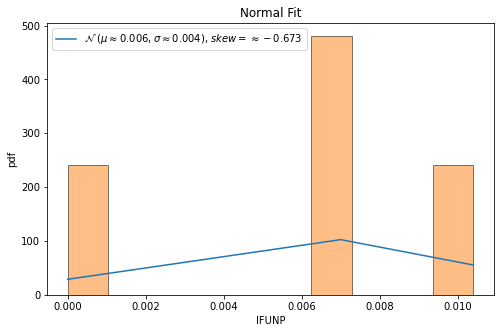


QQ plot 



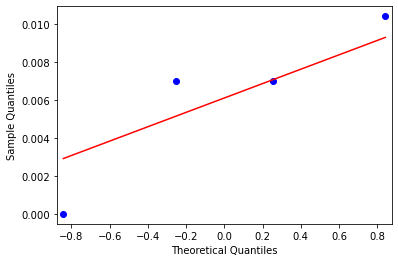

ends normality test ------------------------------------------------

feature name=  SUBP
max value =  8 min value =  0
mean=  4.75 standard deviation=  3.418698582794336
left range=  3.040650708602832 right range=  6.459349291397168
1.389417606 0.950654151
data covered within this range=  0.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.6427693099602505
skewness value=  -0.2745204501268694


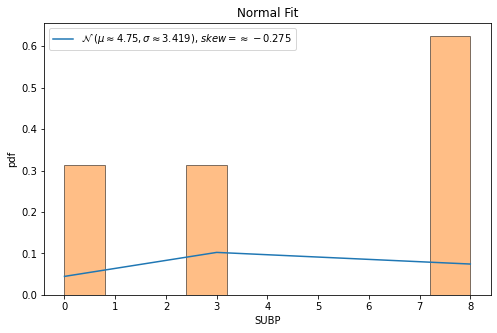


QQ plot 



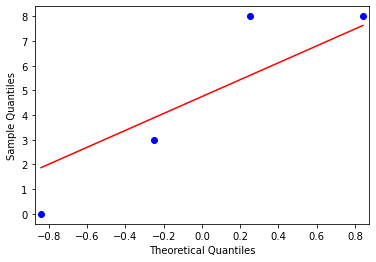

ends normality test ------------------------------------------------

feature name=  INV
max value =  5 min value =  0
mean=  3.0 standard deviation=  2.1213203435596424
left range=  1.9393398282201788 right range=  4.060660171779821
1.414213562 0.942809042
data covered within this range=  25.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.5925925925925926
skewness value=  -0.31426968052735443


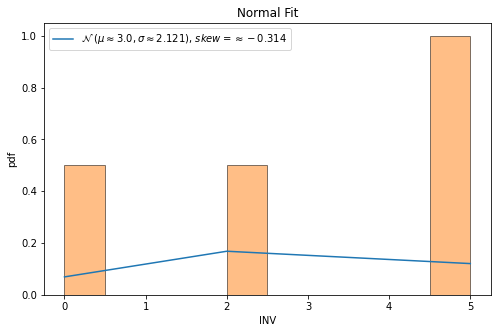


QQ plot 



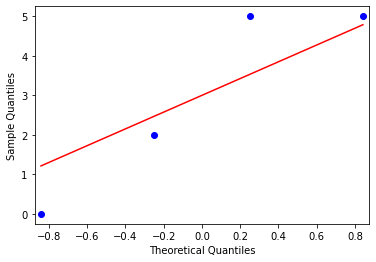

ends normality test ------------------------------------------------

feature name=  DOMN
max value =  112 min value =  0
mean=  74.25 standard deviation=  45.72950360544055
left range=  51.38524819727972 right range=  97.11475180272028
1.623678242 0.825506446
data covered within this range=  25.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.0302450588860022
skewness value=  -0.7888682598204652


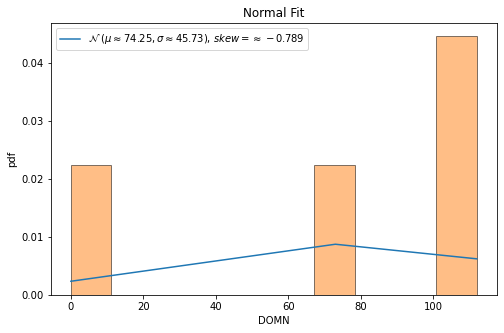


QQ plot 



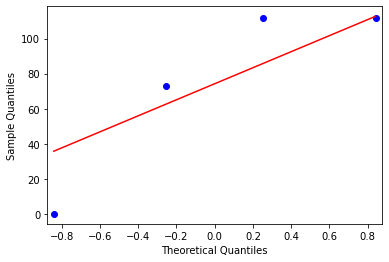

ends normality test ------------------------------------------------

feature name=  CHNP
max value =  0.02083333333333333 min value =  0.0
mean=  0.012201340326340324 standard deviation=  0.007578821299763914
left range=  0.008411929676458367 right range=  0.01599075097622228
1.60992585 1.138962467
data covered within this range=  50.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.8983213947135358
skewness value=  -0.6672715458520175


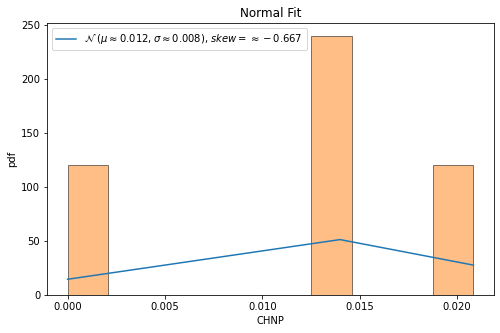


QQ plot 



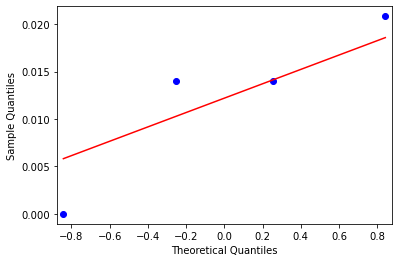

ends normality test ------------------------------------------------

feature name=  ELPROP
max value =  0.9763313609467456 min value =  0.0
mean=  0.7276975206767636 standard deviation=  0.4201621414790954
left range=  0.5176164499372159 right range=  0.9377785914163114
1.731944525 0.591756886
data covered within this range=  0.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.6669948081505597
skewness value=  -1.1542758412861907


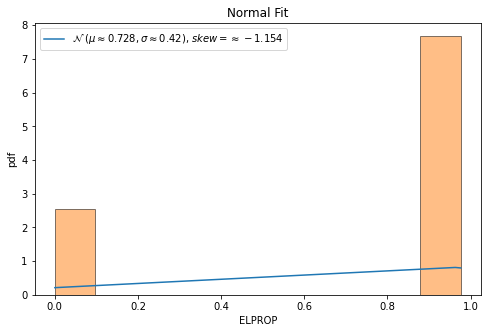


QQ plot 



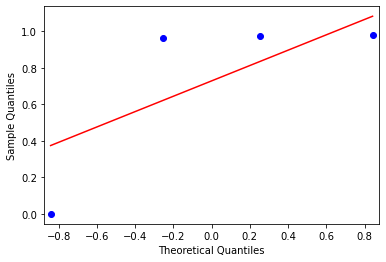

ends normality test ------------------------------------------------

feature name=  CAL_TIME
max value =  340 min value =  80
mean=  207.5 standard deviation=  93.64160400164022
left range=  160.6791979991799 right range=  254.3208020008201
1.361574285 1.414969355
data covered within this range=  50.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.1359458323956049
skewness value=  0.0743268508181799


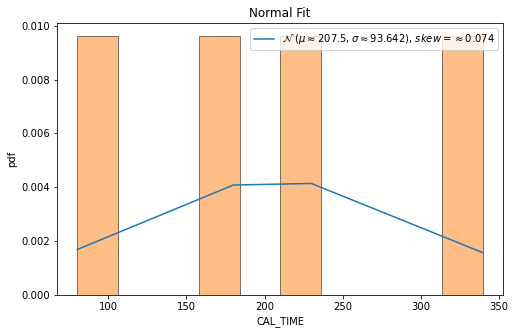


QQ plot 



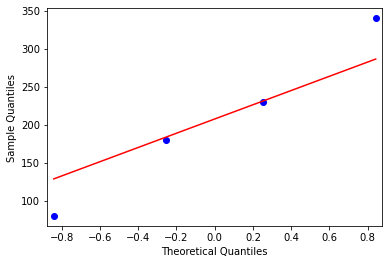

ends normality test ------------------------------------------------



In [281]:
#**** follow the same notation as explained above in 'easy time easy memory' category wherever required*******#

#after hard time and memory clusering ,
#collect the easy ones

from matplotlib import pyplot as plt
%matplotlib inline
#%matplotlib qt 
import scipy
from scipy.stats import norm
from statsmodels.graphics.gofplots import qqplot
import statistics
from scipy.stats import shapiro
from scipy.stats import normaltest
import math
#interquratile range 
def cal(sov_sort):
    p=0
    l=len(sov_sort)
    left=0
    right=0
    while  p < 90 :
        if p==0:
            if l % 2 ==0:
                left=( l /2)
                right=( l / 2) + 1
                p= round((((right -left +1) / l) * 100),2)
                
            else:
                left=math.floor( l /2)
                right=math.ceil(l/2) + 1
                p= round((((right -left +1) / l) * 100),2)
                
        else:
            if left % 2 !=0:
                left = math.ceil(left/2)
            else:
                left = left /2
            
            dist = l - right +1
            if dist % 2 !=0:
                right = right + math.ceil(dist/2)
            else:
                right = right + (dist /2)
                
            p= round((((right -left +1) / l) * 100),2)
             
        
    return left-1,right-1





print(df_hard_time_mem_feature_df.shape)
hard_time_mem_easy = df_hard_time_mem_feature_df[df_hard_time_mem_feature_df['label_mem']== 'easy']
print(hard_time_mem_easy.shape)
prior_easy= round(hard_time_mem_easy.shape[0] / df_hard_time_mem_feature_df.shape[0] ,5)

main_dict_htme={}
main_dict_htme_iqr={}

for i in range(len(cols_list)):
    if cols_list[i] in top_n_3:
        tmp_dict={}
        tmp_dict_iqr={}
        
        feature = cols_list[i]
        print("feature name= ",feature)
        
        sov=np.array(hard_time_mem_easy[feature])
        sov_1=(np.sort(sov))
        skew=scipy.stats.skew(sov)
        
        tmp_dict["skew"]=round(skew,4)
        tmp_dict_iqr["skew"]=round(skew,4)
        
        if -2 < skew and skew < 2:
        
            print("max value = ",np.max(sov),"min value = ",np.min(sov))
            tmp_dict["min"]=round(np.min(sov),9)
            tmp_dict["max"]=round(np.max(sov),9)
            min_val=np.min(sov)
            max_val=np.max(sov)

            mean = np.mean(sov)
            std = np.std(sov)
            print("mean= ",mean,"standard deviation= ",std)
            tmp_dict["mean"]=round(mean,9)
            tmp_dict["std"]=round(std,9)
            #gamma=2
            #rx= mean - ((1- prior_easy) *gamma * std) 
            #ry= mean + ((1- prior_easy) *gamma * std)
            l_weight=0.5
            r_weight=0.5
            rx= mean - (l_weight* std) 
            ry= mean + (r_weight* std)
            print("left range= ",rx,"right range= ", ry)
            tmp_dict["lw_i"]=round(l_weight,9)
            tmp_dict["rw_i"]=round(r_weight,9)
            tmp_dict["lr"]=round(rx,9)
            tmp_dict["rr"]=round(ry,9)

            min_val_w= round(((mean - min_val) /std ),9)
            max_val_w= round(((max_val - mean) /std ),9)
            print(min_val_w,max_val_w)
            if math.isnan(min_val_w):
                    tmp_dict["min_val_w"]="null"
            else:
                    tmp_dict["min_val_w"]=round(min_val_w,9)
            
            if math.isnan(max_val_w):
                    tmp_dict["max_val_w"]="null"
            else:
                tmp_dict["max_val_w"]=round(max_val_w,9)


            val=(((rx <= sov) & (sov <= ry)).sum()) / hard_time_mem_easy.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within this range= ",v,"%")

            tmp_dict["percent_i"]=round(v,9)
            tmp_dict["percent_change"]=round(v,9)

            val=(((min_val <= sov) & (sov <= mean)).sum()) / hard_time_mem_easy.shape[0]
            percent_l =  round((val * 100 ),2)

            val=(((mean <= sov) & (sov <= max_val)).sum()) / hard_time_mem_easy.shape[0]
            percent_r =  round((val * 100 ),2)

            print("percent left and right= ",percent_l,percent_r)
            tmp_dict["percent_l"]=percent_l
            tmp_dict["percent_r"]=percent_r
            
            main_dict_htme[feature]=tmp_dict
            
        else:
            
            left_index,right_index = cal(sov_1)
            rx=sov_1[int(left_index)]
            ry=sov_1[int(right_index)]

            print("max value = ",np.max(sov),"min value = ",np.min(sov))
            
            tmp_dict_iqr["min"]=round(np.min(sov),9)
            tmp_dict_iqr["max"]=round(np.max(sov),9)
            min_val=np.min(sov)
            max_val=np.max(sov)
            
            
            mean = np.mean(sov)
            std = np.std(sov)
            print("mean= ",mean,"standard deviation= ",std)
            tmp_dict_iqr["mean"]=round(mean,9)
            tmp_dict_iqr["std"]=round(std,9)
            
            print("left range= ",rx,"right range= ", ry)
            tmp_dict_iqr["lw_i"]="null"
            tmp_dict_iqr["rw_i"]="null"
            tmp_dict_iqr["lr"]=round(rx,9)
            tmp_dict_iqr["rr"]=round(ry,9)
            
            
            tmp_dict_iqr["min_val_w"]="null"
            tmp_dict_iqr["max_val_w"]="null"
            tmp_dict_iqr["percent_i"]="null"
            val=(((rx <= sov) & (sov <= ry)).sum()) / hard_time_mem_easy.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within this range= ",v,"%")
            tmp_dict_iqr["percent_change"]=round(v,9)
            
            val=(((min_val <= sov) & (sov <= mean)).sum()) / hard_time_mem_easy.shape[0]
            percent_l =  round((val * 100 ),2)

            val=(((mean <= sov) & (sov <= max_val)).sum()) / hard_time_mem_easy.shape[0]
            percent_r =  round((val * 100 ),2)

            print("percent left and right= ",percent_l,percent_r)
            
            tmp_dict_iqr["percent_l"]=percent_l
            tmp_dict_iqr["percent_r"]=percent_r
            
            main_dict_htme_iqr[feature]=tmp_dict_iqr

            
            # 68–95–99.7 rule, also known as the empirical rule

            # for 1*std
            left = mean - std
            right = mean + std
            val=(((left <= sov) & (sov <= right)).sum()) / hard_time_mem_easy.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 1 standard deviation= ",v,"%")
            
            # for 2*std
            left = mean - (2*std)
            right = mean + (2*std)
            val=(((left <= sov) & (sov <= right)).sum()) / hard_time_mem_easy.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 2 standard deviation= ",v,"%")
            


            # for 3*std
            left = mean - (3*std)
            right = mean + (3*std)
            val=(((left <= sov) & (sov <= right)).sum()) / hard_time_mem_easy.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 3 standard deviation= ",v,"%")
            
        print("\n\n")
        
        #normality test
        print("normality test :----\n")
        # kurtosis and skew function
        kurt=scipy.stats.kurtosis(sov)
        print("kurtosis value= ",kurt)
        
        
        print("skewness value= ",skew)
        
        
        
        #plotting graph for to see the skewess
        sov_1=np.sort(sov)
        fig, ax1 = plt.subplots(1, 1, figsize=(8,5))
        ax1.plot(sov_1, norm.pdf(sov_1, mean, std),label='$\mathcal{N}$ '+ f'$( \mu \\approx {round(mean,3)} , \sigma \\approx {round(std,3)})$, $ skew = \\approx {round(skew,3)}$')
        ax1.hist(sov_1,edgecolor='black',alpha=0.5,density= True)
        ax1.set_title("Normal Fit")
        ax1.set_xlabel(feature)
        ax1.set_ylabel("pdf")
        ax1.legend()
        #plt.savefig('/home/ritam/ontology_hardness/normal_curve_&_skewness/hard_time_easy_memory/'+str(feature)+'.jpeg')
        plt.show()
        
        # Quantile-Quantile Plot Nomrality check
        print("\nQQ plot \n")
        qqplot(sov_1, line='s')
        plt.show()
        ''''
        #Statistical Normality Tests
        # Shapiro-Wilk Test
        print("\n Shapiro-Wilk Test \n ")
        #stat, p = shapiro(sov_1[0:4998])
        stat, p = normaltest(sov_1)
        print('Statistics=%.3f, p=%f' % (stat, p))
        
        alpha = 0.05
        if p > alpha:
            print('Sample looks Gaussian (fail to reject H0)')
        else:
            print('Sample does not look Gaussian (reject H0)')
        '''   
        print("ends normality test ------------------------------------------------\n")
        
        

In [282]:
#**** follow the same notation as explained above in 'easy time easy memory' category wherever required*******#


import copy

main_dict_cal_htme={}
dec_rate=[(0.9,0.9)]
for i in range(len(dec_rate)):
 
    main_dict_cal_htme=copy.deepcopy(main_dict_htme)
    lower_r=dec_rate[i][0]
    high_r=dec_rate[i][1]
    for j in range (100):
        c=0
        for key,value in main_dict_cal_htme.items():
            
            if value["percent_change"] < 90:
                
                lw_i_temp=value["lw_i"]
                rw_i_temp=value["rw_i"]
                if value["percent_l"] >= 50:
                    diff=value["min_val_w"] - lw_i_temp
                    frac = round(lower_r * diff, 9)  
                    
                    lw_i_temp= round(lw_i_temp + frac , 9)
                    main_dict_cal_htme[key]["lw_i"]=lw_i_temp
                else:
                    diff=value["min_val_w"] - lw_i_temp
                    frac = round(high_r * diff, 9)  
                    
                    lw_i_temp= round(lw_i_temp + frac ,9 )
                    main_dict_cal_htme[key]["lw_i"]=lw_i_temp

                if value["percent_r"] >= 50:
                    diff=value["max_val_w"] - rw_i_temp
                    frac = round(lower_r * diff, 9)  
                    
                    rw_i_temp= round(rw_i_temp + frac , 9 )
                    main_dict_cal_htme[key]["rw_i"]=rw_i_temp
                else:
                    diff=value["max_val_w"] - rw_i_temp
                    frac = round(high_r * diff, 9)  
                    
                    rw_i_temp= round(rw_i_temp + frac ,9 )
                    main_dict_cal_htme[key]["rw_i"]=rw_i_temp

                sov=np.array(hard_time_mem_easy[key])
                rx= round(value["mean"] - (lw_i_temp* value["std"]) ,9)
                ry= round(value["mean"] + (rw_i_temp* value["std"]),9)
                main_dict_cal_htme[key]["lr"]=round(rx,9)
                main_dict_cal_htme[key]["rr"]=round(ry,9)
                
                val=(((rx <= sov) & (sov <= ry)).sum()) / hard_time_mem_easy.shape[0]
                v =  round((val * 100 ),2)
                main_dict_cal_htme[key]["percent_change"]=v

                if v >=85:
                    c=c+1
                #break
            else:
                c=c+1
        p=round(c / len(list(main_dict_cal_htme.keys())),2)
        print ("percent in loop ",j , "covers ", p , "%" )
        

percent in loop  0 covers  0.02 %
percent in loop  1 covers  0.02 %
percent in loop  2 covers  0.02 %
percent in loop  3 covers  0.02 %
percent in loop  4 covers  0.02 %
percent in loop  5 covers  0.02 %
percent in loop  6 covers  0.04 %
percent in loop  7 covers  0.12 %
percent in loop  8 covers  0.26 %
percent in loop  9 covers  0.46 %
percent in loop  10 covers  0.46 %
percent in loop  11 covers  0.46 %
percent in loop  12 covers  0.46 %
percent in loop  13 covers  0.46 %
percent in loop  14 covers  0.46 %
percent in loop  15 covers  0.46 %
percent in loop  16 covers  0.46 %
percent in loop  17 covers  0.46 %
percent in loop  18 covers  0.46 %
percent in loop  19 covers  0.46 %
percent in loop  20 covers  0.46 %
percent in loop  21 covers  0.46 %
percent in loop  22 covers  0.46 %
percent in loop  23 covers  0.46 %
percent in loop  24 covers  0.46 %
percent in loop  25 covers  0.46 %
percent in loop  26 covers  0.46 %
percent in loop  27 covers  0.46 %
percent in loop  28 covers  0.

In [283]:
#**** follow the same notation as explained above in 'easy time easy memory' category wherever required*******#

main_dict_cal_htme
print(len(main_dict_cal_htme),len(main_dict_htme_iqr))
htme_pd=pd.DataFrame(main_dict_cal_htme)
htme_iqr_pd=pd.DataFrame(main_dict_htme_iqr)

frames = [htme_pd,htme_iqr_pd]
result = pd.concat(frames,axis=1)
result
#result.to_csv("htme_ranges.csv")


50 0


In [284]:
hard_time_mem_easy  # contains 4 ontologies in this category

,file,size_kb,consistency_time_milsecs,consistency_size_kb,realisation_time_milsecs,realisation_size_kb,classification_time_milsecs,classification_size_kb,SOV,ENR,...,EQVP,DISP,INV,DOMN,RANG,CHN,CHNP,ELPROP,CAL_TIME,label_mem
0,085abd30-44cb-4bc3-90b2-ba12067a2253_premises6...,64,21600051,1352844,21600273,9697004,21600477,18797388,209,1.787500,...,0,0,0,0,0,0,0.000000,0.000000,80,easy
1,0805c492-a3fa-41e6-b667-9968da4d9e3f_iridlcfds...,1178,21600095,1411176,21600125,1431748,21600094,1420944,2798,1.407033,...,1,0,5,112,90,2,0.013986,0.963265,230,easy
2,0952091f-65b7-4abb-88d9-589ec5d8709e_onmapping...,1180,21600095,1423224,21600073,1391916,656914,1097220,2801,1.407369,...,0,0,5,112,90,2,0.013986,0.971193,180,easy
5,feaf1577-ec44-4912-9caa-a57a720af930_cfobj.owl...,1150,21600056,1387476,21600107,1408484,21600114,1394612,2730,1.406852,...,0,0,2,73,66,2,0.020833,0.976331,340,easy


(6, 101)
(1, 101)
feature name=  size_kb
max value =  14328 min value =  14328
mean=  14328.0 standard deviation=  0.0
left range=  14328.0 right range=  14328.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-285-45c16fa63238>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-285-45c16fa63238>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


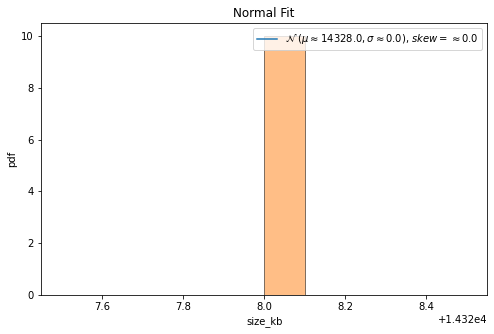


QQ plot 



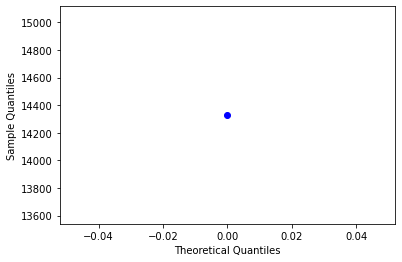

ends normality test ------------------------------------------------

feature name=  consistency_time_milsecs
max value =  21600406 min value =  21600406
mean=  21600406.0 standard deviation=  0.0
left range=  21600406.0 right range=  21600406.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-285-45c16fa63238>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-285-45c16fa63238>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


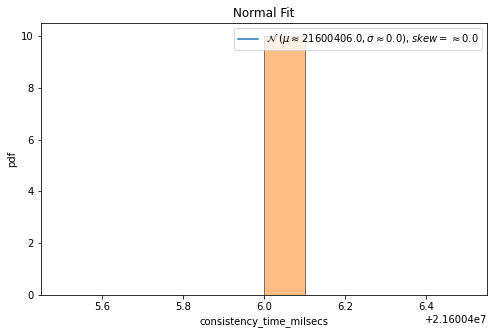


QQ plot 



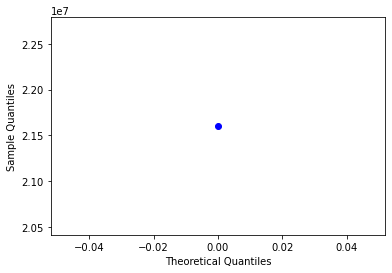

ends normality test ------------------------------------------------

feature name=  consistency_size_kb
max value =  8128296 min value =  8128296
mean=  8128296.0 standard deviation=  0.0
left range=  8128296.0 right range=  8128296.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-285-45c16fa63238>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-285-45c16fa63238>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


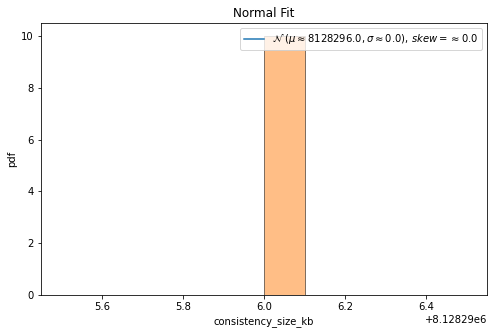


QQ plot 



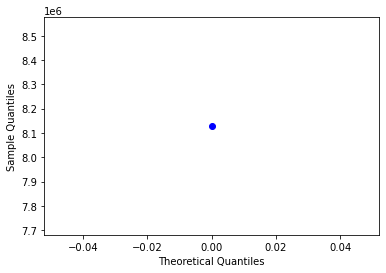

ends normality test ------------------------------------------------

feature name=  realisation_time_milsecs
max value =  92155 min value =  92155
mean=  92155.0 standard deviation=  0.0
left range=  92155.0 right range=  92155.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-285-45c16fa63238>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-285-45c16fa63238>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


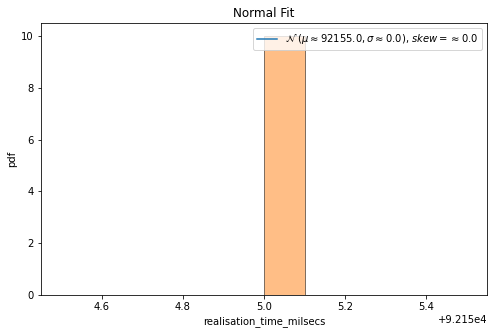


QQ plot 



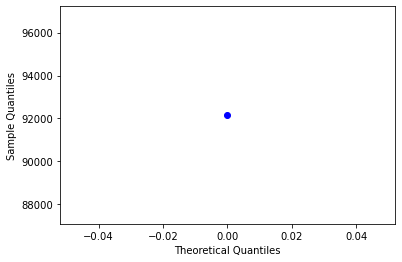

ends normality test ------------------------------------------------

feature name=  classification_time_milsecs
max value =  21600415 min value =  21600415
mean=  21600415.0 standard deviation=  0.0
left range=  21600415.0 right range=  21600415.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-285-45c16fa63238>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-285-45c16fa63238>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


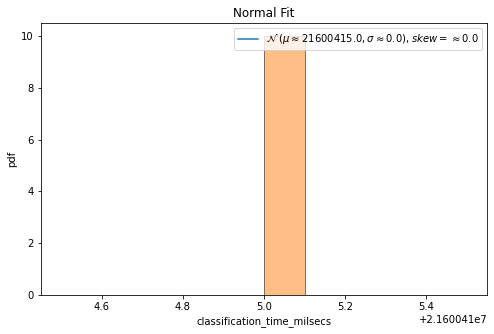


QQ plot 



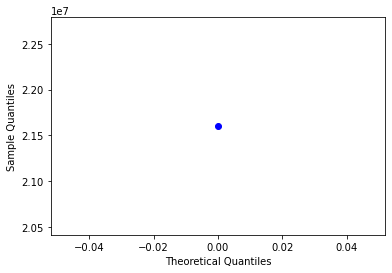

ends normality test ------------------------------------------------

feature name=  classification_size_kb
max value =  7870180 min value =  7870180
mean=  7870180.0 standard deviation=  0.0
left range=  7870180.0 right range=  7870180.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-285-45c16fa63238>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-285-45c16fa63238>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


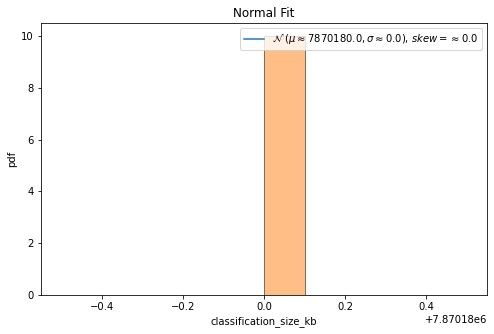


QQ plot 



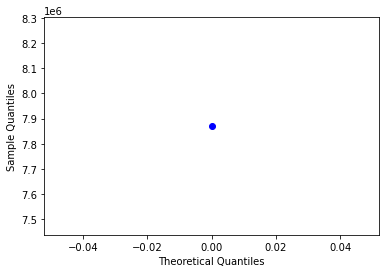

ends normality test ------------------------------------------------

feature name=  SOV
max value =  18039 min value =  18039
mean=  18039.0 standard deviation=  0.0
left range=  18039.0 right range=  18039.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-285-45c16fa63238>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-285-45c16fa63238>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


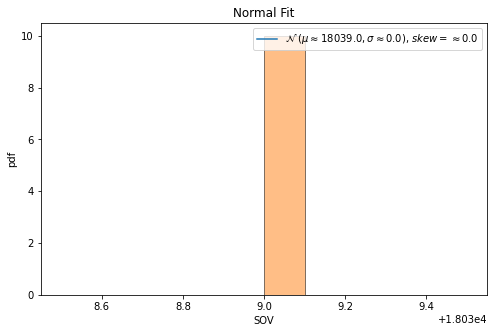


QQ plot 



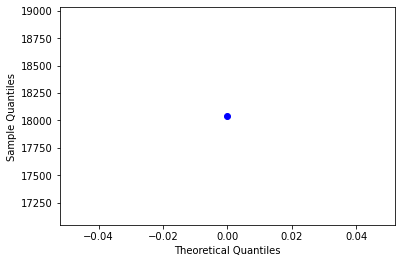

ends normality test ------------------------------------------------

feature name=  EOG
max value =  2.1596928327241485 min value =  2.1596928327241485
mean=  2.1596928327241485 standard deviation=  0.0
left range=  2.1596928327241485 right range=  2.1596928327241485
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-285-45c16fa63238>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-285-45c16fa63238>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


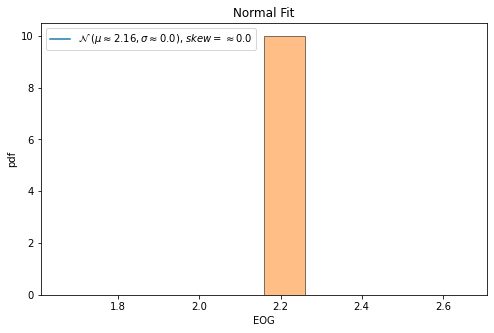


QQ plot 



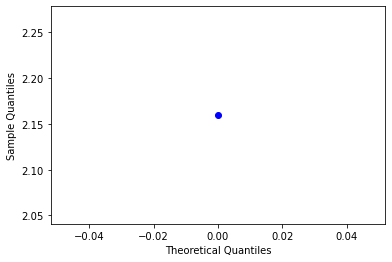

ends normality test ------------------------------------------------

feature name=  RCH
max value =  0.8955223880597015 min value =  0.8955223880597015
mean=  0.8955223880597015 standard deviation=  0.0
left range=  0.8955223880597015 right range=  0.8955223880597015
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-285-45c16fa63238>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-285-45c16fa63238>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


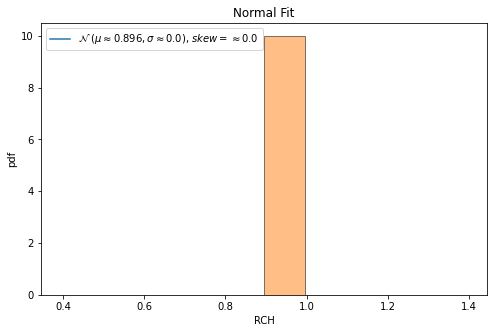


QQ plot 



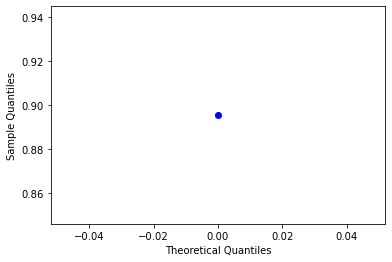

ends normality test ------------------------------------------------

feature name=  CYC
max value =  41923 min value =  41923
mean=  41923.0 standard deviation=  0.0
left range=  41923.0 right range=  41923.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-285-45c16fa63238>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-285-45c16fa63238>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


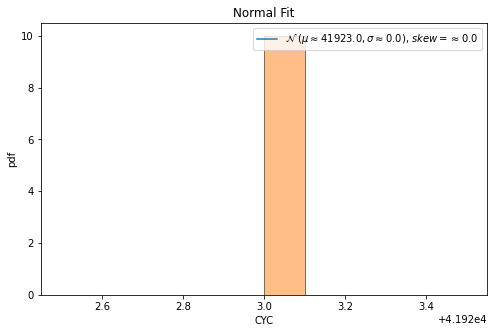


QQ plot 



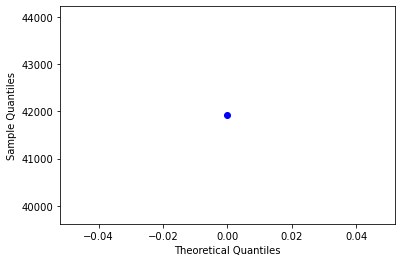

ends normality test ------------------------------------------------

feature name=  HGCI
max value =  0 min value =  0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-285-45c16fa63238>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-285-45c16fa63238>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


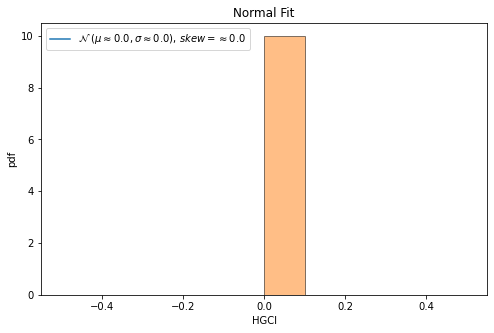


QQ plot 



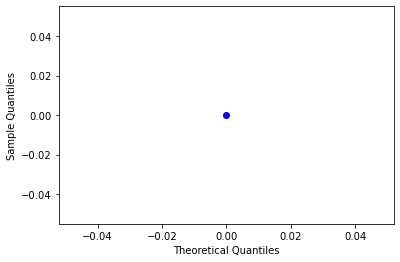

ends normality test ------------------------------------------------

feature name=  ELCLSPRT
max value =  0.15789473684210525 min value =  0.15789473684210525
mean=  0.15789473684210525 standard deviation=  0.0
left range=  0.15789473684210525 right range=  0.15789473684210525
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-285-45c16fa63238>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-285-45c16fa63238>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


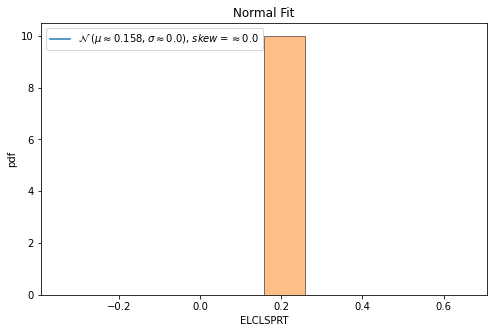


QQ plot 



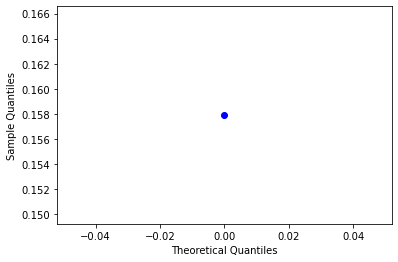

ends normality test ------------------------------------------------

feature name=  ELAXPRT
max value =  0.3333333333333333 min value =  0.3333333333333333
mean=  0.3333333333333333 standard deviation=  0.0
left range=  0.3333333333333333 right range=  0.3333333333333333
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-285-45c16fa63238>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-285-45c16fa63238>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


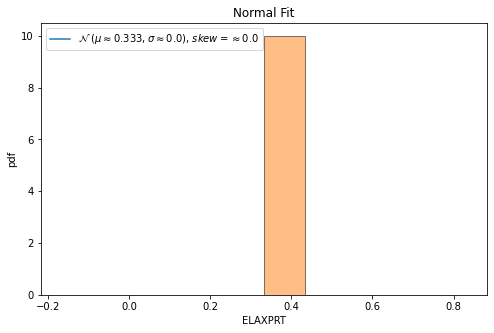


QQ plot 



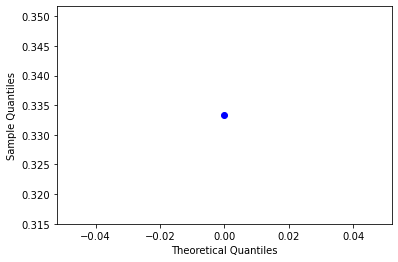

ends normality test ------------------------------------------------

feature name=  HLC
max value =  0 min value =  0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-285-45c16fa63238>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-285-45c16fa63238>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


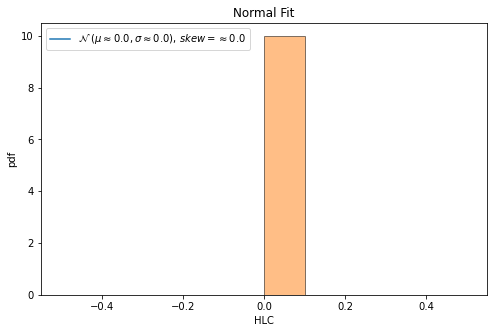


QQ plot 



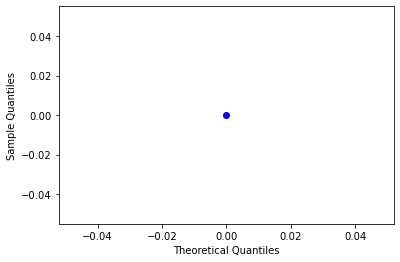

ends normality test ------------------------------------------------

feature name=  IHR
max value =  0 min value =  0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-285-45c16fa63238>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-285-45c16fa63238>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


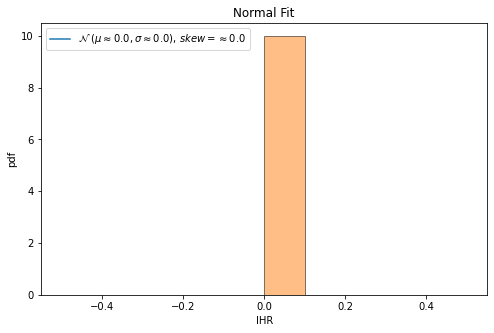


QQ plot 



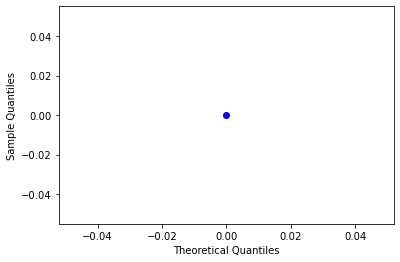

ends normality test ------------------------------------------------

feature name=  ITR
max value =  0 min value =  0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-285-45c16fa63238>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-285-45c16fa63238>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


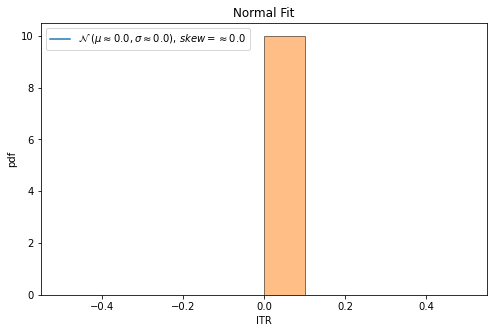


QQ plot 



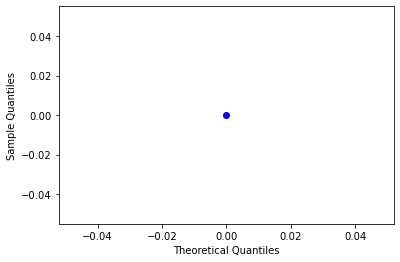

ends normality test ------------------------------------------------

feature name=  IND
max value =  6016 min value =  6016
mean=  6016.0 standard deviation=  0.0
left range=  6016.0 right range=  6016.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-285-45c16fa63238>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-285-45c16fa63238>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


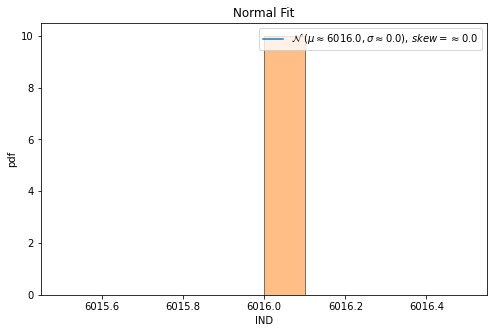


QQ plot 



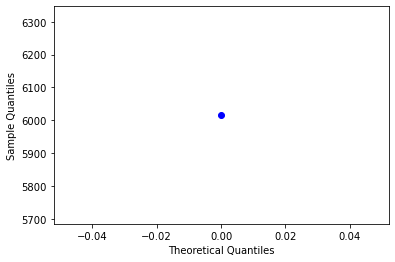

ends normality test ------------------------------------------------

feature name=  mNOC
max value =  3 min value =  3
mean=  3.0 standard deviation=  0.0
left range=  3.0 right range=  3.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-285-45c16fa63238>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-285-45c16fa63238>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


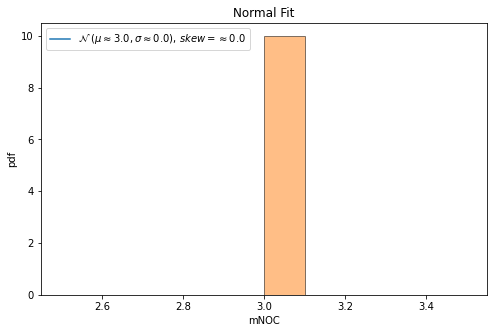


QQ plot 



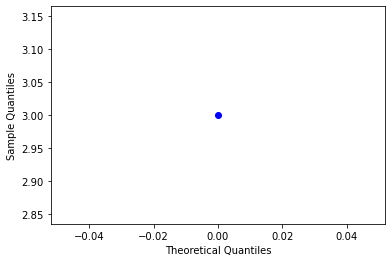

ends normality test ------------------------------------------------

feature name=  tNOC
max value =  3 min value =  3
mean=  3.0 standard deviation=  0.0
left range=  3.0 right range=  3.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-285-45c16fa63238>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-285-45c16fa63238>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


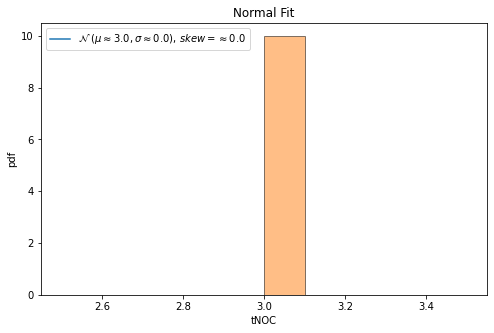


QQ plot 



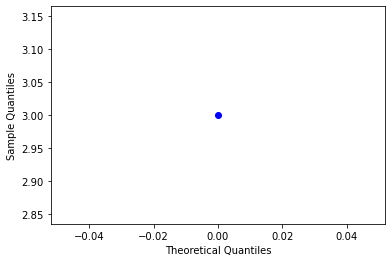

ends normality test ------------------------------------------------

feature name=  aCID
max value =  89.96268656716421 min value =  89.96268656716421
mean=  89.96268656716421 standard deviation=  0.0
left range=  89.96268656716421 right range=  89.96268656716421
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-285-45c16fa63238>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-285-45c16fa63238>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


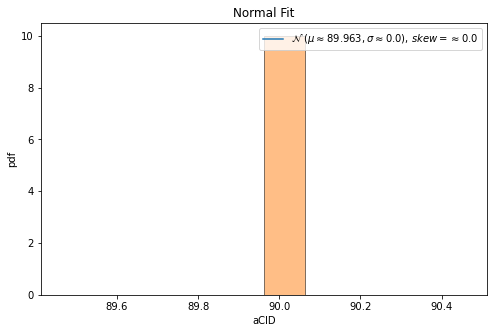


QQ plot 



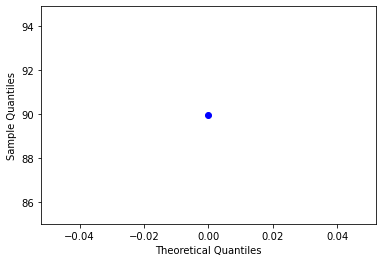

ends normality test ------------------------------------------------

feature name=  tCID
max value =  12055 min value =  12055
mean=  12055.0 standard deviation=  0.0
left range=  12055.0 right range=  12055.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-285-45c16fa63238>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-285-45c16fa63238>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


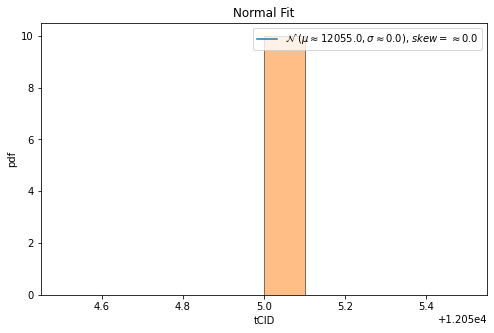


QQ plot 



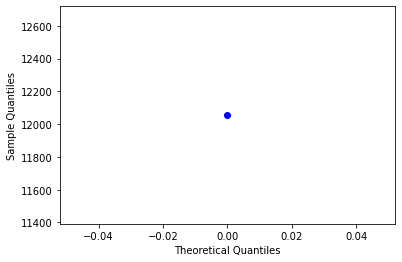

ends normality test ------------------------------------------------

feature name=  aCOD
max value =  1.1940298507462686 min value =  1.1940298507462686
mean=  1.1940298507462686 standard deviation=  0.0
left range=  1.1940298507462686 right range=  1.1940298507462686
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-285-45c16fa63238>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-285-45c16fa63238>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


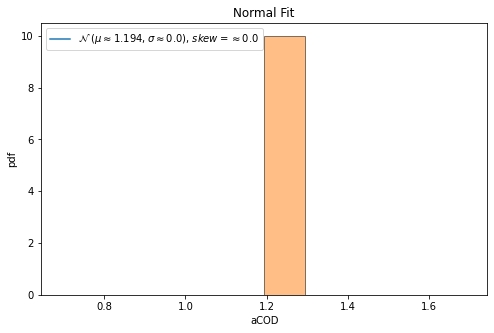


QQ plot 



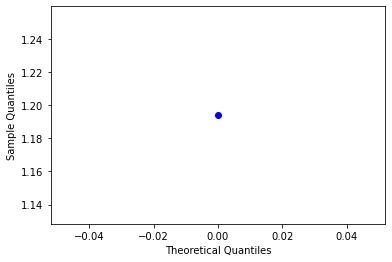

ends normality test ------------------------------------------------

feature name=  mCOD
max value =  5 min value =  5
mean=  5.0 standard deviation=  0.0
left range=  5.0 right range=  5.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-285-45c16fa63238>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-285-45c16fa63238>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


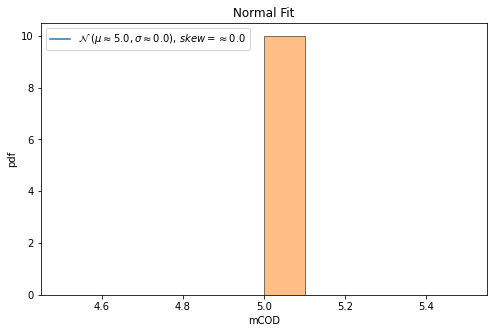


QQ plot 



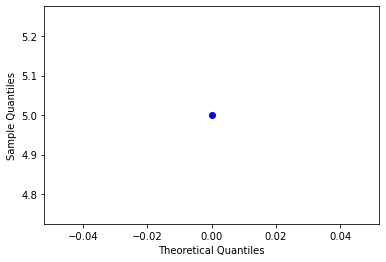

ends normality test ------------------------------------------------

feature name=  tCOD
max value =  160 min value =  160
mean=  160.0 standard deviation=  0.0
left range=  160.0 right range=  160.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-285-45c16fa63238>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-285-45c16fa63238>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


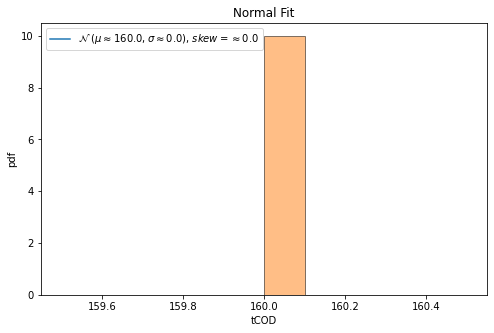


QQ plot 



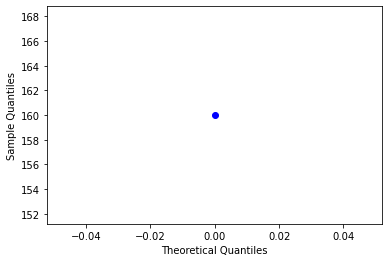

ends normality test ------------------------------------------------

feature name=  aNOP
max value =  0.9925373134328358 min value =  0.9925373134328358
mean=  0.9925373134328358 standard deviation=  0.0
left range=  0.9925373134328358 right range=  0.9925373134328358
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-285-45c16fa63238>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-285-45c16fa63238>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


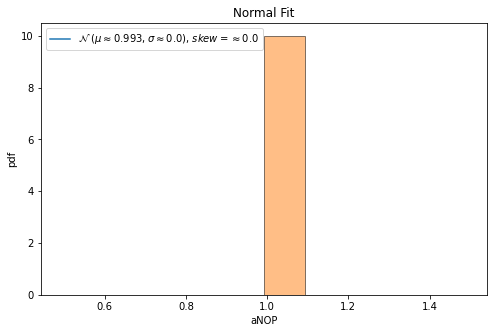


QQ plot 



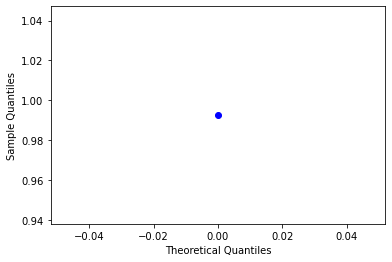

ends normality test ------------------------------------------------

feature name=  mNOP
max value =  1 min value =  1
mean=  1.0 standard deviation=  0.0
left range=  1.0 right range=  1.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-285-45c16fa63238>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-285-45c16fa63238>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


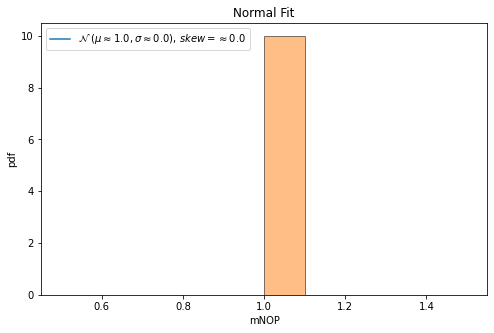


QQ plot 



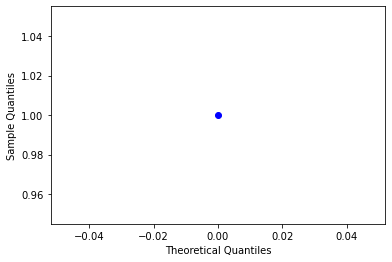

ends normality test ------------------------------------------------

feature name=  tNOP
max value =  133 min value =  133
mean=  133.0 standard deviation=  0.0
left range=  133.0 right range=  133.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-285-45c16fa63238>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-285-45c16fa63238>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


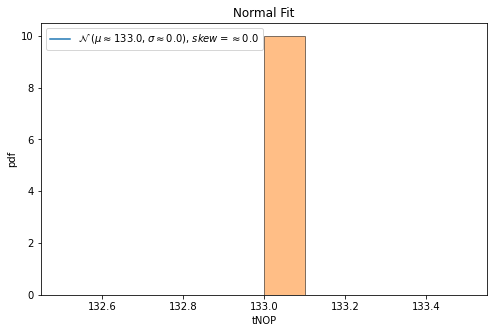


QQ plot 



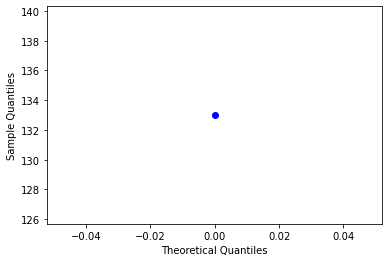

ends normality test ------------------------------------------------

feature name=  CONJ
max value =  7 min value =  7
mean=  7.0 standard deviation=  0.0
left range=  7.0 right range=  7.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-285-45c16fa63238>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-285-45c16fa63238>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


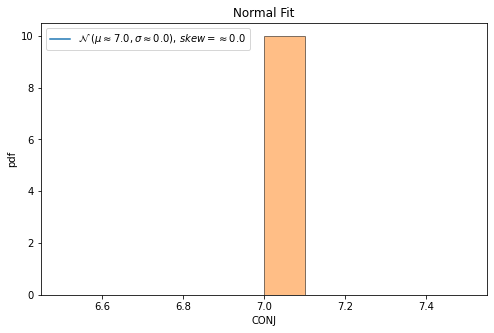


QQ plot 



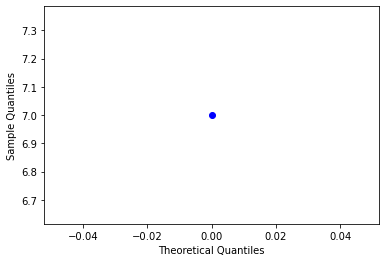

ends normality test ------------------------------------------------

feature name=  CONJP
max value =  0.0583 min value =  0.0583
mean=  0.0583 standard deviation=  0.0
left range=  0.0583 right range=  0.0583
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-285-45c16fa63238>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-285-45c16fa63238>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


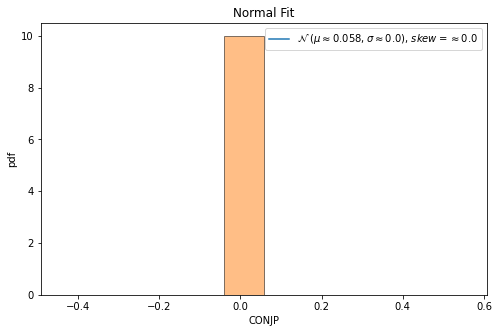


QQ plot 



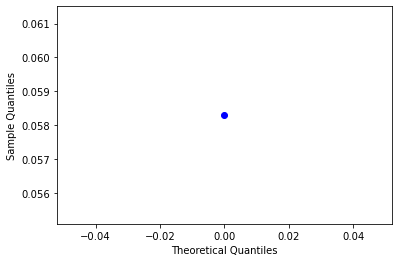

ends normality test ------------------------------------------------

feature name=  DISJ
max value =  0 min value =  0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-285-45c16fa63238>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-285-45c16fa63238>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


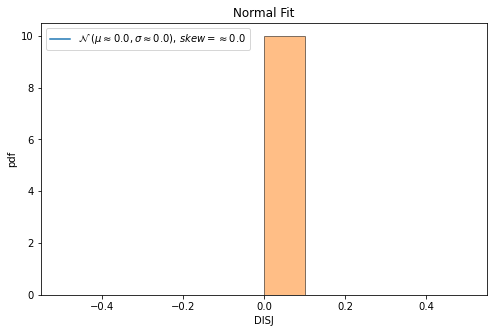


QQ plot 



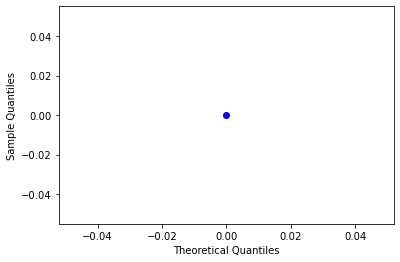

ends normality test ------------------------------------------------

feature name=  UF
max value =  0 min value =  0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-285-45c16fa63238>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-285-45c16fa63238>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


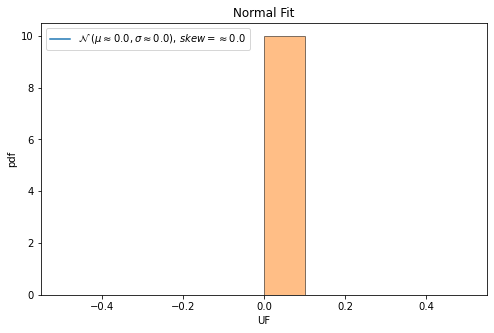


QQ plot 



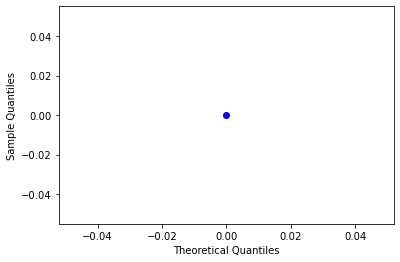

ends normality test ------------------------------------------------

feature name=  UFP
max value =  0.0 min value =  0.0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-285-45c16fa63238>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-285-45c16fa63238>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


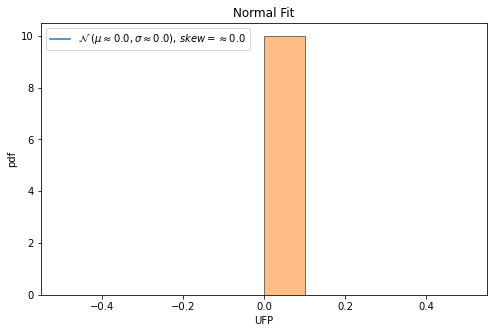


QQ plot 



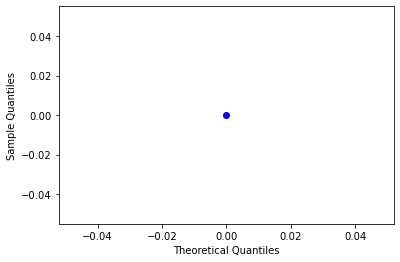

ends normality test ------------------------------------------------

feature name=  EF
max value =  1 min value =  1
mean=  1.0 standard deviation=  0.0
left range=  1.0 right range=  1.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-285-45c16fa63238>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-285-45c16fa63238>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


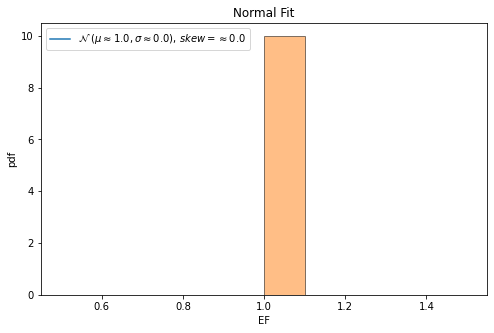


QQ plot 



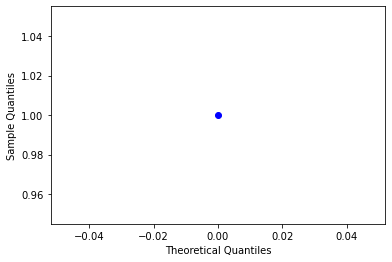

ends normality test ------------------------------------------------

feature name=  EFP
max value =  0.0083 min value =  0.0083
mean=  0.0083 standard deviation=  0.0
left range=  0.0083 right range=  0.0083
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-285-45c16fa63238>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-285-45c16fa63238>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


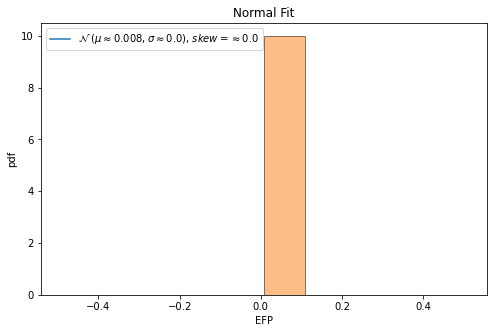


QQ plot 



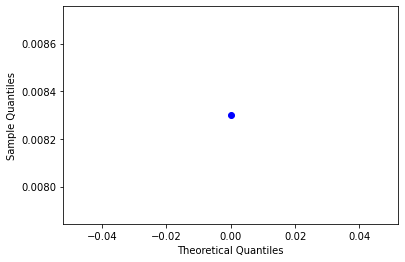

ends normality test ------------------------------------------------

feature name=  VALUE
max value =  0 min value =  0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-285-45c16fa63238>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-285-45c16fa63238>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


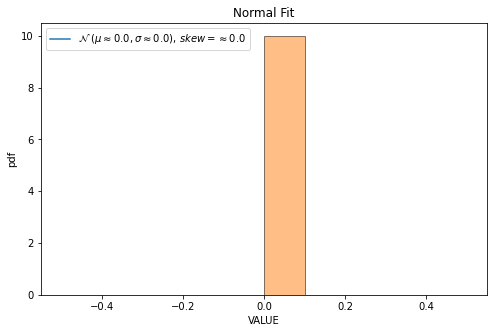


QQ plot 



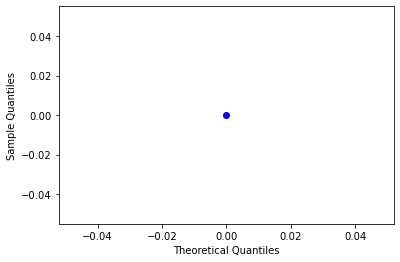

ends normality test ------------------------------------------------

feature name=  VALUEP
max value =  0.0 min value =  0.0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-285-45c16fa63238>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-285-45c16fa63238>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


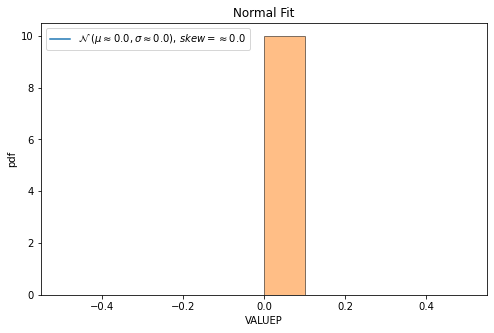


QQ plot 



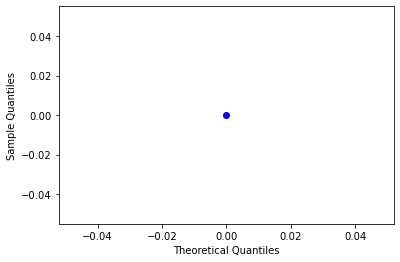

ends normality test ------------------------------------------------

feature name=  MNCARP
max value =  0.0417 min value =  0.0417
mean=  0.0417 standard deviation=  0.0
left range=  0.0417 right range=  0.0417
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-285-45c16fa63238>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-285-45c16fa63238>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


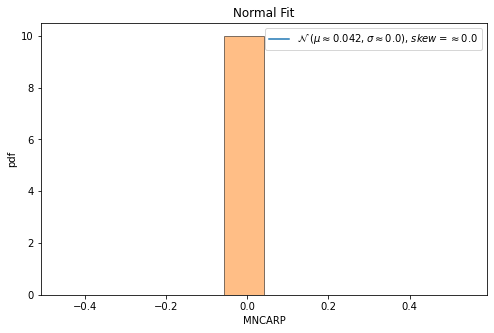


QQ plot 



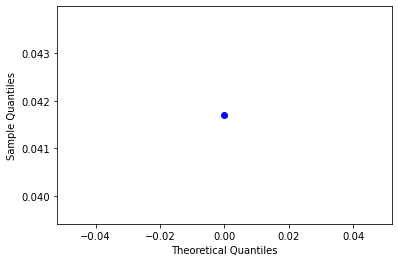

ends normality test ------------------------------------------------

feature name=  CARP
max value =  0.8583 min value =  0.8583
mean=  0.8583 standard deviation=  0.0
left range=  0.8583 right range=  0.8583
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-285-45c16fa63238>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-285-45c16fa63238>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


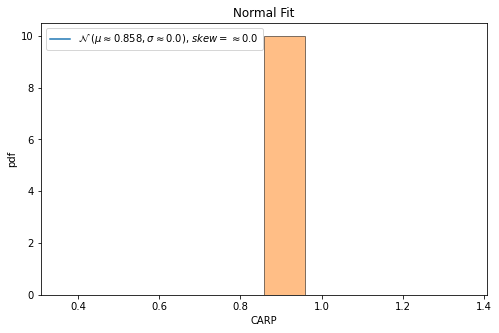


QQ plot 



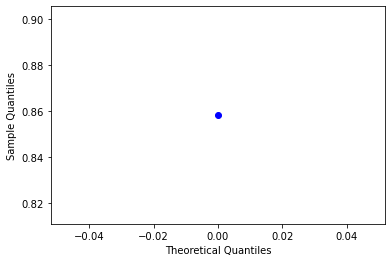

ends normality test ------------------------------------------------

feature name=  OBP
max value =  5 min value =  5
mean=  5.0 standard deviation=  0.0
left range=  5.0 right range=  5.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-285-45c16fa63238>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-285-45c16fa63238>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


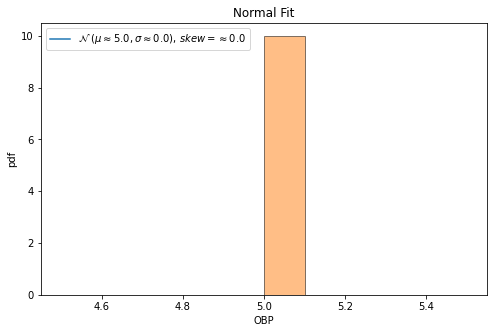


QQ plot 



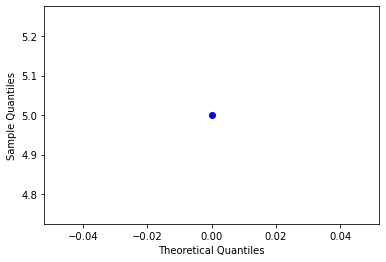

ends normality test ------------------------------------------------

feature name=  DTP
max value =  2 min value =  2
mean=  2.0 standard deviation=  0.0
left range=  2.0 right range=  2.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-285-45c16fa63238>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-285-45c16fa63238>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


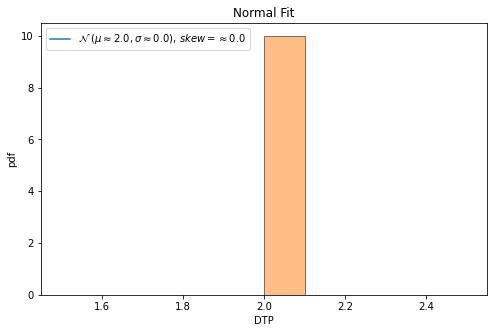


QQ plot 



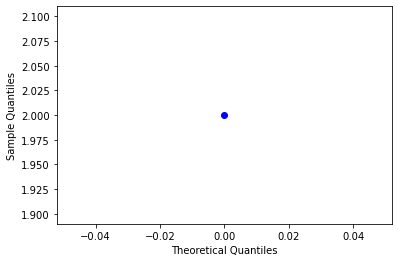

ends normality test ------------------------------------------------

feature name=  DTPP
max value =  0.2857 min value =  0.2857
mean=  0.2857 standard deviation=  0.0
left range=  0.2857 right range=  0.2857
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-285-45c16fa63238>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-285-45c16fa63238>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


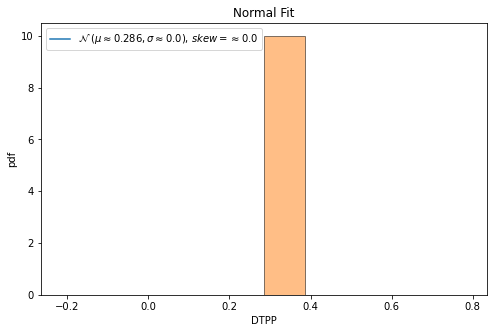


QQ plot 



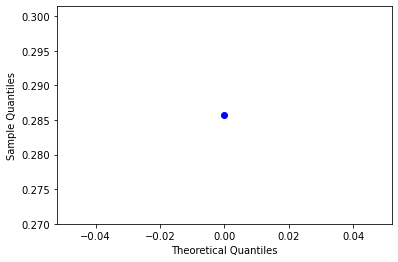

ends normality test ------------------------------------------------

feature name=  SYM
max value =  3 min value =  3
mean=  3.0 standard deviation=  0.0
left range=  3.0 right range=  3.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-285-45c16fa63238>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-285-45c16fa63238>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


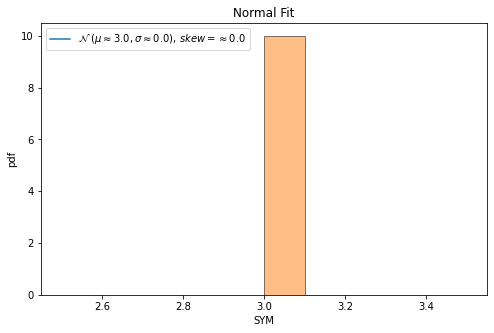


QQ plot 



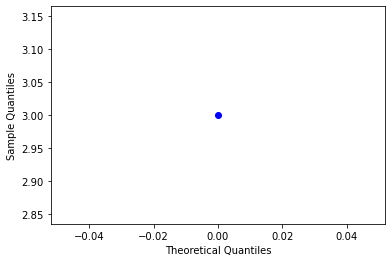

ends normality test ------------------------------------------------

feature name=  TRN
max value =  0 min value =  0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-285-45c16fa63238>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-285-45c16fa63238>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


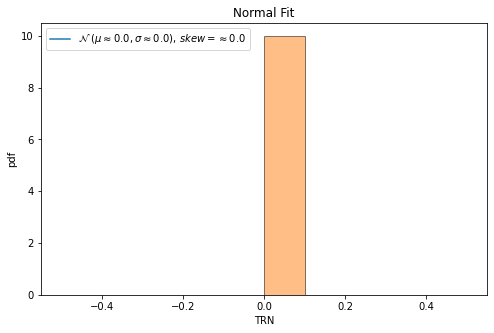


QQ plot 



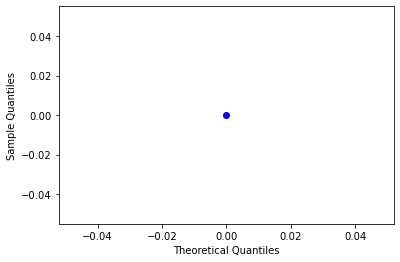

ends normality test ------------------------------------------------

feature name=  IFUNP
max value =  0.0 min value =  0.0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-285-45c16fa63238>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-285-45c16fa63238>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


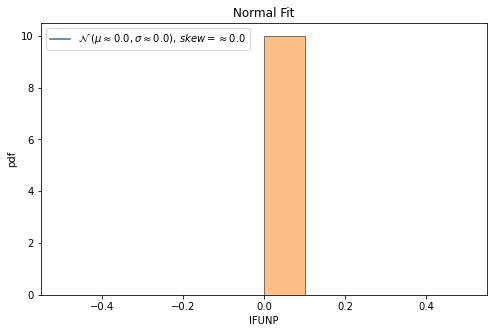


QQ plot 



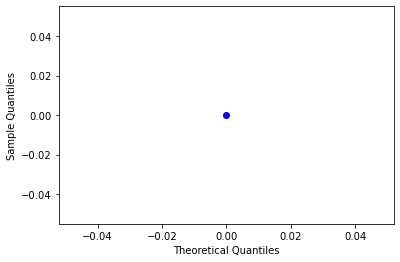

ends normality test ------------------------------------------------

feature name=  SUBP
max value =  0 min value =  0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-285-45c16fa63238>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-285-45c16fa63238>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


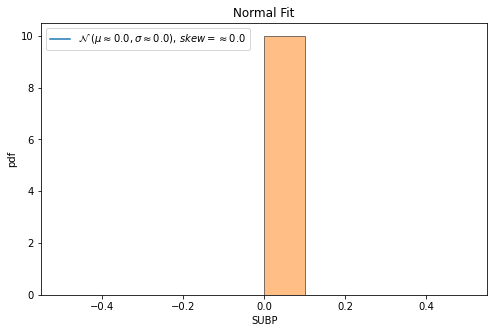


QQ plot 



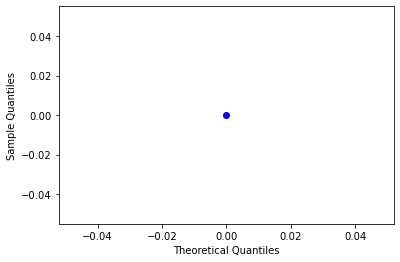

ends normality test ------------------------------------------------

feature name=  INV
max value =  0 min value =  0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-285-45c16fa63238>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-285-45c16fa63238>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


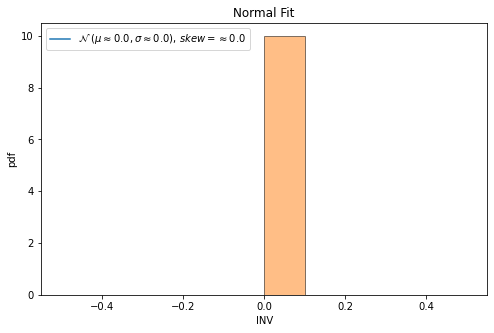


QQ plot 



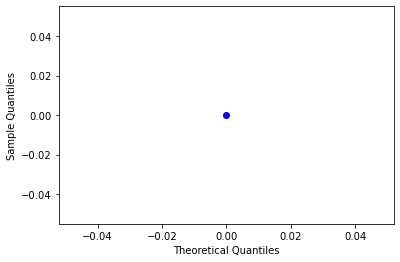

ends normality test ------------------------------------------------

feature name=  DOMN
max value =  6 min value =  6
mean=  6.0 standard deviation=  0.0
left range=  6.0 right range=  6.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-285-45c16fa63238>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-285-45c16fa63238>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


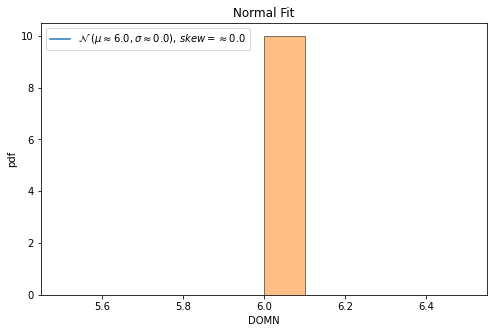


QQ plot 



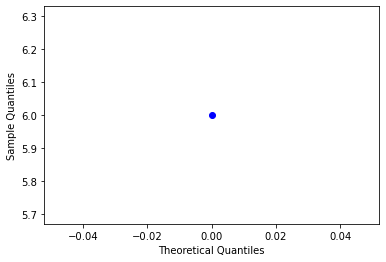

ends normality test ------------------------------------------------

feature name=  CHNP
max value =  0.0 min value =  0.0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-285-45c16fa63238>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-285-45c16fa63238>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


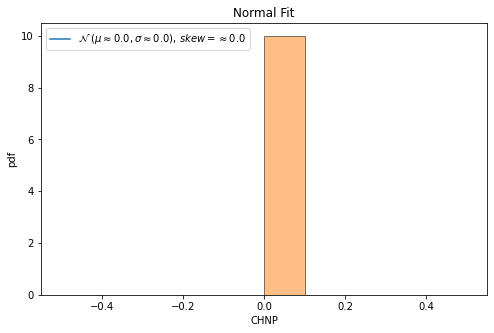


QQ plot 



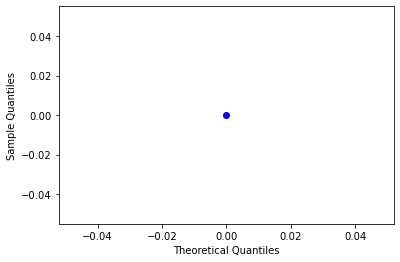

ends normality test ------------------------------------------------

feature name=  ELPROP
max value =  0.85 min value =  0.85
mean=  0.85 standard deviation=  0.0
left range=  0.85 right range=  0.85
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-285-45c16fa63238>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-285-45c16fa63238>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


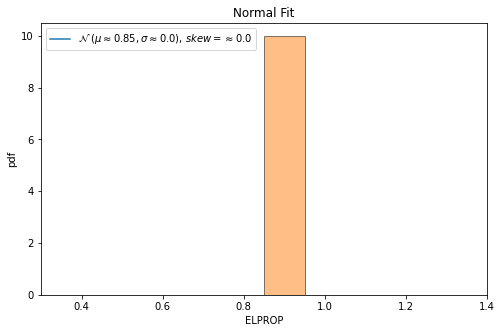


QQ plot 



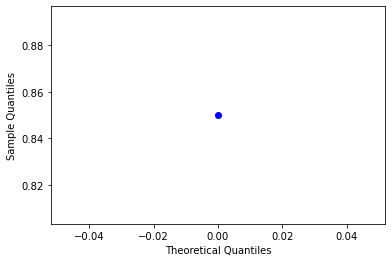

ends normality test ------------------------------------------------

feature name=  CAL_TIME
max value =  1910 min value =  1910
mean=  1910.0 standard deviation=  0.0
left range=  1910.0 right range=  1910.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-285-45c16fa63238>:105: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-285-45c16fa63238>:106: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


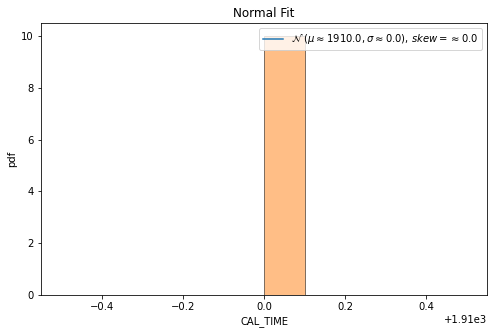


QQ plot 



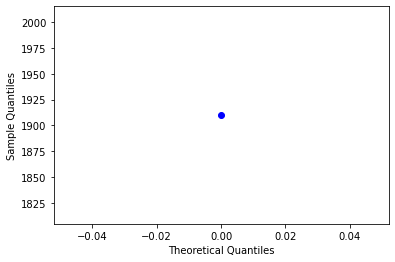

ends normality test ------------------------------------------------



In [285]:
#**** follow the same notation as explained above in 'easy time easy memory' category wherever required*******#


#after hard time and memory clusering ,
#collect the medium ones

from matplotlib import pyplot as plt
%matplotlib inline
#%matplotlib qt 
import scipy
from scipy.stats import norm
from statsmodels.graphics.gofplots import qqplot
import statistics
from scipy.stats import shapiro
from scipy.stats import normaltest
import math
#interquratile range 
def cal(sov_sort):
    p=0
    l=len(sov_sort)
    left=0
    right=0
    while  p < 90 :
        if p==0:
            if l % 2 ==0:
                left=( l /2)
                right=( l / 2) + 1
                p= round((((right -left +1) / l) * 100),2)
                
            else:
                left=math.floor( l /2)
                right=math.ceil(l/2) + 1
                p= round((((right -left +1) / l) * 100),2)
                
        else:
            if left % 2 !=0:
                left = math.ceil(left/2)
            else:
                left = left /2
            
            dist = l - right +1
            if dist % 2 !=0:
                right = right + math.ceil(dist/2)
            else:
                right = right + (dist /2)
                
            p= round((((right -left +1) / l) * 100),2)
             
        
    return left-1,right-1





print(df_hard_time_mem_feature_df.shape)
hard_time_mem_medium= df_hard_time_mem_feature_df[df_hard_time_mem_feature_df['label_mem']== 'medium']
print(hard_time_mem_medium.shape)
prior_medium= round(hard_time_mem_medium.shape[0] / df_hard_time_mem_feature_df.shape[0] ,5)

main_dict_htmm={}
main_dict_htmm_iqr={}

for i in range(len(cols_list)):
    if cols_list[i] in top_n_3:
        tmp_dict={}
        tmp_dict_iqr={}
        
        feature = cols_list[i]
        print("feature name= ",feature)
        
        sov=np.array(hard_time_mem_medium[feature])
        sov_1=(np.sort(sov))
        skew=scipy.stats.skew(sov)
        
        tmp_dict["skew"]=round(skew,4)
        tmp_dict_iqr["skew"]=round(skew,4)
        
        if -2 < skew and skew < 2:
        
            print("max value = ",np.max(sov),"min value = ",np.min(sov))
            tmp_dict["min"]=round(np.min(sov),9)
            tmp_dict["max"]=round(np.max(sov),9)
            min_val=np.min(sov)
            max_val=np.max(sov)

            mean = np.mean(sov)
            std = np.std(sov)
            print("mean= ",mean,"standard deviation= ",std)
            tmp_dict["mean"]=round(mean,9)
            tmp_dict["std"]=round(std,9)
            #gamma=2
            #rx= mean - ((1- prior_medium) *gamma * std) 
            #ry= mean + ((1- prior_medium) *gamma * std)
            l_weight=0.5
            r_weight=0.5
            rx= mean - (l_weight* std) 
            ry= mean + (r_weight* std)
            print("left range= ",rx,"right range= ", ry)
            tmp_dict["lw_i"]=round(l_weight,9)
            tmp_dict["rw_i"]=round(r_weight,9)
            tmp_dict["lr"]=round(rx,9)
            tmp_dict["rr"]=round(ry,9)

            min_val_w= round(((mean - min_val) /std ),9)
            max_val_w= round(((max_val - mean) /std ),9)
            print(min_val_w,max_val_w)
            if math.isnan(min_val_w):
                    tmp_dict["min_val_w"]="null"
            else:
                    tmp_dict["min_val_w"]=round(min_val_w,9)
            
            if math.isnan(max_val_w):
                    tmp_dict["max_val_w"]="null"
            else:
                tmp_dict["max_val_w"]=round(max_val_w,9)


            val=(((rx <= sov) & (sov <= ry)).sum()) / hard_time_mem_medium.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within this range= ",v,"%")

            tmp_dict["percent_i"]=round(v,9)
            tmp_dict["percent_change"]=round(v,9)

            val=(((min_val <= sov) & (sov <= mean)).sum()) / hard_time_mem_medium.shape[0]
            percent_l =  round((val * 100 ),2)

            val=(((mean <= sov) & (sov <= max_val)).sum()) / hard_time_mem_medium.shape[0]
            percent_r =  round((val * 100 ),2)

            print("percent left and right= ",percent_l,percent_r)
            tmp_dict["percent_l"]=percent_l
            tmp_dict["percent_r"]=percent_r
            
            main_dict_htmm[feature]=tmp_dict
            
        else:
            
            left_index,right_index = cal(sov_1)
            rx=sov_1[int(left_index)]
            ry=sov_1[int(right_index)]

            print("max value = ",np.max(sov),"min value = ",np.min(sov))
            
            tmp_dict_iqr["min"]=round(np.min(sov),9)
            tmp_dict_iqr["max"]=round(np.max(sov),9)
            min_val=np.min(sov)
            max_val=np.max(sov)
            
            
            mean = np.mean(sov)
            std = np.std(sov)
            print("mean= ",mean,"standard deviation= ",std)
            tmp_dict_iqr["mean"]=round(mean,9)
            tmp_dict_iqr["std"]=round(std,9)
            
            print("left range= ",rx,"right range= ", ry)
            tmp_dict_iqr["lw_i"]="null"
            tmp_dict_iqr["rw_i"]="null"
            tmp_dict_iqr["lr"]=round(rx,9)
            tmp_dict_iqr["rr"]=round(ry,9)
            
            
            tmp_dict_iqr["min_val_w"]="null"
            tmp_dict_iqr["max_val_w"]="null"
            tmp_dict_iqr["percent_i"]="null"
            val=(((rx <= sov) & (sov <= ry)).sum()) / hard_time_mem_medium.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within this range= ",v,"%")
            tmp_dict_iqr["percent_change"]=round(v,9)
            
            val=(((min_val <= sov) & (sov <= mean)).sum()) / hard_time_mem_medium.shape[0]
            percent_l =  round((val * 100 ),2)

            val=(((mean <= sov) & (sov <= max_val)).sum()) / hard_time_mem_medium.shape[0]
            percent_r =  round((val * 100 ),2)

            print("percent left and right= ",percent_l,percent_r)
            
            tmp_dict_iqr["percent_l"]=percent_l
            tmp_dict_iqr["percent_r"]=percent_r
            
            main_dict_htmm_iqr[feature]=tmp_dict_iqr

            
            # 68–95–99.7 rule, also known as the empirical rule

            # for 1*std
            left = mean - std
            right = mean + std
            val=(((left <= sov) & (sov <= right)).sum()) / hard_time_mem_medium.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 1 standard deviation= ",v,"%")
            
            # for 2*std
            left = mean - (2*std)
            right = mean + (2*std)
            val=(((left <= sov) & (sov <= right)).sum()) / hard_time_mem_medium.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 2 standard deviation= ",v,"%")
            


            # for 3*std
            left = mean - (3*std)
            right = mean + (3*std)
            val=(((left <= sov) & (sov <= right)).sum()) / hard_time_mem_medium.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 3 standard deviation= ",v,"%")
            
        print("\n\n")
        
        #normality test
        print("normality test :----\n")
        # kurtosis and skew function
        kurt=scipy.stats.kurtosis(sov)
        print("kurtosis value= ",kurt)
        
        
        print("skewness value= ",skew)
        
        
        
        #plotting graph for to see the skewess
        sov_1=np.sort(sov)
        fig, ax1 = plt.subplots(1, 1, figsize=(8,5))
        ax1.plot(sov_1, norm.pdf(sov_1, mean, std),label='$\mathcal{N}$ '+ f'$( \mu \\approx {round(mean,3)} , \sigma \\approx {round(std,3)})$, $ skew = \\approx {round(skew,3)}$')
        ax1.hist(sov_1,edgecolor='black',alpha=0.5,density= True)
        ax1.set_title("Normal Fit")
        ax1.set_xlabel(feature)
        ax1.set_ylabel("pdf")
        ax1.legend()
        #plt.savefig('/home/ritam/ontology_hardness/normal_curve_&_skewness/hard_time_medium_memory/'+str(feature)+'.jpeg')
        plt.show()
        
        # Quantile-Quantile Plot Nomrality check
        print("\nQQ plot \n")
        qqplot(sov_1, line='s')
        plt.show()
        ''''
        #Statistical Normality Tests
        # Shapiro-Wilk Test
        print("\n Shapiro-Wilk Test \n ")
        #stat, p = shapiro(sov_1[0:4998])
        stat, p = normaltest(sov_1)
        print('Statistics=%.3f, p=%f' % (stat, p))
        
        alpha = 0.05
        if p > alpha:
            print('Sample looks Gaussian (fail to reject H0)')
        else:
            print('Sample does not look Gaussian (reject H0)')
        '''   
        print("ends normality test ------------------------------------------------\n")
        
        

In [286]:
#**** follow the same notation as explained above in 'easy time easy memory' category wherever required*******#

import copy

main_dict_cal_htmm={}
dec_rate=[(0.9,0.9)]
for i in range(len(dec_rate)):
 
    main_dict_cal_htmm=copy.deepcopy(main_dict_htmm)
    lower_r=dec_rate[i][0]
    high_r=dec_rate[i][1]
    for j in range (100):
        c=0
        for key,value in main_dict_cal_htmm.items():
            
            if value["percent_change"] < 90:

                lw_i_temp=value["lw_i"]
                rw_i_temp=value["rw_i"]
                if value["percent_l"] >= 50:
                    diff=value["min_val_w"] - lw_i_temp
                    frac = round(lower_r * diff, 9)  

                    lw_i_temp= round(lw_i_temp + frac , 9)
                    main_dict_cal_htmm[key]["lw_i"]=lw_i_temp
                else:
                    diff=value["min_val_w"] - lw_i_temp
                    frac = round(high_r * diff, 9)  

                    lw_i_temp= round(lw_i_temp + frac ,9 )
                    main_dict_cal_htmm[key]["lw_i"]=lw_i_temp

                if value["percent_r"] >= 50:
                    diff=value["max_val_w"] - rw_i_temp
                    frac = round(lower_r * diff, 9)  

                    rw_i_temp= round(rw_i_temp + frac , 9 )
                    main_dict_cal_htmm[key]["rw_i"]=rw_i_temp
                else:
                    diff=value["max_val_w"] - rw_i_temp
                    frac = round(high_r * diff, 9)  

                    rw_i_temp= round(rw_i_temp + frac ,9 )
                    main_dict_cal_htmm[key]["rw_i"]=rw_i_temp

                sov=np.array(hard_time_mem_medium[key])
                rx= round(value["mean"] - (lw_i_temp* value["std"]) ,9)
                ry= round(value["mean"] + (rw_i_temp* value["std"]),9)
                main_dict_cal_htmm[key]["lr"]=round(rx,9)
                main_dict_cal_htmm[key]["rr"]=round(ry,9)

                val=(((rx <= sov) & (sov <= ry)).sum()) / hard_time_mem_medium.shape[0]
                v =  round((val * 100 ),2)
                main_dict_cal_htmm[key]["percent_change"]=v

                if v >=85:
                    c=c+1
            else:
                c=c+1
        p=round(c / len(list(main_dict_cal_htmm.keys())),2)
        print ("percent in loop ",j , "covers ", p , "%" )


percent in loop  0 covers  1.0 %
percent in loop  1 covers  1.0 %
percent in loop  2 covers  1.0 %
percent in loop  3 covers  1.0 %
percent in loop  4 covers  1.0 %
percent in loop  5 covers  1.0 %
percent in loop  6 covers  1.0 %
percent in loop  7 covers  1.0 %
percent in loop  8 covers  1.0 %
percent in loop  9 covers  1.0 %
percent in loop  10 covers  1.0 %
percent in loop  11 covers  1.0 %
percent in loop  12 covers  1.0 %
percent in loop  13 covers  1.0 %
percent in loop  14 covers  1.0 %
percent in loop  15 covers  1.0 %
percent in loop  16 covers  1.0 %
percent in loop  17 covers  1.0 %
percent in loop  18 covers  1.0 %
percent in loop  19 covers  1.0 %
percent in loop  20 covers  1.0 %
percent in loop  21 covers  1.0 %
percent in loop  22 covers  1.0 %
percent in loop  23 covers  1.0 %
percent in loop  24 covers  1.0 %
percent in loop  25 covers  1.0 %
percent in loop  26 covers  1.0 %
percent in loop  27 covers  1.0 %
percent in loop  28 covers  1.0 %
percent in loop  29 cove

In [287]:
#**** follow the same notation as explained above in 'easy time easy memory' category wherever required*******#

main_dict_cal_htmm
print(len(main_dict_cal_htmm),len(main_dict_htmm_iqr))
htmm_pd=pd.DataFrame(main_dict_cal_htmm)
htmm_iqr_pd=pd.DataFrame(main_dict_htmm_iqr)

frames = [htmm_pd,htmm_iqr_pd]
result = pd.concat(frames,axis=1)
result
#result.to_csv("htmm_ranges.csv")


50 0


In [288]:
hard_time_mem_medium  # contains 1 ontology in this category

,file,size_kb,consistency_time_milsecs,consistency_size_kb,realisation_time_milsecs,realisation_size_kb,classification_time_milsecs,classification_size_kb,SOV,ENR,...,EQVP,DISP,INV,DOMN,RANG,CHN,CHNP,ELPROP,CAL_TIME,label_mem
4,75714e9a-2962-4466-8377-5ceaad9662c7_VAST2009....,14328,21600406,8128296,92155,113488448,21600415,7870180,18039,3.308662,...,0,0,0,6,7,0,0.0,0.85,1910,medium


(6, 101)
(1, 101)
feature name=  size_kb
max value =  5547 min value =  5547
mean=  5547.0 standard deviation=  0.0
left range=  5547.0 right range=  5547.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-289-ee5c76fd08d8>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-289-ee5c76fd08d8>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


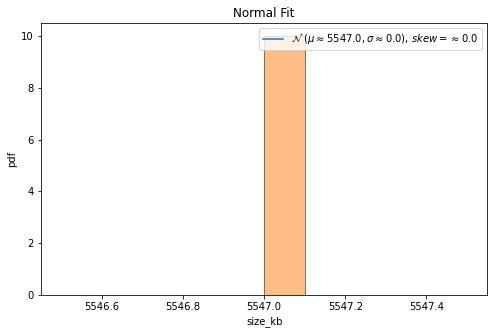


QQ plot 



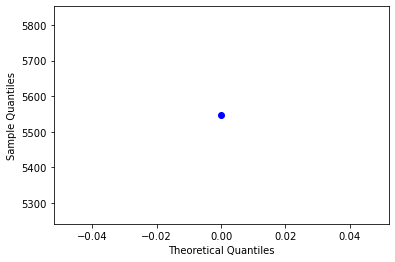

ends normality test ------------------------------------------------

feature name=  consistency_time_milsecs
max value =  21600449 min value =  21600449
mean=  21600449.0 standard deviation=  0.0
left range=  21600449.0 right range=  21600449.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-289-ee5c76fd08d8>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-289-ee5c76fd08d8>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


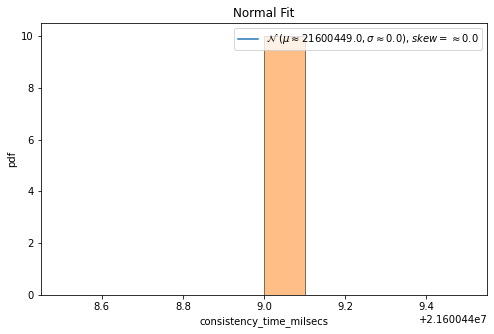


QQ plot 



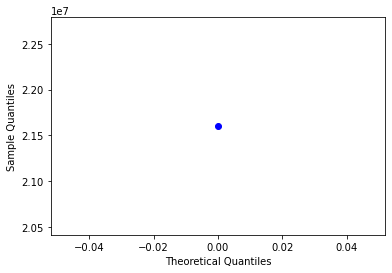

ends normality test ------------------------------------------------

feature name=  consistency_size_kb
max value =  17684888 min value =  17684888
mean=  17684888.0 standard deviation=  0.0
left range=  17684888.0 right range=  17684888.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-289-ee5c76fd08d8>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-289-ee5c76fd08d8>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


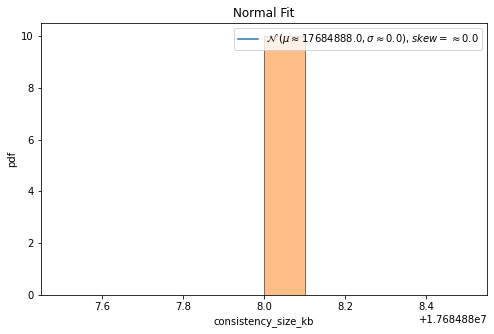


QQ plot 



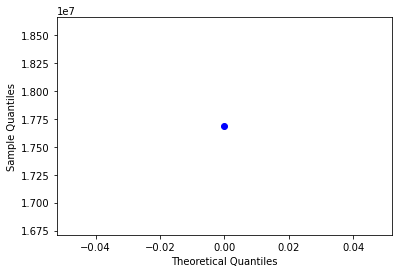

ends normality test ------------------------------------------------

feature name=  realisation_time_milsecs
max value =  21600430 min value =  21600430
mean=  21600430.0 standard deviation=  0.0
left range=  21600430.0 right range=  21600430.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-289-ee5c76fd08d8>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-289-ee5c76fd08d8>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


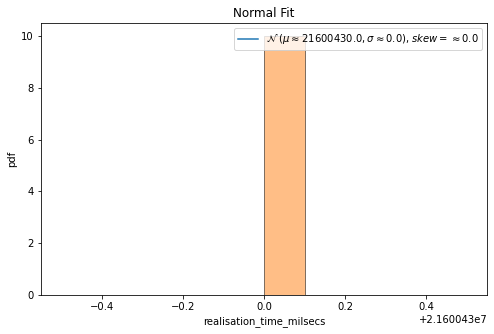


QQ plot 



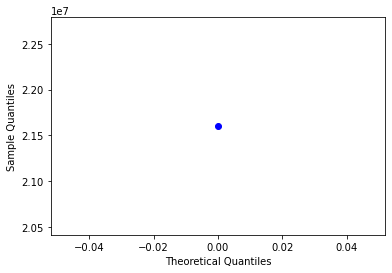

ends normality test ------------------------------------------------

feature name=  classification_time_milsecs
max value =  21600584 min value =  21600584
mean=  21600584.0 standard deviation=  0.0
left range=  21600584.0 right range=  21600584.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-289-ee5c76fd08d8>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-289-ee5c76fd08d8>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


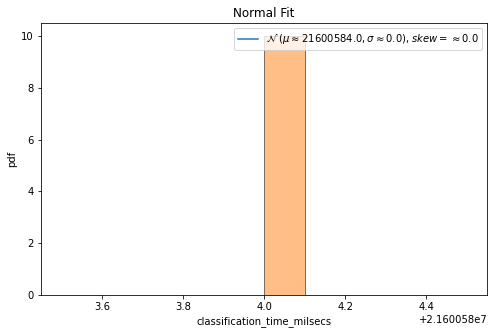


QQ plot 



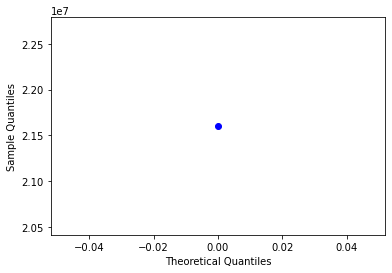

ends normality test ------------------------------------------------

feature name=  classification_size_kb
max value =  24260664 min value =  24260664
mean=  24260664.0 standard deviation=  0.0
left range=  24260664.0 right range=  24260664.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-289-ee5c76fd08d8>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-289-ee5c76fd08d8>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


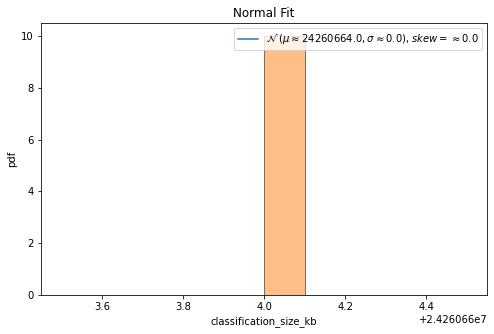


QQ plot 



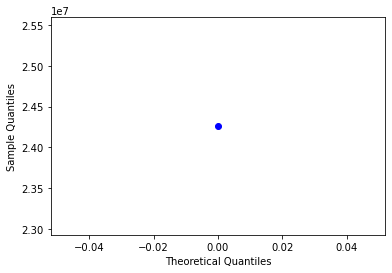

ends normality test ------------------------------------------------

feature name=  SOV
max value =  11583 min value =  11583
mean=  11583.0 standard deviation=  0.0
left range=  11583.0 right range=  11583.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-289-ee5c76fd08d8>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-289-ee5c76fd08d8>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


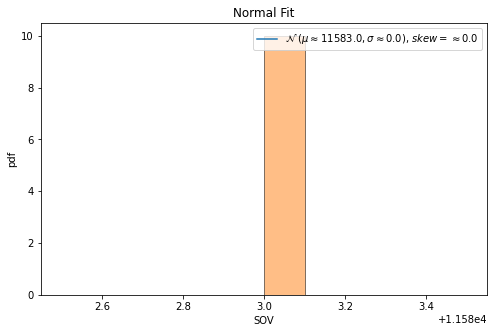


QQ plot 



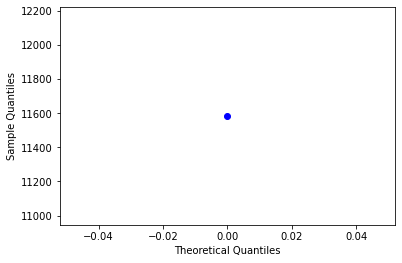

ends normality test ------------------------------------------------

feature name=  EOG
max value =  1.5013145096459162 min value =  1.5013145096459162
mean=  1.5013145096459162 standard deviation=  0.0
left range=  1.5013145096459162 right range=  1.5013145096459162
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-289-ee5c76fd08d8>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-289-ee5c76fd08d8>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


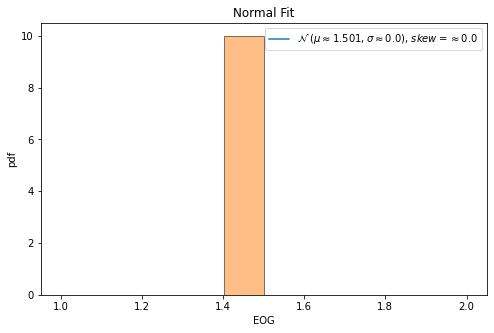


QQ plot 



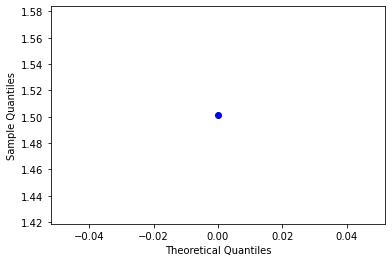

ends normality test ------------------------------------------------

feature name=  RCH
max value =  0.050571527537235886 min value =  0.050571527537235886
mean=  0.050571527537235886 standard deviation=  0.0
left range=  0.050571527537235886 right range=  0.050571527537235886
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-289-ee5c76fd08d8>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-289-ee5c76fd08d8>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


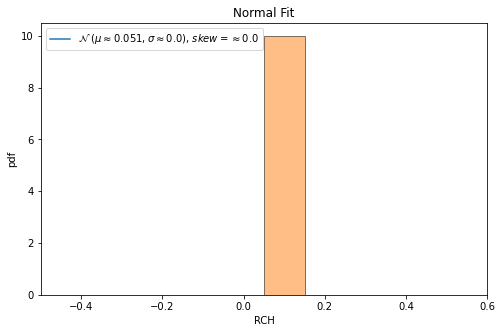


QQ plot 



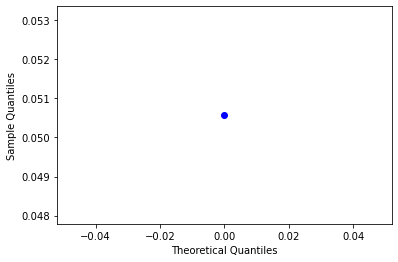

ends normality test ------------------------------------------------

feature name=  CYC
max value =  4861 min value =  4861
mean=  4861.0 standard deviation=  0.0
left range=  4861.0 right range=  4861.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-289-ee5c76fd08d8>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-289-ee5c76fd08d8>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


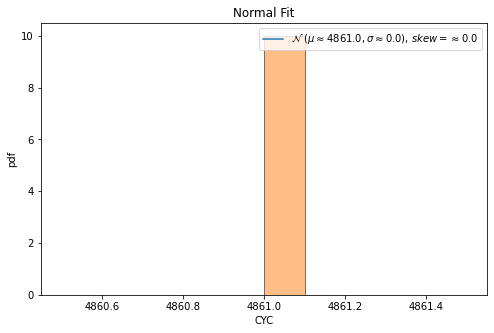


QQ plot 



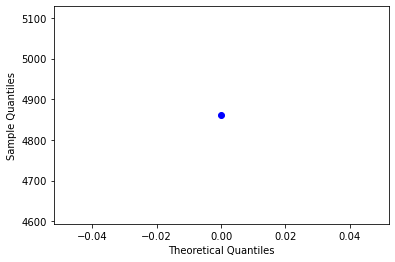

ends normality test ------------------------------------------------

feature name=  HGCI
max value =  411 min value =  411
mean=  411.0 standard deviation=  0.0
left range=  411.0 right range=  411.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-289-ee5c76fd08d8>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-289-ee5c76fd08d8>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


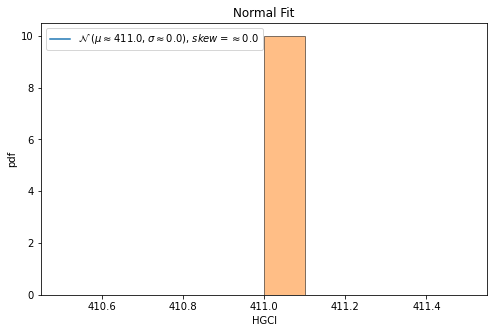


QQ plot 



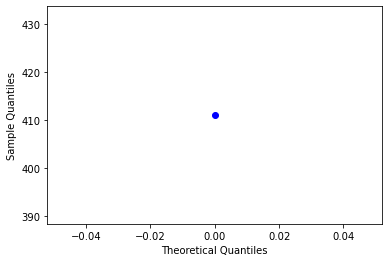

ends normality test ------------------------------------------------

feature name=  ELCLSPRT
max value =  0.9494226327944572 min value =  0.9494226327944572
mean=  0.9494226327944572 standard deviation=  0.0
left range=  0.9494226327944572 right range=  0.9494226327944572
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-289-ee5c76fd08d8>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-289-ee5c76fd08d8>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


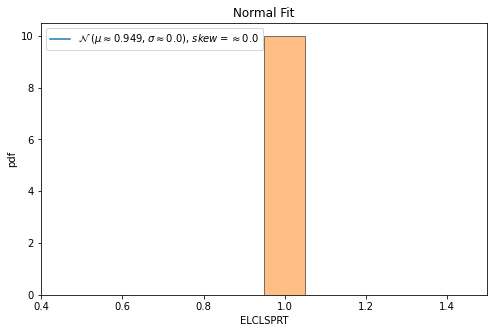


QQ plot 



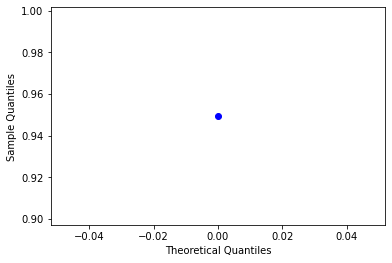

ends normality test ------------------------------------------------

feature name=  ELAXPRT
max value =  0.948446490218642 min value =  0.948446490218642
mean=  0.948446490218642 standard deviation=  0.0
left range=  0.948446490218642 right range=  0.948446490218642
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-289-ee5c76fd08d8>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-289-ee5c76fd08d8>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


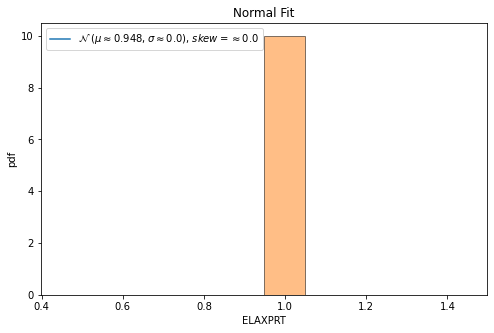


QQ plot 



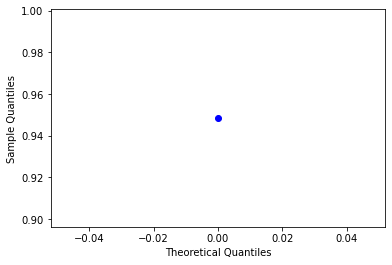

ends normality test ------------------------------------------------

feature name=  HLC
max value =  43 min value =  43
mean=  43.0 standard deviation=  0.0
left range=  43.0 right range=  43.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-289-ee5c76fd08d8>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-289-ee5c76fd08d8>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


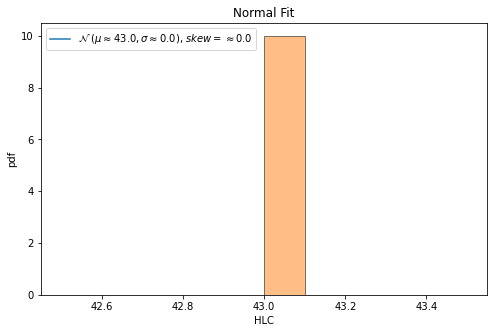


QQ plot 



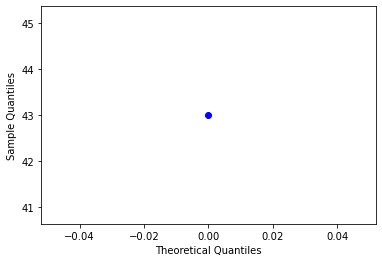

ends normality test ------------------------------------------------

feature name=  IHR
max value =  0 min value =  0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-289-ee5c76fd08d8>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-289-ee5c76fd08d8>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


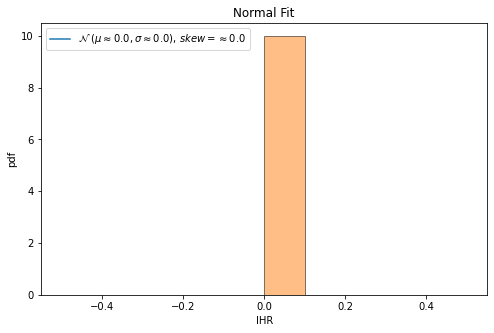


QQ plot 



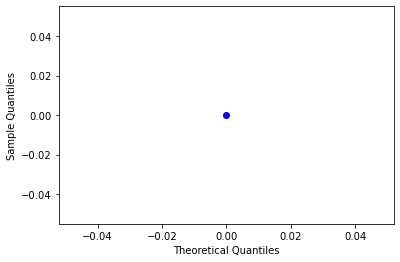

ends normality test ------------------------------------------------

feature name=  ITR
max value =  0 min value =  0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-289-ee5c76fd08d8>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-289-ee5c76fd08d8>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


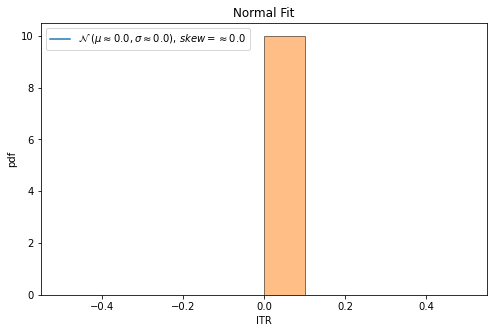


QQ plot 



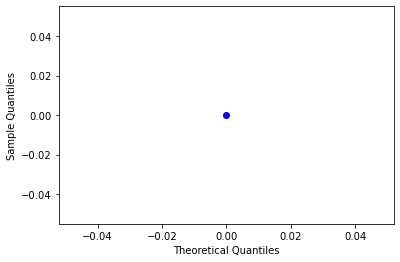

ends normality test ------------------------------------------------

feature name=  IND
max value =  661 min value =  661
mean=  661.0 standard deviation=  0.0
left range=  661.0 right range=  661.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-289-ee5c76fd08d8>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-289-ee5c76fd08d8>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


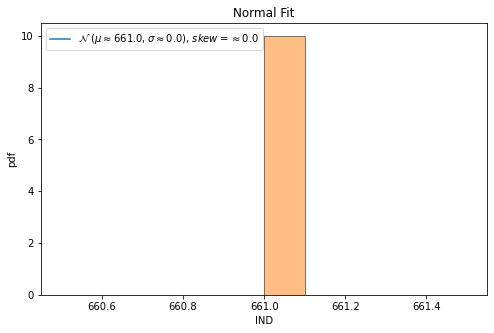


QQ plot 



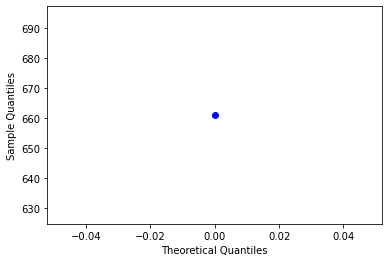

ends normality test ------------------------------------------------

feature name=  mNOC
max value =  254 min value =  254
mean=  254.0 standard deviation=  0.0
left range=  254.0 right range=  254.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-289-ee5c76fd08d8>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-289-ee5c76fd08d8>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


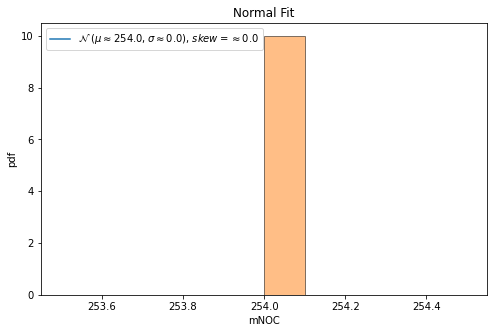


QQ plot 



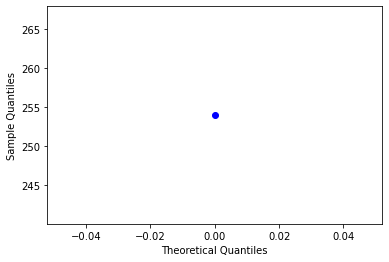

ends normality test ------------------------------------------------

feature name=  tNOC
max value =  8261 min value =  8261
mean=  8261.0 standard deviation=  0.0
left range=  8261.0 right range=  8261.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-289-ee5c76fd08d8>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-289-ee5c76fd08d8>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


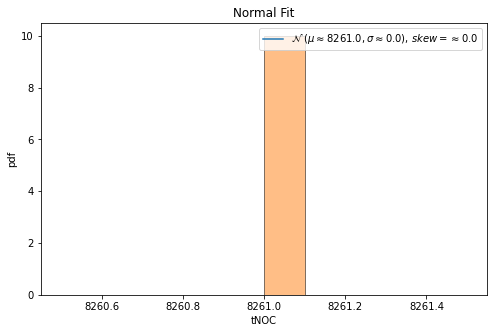


QQ plot 



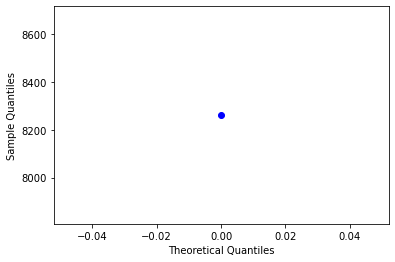

ends normality test ------------------------------------------------

feature name=  aCID
max value =  1.1301235423161298 min value =  1.1301235423161298
mean=  1.1301235423161298 standard deviation=  0.0
left range=  1.1301235423161298 right range=  1.1301235423161298
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-289-ee5c76fd08d8>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-289-ee5c76fd08d8>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


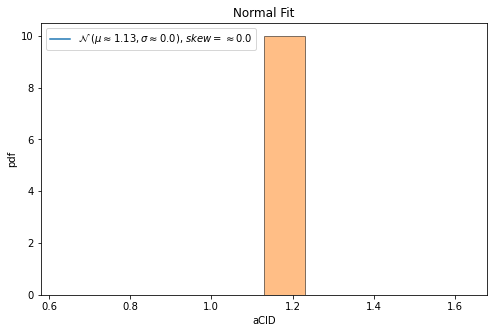


QQ plot 



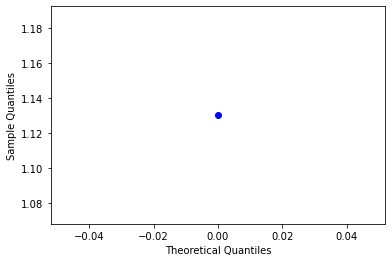

ends normality test ------------------------------------------------

feature name=  tCID
max value =  9788 min value =  9788
mean=  9788.0 standard deviation=  0.0
left range=  9788.0 right range=  9788.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-289-ee5c76fd08d8>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-289-ee5c76fd08d8>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


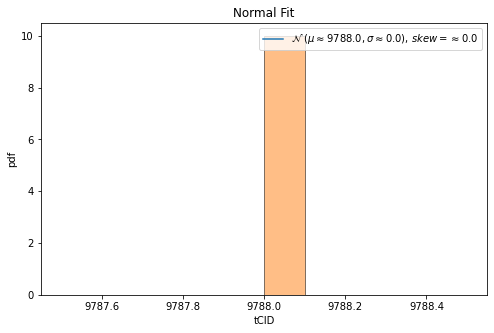


QQ plot 



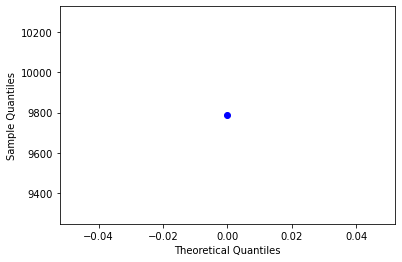

ends normality test ------------------------------------------------

feature name=  aCOD
max value =  1.1050686987645768 min value =  1.1050686987645768
mean=  1.1050686987645768 standard deviation=  0.0
left range=  1.1050686987645768 right range=  1.1050686987645768
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-289-ee5c76fd08d8>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-289-ee5c76fd08d8>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


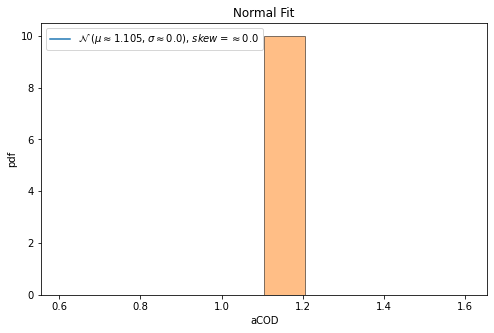


QQ plot 



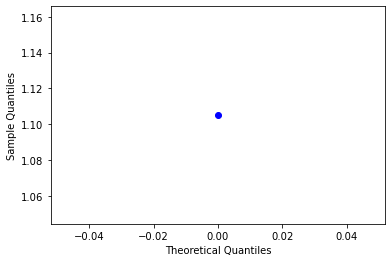

ends normality test ------------------------------------------------

feature name=  mCOD
max value =  8 min value =  8
mean=  8.0 standard deviation=  0.0
left range=  8.0 right range=  8.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-289-ee5c76fd08d8>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-289-ee5c76fd08d8>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


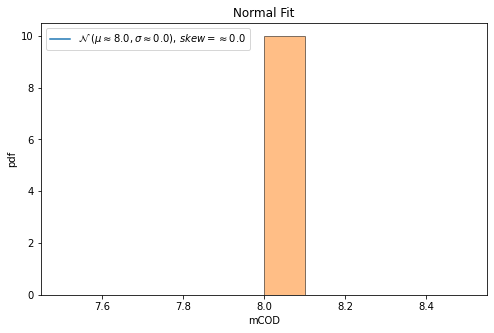


QQ plot 



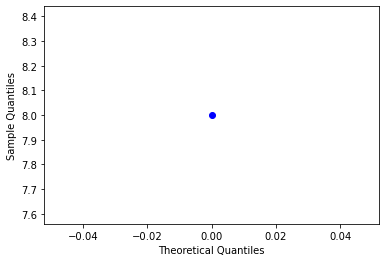

ends normality test ------------------------------------------------

feature name=  tCOD
max value =  9571 min value =  9571
mean=  9571.0 standard deviation=  0.0
left range=  9571.0 right range=  9571.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-289-ee5c76fd08d8>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-289-ee5c76fd08d8>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


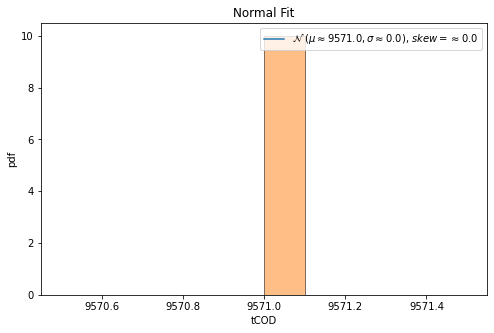


QQ plot 



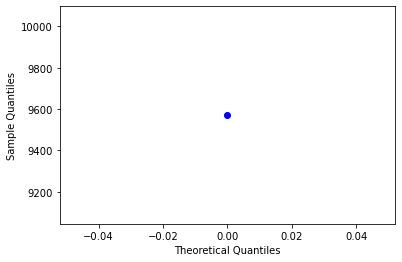

ends normality test ------------------------------------------------

feature name=  aNOP
max value =  1.0048493245583652 min value =  1.0048493245583652
mean=  1.0048493245583652 standard deviation=  0.0
left range=  1.0048493245583652 right range=  1.0048493245583652
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-289-ee5c76fd08d8>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-289-ee5c76fd08d8>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


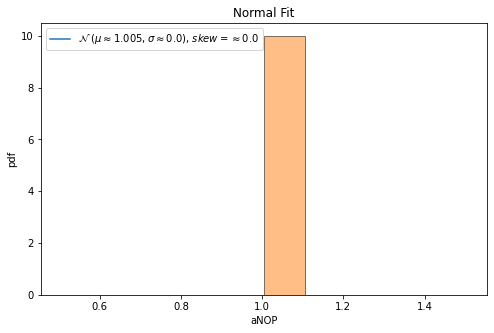


QQ plot 



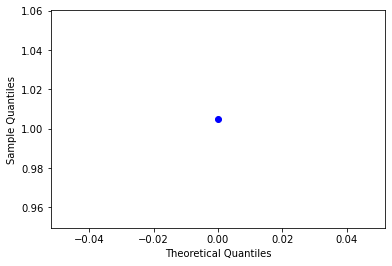

ends normality test ------------------------------------------------

feature name=  mNOP
max value =  7 min value =  7
mean=  7.0 standard deviation=  0.0
left range=  7.0 right range=  7.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-289-ee5c76fd08d8>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-289-ee5c76fd08d8>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


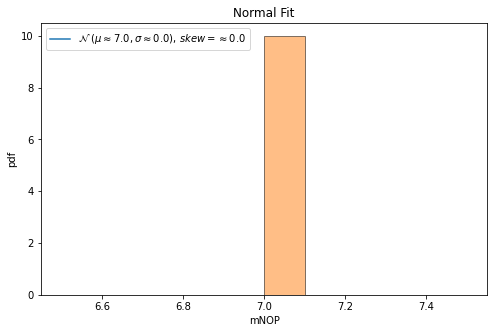


QQ plot 



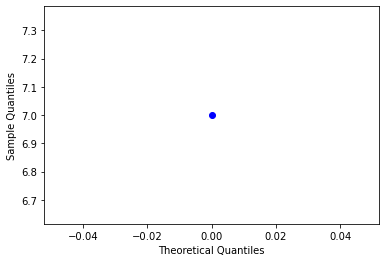

ends normality test ------------------------------------------------

feature name=  tNOP
max value =  8703 min value =  8703
mean=  8703.0 standard deviation=  0.0
left range=  8703.0 right range=  8703.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-289-ee5c76fd08d8>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-289-ee5c76fd08d8>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


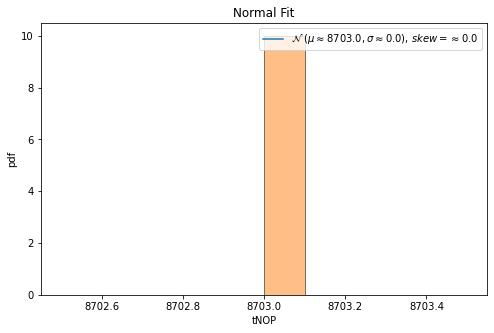


QQ plot 



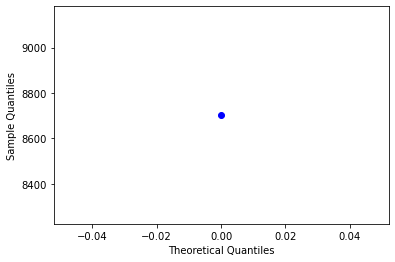

ends normality test ------------------------------------------------

feature name=  CONJ
max value =  0 min value =  0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-289-ee5c76fd08d8>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-289-ee5c76fd08d8>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


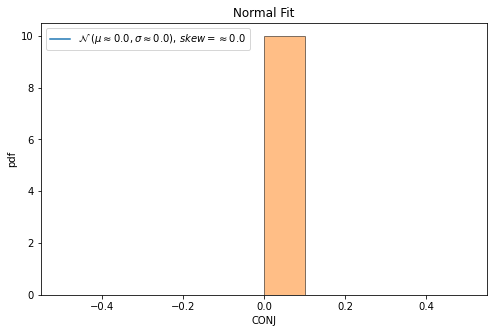


QQ plot 



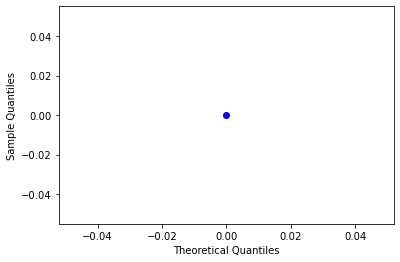

ends normality test ------------------------------------------------

feature name=  CONJP
max value =  0.0 min value =  0.0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-289-ee5c76fd08d8>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-289-ee5c76fd08d8>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


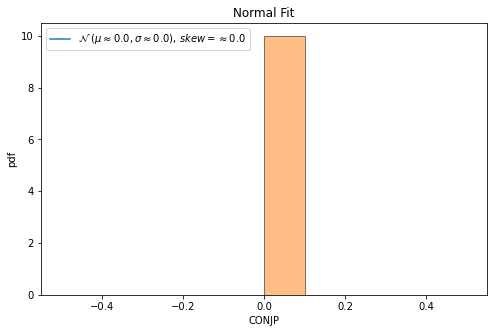


QQ plot 



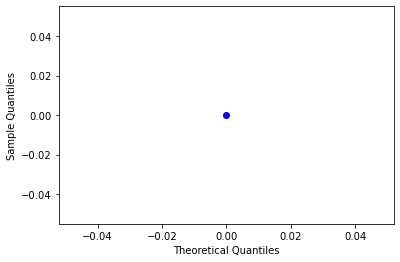

ends normality test ------------------------------------------------

feature name=  DISJ
max value =  2 min value =  2
mean=  2.0 standard deviation=  0.0
left range=  2.0 right range=  2.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-289-ee5c76fd08d8>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-289-ee5c76fd08d8>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


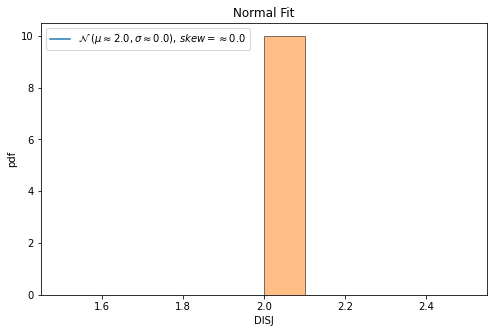


QQ plot 



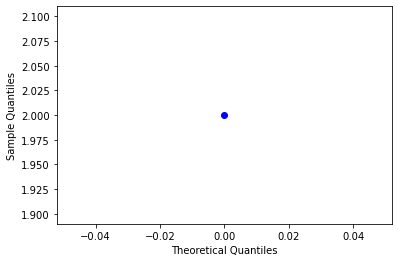

ends normality test ------------------------------------------------

feature name=  UF
max value =  403 min value =  403
mean=  403.0 standard deviation=  0.0
left range=  403.0 right range=  403.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-289-ee5c76fd08d8>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-289-ee5c76fd08d8>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


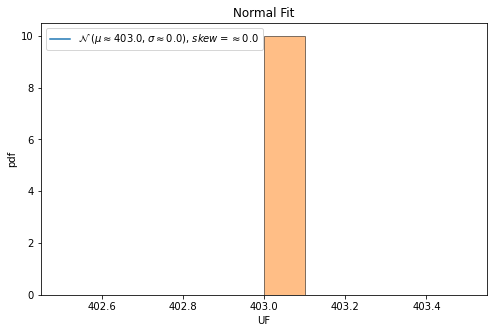


QQ plot 



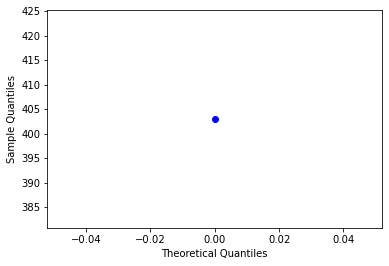

ends normality test ------------------------------------------------

feature name=  UFP
max value =  0.9201 min value =  0.9201
mean=  0.9201 standard deviation=  0.0
left range=  0.9201 right range=  0.9201
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-289-ee5c76fd08d8>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-289-ee5c76fd08d8>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


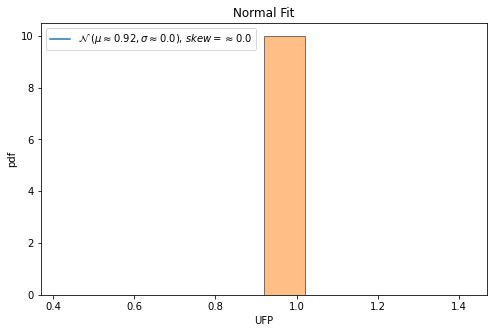


QQ plot 



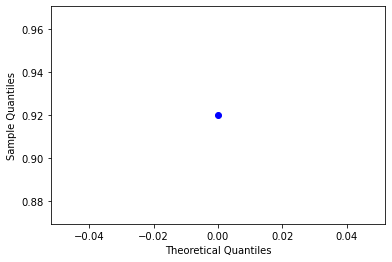

ends normality test ------------------------------------------------

feature name=  EF
max value =  0 min value =  0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-289-ee5c76fd08d8>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-289-ee5c76fd08d8>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


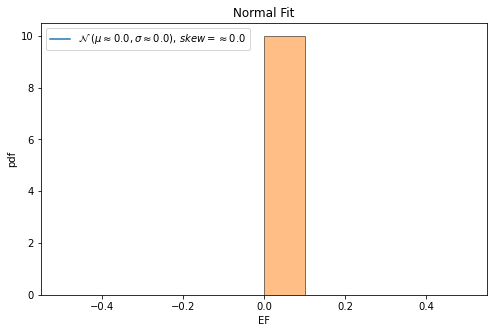


QQ plot 



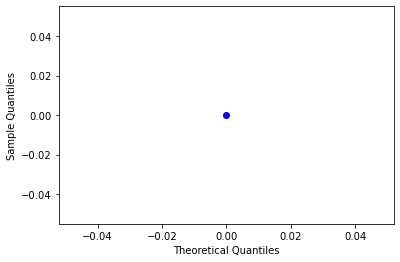

ends normality test ------------------------------------------------

feature name=  EFP
max value =  0.0 min value =  0.0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-289-ee5c76fd08d8>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-289-ee5c76fd08d8>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


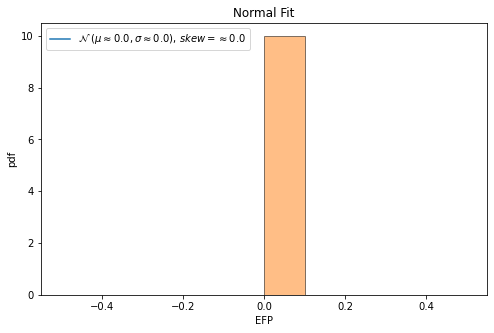


QQ plot 



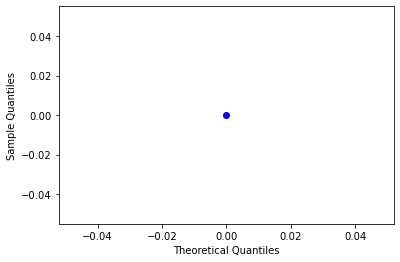

ends normality test ------------------------------------------------

feature name=  VALUE
max value =  31 min value =  31
mean=  31.0 standard deviation=  0.0
left range=  31.0 right range=  31.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-289-ee5c76fd08d8>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-289-ee5c76fd08d8>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


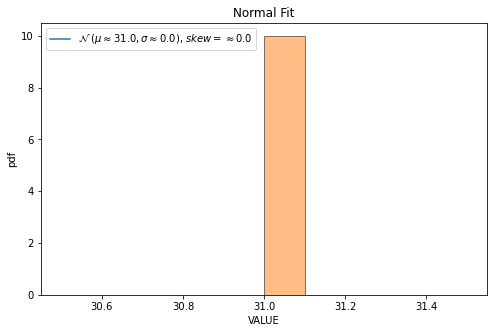


QQ plot 



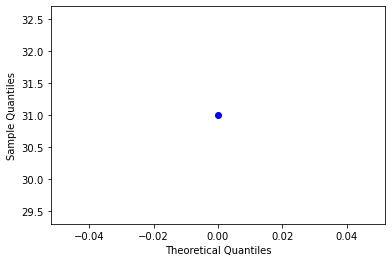

ends normality test ------------------------------------------------

feature name=  VALUEP
max value =  0.0708 min value =  0.0708
mean=  0.0708 standard deviation=  0.0
left range=  0.0708 right range=  0.0708
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-289-ee5c76fd08d8>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-289-ee5c76fd08d8>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


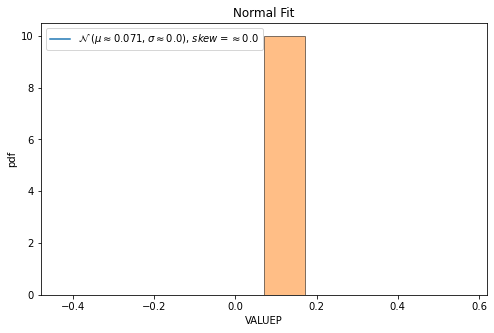


QQ plot 



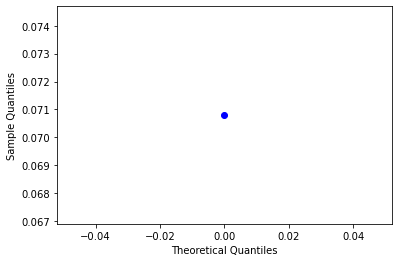

ends normality test ------------------------------------------------

feature name=  MNCARP
max value =  0.0023 min value =  0.0023
mean=  0.0023 standard deviation=  0.0
left range=  0.0023 right range=  0.0023
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-289-ee5c76fd08d8>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-289-ee5c76fd08d8>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


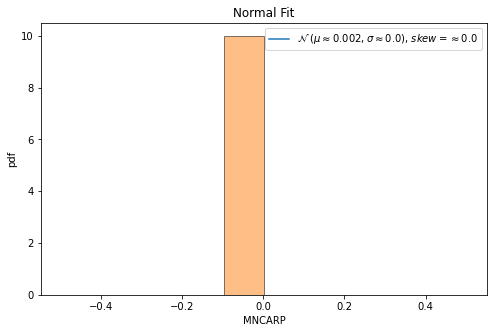


QQ plot 



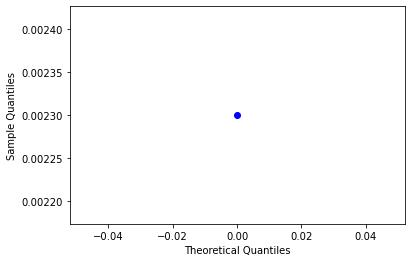

ends normality test ------------------------------------------------

feature name=  CARP
max value =  0.0023 min value =  0.0023
mean=  0.0023 standard deviation=  0.0
left range=  0.0023 right range=  0.0023
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-289-ee5c76fd08d8>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-289-ee5c76fd08d8>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


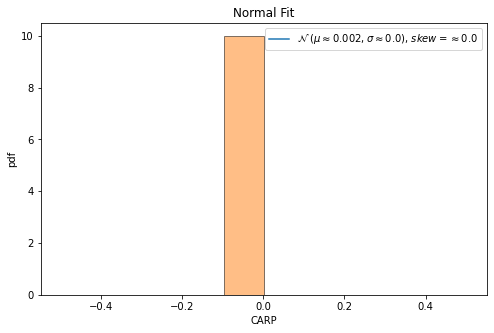


QQ plot 



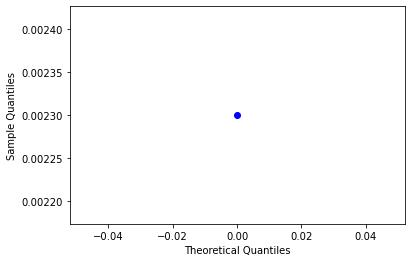

ends normality test ------------------------------------------------

feature name=  OBP
max value =  3 min value =  3
mean=  3.0 standard deviation=  0.0
left range=  3.0 right range=  3.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-289-ee5c76fd08d8>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-289-ee5c76fd08d8>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


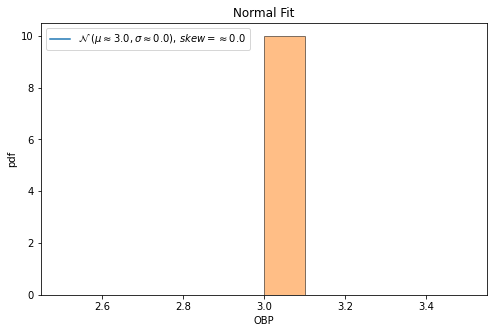


QQ plot 



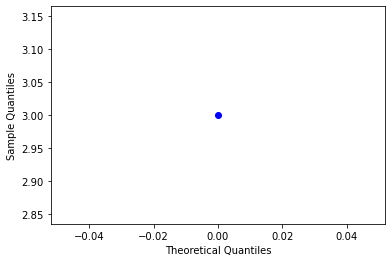

ends normality test ------------------------------------------------

feature name=  DTP
max value =  25 min value =  25
mean=  25.0 standard deviation=  0.0
left range=  25.0 right range=  25.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-289-ee5c76fd08d8>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-289-ee5c76fd08d8>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


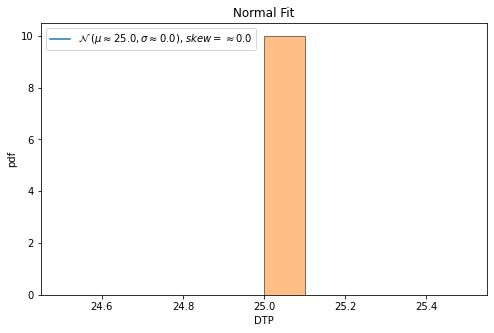


QQ plot 



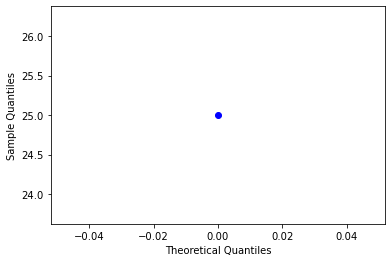

ends normality test ------------------------------------------------

feature name=  DTPP
max value =  0.8929 min value =  0.8929
mean=  0.8929 standard deviation=  0.0
left range=  0.8929 right range=  0.8929
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-289-ee5c76fd08d8>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-289-ee5c76fd08d8>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


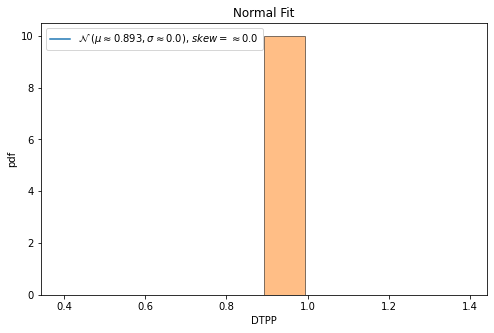


QQ plot 



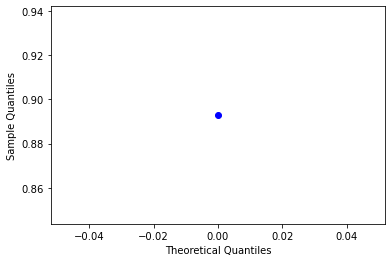

ends normality test ------------------------------------------------

feature name=  SYM
max value =  0 min value =  0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-289-ee5c76fd08d8>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-289-ee5c76fd08d8>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


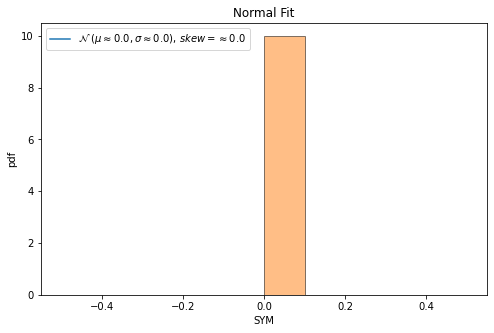


QQ plot 



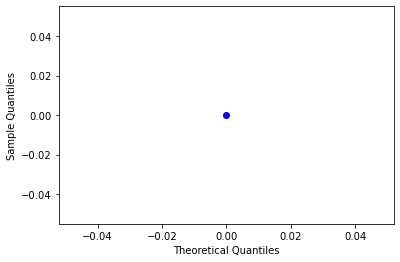

ends normality test ------------------------------------------------

feature name=  TRN
max value =  0 min value =  0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-289-ee5c76fd08d8>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-289-ee5c76fd08d8>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


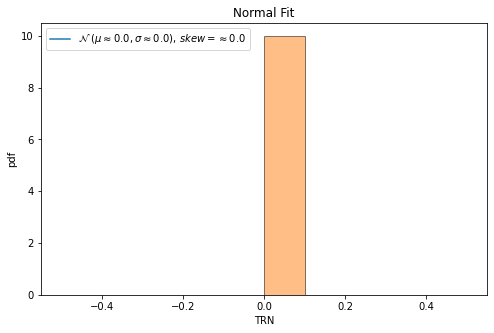


QQ plot 



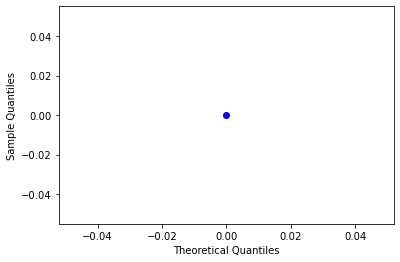

ends normality test ------------------------------------------------

feature name=  IFUNP
max value =  0.0 min value =  0.0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-289-ee5c76fd08d8>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-289-ee5c76fd08d8>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


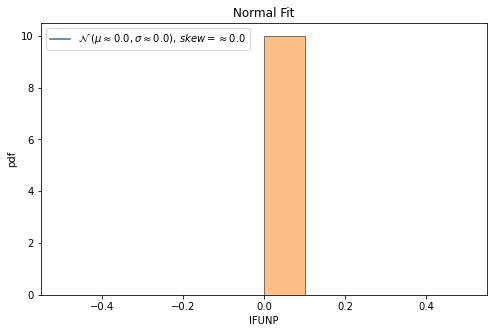


QQ plot 



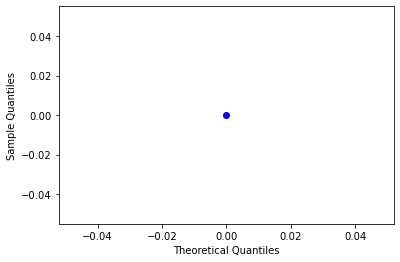

ends normality test ------------------------------------------------

feature name=  SUBP
max value =  0 min value =  0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-289-ee5c76fd08d8>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-289-ee5c76fd08d8>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


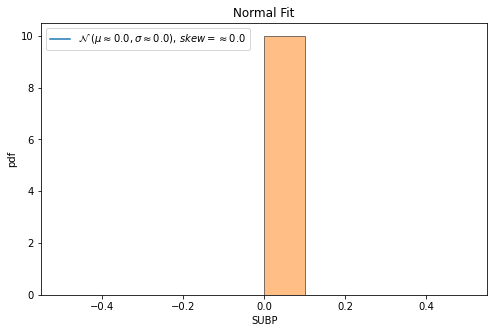


QQ plot 



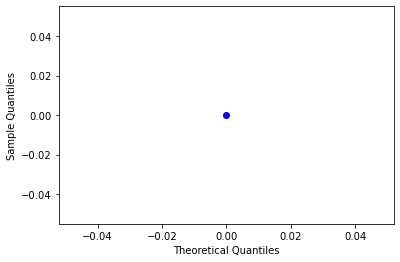

ends normality test ------------------------------------------------

feature name=  INV
max value =  1 min value =  1
mean=  1.0 standard deviation=  0.0
left range=  1.0 right range=  1.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-289-ee5c76fd08d8>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-289-ee5c76fd08d8>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


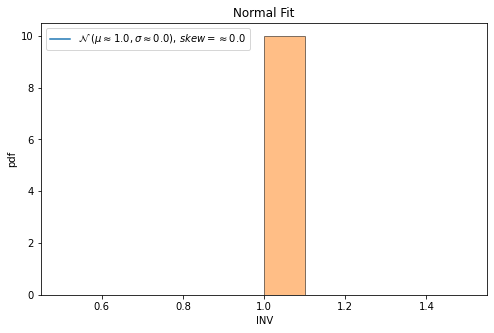


QQ plot 



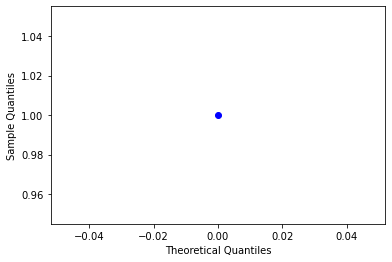

ends normality test ------------------------------------------------

feature name=  DOMN
max value =  27 min value =  27
mean=  27.0 standard deviation=  0.0
left range=  27.0 right range=  27.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-289-ee5c76fd08d8>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-289-ee5c76fd08d8>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


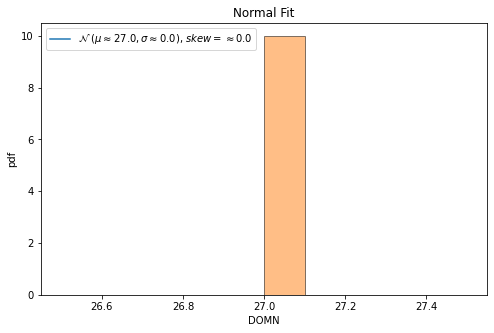


QQ plot 



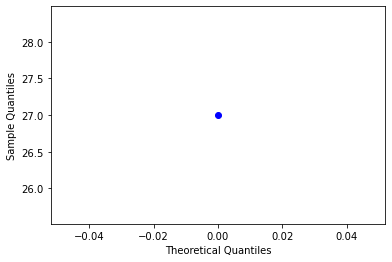

ends normality test ------------------------------------------------

feature name=  CHNP
max value =  0.0 min value =  0.0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-289-ee5c76fd08d8>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-289-ee5c76fd08d8>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


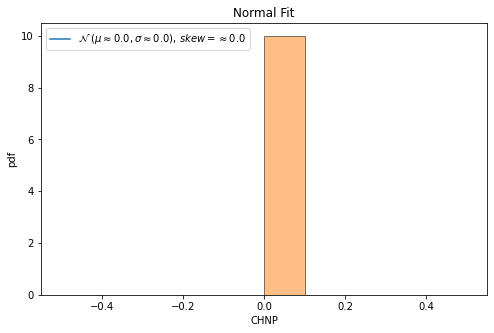


QQ plot 



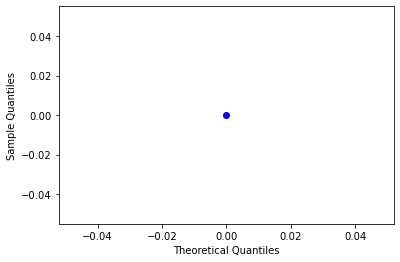

ends normality test ------------------------------------------------

feature name=  ELPROP
max value =  0.986842105263158 min value =  0.986842105263158
mean=  0.986842105263158 standard deviation=  0.0
left range=  0.986842105263158 right range=  0.986842105263158
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-289-ee5c76fd08d8>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-289-ee5c76fd08d8>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


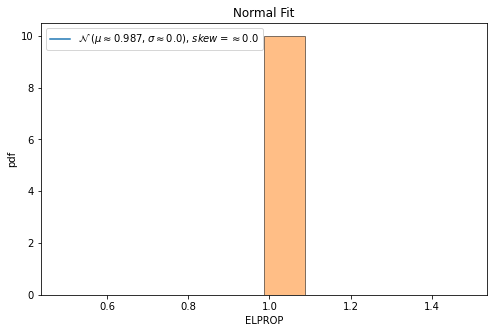


QQ plot 



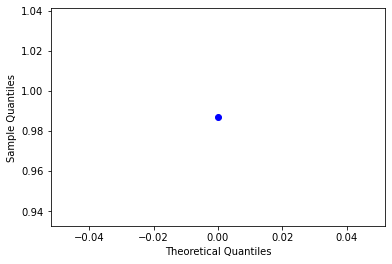

ends normality test ------------------------------------------------

feature name=  CAL_TIME
max value =  510 min value =  510
mean=  510.0 standard deviation=  0.0
left range=  510.0 right range=  510.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-289-ee5c76fd08d8>:104: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-289-ee5c76fd08d8>:105: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


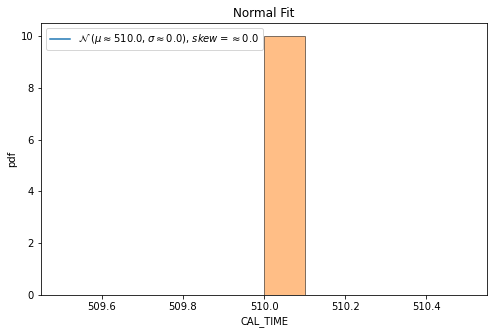


QQ plot 



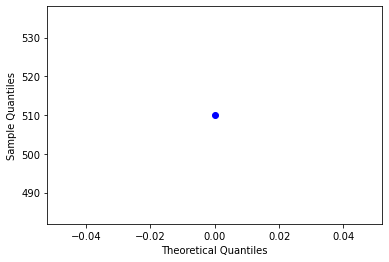

ends normality test ------------------------------------------------



In [289]:
#**** follow the same notation as explained above in 'easy time easy memory' category wherever required*******#


#after hard time and memory clusering ,
#collect the hard ones

from matplotlib import pyplot as plt
%matplotlib inline
#%matplotlib qt 
import scipy
from scipy.stats import norm
from statsmodels.graphics.gofplots import qqplot
import statistics
from scipy.stats import shapiro
from scipy.stats import normaltest
import math
#interquratile range 
def cal(sov_sort):
    p=0
    l=len(sov_sort)
    left=0
    right=0
    while  p < 90 :
        if p==0:
            if l % 2 ==0:
                left=( l /2)
                right=( l / 2) + 1
                p= round((((right -left +1) / l) * 100),2)
                
            else:
                left=math.floor( l /2)
                right=math.ceil(l/2) + 1
                p= round((((right -left +1) / l) * 100),2)
                
        else:
            if left % 2 !=0:
                left = math.ceil(left/2)
            else:
                left = left /2
            
            dist = l - right +1
            if dist % 2 !=0:
                right = right + math.ceil(dist/2)
            else:
                right = right + (dist /2)
                
            p= round((((right -left +1) / l) * 100),2)
        
    return left-1,right-1





print(df_hard_time_mem_feature_df.shape)
hard_time_mem_hard= df_hard_time_mem_feature_df[df_hard_time_mem_feature_df['label_mem']== 'hard']
print(hard_time_mem_hard.shape)
prior_hard= round(hard_time_mem_hard.shape[0] / df_hard_time_mem_feature_df.shape[0] ,5)

main_dict_htmh={}
main_dict_htmh_iqr={}

for i in range(len(cols_list)):
    if cols_list[i] in top_n_3:
        tmp_dict={}
        tmp_dict_iqr={}
        
        feature = cols_list[i]
        print("feature name= ",feature)
        
        sov=np.array(hard_time_mem_hard[feature])
        sov_1=(np.sort(sov))
        skew=scipy.stats.skew(sov)
        
        tmp_dict["skew"]=round(skew,4)
        tmp_dict_iqr["skew"]=round(skew,4)
        
        if -2 < skew and skew < 2:
        
            print("max value = ",np.max(sov),"min value = ",np.min(sov))
            tmp_dict["min"]=round(np.min(sov),9)
            tmp_dict["max"]=round(np.max(sov),9)
            min_val=np.min(sov)
            max_val=np.max(sov)

            mean = np.mean(sov)
            std = np.std(sov)
            print("mean= ",mean,"standard deviation= ",std)
            tmp_dict["mean"]=round(mean,9)
            tmp_dict["std"]=round(std,9)
            #gamma=2
            #rx= mean - ((1- prior_hard) *gamma * std) 
            #ry= mean + ((1- prior_hard) *gamma * std)
            l_weight=0.5
            r_weight=0.5
            rx= mean - (l_weight* std) 
            ry= mean + (r_weight* std)
            print("left range= ",rx,"right range= ", ry)
            tmp_dict["lw_i"]=round(l_weight,9)
            tmp_dict["rw_i"]=round(r_weight,9)
            tmp_dict["lr"]=round(rx,9)
            tmp_dict["rr"]=round(ry,9)

            min_val_w= round(((mean - min_val) /std ),9)
            max_val_w= round(((max_val - mean) /std ),9)
            print(min_val_w,max_val_w)
            if math.isnan(min_val_w):
                    tmp_dict["min_val_w"]="null"
            else:
                    tmp_dict["min_val_w"]=round(min_val_w,9)
            
            if math.isnan(max_val_w):
                    tmp_dict["max_val_w"]="null"
            else:
                tmp_dict["max_val_w"]=round(max_val_w,9)


            val=(((rx <= sov) & (sov <= ry)).sum()) / hard_time_mem_hard.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within this range= ",v,"%")

            tmp_dict["percent_i"]=round(v,9)
            tmp_dict["percent_change"]=round(v,9)

            val=(((min_val <= sov) & (sov <= mean)).sum()) / hard_time_mem_hard.shape[0]
            percent_l =  round((val * 100 ),2)

            val=(((mean <= sov) & (sov <= max_val)).sum()) / hard_time_mem_hard.shape[0]
            percent_r =  round((val * 100 ),2)

            print("percent left and right= ",percent_l,percent_r)
            tmp_dict["percent_l"]=percent_l
            tmp_dict["percent_r"]=percent_r
            
            main_dict_htmh[feature]=tmp_dict
            
        else:
            
            left_index,right_index = cal(sov_1)
            rx=sov_1[int(left_index)]
            ry=sov_1[int(right_index)]

            print("max value = ",np.max(sov),"min value = ",np.min(sov))
            
            tmp_dict_iqr["min"]=round(np.min(sov),9)
            tmp_dict_iqr["max"]=round(np.max(sov),9)
            min_val=np.min(sov)
            max_val=np.max(sov)
            
            
            mean = np.mean(sov)
            std = np.std(sov)
            print("mean= ",mean,"standard deviation= ",std)
            tmp_dict_iqr["mean"]=round(mean,9)
            tmp_dict_iqr["std"]=round(std,9)
            
            print("left range= ",rx,"right range= ", ry)
            tmp_dict_iqr["lw_i"]="null"
            tmp_dict_iqr["rw_i"]="null"
            tmp_dict_iqr["lr"]=round(rx,9)
            tmp_dict_iqr["rr"]=round(ry,9)
            
            
            tmp_dict_iqr["min_val_w"]="null"
            tmp_dict_iqr["max_val_w"]="null"
            tmp_dict_iqr["percent_i"]="null"
            val=(((rx <= sov) & (sov <= ry)).sum()) / hard_time_mem_hard.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within this range= ",v,"%")
            tmp_dict_iqr["percent_change"]=round(v,9)
            
            val=(((min_val <= sov) & (sov <= mean)).sum()) / hard_time_mem_hard.shape[0]
            percent_l =  round((val * 100 ),2)

            val=(((mean <= sov) & (sov <= max_val)).sum()) / hard_time_mem_hard.shape[0]
            percent_r =  round((val * 100 ),2)

            print("percent left and right= ",percent_l,percent_r)
            
            tmp_dict_iqr["percent_l"]=percent_l
            tmp_dict_iqr["percent_r"]=percent_r
            
            main_dict_htmh_iqr[feature]=tmp_dict_iqr


            # 68–95–99.7 rule, also known as the empirical rule

            # for 1*std
            left = mean - std
            right = mean + std
            val=(((left <= sov) & (sov <= right)).sum()) / hard_time_mem_hard.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 1 standard deviation= ",v,"%")

            # for 2*std
            left = mean - (2*std)
            right = mean + (2*std)
            val=(((left <= sov) & (sov <= right)).sum()) / hard_time_mem_hard.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 2 standard deviation= ",v,"%")



            # for 3*std
            left = mean - (3*std)
            right = mean + (3*std)
            val=(((left <= sov) & (sov <= right)).sum()) / hard_time_mem_hard.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 3 standard deviation= ",v,"%")
  
            
        print("\n\n")
        
        #normality test
        print("normality test :----\n")
        # kurtosis and skew function
        kurt=scipy.stats.kurtosis(sov)
        print("kurtosis value= ",kurt)
        
        
        print("skewness value= ",skew)
        
        
        
        #plotting graph for to see the skewess
        sov_1=np.sort(sov)
        fig, ax1 = plt.subplots(1, 1, figsize=(8,5))
        ax1.plot(sov_1, norm.pdf(sov_1, mean, std),label='$\mathcal{N}$ '+ f'$( \mu \\approx {round(mean,3)} , \sigma \\approx {round(std,3)})$, $ skew = \\approx {round(skew,3)}$')
        ax1.hist(sov_1,edgecolor='black',alpha=0.5,density= True)
        ax1.set_title("Normal Fit")
        ax1.set_xlabel(feature)
        ax1.set_ylabel("pdf")
        ax1.legend()
        #plt.savefig('/home/ritam/ontology_hardness/normal_curve_&_skewness/hard_time_hard_memory/'+str(feature)+'.jpeg')
        plt.show()
        
        # Quantile-Quantile Plot Nomrality check
        print("\nQQ plot \n")
        qqplot(sov_1, line='s')
        plt.show()
        ''''
        #Statistical Normality Tests
        # Shapiro-Wilk Test
        print("\n Shapiro-Wilk Test \n ")
        #stat, p = shapiro(sov_1[0:4998])
        stat, p = normaltest(sov_1)
        print('Statistics=%.3f, p=%f' % (stat, p))
        
        alpha = 0.05
        if p > alpha:
            print('Sample looks Gaussian (fail to reject H0)')
        else:
            print('Sample does not look Gaussian (reject H0)')
        '''   
        print("ends normality test ------------------------------------------------\n")
        
        

In [290]:
#**** follow the same notation as explained above in 'easy time easy memory' category wherever required*******#

import copy

main_dict_cal_htmh={}
dec_rate=[(0.9,0.9)]
for i in range(len(dec_rate)):
 
    main_dict_cal_htmh=copy.deepcopy(main_dict_htmh)
    lower_r=dec_rate[i][0]
    high_r=dec_rate[i][1]
    for j in range (100):
        c=0
        for key,value in main_dict_cal_htmh.items():
            
            if value["percent_change"] < 90:

                lw_i_temp=value["lw_i"]
                rw_i_temp=value["rw_i"]
                if value["percent_l"] >= 50:
                    diff=value["min_val_w"] - lw_i_temp
                    frac = round(lower_r * diff, 9)  

                    lw_i_temp= round(lw_i_temp + frac , 9)
                    main_dict_cal_htmh[key]["lw_i"]=lw_i_temp
                else:
                    diff=value["min_val_w"] - lw_i_temp
                    frac = round(high_r * diff, 9)  

                    lw_i_temp= round(lw_i_temp + frac ,9 )
                    main_dict_cal_htmh[key]["lw_i"]=lw_i_temp

                if value["percent_r"] >= 50:
                    diff=value["max_val_w"] - rw_i_temp
                    frac = round(lower_r * diff, 9)  

                    rw_i_temp= round(rw_i_temp + frac , 9 )
                    main_dict_cal_htmh[key]["rw_i"]=rw_i_temp
                else:
                    diff=value["max_val_w"] - rw_i_temp
                    frac = round(high_r * diff, 9)  

                    rw_i_temp= round(rw_i_temp + frac ,9 )
                    main_dict_cal_htmh[key]["rw_i"]=rw_i_temp

                sov=np.array(hard_time_mem_hard[key])
                rx= round(value["mean"] - (lw_i_temp* value["std"]) ,9)
                ry= round(value["mean"] + (rw_i_temp* value["std"]),9)
                main_dict_cal_htmh[key]["lr"]=round(rx,9)
                main_dict_cal_htmh[key]["rr"]=round(ry,9)

                val=(((rx <= sov) & (sov <= ry)).sum()) / hard_time_mem_hard.shape[0]
                v =  round((val * 100 ),2)
                main_dict_cal_htmh[key]["percent_change"]=v

                if v >=85:
                    c=c+1
            else:
                c=c+1
        p=round(c / len(list(main_dict_cal_htmh.keys())),2)
        print ("percent in loop ",j , "covers ", p , "%" )


percent in loop  0 covers  1.0 %
percent in loop  1 covers  1.0 %
percent in loop  2 covers  1.0 %
percent in loop  3 covers  1.0 %
percent in loop  4 covers  1.0 %
percent in loop  5 covers  1.0 %
percent in loop  6 covers  1.0 %
percent in loop  7 covers  1.0 %
percent in loop  8 covers  1.0 %
percent in loop  9 covers  1.0 %
percent in loop  10 covers  1.0 %
percent in loop  11 covers  1.0 %
percent in loop  12 covers  1.0 %
percent in loop  13 covers  1.0 %
percent in loop  14 covers  1.0 %
percent in loop  15 covers  1.0 %
percent in loop  16 covers  1.0 %
percent in loop  17 covers  1.0 %
percent in loop  18 covers  1.0 %
percent in loop  19 covers  1.0 %
percent in loop  20 covers  1.0 %
percent in loop  21 covers  1.0 %
percent in loop  22 covers  1.0 %
percent in loop  23 covers  1.0 %
percent in loop  24 covers  1.0 %
percent in loop  25 covers  1.0 %
percent in loop  26 covers  1.0 %
percent in loop  27 covers  1.0 %
percent in loop  28 covers  1.0 %
percent in loop  29 cove

In [291]:
#**** follow the same notation as explained above in 'easy time easy memory' category wherever required*******#

main_dict_cal_htmh
print(len(main_dict_cal_htmh),len(main_dict_htmh_iqr))
htmh_pd=pd.DataFrame(main_dict_cal_htmh)
htmh_iqr_pd=pd.DataFrame(main_dict_htmh_iqr)

frames = [htmh_pd,htmh_iqr_pd]
result = pd.concat(frames,axis=1)
result
#result.to_csv("htmh_ranges.csv")


50 0


In [292]:
hard_time_mem_hard #contains 1 ontolgy in this category

,file,size_kb,consistency_time_milsecs,consistency_size_kb,realisation_time_milsecs,realisation_size_kb,classification_time_milsecs,classification_size_kb,SOV,ENR,...,EQVP,DISP,INV,DOMN,RANG,CHN,CHNP,ELPROP,CAL_TIME,label_mem
3,107b3d41-1458-4d46-ae69-d1ba712085a2_EnzyO0616...,5547,21600449,17684888,21600430,17534216,21600584,24260664,11583,1.386573,...,0,0,1,27,28,0,0.0,0.986842,510,hard


In [293]:
#--------------this ends the range calculation ------------------------------

In [294]:
x_easy

size_kb                        consistency_time_milsecs          \
              min     max           mean                      min     max   
label_mem                                                                   
easy           14  640425    2903.799425                       13  120335   
hard        11829  260201   66778.818182                    97796  279132   
medium        162  543808  174624.181818                    18699  308466   

                         consistency_size_kb                           \
                    mean                 min        max          mean   
label_mem                                                               
easy          377.048202               14532   21437240  5.808478e+04   
hard       191529.545455            99630024  128838488  1.220439e+08   
medium     155552.272727            25593828   80439780  4.601777e+07   

          realisation_time_milsecs  ...        CHN CHNP                      \
                               min  ...       mean  min       max      mean   
label_mem                           ...                                       
easy                            17  ...   3.610717  0.0  1.732673  0.044894   
hard                        112002  ...  10.181818  0.0  0.229885  0.070041   
medium                        7085  ...   3.636364  0.0  0.081633  0.036165   

             ELPROP                     CAL_TIME                          
                min       max      mean      min      max           mean  
label_mem                                                                 
easy       0.000000  1.000000  0.823469        0  7193760    3414.851358  
hard       0.838828  0.948187  0.864427     1520  5520890  552780.909091  
medium     0.000000  0.992188  0.569143      450   929310  253535.454545  

[3 rows x 297 columns]

In [295]:
#(easy_feature_sort_dic)
#medium_feature_sort_dic
#hard_feature_sort_dic
# =====   this section finds the intersection of top n features from easy time ,medium time and hard time category

n=50

easy_top_n_features=dict(list(easy_feature_sort_dic.items())[:n])  # top n features of easy time ontologies with 
                                                                   # their importance value
medium_top_n_features=dict(list(medium_feature_sort_dic.items())[:n]) # top n features of medium time ontologies
hard_top_n_features=dict(list(hard_feature_sort_dic.items())[:n]) # top n features of hard time ontologies

easy_key=list(easy_top_n_features.keys())
medium_key=list(medium_top_n_features.keys())
hard_key=list(hard_top_n_features.keys())

def intersection(lst1, lst2):
    return list(set(lst1) & set(lst2))
  
inter1 = (intersection(easy_key, medium_key))
print(len(inter1))

inter2 = (intersection(inter1, hard_key))
print("No of common features of first 3 categories= ",len(inter2))


main=[]
rows=[]
for i in range(len(inter2)):
    f=inter2[i]
    rows.append(f)
    tmp=[]
    l1=list(x_easy[f]['mean'])
    for j in range(len(l1)):
        tmp.append(round(l1[j],4))
    
    l2=list(x_medium[f]['mean'])
    for j in range(len(l2)):
        tmp.append(round(l2[j],4))
    
    l3=list(x_hard[f]['mean'])
    for j in range(len(l3)):
        tmp.append(round(l3[j],4))
    
    main.append(tmp)
    

34
No of common features of first 3 categories=  25


In [296]:
print(len(main))
cols=['easy_time_easy_mem','easy_time_hard_mem','easy_time_medium_mem','medium_time_easy_mem','medium_time_hard_mem',
      'medium_time_medium_mem','hard_time_easy_mem','hard_time_hard_mem','hard_time_medium_mem']
top_n_mean_feature=pd.DataFrame(data=main,columns=cols,index=rows)
top_n_mean_feature   # this contains common features with their mean values in each of the 9 category
#top_n_mean_feature.to_csv("common_features.csv") 

25


In [297]:
''''
import pickle
p1 = open("easy_time_mem_easy","wb")
pickle.dump(easy_time_mem_easy, p1)
p1.close()

p2 = open("easy_time_mem_medium","wb")
pickle.dump(easy_time_mem_medium, p2)
p2.close()

p3 = open("easy_time_mem_hard","wb")
pickle.dump(easy_time_mem_hard, p3)
p3.close()

p4 = open("medium_time_mem_easy","wb")
pickle.dump(medium_time_mem_easy, p4)
p4.close()

p5 = open("medium_time_mem_medium","wb")
pickle.dump(medium_time_mem_medium, p5)
p5.close()

p6 = open("medium_time_mem_hard","wb")
pickle.dump(medium_time_mem_hard, p6)
p6.close()

p7 = open("hard_time_mem_easy","wb")
pickle.dump(hard_time_mem_easy, p7)
p7.close()

p8 = open("hard_time_mem_medium","wb")
pickle.dump(hard_time_mem_medium, p8)
p8.close()

p9 = open("hard_time_mem_hard","wb")
pickle.dump(hard_time_mem_hard, p9)
p9.close()

p10 = open("rows","wb")
pickle.dump(rows, p10)
p10.close()
 
'''